In [1]:
# !conda init powershell 
# !conda activate tree-mes

In [2]:
# !pip install statsmodels

In [3]:
# !pip install xgboost

In [4]:
# !pip install optuna

In [5]:
# !pip install seaborn --upgrade

In [6]:
# !pip install -U scikit-learn
# !pip install wandb
# !pip install shap
# !pip install tifffile
# !pip install imagecodecs
# !pip install numba.core
# import shap
# !pip install opencv-python
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

In [7]:
import pickle
import wandb
import networkx as nx

In [8]:
from os import path,listdir,mkdir,rename,chdir
import time
from datetime import datetime
import json
from math import floor
import re


In [9]:
import pandas as pd
pd.options.mode.chained_assignment = None
pd.set_option('display.max_rows', 100)
import numpy as np
import statsmodels.api as sm
from sklearn.model_selection import train_test_split,GroupShuffleSplit,GroupKFold
from sklearn.preprocessing import (MinMaxScaler,StandardScaler,PowerTransformer,
                                   PolynomialFeatures,OneHotEncoder,RobustScaler,QuantileTransformer)
from sklearn.ensemble import GradientBoostingRegressor,RandomForestRegressor
from sklearn.linear_model import LinearRegression, LassoCV,ElasticNetCV, SGDRegressor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error,make_scorer,mean_squared_log_error
import time
from sklearn.model_selection import KFold, cross_validate, StratifiedKFold, GroupKFold
from sklearn.pipeline import Pipeline

from xgboost import XGBRegressor
import optuna

from sklearn.decomposition import PCA
from sklearn.inspection import permutation_importance

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [10]:
# from tensorflow.keras.layers import Input,LeakyReLU
# from tensorflow.keras import Model,callbacks, optimizers,regularizers
# from tensorflow.keras.layers import Dense, Dropout,BatchNormalization,Activation
# from tensorflow.keras.optimizers import Adam,RMSprop,Adadelta,Adagrad,Adamax,Nadam,Ftrl,SGD
# from tensorflow.keras.backend import clear_session
# from tensorflow.keras.models import clone_model

In [11]:
from vision.feature_extractor.feature_extractor import *
from MHS.F_model_training import *

In [12]:
scalers = {"Standard":StandardScaler(),
            "MinMax":MinMaxScaler(),
            "Power":PowerTransformer(),
          "Quantile":QuantileTransformer(),
          "Robust":RobustScaler()}

In [13]:
use_best_study = True
cfg = OmegaConf.load("/home/fruitspec-lab/FruitSpec/Code/fsCounter/MHS/model_config.yaml")
if not os.path.exists(cfg.output_folder):
    os.mkdir(cfg.output_folder)
final_cols, drop_final = get_rel_cols(cfg)
f_df = read_f_df(cfg)
features_df = read_data(cfg)
features_df_w_f = add_fs(features_df, f_df)
features_df_clean = clean_the_df(features_df, drop_final, cfg)
features_df_clean_w_f = add_fs(features_df_clean, f_df)
# features_df = features_df[features_df["name"].apply(lambda x: x.split("_")[0][-1] == "A")]
X_tr_lr, y, groups = get_X_y(features_df_clean_w_f, cfg)

/home/fruitspec-lab/FruitSpec/Code/fsCounter/MHS/F_model_training.py:572: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  plot_fruit_var = plot_fruit_var.append({'plot_code': 'SUMGLD', 'fruit_type': 'Orange',


In [14]:
features_df_clean_w_f.columns

Index(['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr',
       'clusters_area_mean_arr', 'clusters_area_med_arr',
       'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr',
       'n_clust_arr_2', 'q_1_precent_fruits', 'q_2_precent_fruits',
       'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio',
       'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri',
       'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage',
       'total_orange', 'width', 'height', 'volume', 'surface_area',
       'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter',
       'foliage_fullness', 'center_width', 'center_perimeter', 'center_height',
       'name', 'block_name', 'customer_name', 'F', 'lemon', 'mandarin',
       'orange'],
      dtype='object')

In [15]:
features_df_clean_w_f["cv/F"] = features_df_clean_w_f["cv"]/features_df_clean_w_f["F"]
features_df_clean_w_f["full_name"] = features_df_clean_w_f.apply(lambda x: f"{x['block_name']}_{x['name']}", axis=1)
features_df_clean_w_f[["full_name","F","cv", "height","width","cv/F"]].sort_values("cv/F")[-50:]

,full_name,F,cv,height,width,cv/F
290,DWDBNB05_R48B_T1,186.0,140.0,3.424008,3.351582,0.752688
342,DWDBMN38_R2A_T1,224.0,171.0,3.290961,3.523920,0.763393
297,DWDBNB07_R25B_T1,352.0,271.0,3.146105,2.660776,0.769886
284,DWDBNB05_R17B_T1,113.0,87.0,2.884989,2.807574,0.769912
364,DWDBNW40_R74A_T1,271.0,209.0,3.754938,3.901661,0.771218
340,DWDBMN38_R22A_T1,434.0,335.0,4.674230,1.699548,0.771889
349,DWDBNW39_R10B_T1,118.0,92.0,5.118257,2.801422,0.779661
87,SUMGLD_R5A_T17,46.0,36.0,2.707224,2.083831,0.782609
262,DWDBNW25_R17A_T1,363.0,285.0,2.805479,3.025877,0.785124
348,DWDBNW39_R10A_T1,118.0,93.0,5.013282,3.131412,0.788136


In [16]:
features_df_clean_w_f["cv"][features_df_clean_w_f["name"] == "R5_T11"]

Series([], Name: cv, dtype: float64)

In [17]:
features_df_clean_w_f["cv/F"] = features_df_clean_w_f["cv"]/features_df_clean_w_f["F"]
features_df_clean_w_f[["full_name","F","cv", "height","width",
           "avg_volume","cv/F","total_foliage","surface_area"]].sort_values("width")[:20]

,full_name,F,cv,height,width,avg_volume,cv/F,total_foliage,surface_area
333,DWDBMN37_R41B_T1,889.0,39.0,3.412487,0.658779,0.138424,0.043870,18.313597,3.184528
268,DWDBVM20_R23B_T1,367.0,85.0,2.816549,0.684136,0.088135,0.231608,27.410615,2.609119
271,DWDBVM20_R43A_T1,287.0,70.0,2.001537,0.876124,0.208109,0.243902,48.603879,2.322340
19,SUMGLD_R11A_T41,46.0,44.0,3.068366,0.879145,0.164402,0.956522,11.569171,5.269236
228,DWDBCN51_R33A_T1,194.0,112.0,4.227574,1.043038,0.657805,0.577320,13.406548,8.228979
14,SUMGLD_R11A_T31,48.0,31.0,2.253472,1.131044,0.293889,0.645833,12.277676,5.378540
227,DWDBCN51_R21B_T1,828.0,208.0,3.810604,1.137152,0.521437,0.251208,10.742355,10.545981
231,DWDBCN51_R41B_T1,336.0,115.0,2.980777,1.213226,0.631396,0.342262,20.016843,6.173712
229,DWDBCN51_R33B_T1,194.0,61.0,3.439859,1.259206,0.748339,0.314433,10.331413,10.518079
230,DWDBCN51_R41A_T1,336.0,86.0,4.084092,1.306021,0.713185,0.255952,27.979991,3.718945


In [18]:
features_df_clean_w_f.drop(["cv/F"],axis =1, inplace = True)

In [19]:
features_df_clean_w_f.drop(["full_name"],axis =1, inplace = True)

In [20]:
numer_cols = list(features_df_clean_w_f.select_dtypes(include=np.number).columns)
cat_cols = [col for col in features_df_clean_w_f.select_dtypes(exclude=np.number).columns if col != "full name"] 

### plots

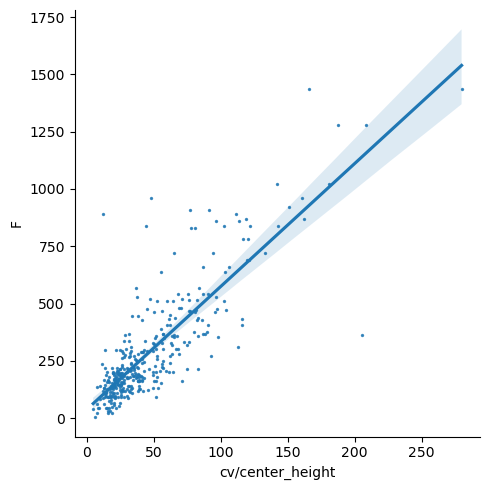

In [21]:
# inter action check
col1 = "cv"
col2 = "center_height"
new_col = f"{col1}/{col2}"
features_df_clean_w_f[new_col] = features_df_clean_w_f[col1]/features_df_clean_w_f[col2]
features_df_clean_w_f[new_col].replace(0, np.mean(features_df_clean_w_f[new_col]), inplace = True)
sns.lmplot(data = features_df_clean_w_f,x = new_col,y="F", scatter_kws={'s':2}, order = 1)
plt.show()
features_df_clean_w_f.drop(new_col, axis =1, inplace = True)

In [22]:
# coludy_rows = ["R8", "R9"]
# features_df_clean_w_f["cloudy"] = features_df_clean_w_f["name"].apply(lambda x:  np.any([row in x for row in coludy_rows]) )
# sns.set(font_scale=1)
# for col in numer_cols:
#     ax = sns.lmplot(data = features_df_clean_w_f,x = col,y="F",hue= "cloudy", scatter_kws={'s':2}, order = 1)
#     sns.regplot(data = features_df_clean_w_f,x = col,y="F", scatter_kws={'s':2}, order = 1,ci=0, ax=ax.axes[0,0],
#                x_ci = 0, color = "black", line_kws={"ls":"--"},scatter=False)
#     plt.show()

In [23]:
plot_fruit_var = get_plot_fruit_variety_df(cfg)
features_df_w_f = pd.merge(features_df_w_f, plot_fruit_var.drop_duplicates(), how="left", on="block_name")

/home/fruitspec-lab/FruitSpec/Code/fsCounter/MHS/F_model_training.py:572: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  plot_fruit_var = plot_fruit_var.append({'plot_code': 'SUMGLD', 'fruit_type': 'Orange',


### F~ column| fruit_type

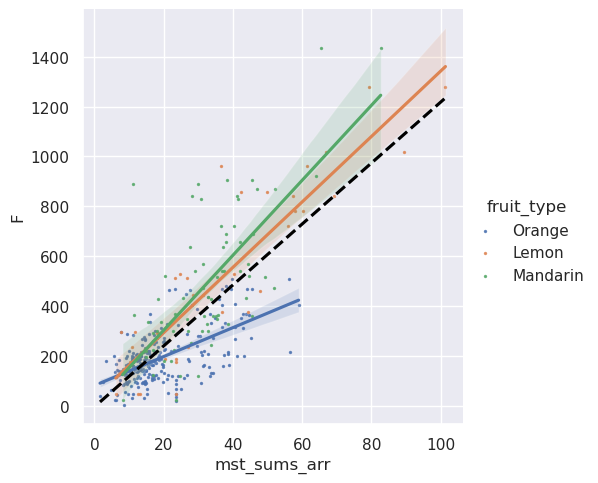

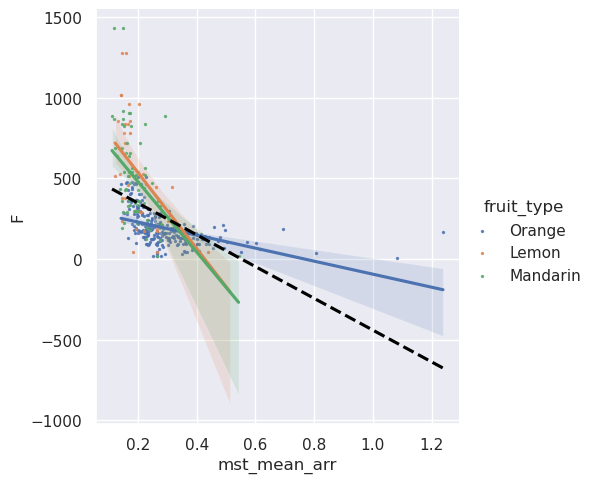

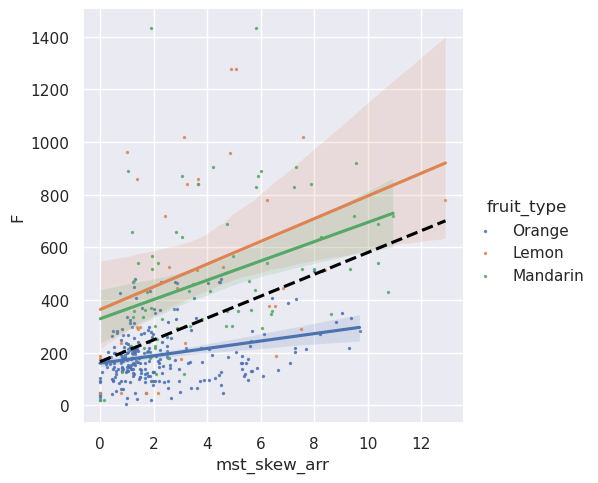

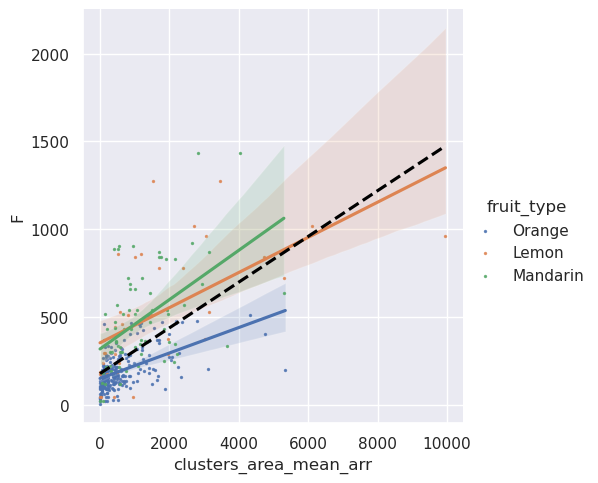

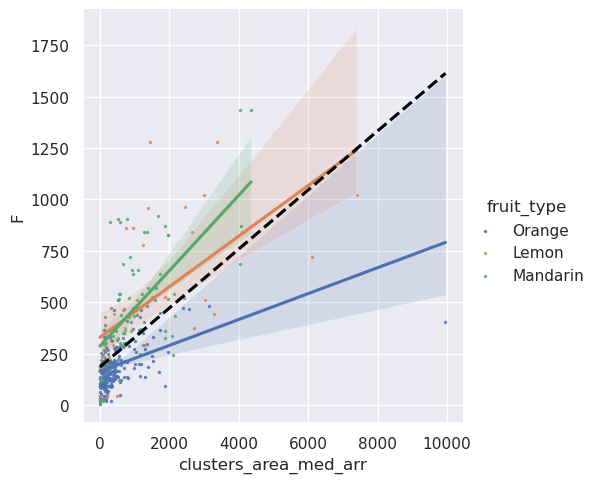

...

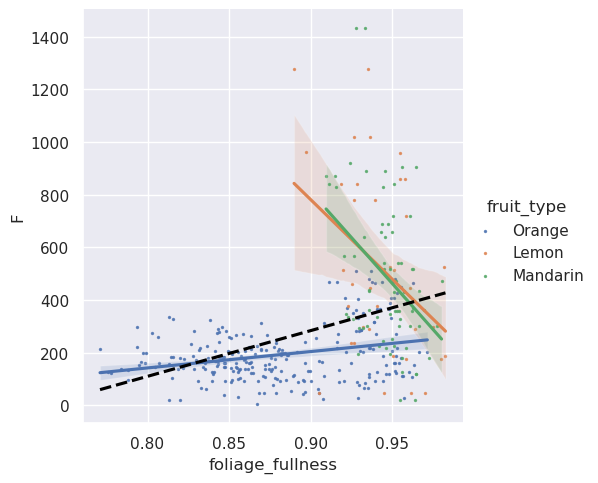

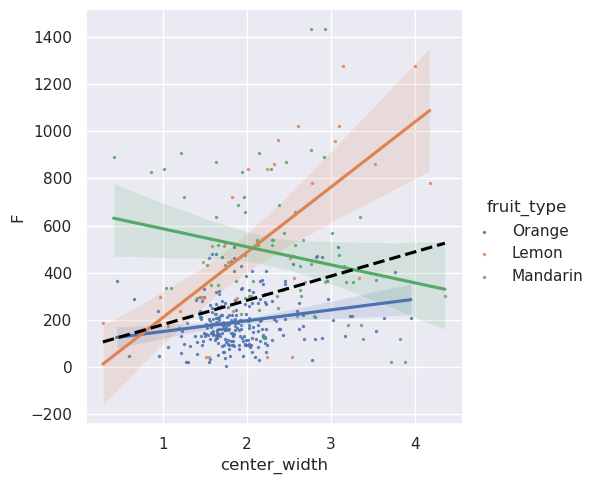

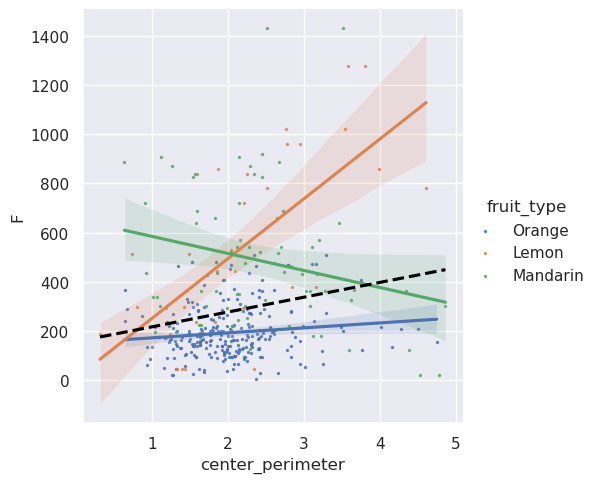

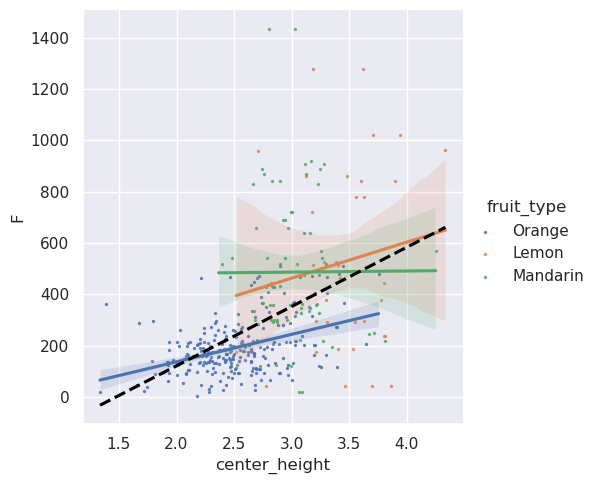

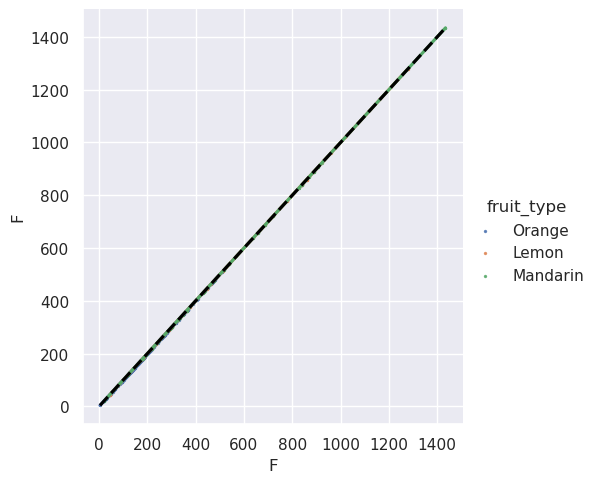

In [24]:
for col in ["mst_sums_arr", "mst_mean_arr"]:
    features_df_w_f[col].replace(0, features_df_w_f[col][features_df_w_f[col]>0].mean(), inplace = True)

sns.set(font_scale=1)
for col in numer_cols:
    if col not in features_df_w_f.columns:
        continue
    ax = sns.lmplot(data = features_df_w_f,x = col,y="F",hue= "fruit_type", scatter_kws={'s':2}, order = 1)
    sns.regplot(data = features_df_w_f,x = col,y="F", scatter_kws={'s':2}, order = 1,ci=0, ax=ax.axes[0,0],
               x_ci = 0, color = "black", line_kws={"ls":"--"},scatter=False)
    plt.show()

### F~column|block

In [25]:
# features_df_clean_w_f["row"] = features_df_clean_w_f["name"].apply(lambda x: x.split("_")[0])
# sns.set(font_scale=1)
# for col in numer_cols:
#     ax = sns.lmplot(data = features_df_clean_w_f,x = col,y="F",hue= "block_name", scatter_kws={'s':2}, order = 1)
#     sns.regplot(data = features_df_clean_w_f,x = col,y="F", scatter_kws={'s':2}, order = 1,ci=0, ax=ax.axes[0,0],
#                x_ci = 0, color = "black", line_kws={"ls":"--"},scatter=False)
#     plt.show()
# features_df_clean_w_f.drop(["row"],axis =1, inplace = True)

### CV interaction

In [26]:
# sns.set(font_scale=1)
# for col in numer_cols:
#     tmp_col = f"cv/{col}"
#     features_df_w_f[tmp_col] = features_df_w_f["cv"]/features_df_w_f[col]
#     ax=sns.lmplot(data = features_df_w_f,x = tmp_col,y="F", scatter_kws={'s':2},hue= "fruit_type")
#     sns.regplot(data = features_df_w_f,x = tmp_col,y="F", scatter_kws={'s':2}, order = 1, ax=ax.axes[0,0],
#                x_ci = 0, color = "black", line_kws={"ls":"--"},scatter=False)
#     plt.show()
#     features_df_w_f.drop(tmp_col, axis = 1,inplace = True)

### % hidden~column

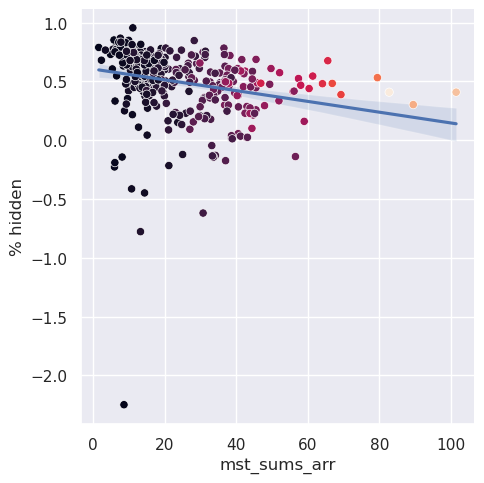

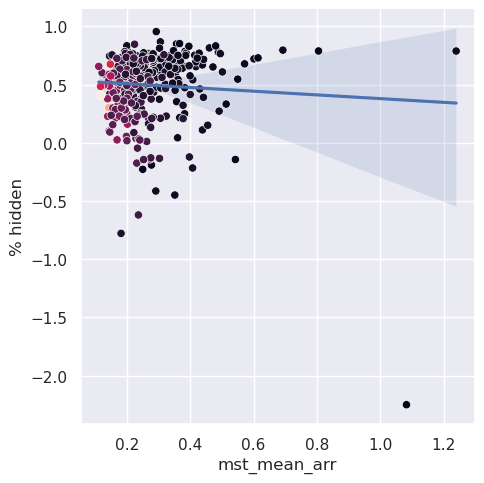

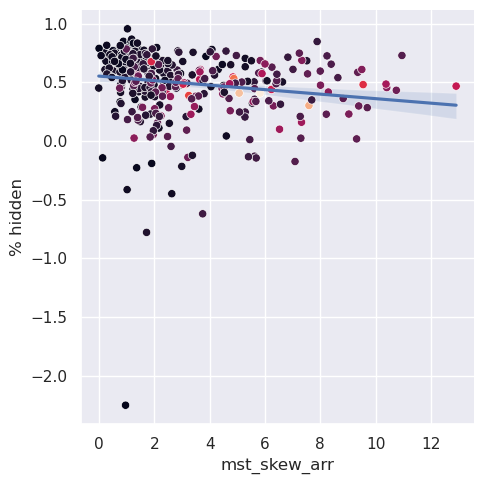

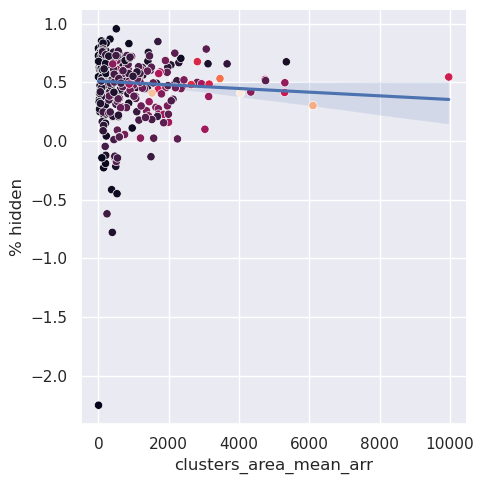

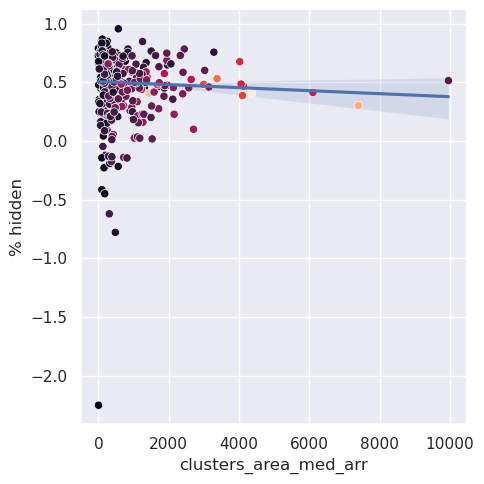

...

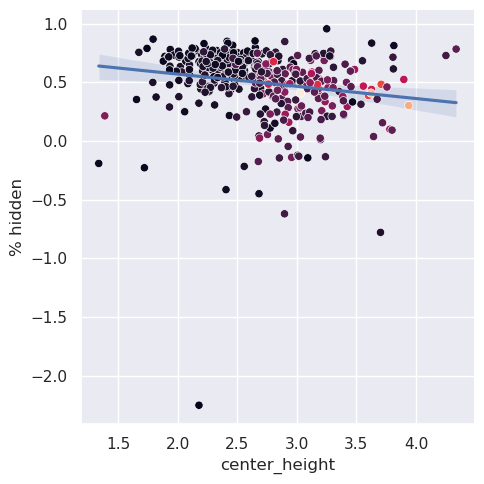

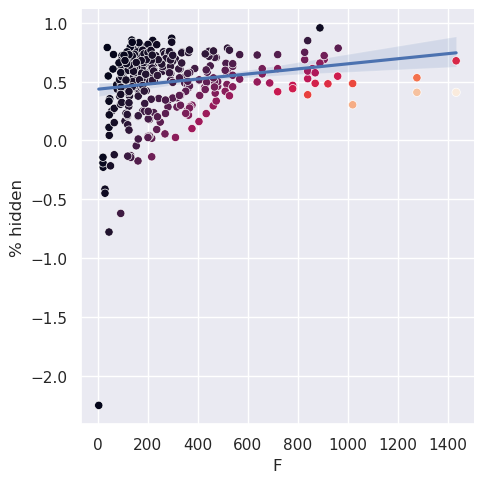

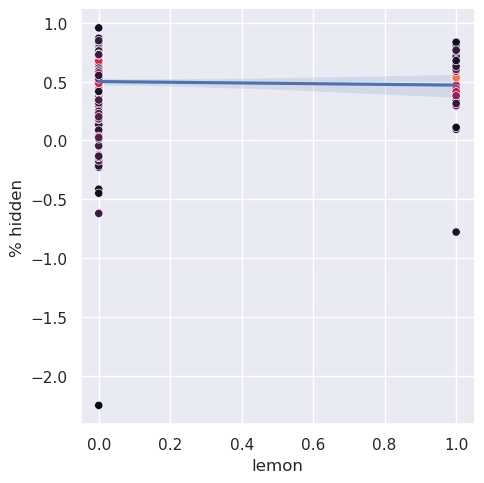

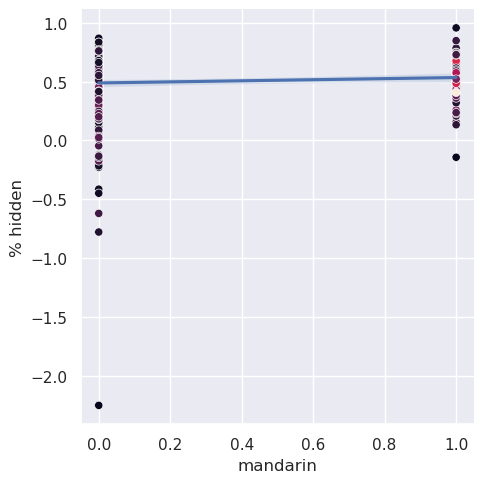

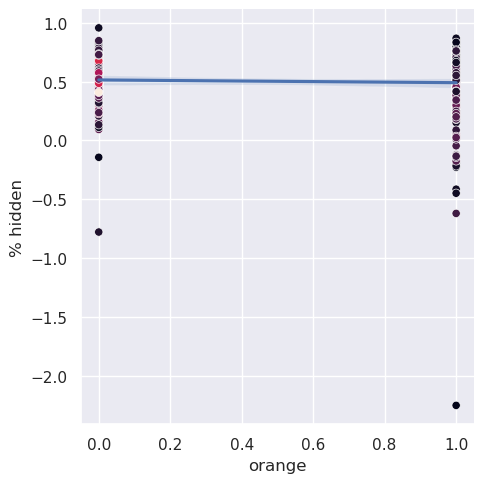

In [27]:
sns.set(font_scale=1)
features_df_clean_w_f["% hidden"]  = (features_df_clean_w_f["F"] - features_df_clean_w_f["cv"])/features_df_clean_w_f["F"]
for col in numer_cols:
    ax = sns.lmplot(data = features_df_clean_w_f,x = col,y="% hidden", scatter_kws={'s':2})
    sns.scatterplot(data = features_df_clean_w_f,x = col,y="% hidden",
                    c=features_df_clean_w_f["cv"][np.isfinite(features_df_clean_w_f[col])], ax=ax.axes[0,0])
    plt.show()
features_df_clean_w_f.drop("% hidden",axis = 1,inplace = True)

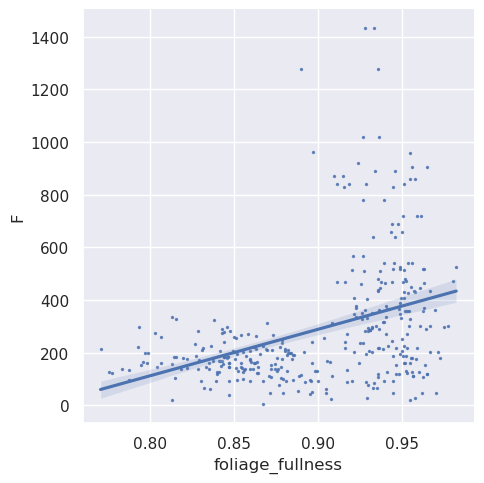

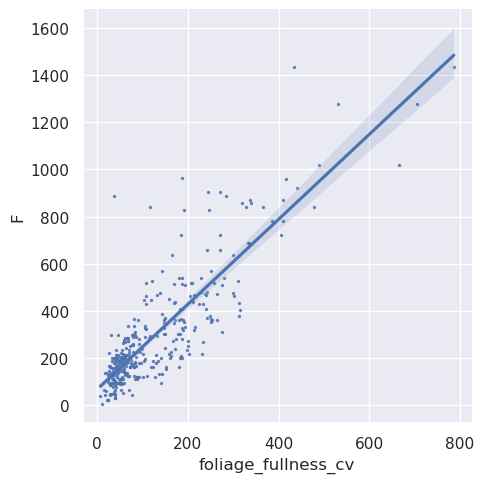

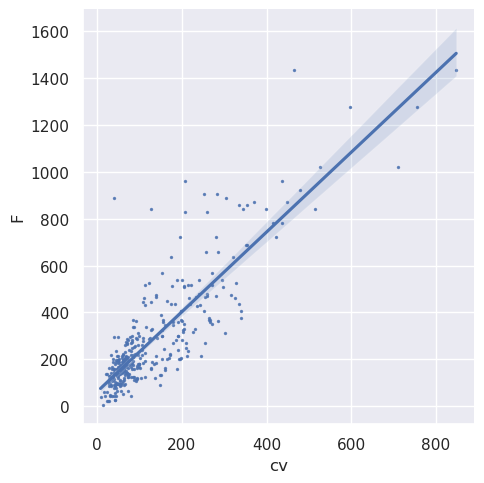

In [28]:
col = "foliage_fullness"
clean_df_temp = features_df_clean_w_f.copy(True)
clean_df_temp = clean_df_temp[clean_df_temp[col]<4000]
clean_df_temp[f"{col}_cv"] = clean_df_temp["cv"]*clean_df_temp[col]
sns.lmplot(data = clean_df_temp,x = col,y="F", scatter_kws={'s':2})
plt.show()
sns.lmplot(data = clean_df_temp,x = f"{col}_cv",y="F", scatter_kws={'s':2})
sns.lmplot(data = clean_df_temp,x = f"cv",y="F", scatter_kws={'s':2})
plt.show()

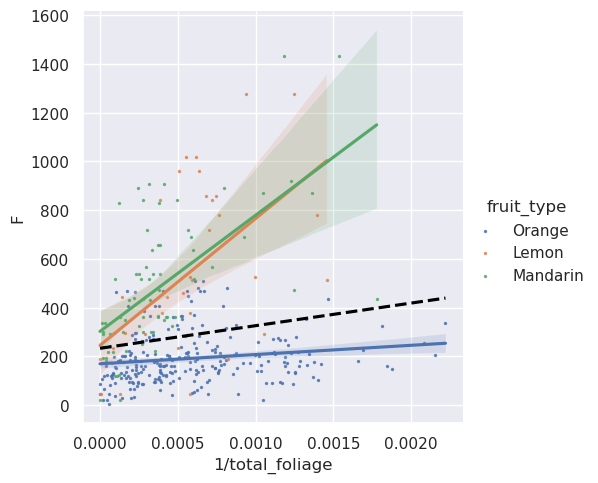

In [29]:
sns.set(font_scale=1)
col2 = "total_foliage"
col1 = "total_orange"
new_col_name = f"1/{col2}"
clean_df_temp = features_df_w_f.copy(True)
clean_df_temp[new_col_name] = clean_df_temp[col1]/clean_df_temp[col2]
ax = sns.lmplot(data = clean_df_temp,x = new_col_name,y="F",hue= "fruit_type", scatter_kws={'s':2}, order = 1)
sns.regplot(data = clean_df_temp,x = new_col_name,y="F", scatter_kws={'s':2}, order = 1,ci=0, ax=ax.axes[0,0],
           x_ci = 0, color = "black", line_kws={"ls":"--"},scatter=False)
plt.show()

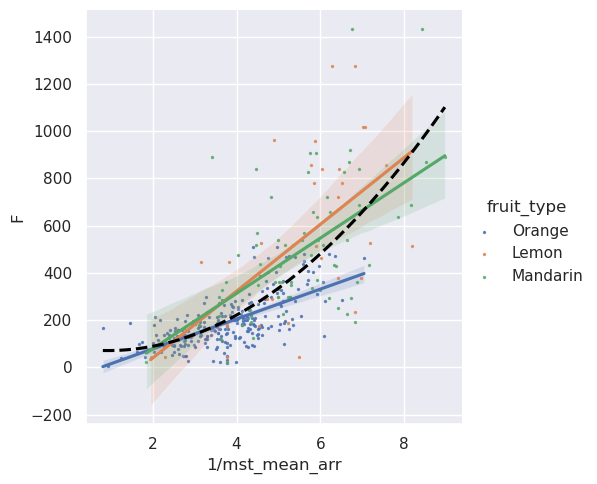

In [30]:
sns.set(font_scale=1)
col1 = "mst_mean_arr"
new_col_name = f"1/{col1}"
clean_df_temp = features_df_w_f.copy(True)
clean_df_temp[new_col_name] = 1/clean_df_temp[col1]
ax = sns.lmplot(data = clean_df_temp,x = new_col_name,y="F",hue= "fruit_type", scatter_kws={'s':2}, order = 1)
sns.regplot(data = clean_df_temp,x = new_col_name,y="F", scatter_kws={'s':1}, order = 2,ci=0, ax=ax.axes[0,0],
           x_ci = 0, color = "black", line_kws={"ls":"--"},scatter=False)
plt.show()

/tmp/ipykernel_22547/2256493854.py:3: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  corr_frame = features_df_clean_w_f[for_corr_plot].corr()


<AxesSubplot: >

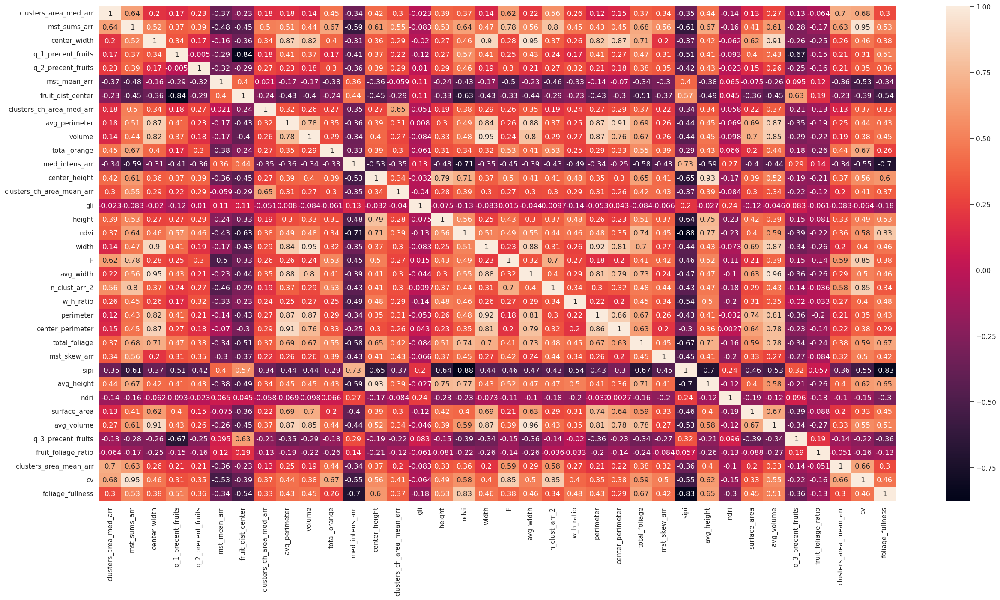

In [31]:
for_corr_plot = set([col for col in numer_cols if not col.endswith("skew")]) - {"apple",
                                                                                "mandarin","lemon","orange"}
corr_frame = features_df_clean_w_f[for_corr_plot].corr()
plt.figure(figsize=(30,15))
sns.heatmap(corr_frame, 
        xticklabels=corr_frame.columns,
        yticklabels=corr_frame.columns,annot = True, annot_kws={"fontsize": 12})


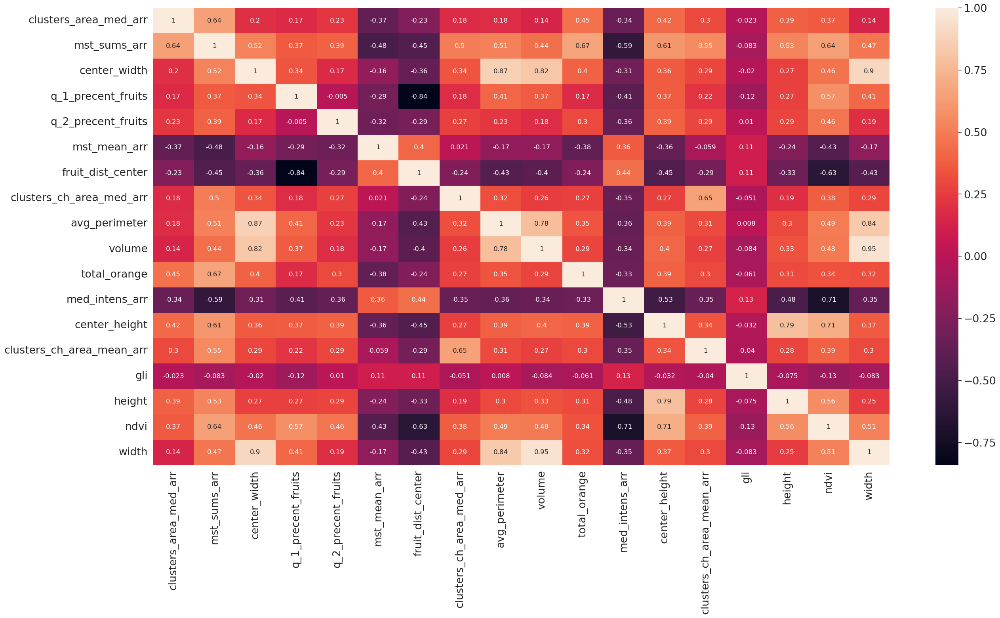

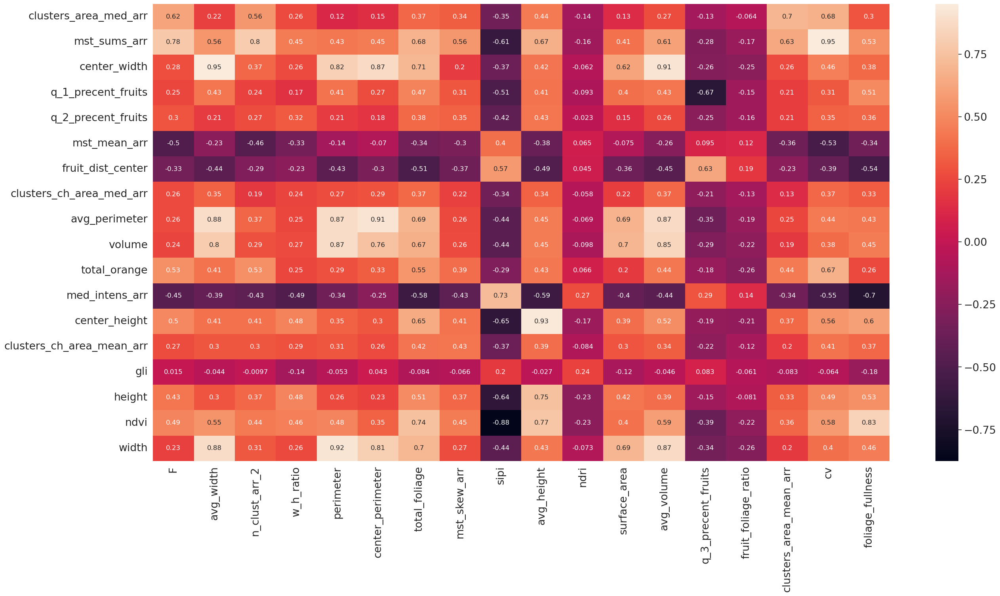

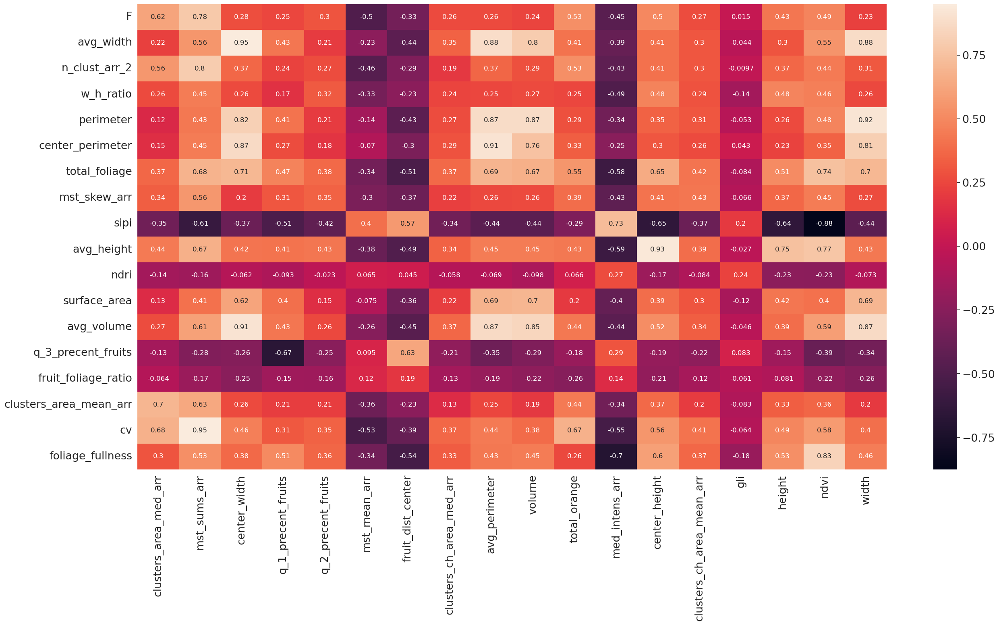

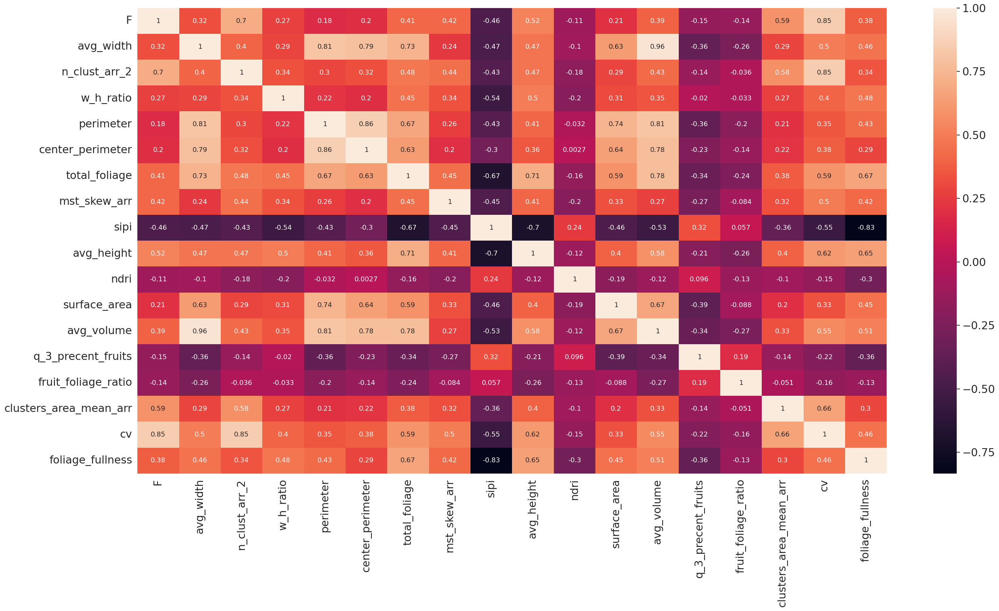

In [32]:
sns.set(font_scale=1.75)
n_cols = corr_frame.shape[0]
half_cols = int(n_cols/2)
plt.figure(figsize=(30,15))
sns.heatmap(corr_frame.iloc[:half_cols,:half_cols], 
        xticklabels=corr_frame.columns[:half_cols],
        yticklabels=corr_frame.columns[:half_cols],annot = True, annot_kws={"fontsize": 12})
plt.show()
plt.figure(figsize=(30,15))
sns.heatmap(corr_frame.iloc[:half_cols,half_cols:], 
        xticklabels=corr_frame.columns[half_cols:],
        yticklabels=corr_frame.columns[:half_cols],annot = True, annot_kws={"fontsize": 12})
plt.show()
plt.figure(figsize=(30,15))
sns.heatmap(corr_frame.iloc[half_cols:,:half_cols], 
        xticklabels=corr_frame.columns[:half_cols],
        yticklabels=corr_frame.columns[half_cols:],annot = True, annot_kws={"fontsize": 12})
plt.show()
plt.figure(figsize=(30,15))
sns.heatmap(corr_frame.iloc[half_cols:,half_cols:], 
        xticklabels=corr_frame.columns[half_cols:],
        yticklabels=corr_frame.columns[half_cols:],annot = True, annot_kws={"fontsize": 12})
plt.show()

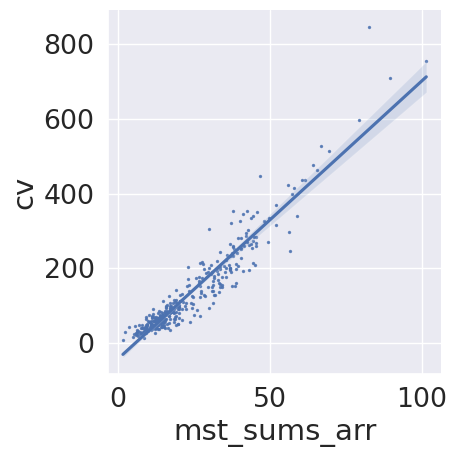

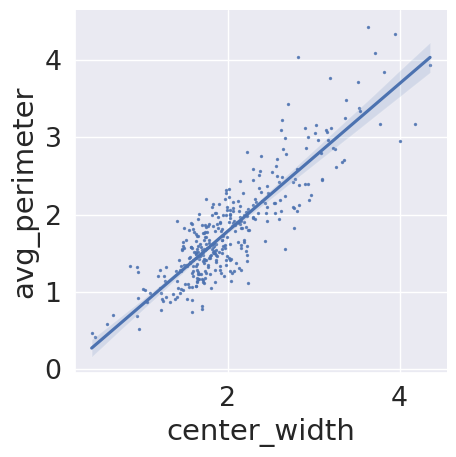

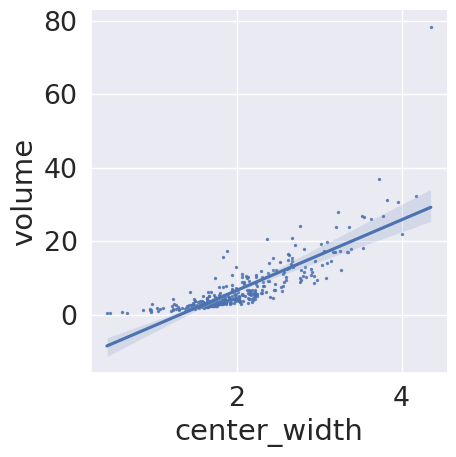

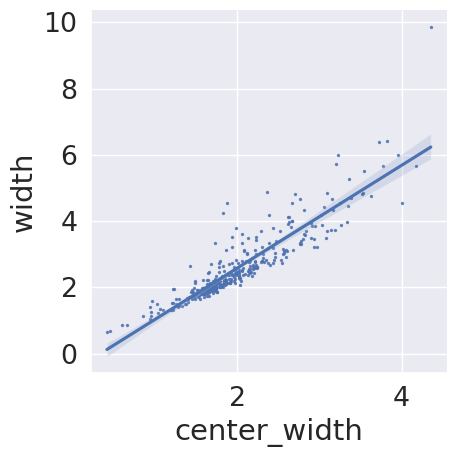

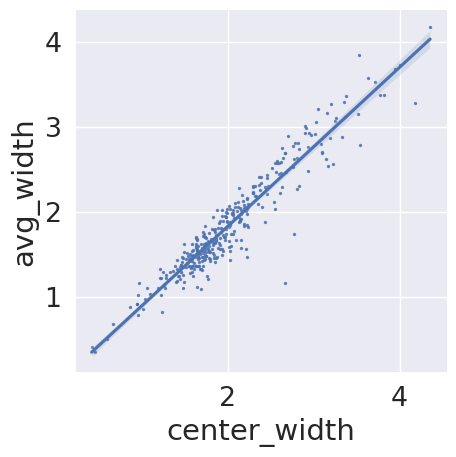

...

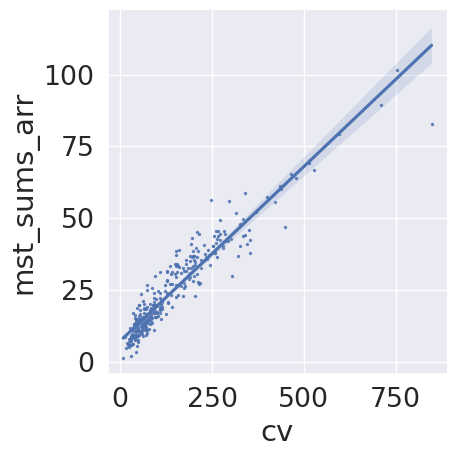

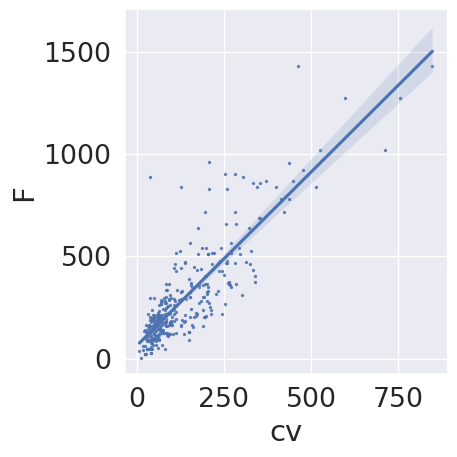

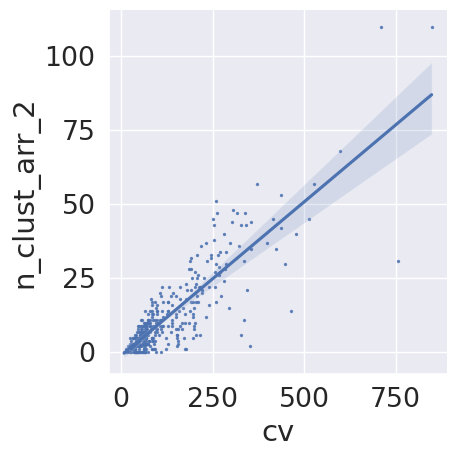

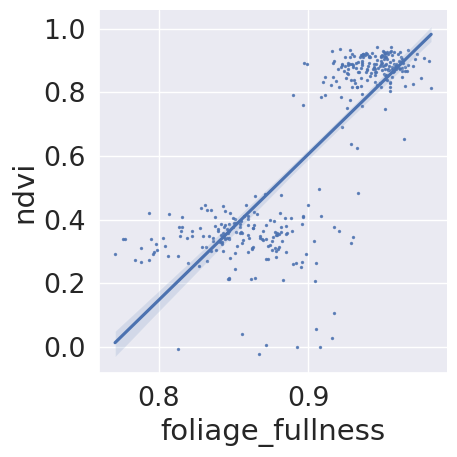

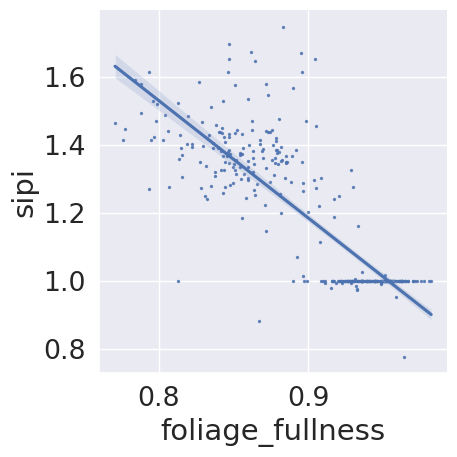

In [33]:
corr_frame_stacked = corr_frame.stack().to_frame()
bool_vec = np.all([np.abs(corr_frame_stacked[0].values) > 0.8 , np.abs(corr_frame_stacked[0].values) < 1],axis = 0)
for i, row in corr_frame_stacked[bool_vec].iterrows():
    var1, var2 = row.name
    sns.lmplot(data = features_df_clean_w_f,x = var1,y=var2, scatter_kws={'s':2})
    plt.show()

### PCA

In [34]:
n_comp = None
pca = PCA(n_comp)
X_tr_lr_sc = StandardScaler().fit_transform(X_tr_lr)
x_pcaed = pca.fit_transform(X_tr_lr_sc, y)
x_pcaed = pd.DataFrame(x_pcaed,columns = [f"PC_{i+1}" for i in range(n_comp if n_comp != None else X_tr_lr.shape[1])])

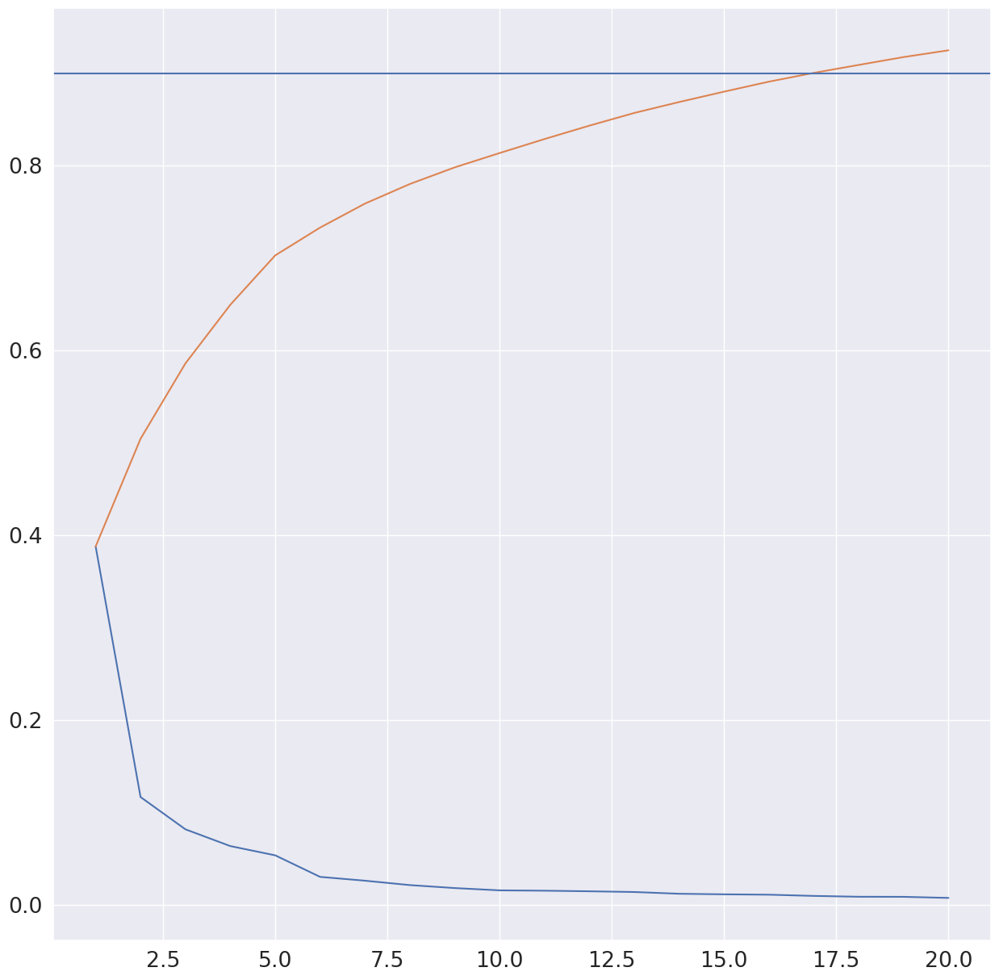

,0,1,2,3,4,5,6,7,8,9,...,56,57,58,59,60,61,62,63,64,65
mst_sums_arr,0.183844,0.063799,0.049036,0.099167,0.035172,0.033880,0.007115,0.067849,0.023017,0.028221,...,0.040296,0.030390,0.002440,0.675011,0.199144,0.033452,2.383043e-15,0.000000e+00,0.000000e+00,0.000000e+00
cv_w_h_ratio,0.181424,0.117208,0.020480,0.052386,0.075958,0.043061,0.000312,0.010089,0.000418,0.026468,...,0.040028,0.142466,0.683950,0.210794,0.537047,0.060341,6.245005e-17,1.623701e-15,3.452100e-16,9.263423e-16
cv,0.181193,0.106503,0.002835,0.079028,0.100018,0.032325,0.014168,0.018173,0.000003,0.004009,...,0.001163,0.006790,0.199108,0.091963,0.403150,0.550660,3.777003e-01,4.358189e-01,1.312811e-01,9.867597e-02
cv/foliage_fullness,0.179025,0.113331,0.006068,0.081786,0.109300,0.025141,0.011966,0.018176,0.003719,0.002034,...,0.023634,0.045780,0.222888,0.076614,0.550950,0.718120,9.020562e-17,1.755540e-15,8.777701e-16,9.332812e-16
cv_q_2_precent_fruits,0.175233,0.124989,0.038770,0.016341,0.040617,0.041105,0.026101,0.003798,0.010897,0.014549,...,0.007448,0.308974,0.312569,0.045393,0.050165,0.038795,1.717376e-16,3.122502e-17,5.381980e-16,2.363561e-16
cv/fruit_foliage_ratio,0.173647,0.108149,0.025565,0.024798,0.102599,0.007845,0.124230,0.005160,0.060390,0.075857,...,0.031561,0.016510,0.043715,0.025860,0.057835,0.003368,9.020562e-17,2.775558e-16,4.128642e-16,1.734723e-17
cv/center_height,0.170925,0.095848,0.005709,0.128725,0.133354,0.015006,0.011613,0.030609,0.034855,0.011499,...,0.061536,0.001929,0.063038,0.053206,0.095994,0.006087,2.775558e-17,4.996004e-16,9.714451e-17,1.040834e-16
mst_sums_arr^2,0.167685,0.120195,0.065123,0.051352,0.106878,0.103614,0.030108,0.098051,0.000519,0.005597,...,0.051580,0.052376,0.053972,0.543367,0.138929,0.015815,1.089406e-15,3.070461e-16,5.824334e-16,4.540639e-16
cv_q_1_precent_fruits,0.157633,0.042412,0.061633,0.190348,0.089031,0.013692,0.108381,0.085518,0.067740,0.080945,...,0.032878,0.031663,0.406695,0.057821,0.144756,0.036782,6.938894e-17,3.191891e-16,3.122502e-17,1.700029e-16
total_foliage,0.156741,0.111206,0.097214,0.052710,0.075076,0.027829,0.015785,0.071555,0.048067,0.106458,...,0.002355,0.002039,0.038841,0.018182,0.022105,0.000736,7.632783e-17,5.551115e-17,1.682682e-16,8.673617e-18


In [35]:
max_comp = 20
plt.figure(figsize=(15,15))
plt.plot(range(1,max_comp+1),pca.explained_variance_ratio_[:max_comp])
plt.plot(range(1,max_comp+1),np.cumsum(pca.explained_variance_ratio_[:max_comp]))
plt.axhline(0.9)
plt.show()
pd.DataFrame(np.abs(pca.components_.T), index = X_tr_lr.columns).sort_values(0,ascending = False)

### modeling

### cv cols

In [36]:
sc = scalers["Robust"]
cv_fruit_type_cols = [col for col in ["orange", "lemon", "mandarin", "apple"] if col in X_tr_lr.columns]
cv_cols = ["cv"] + cv_fruit_type_cols

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[cv_cols],y))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[cv_cols],y,groups = groups))

true: 11390.0,    pred: 12509.289267713159. (9.83 %) 
true: 11843.0,    pred: 12570.613374288263. (6.14 %) 
true: 12630.0,    pred: 12678.469518730915. (0.38 %) 
true: 13318.0,    pred: 13239.455796140202. (0.59 %) 
true: 13387.0,    pred: 13367.501013195877. (0.15 %) 
true: 12824.0,    pred: 12292.183753434203. (4.15 %) 
true: 12844.0,    pred: 12074.7374045295. (5.99 %) 
true: 15047.0,    pred: 14547.48020324505. (3.32 %) 
0.4708460785729706 0.15588908680246613
(0.03818249901689675, 0.03207208793252295)
true: 28498.0,    pred: 16200.162269334316. (43.15 %) (SUMGLD)
true: 11162.0,    pred: 8839.299328715617. (20.81 %) (DWDBCL46)
true: 7898.0,    pred: 6150.138955320219. (22.13 %) (DWDBMN37)
true: 2354.0,    pred: 2726.0198684741385. (15.80 %) (DWDBNB07)
true: 3996.0,    pred: 4025.1744365701124. (0.73 %) (DWDBCN51)
true: 3354.0,    pred: 4617.275390384092. (37.66 %) (DWDBMN16)
true: 1488.0,    pred: 2575.216601565675. (73.07 %) (DWDBNW39)
true: 2226.0,    pred: 3067.2117352309. (37.79

### non zed features (no vi they make it worse)

In [37]:
['cv/fruit_foliage_ratio', 'cv/foliage_fullness']
    
non_zed_cols = ["cv", "foliage_fullness", "w_h_ratio", "fruit_foliage_ratio", 'cv/foliage_fullness'] + cv_fruit_type_cols

non_zed_cols = ["foliage_fullness", "w_h_ratio", 'cv/foliage_fullness'] + cv_fruit_type_cols

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[non_zed_cols],y))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[non_zed_cols],y,groups = groups))

true: 11390.0,    pred: 12696.92691165823. (11.47 %) 
true: 11843.0,    pred: 12679.067153057924. (7.06 %) 
true: 12630.0,    pred: 12467.469733872545. (1.29 %) 
true: 13318.0,    pred: 13119.287956526457. (1.49 %) 
true: 13387.0,    pred: 13432.068761140295. (0.34 %) 
true: 12824.0,    pred: 12624.89166562188. (1.55 %) 
true: 12844.0,    pred: 11902.075525809685. (7.33 %) 
true: 15047.0,    pred: 14348.794080686648. (4.64 %) 
0.3934743335777009 0.09487241517320277
(0.04396983332016658, 0.036835647419177046)
true: 28498.0,    pred: 34836.48033115438. (22.24 %) (SUMGLD)
true: 11162.0,    pred: 8719.025432866252. (21.89 %) (DWDBCL46)
true: 7898.0,    pred: 6328.5499486777935. (19.87 %) (DWDBMN37)
true: 2354.0,    pred: 2365.2922298199446. (0.48 %) (DWDBNB07)
true: 3996.0,    pred: 3939.572026553192. (1.41 %) (DWDBCN51)
true: 3354.0,    pred: 4533.411416462532. (35.16 %) (DWDBMN16)
true: 1488.0,    pred: 2071.2616990755696. (39.20 %) (DWDBNW39)
true: 2226.0,    pred: 2673.0168073756713. (

In [38]:
X_non_scale = X_tr_lr.copy()[non_zed_cols]
sc = scalers["Robust"]
X_scaled = sc.fit_transform(X_non_scale)
X_scaled = pd.DataFrame(X_scaled,columns = X_non_scale.columns)
X_tr_lm = sm.add_constant(X_scaled)

model = sm.OLS(y.reset_index(drop=True),X_tr_lm)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      F   R-squared:                       0.786
Model:                            OLS   Adj. R-squared:                  0.783
Method:                 Least Squares   F-statistic:                     258.1
Date:                Thu, 09 Mar 2023   Prob (F-statistic):          2.26e-115
Time:                        15:01:38   Log-Likelihood:                -2188.5
No. Observations:                 358   AIC:                             4389.
Df Residuals:                     352   BIC:                             4412.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                 168.5431      8.555     19.702      0.000     151.719     185.368
foliage_fullness      -32.4673     13.723     -2.366      0.019     -59.457      -5.477
w_h_ratio             -21.4255      8.195     -2.615      0.009     -37.543      -5.308
cv/foliage_fullness   198.4128      7.791     25.467      0.000     183.090     213.736
orange               -100.1400     11.624     -8.615      0.000    -123.002     -77.278
lemon                  39.6840     14.965      2.652      0.008      10.251      69.117
mandarin               60.4560     11.870      5.093      0.000      37.112      83.800
==============================================================================
Omnibus:                      124.208   Durbin-Watson:                   1.675
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              617.924
Skew:                           1.388   Prob(JB):                    6.60e-135
Kurtosis:                       8.807   Cond. No.                     9.42e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.64e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

### all features

In [39]:
# TODO add cols
sc = scalers["Robust"]

print(cross_validate_with_mean(LinearRegression(),X_tr_lr,y))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr,y,groups = groups))

true: 11390.0,    pred: 11838.489164817569. (3.94 %) 
true: 11843.0,    pred: 13050.979760944989. (10.20 %) 
true: 12630.0,    pred: 12494.539419595783. (1.07 %) 
true: 13318.0,    pred: 13730.79209014547. (3.10 %) 
true: 13387.0,    pred: 12452.65169824037. (6.98 %) 
true: 12824.0,    pred: 13139.430914082948. (2.46 %) 
true: 12844.0,    pred: 12029.043001085767. (6.35 %) 
true: 15047.0,    pred: 14279.59289438845. (5.10 %) 
0.5920470603590378 0.558743818942365
(0.048992339587870276, 0.027229278594197576)
true: 28498.0,    pred: 22578.07993755833. (20.77 %) (SUMGLD)
true: 11162.0,    pred: 9498.747501278685. (14.90 %) (DWDBCL46)
true: 7898.0,    pred: 6265.861289458536. (20.67 %) (DWDBMN37)
true: 2354.0,    pred: 2977.788166122716. (26.50 %) (DWDBNB07)
true: 3996.0,    pred: 5963.92847735294. (49.25 %) (DWDBCN51)
true: 3354.0,    pred: 3928.58874855981. (17.13 %) (DWDBMN16)
true: 1488.0,    pred: 1656.8536719232347. (11.35 %) (DWDBNW39)
true: 2226.0,    pred: 2525.1720094024085. (13.4

### baseline

### fit linear MHS

In [40]:
mhs = model_hybrid_selector()
mhs.iterative_fitting(X_tr_lr,y,num_stuck = 3,cols = ["cv"],use_alwyas = [])

{}
inf


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:02<00:00, 30.55it/s]


added surface_area, new_score: 0.4257096169937305


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 131.28it/s]


no feature could be removed, new_score: 0.48584769163412195
score: 0.4257096169937305,cols: ['cv', 'surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 122.08it/s]


added mst_sums_arr^2, new_score: 0.4005245587097067


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 130.15it/s]


no feature could be removed, new_score: 0.42570961699373044
score: 0.4005245587097067,cols: ['cv', 'surface_area', 'mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 121.90it/s]


added gli, new_score: 0.3893090930195544


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 127.57it/s]


no feature could be removed, new_score: 0.40052455870970843
score: 0.3893090930195544,cols: ['cv', 'surface_area', 'mst_sums_arr^2', 'gli']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 123.24it/s]


added sipi_skew, new_score: 0.38630630269295374


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 130.47it/s]


no feature could be removed, new_score: 0.38930909301955274
score: 0.38630630269295374,cols: ['cv', 'surface_area', 'mst_sums_arr^2', 'gli', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 120.54it/s]


added n_clust_arr_2, new_score: 0.3784159033187773


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 126.10it/s]


no feature could be removed, new_score: 0.3863063026929458
score: 0.3784159033187773,cols: ['cv', 'surface_area', 'mst_sums_arr^2', 'gli', 'sipi_skew', 'n_clust_arr_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 122.36it/s]


added cv_w_h_ratio, new_score: 0.3756302194147948


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 108.19it/s]


no feature could be removed, new_score: 0.37841590331877
score: 0.3756302194147948,cols: ['cv', 'surface_area', 'mst_sums_arr^2', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 120.98it/s]


added cv/center_height, new_score: 0.3738307342129694


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 128.95it/s]


no feature could be removed, new_score: 0.37563021941479174
score: 0.3738307342129694,cols: ['cv', 'surface_area', 'mst_sums_arr^2', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv_w_h_ratio', 'cv/center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 121.91it/s]


added cv_q_3_precent_fruits, new_score: 0.3737062263586389


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 127.22it/s]


no feature could be removed, new_score: 0.37383073421296775
score: 0.3737062263586389,cols: ['cv', 'surface_area', 'mst_sums_arr^2', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv_w_h_ratio', 'cv/center_height', 'cv_q_3_precent_fruits']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 118.44it/s]


added cv^2, new_score: 0.3705812187650903


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 124.80it/s]


no feature could be removed, new_score: 0.37370622635863715
score: 0.3705812187650903,cols: ['cv', 'surface_area', 'mst_sums_arr^2', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv_w_h_ratio', 'cv/center_height', 'cv_q_3_precent_fruits', 'cv^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 117.85it/s]


added mandarin_cv, new_score: 0.3600154642034908


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 122.79it/s]


removed cv_w_h_ratio, new_score: 0.3580217052182661
score: 0.3580217052182661,cols: ['cv', 'surface_area', 'mst_sums_arr^2', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv/center_height', 'cv_q_3_precent_fruits', 'cv^2', 'mandarin_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 118.55it/s]


added cv_q_1_precent_fruits, new_score: 0.3555736782687231


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 118.62it/s]


removed mst_sums_arr^2, new_score: 0.3552883785248222
score: 0.3552883785248222,cols: ['cv', 'surface_area', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv/center_height', 'cv_q_3_precent_fruits', 'cv^2', 'mandarin_cv', 'cv_q_1_precent_fruits']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 118.11it/s]


added med_intens_arr, new_score: 0.3546852519800072


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 109.33it/s]


no feature could be removed, new_score: 0.3549860367690537
score: 0.3546852519800072,cols: ['cv', 'surface_area', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv/center_height', 'cv_q_3_precent_fruits', 'cv^2', 'mandarin_cv', 'cv_q_1_precent_fruits', 'med_intens_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 119.59it/s]


added ndri, new_score: 0.3546337687343414


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 113.51it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.3546337687343414,cols: ['cv', 'surface_area', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv/center_height', 'cv_q_3_precent_fruits', 'cv^2', 'mandarin_cv', 'cv_q_1_precent_fruits', 'med_intens_arr', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.30it/s]


no feature could be added, new_score: 0.35483762420724574


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 121.17it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.3546337687343414,cols: ['cv', 'surface_area', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv/center_height', 'cv_q_3_precent_fruits', 'cv^2', 'mandarin_cv', 'cv_q_1_precent_fruits', 'med_intens_arr', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 119.07it/s]


no feature could be added, new_score: 0.35483762420724574


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 120.49it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.3546337687343414,cols: ['cv', 'surface_area', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv/center_height', 'cv_q_3_precent_fruits', 'cv^2', 'mandarin_cv', 'cv_q_1_precent_fruits', 'med_intens_arr', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 117.48it/s]


no feature could be added, new_score: 0.35483762420724574


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 120.58it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.3546337687343414,cols: ['cv', 'surface_area', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv/center_height', 'cv_q_3_precent_fruits', 'cv^2', 'mandarin_cv', 'cv_q_1_precent_fruits', 'med_intens_arr', 'ndri']
final cols for iteration 1: ['cv', 'surface_area', 'gli', 'sipi_skew', 'n_clust_arr_2', 'cv/center_height', 'cv_q_3_precent_fruits', 'cv^2', 'mandarin_cv', 'cv_q_1_precent_fruits', 'med_intens_arr', 'ndri']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 121.68it/s]


added cv^2, new_score: 0.37733517944365563


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 123.83it/s]


removed cv_q_1_precent_fruits, new_score: 0.374759442083282
score: 0.374759442083282,cols: ['cv_q_3_precent_fruits', 'med_intens_arr', 'cv/center_height', 'surface_area', 'cv', 'mandarin_cv', 'ndri', 'n_clust_arr_2', 'cv^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 121.00it/s]


added sipi_skew, new_score: 0.36069407064649606


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 125.76it/s]


removed cv_q_3_precent_fruits, new_score: 0.3601860092578799
score: 0.3601860092578799,cols: ['med_intens_arr', 'cv/center_height', 'surface_area', 'cv', 'mandarin_cv', 'ndri', 'n_clust_arr_2', 'cv^2', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 121.34it/s]


added 1/mst_sums_arr^2, new_score: 0.35979117169085334


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 127.64it/s]


no feature could be removed, new_score: 0.3601860092578799
score: 0.35979117169085334,cols: ['med_intens_arr', 'cv/center_height', 'surface_area', 'cv', 'mandarin_cv', 'ndri', 'n_clust_arr_2', 'cv^2', 'sipi_skew', '1/mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 115.67it/s]


added cv/foliage_fullness, new_score: 0.3596735879383063


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 115.43it/s]


no feature could be removed, new_score: 0.3597911716904496
score: 0.3596735879383063,cols: ['med_intens_arr', 'cv/center_height', 'surface_area', 'cv', 'mandarin_cv', 'ndri', 'n_clust_arr_2', 'cv^2', 'sipi_skew', '1/mst_sums_arr^2', 'cv/foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 116.34it/s]


added mst_sums_arr^2, new_score: 0.35901034914406227


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 124.64it/s]


removed med_intens_arr, new_score: 0.3589539442082794
score: 0.3589539442082794,cols: ['cv/center_height', 'surface_area', 'cv', 'mandarin_cv', 'ndri', 'n_clust_arr_2', 'cv^2', 'sipi_skew', '1/mst_sums_arr^2', 'cv/foliage_fullness', 'mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 119.17it/s]


no feature could be added, new_score: 0.35901034914407437


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 121.46it/s]


no feature could be removed, new_score: 0.3596042900713669
score: 0.3589539442082794,cols: ['cv/center_height', 'surface_area', 'cv', 'mandarin_cv', 'ndri', 'n_clust_arr_2', 'cv^2', 'sipi_skew', '1/mst_sums_arr^2', 'cv/foliage_fullness', 'mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 118.44it/s]


no feature could be added, new_score: 0.35901034914407437


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 116.46it/s]


no feature could be removed, new_score: 0.3596042900713669
score: 0.3589539442082794,cols: ['cv/center_height', 'surface_area', 'cv', 'mandarin_cv', 'ndri', 'n_clust_arr_2', 'cv^2', 'sipi_skew', '1/mst_sums_arr^2', 'cv/foliage_fullness', 'mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 120.97it/s]


no feature could be added, new_score: 0.35901034914407437


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 108.48it/s]


no feature could be removed, new_score: 0.3596042900713669
score: 0.3589539442082794,cols: ['cv/center_height', 'surface_area', 'cv', 'mandarin_cv', 'ndri', 'n_clust_arr_2', 'cv^2', 'sipi_skew', '1/mst_sums_arr^2', 'cv/foliage_fullness', 'mst_sums_arr^2']
final cols for iteration 2: ['cv/center_height', 'surface_area', 'cv', 'mandarin_cv', 'ndri', 'n_clust_arr_2', 'cv^2', 'sipi_skew', '1/mst_sums_arr^2', 'cv/foliage_fullness', 'mst_sums_arr^2']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 121.48it/s]


added cv, new_score: 0.35607568106770293


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 123.52it/s]


no feature could be removed, new_score: 0.35634190013104033
score: 0.35607568106770293,cols: ['n_clust_arr_2', 'sipi_skew', 'surface_area', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'ndri', 'cv^2', 'mandarin_cv', 'gli', 'cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 121.20it/s]


added cv/center_height, new_score: 0.3547735209092644


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 123.03it/s]


no feature could be removed, new_score: 0.35528837852481177
score: 0.3547735209092644,cols: ['n_clust_arr_2', 'sipi_skew', 'surface_area', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'ndri', 'cv^2', 'mandarin_cv', 'gli', 'cv', 'cv/center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 117.84it/s]


added med_intens_arr, new_score: 0.35463376873444397


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 127.20it/s]


no feature could be removed, new_score: 0.3546852519800152
score: 0.35463376873444397,cols: ['n_clust_arr_2', 'sipi_skew', 'surface_area', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'ndri', 'cv^2', 'mandarin_cv', 'gli', 'cv', 'cv/center_height', 'med_intens_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 111.91it/s]


no feature could be added, new_score: 0.35483762420716236


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 115.95it/s]


no feature could be removed, new_score: 0.3546852519800152
score: 0.35463376873444397,cols: ['n_clust_arr_2', 'sipi_skew', 'surface_area', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'ndri', 'cv^2', 'mandarin_cv', 'gli', 'cv', 'cv/center_height', 'med_intens_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 120.18it/s]


no feature could be added, new_score: 0.35483762420716236


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 122.40it/s]


no feature could be removed, new_score: 0.3546852519800152
score: 0.35463376873444397,cols: ['n_clust_arr_2', 'sipi_skew', 'surface_area', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'ndri', 'cv^2', 'mandarin_cv', 'gli', 'cv', 'cv/center_height', 'med_intens_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 119.10it/s]


no feature could be added, new_score: 0.35483762420716236


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 129.08it/s]


no feature could be removed, new_score: 0.3546852519800152
score: 0.35463376873444397,cols: ['n_clust_arr_2', 'sipi_skew', 'surface_area', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'ndri', 'cv^2', 'mandarin_cv', 'gli', 'cv', 'cv/center_height', 'med_intens_arr']
final cols for iteration 3: ['n_clust_arr_2', 'sipi_skew', 'surface_area', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'ndri', 'cv^2', 'mandarin_cv', 'gli', 'cv', 'cv/center_height', 'med_intens_arr']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 117.53it/s]


added cv^2, new_score: 0.3604571309359428


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 120.62it/s]


no feature could be removed, new_score: 0.36110237878705287
score: 0.3604571309359428,cols: ['n_clust_arr_2', 'cv_q_1_precent_fruits', 'cv', 'med_intens_arr', 'mandarin_cv', 'cv/center_height', 'gli', 'sipi_skew', 'surface_area', 'cv^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 116.16it/s]


added cv_q_3_precent_fruits, new_score: 0.35468525198002443


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 114.36it/s]


no feature could be removed, new_score: 0.35498603676904994
score: 0.35468525198002443,cols: ['n_clust_arr_2', 'cv_q_1_precent_fruits', 'cv', 'med_intens_arr', 'mandarin_cv', 'cv/center_height', 'gli', 'sipi_skew', 'surface_area', 'cv^2', 'cv_q_3_precent_fruits']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 119.43it/s]


added ndri, new_score: 0.35463376873440355


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 118.27it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.35463376873440355,cols: ['n_clust_arr_2', 'cv_q_1_precent_fruits', 'cv', 'med_intens_arr', 'mandarin_cv', 'cv/center_height', 'gli', 'sipi_skew', 'surface_area', 'cv^2', 'cv_q_3_precent_fruits', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 120.36it/s]


no feature could be added, new_score: 0.3548376242071498


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 123.44it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.35463376873440355,cols: ['n_clust_arr_2', 'cv_q_1_precent_fruits', 'cv', 'med_intens_arr', 'mandarin_cv', 'cv/center_height', 'gli', 'sipi_skew', 'surface_area', 'cv^2', 'cv_q_3_precent_fruits', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 115.02it/s]


no feature could be added, new_score: 0.3548376242071498


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 109.26it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.35463376873440355,cols: ['n_clust_arr_2', 'cv_q_1_precent_fruits', 'cv', 'med_intens_arr', 'mandarin_cv', 'cv/center_height', 'gli', 'sipi_skew', 'surface_area', 'cv^2', 'cv_q_3_precent_fruits', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.45it/s]


no feature could be added, new_score: 0.3548376242071498


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 111.21it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.35463376873440355,cols: ['n_clust_arr_2', 'cv_q_1_precent_fruits', 'cv', 'med_intens_arr', 'mandarin_cv', 'cv/center_height', 'gli', 'sipi_skew', 'surface_area', 'cv^2', 'cv_q_3_precent_fruits', 'ndri']
final cols for iteration 4: ['n_clust_arr_2', 'cv_q_1_precent_fruits', 'cv', 'med_intens_arr', 'mandarin_cv', 'cv/center_height', 'gli', 'sipi_skew', 'surface_area', 'cv^2', 'cv_q_3_precent_fruits', 'ndri']
inf


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 77.60it/s]


added surface_area, new_score: 0.3674512245552324


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 109.00it/s]


removed cv/center_height, new_score: 0.3669104896037781
score: 0.3669104896037781,cols: ['n_clust_arr_2', 'cv^2', 'cv', 'gli', 'med_intens_arr', 'ndri', 'mandarin_cv', 'cv_q_1_precent_fruits', 'surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 111.63it/s]


added sipi_skew, new_score: 0.36210149985833173


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 113.72it/s]


no feature could be removed, new_score: 0.36223411292624214
score: 0.36210149985833173,cols: ['n_clust_arr_2', 'cv^2', 'cv', 'gli', 'med_intens_arr', 'ndri', 'mandarin_cv', 'cv_q_1_precent_fruits', 'surface_area', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 115.50it/s]


added cv_q_3_precent_fruits, new_score: 0.3547811519794956


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 113.10it/s]


no feature could be removed, new_score: 0.35498603676904994
score: 0.3547811519794956,cols: ['n_clust_arr_2', 'cv^2', 'cv', 'gli', 'med_intens_arr', 'ndri', 'mandarin_cv', 'cv_q_1_precent_fruits', 'surface_area', 'sipi_skew', 'cv_q_3_precent_fruits']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 111.55it/s]


added cv/center_height, new_score: 0.3546337687344093


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 113.89it/s]


no feature could be removed, new_score: 0.35468525198001166
score: 0.3546337687344093,cols: ['n_clust_arr_2', 'cv^2', 'cv', 'gli', 'med_intens_arr', 'ndri', 'mandarin_cv', 'cv_q_1_precent_fruits', 'surface_area', 'sipi_skew', 'cv_q_3_precent_fruits', 'cv/center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.18it/s]


no feature could be added, new_score: 0.35483762420715925


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 107.69it/s]


no feature could be removed, new_score: 0.35468525198001166
score: 0.3546337687344093,cols: ['n_clust_arr_2', 'cv^2', 'cv', 'gli', 'med_intens_arr', 'ndri', 'mandarin_cv', 'cv_q_1_precent_fruits', 'surface_area', 'sipi_skew', 'cv_q_3_precent_fruits', 'cv/center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 113.25it/s]


no feature could be added, new_score: 0.35483762420715925


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 112.44it/s]


no feature could be removed, new_score: 0.35468525198001166
score: 0.3546337687344093,cols: ['n_clust_arr_2', 'cv^2', 'cv', 'gli', 'med_intens_arr', 'ndri', 'mandarin_cv', 'cv_q_1_precent_fruits', 'surface_area', 'sipi_skew', 'cv_q_3_precent_fruits', 'cv/center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.82it/s]


no feature could be added, new_score: 0.35483762420715925


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 112.50it/s]


no feature could be removed, new_score: 0.35468525198001166
score: 0.3546337687344093,cols: ['n_clust_arr_2', 'cv^2', 'cv', 'gli', 'med_intens_arr', 'ndri', 'mandarin_cv', 'cv_q_1_precent_fruits', 'surface_area', 'sipi_skew', 'cv_q_3_precent_fruits', 'cv/center_height']
final cols for iteration 5: ['n_clust_arr_2', 'cv^2', 'cv', 'gli', 'med_intens_arr', 'ndri', 'mandarin_cv', 'cv_q_1_precent_fruits', 'surface_area', 'sipi_skew', 'cv_q_3_precent_fruits', 'cv/center_height']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 113.25it/s]


added sipi_skew, new_score: 0.35910463966623923


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 111.55it/s]


no feature could be removed, new_score: 0.3615679944954808
score: 0.35910463966623923,cols: ['mandarin_cv', 'cv_q_1_precent_fruits', 'gli', 'cv^2', 'cv_q_3_precent_fruits', 'cv', 'cv/center_height', 'surface_area', 'ndri', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 115.25it/s]


added n_clust_arr_2, new_score: 0.3547735209097279


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 114.95it/s]


no feature could be removed, new_score: 0.3552883785248109
score: 0.3547735209097279,cols: ['mandarin_cv', 'cv_q_1_precent_fruits', 'gli', 'cv^2', 'cv_q_3_precent_fruits', 'cv', 'cv/center_height', 'surface_area', 'ndri', 'sipi_skew', 'n_clust_arr_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 111.25it/s]


added med_intens_arr, new_score: 0.35463376873458646


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 110.03it/s]


no feature could be removed, new_score: 0.354685251980012
score: 0.35463376873458646,cols: ['mandarin_cv', 'cv_q_1_precent_fruits', 'gli', 'cv^2', 'cv_q_3_precent_fruits', 'cv', 'cv/center_height', 'surface_area', 'ndri', 'sipi_skew', 'n_clust_arr_2', 'med_intens_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 111.24it/s]


no feature could be added, new_score: 0.3548376242071346


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 118.53it/s]


no feature could be removed, new_score: 0.354685251980012
score: 0.35463376873458646,cols: ['mandarin_cv', 'cv_q_1_precent_fruits', 'gli', 'cv^2', 'cv_q_3_precent_fruits', 'cv', 'cv/center_height', 'surface_area', 'ndri', 'sipi_skew', 'n_clust_arr_2', 'med_intens_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.04it/s]


no feature could be added, new_score: 0.3548376242071346


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 106.16it/s]


no feature could be removed, new_score: 0.354685251980012
score: 0.35463376873458646,cols: ['mandarin_cv', 'cv_q_1_precent_fruits', 'gli', 'cv^2', 'cv_q_3_precent_fruits', 'cv', 'cv/center_height', 'surface_area', 'ndri', 'sipi_skew', 'n_clust_arr_2', 'med_intens_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.62it/s]


no feature could be added, new_score: 0.3548376242071346


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 124.77it/s]


no feature could be removed, new_score: 0.354685251980012
score: 0.35463376873458646,cols: ['mandarin_cv', 'cv_q_1_precent_fruits', 'gli', 'cv^2', 'cv_q_3_precent_fruits', 'cv', 'cv/center_height', 'surface_area', 'ndri', 'sipi_skew', 'n_clust_arr_2', 'med_intens_arr']
final cols for iteration 6: ['mandarin_cv', 'cv_q_1_precent_fruits', 'gli', 'cv^2', 'cv_q_3_precent_fruits', 'cv', 'cv/center_height', 'surface_area', 'ndri', 'sipi_skew', 'n_clust_arr_2', 'med_intens_arr']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 115.92it/s]


added orange_surface_area, new_score: 0.39961240062772674


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 116.00it/s]


removed cv/center_height, new_score: 0.3938263470450698
score: 0.3938263470450698,cols: ['cv_q_1_precent_fruits', 'cv', 'gli', 'ndri', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 114.74it/s]


added total_foliage, new_score: 0.37504726196955995


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 116.14it/s]


removed gli, new_score: 0.37085011556271186
score: 0.37085011556271186,cols: ['cv_q_1_precent_fruits', 'cv', 'ndri', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area', 'total_foliage']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 114.95it/s]


added center_height, new_score: 0.36310100530512524


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 114.06it/s]


no feature could be removed, new_score: 0.3632657174431424
score: 0.36310100530512524,cols: ['cv_q_1_precent_fruits', 'cv', 'ndri', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area', 'total_foliage', 'center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 114.81it/s]


added avg_perimeter, new_score: 0.35687561285571856


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 111.45it/s]


removed ndri, new_score: 0.35584834495749545
score: 0.35584834495749545,cols: ['cv_q_1_precent_fruits', 'cv', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area', 'total_foliage', 'center_height', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 115.36it/s]


added cv/total_foliage, new_score: 0.35120882421186017


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 121.68it/s]


no feature could be removed, new_score: 0.3516457794312501
score: 0.35120882421186017,cols: ['cv_q_1_precent_fruits', 'cv', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area', 'total_foliage', 'center_height', 'avg_perimeter', 'cv/total_foliage']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 114.79it/s]


added ndri, new_score: 0.34872334971454977


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 116.48it/s]


no feature could be removed, new_score: 0.35031027177256246
score: 0.34872334971454977,cols: ['cv_q_1_precent_fruits', 'cv', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area', 'total_foliage', 'center_height', 'avg_perimeter', 'cv/total_foliage', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.18it/s]


added clusters_ch_area_mean_arr, new_score: 0.34794676528316504


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 118.91it/s]


no feature could be removed, new_score: 0.34872334971455066
score: 0.34794676528316504,cols: ['cv_q_1_precent_fruits', 'cv', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area', 'total_foliage', 'center_height', 'avg_perimeter', 'cv/total_foliage', 'ndri', 'clusters_ch_area_mean_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 115.97it/s]


no feature could be added, new_score: 0.34815896546532


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 112.35it/s]


no feature could be removed, new_score: 0.34872334971455066
score: 0.34794676528316504,cols: ['cv_q_1_precent_fruits', 'cv', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area', 'total_foliage', 'center_height', 'avg_perimeter', 'cv/total_foliage', 'ndri', 'clusters_ch_area_mean_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 115.81it/s]


no feature could be added, new_score: 0.34815896546532


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 111.04it/s]


no feature could be removed, new_score: 0.34872334971455066
score: 0.34794676528316504,cols: ['cv_q_1_precent_fruits', 'cv', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area', 'total_foliage', 'center_height', 'avg_perimeter', 'cv/total_foliage', 'ndri', 'clusters_ch_area_mean_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 117.48it/s]


no feature could be added, new_score: 0.34815896546532


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 120.25it/s]


no feature could be removed, new_score: 0.34872334971455066
score: 0.34794676528316504,cols: ['cv_q_1_precent_fruits', 'cv', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area', 'total_foliage', 'center_height', 'avg_perimeter', 'cv/total_foliage', 'ndri', 'clusters_ch_area_mean_arr']
final cols for iteration 7: ['cv_q_1_precent_fruits', 'cv', 'sipi_skew', 'mandarin_cv', 'med_intens_arr', 'n_clust_arr_2', 'orange_surface_area', 'total_foliage', 'center_height', 'avg_perimeter', 'cv/total_foliage', 'ndri', 'clusters_ch_area_mean_arr']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 120.81it/s]


added surface_area, new_score: 0.3604571309359999


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 119.06it/s]


no feature could be removed, new_score: 0.36110237878705287
score: 0.3604571309359999,cols: ['cv', 'sipi_skew', 'cv_q_1_precent_fruits', 'med_intens_arr', 'cv/center_height', 'n_clust_arr_2', 'gli', 'cv^2', 'mandarin_cv', 'surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 110.68it/s]


added cv_q_3_precent_fruits, new_score: 0.3546852519800316


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 99.38it/s]


no feature could be removed, new_score: 0.35498603676904994
score: 0.3546852519800316,cols: ['cv', 'sipi_skew', 'cv_q_1_precent_fruits', 'med_intens_arr', 'cv/center_height', 'n_clust_arr_2', 'gli', 'cv^2', 'mandarin_cv', 'surface_area', 'cv_q_3_precent_fruits']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 114.81it/s]


added ndri, new_score: 0.3546337687344364


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 112.86it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.3546337687344364,cols: ['cv', 'sipi_skew', 'cv_q_1_precent_fruits', 'med_intens_arr', 'cv/center_height', 'n_clust_arr_2', 'gli', 'cv^2', 'mandarin_cv', 'surface_area', 'cv_q_3_precent_fruits', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 113.94it/s]


no feature could be added, new_score: 0.354837624207185


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 114.56it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.3546337687344364,cols: ['cv', 'sipi_skew', 'cv_q_1_precent_fruits', 'med_intens_arr', 'cv/center_height', 'n_clust_arr_2', 'gli', 'cv^2', 'mandarin_cv', 'surface_area', 'cv_q_3_precent_fruits', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.61it/s]


no feature could be added, new_score: 0.354837624207185


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 111.31it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.3546337687344364,cols: ['cv', 'sipi_skew', 'cv_q_1_precent_fruits', 'med_intens_arr', 'cv/center_height', 'n_clust_arr_2', 'gli', 'cv^2', 'mandarin_cv', 'surface_area', 'cv_q_3_precent_fruits', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 117.99it/s]


no feature could be added, new_score: 0.354837624207185


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 118.38it/s]


no feature could be removed, new_score: 0.35468525198001
score: 0.3546337687344364,cols: ['cv', 'sipi_skew', 'cv_q_1_precent_fruits', 'med_intens_arr', 'cv/center_height', 'n_clust_arr_2', 'gli', 'cv^2', 'mandarin_cv', 'surface_area', 'cv_q_3_precent_fruits', 'ndri']
final cols for iteration 8: ['cv', 'sipi_skew', 'cv_q_1_precent_fruits', 'med_intens_arr', 'cv/center_height', 'n_clust_arr_2', 'gli', 'cv^2', 'mandarin_cv', 'surface_area', 'cv_q_3_precent_fruits', 'ndri']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 119.11it/s]


added cv, new_score: 0.38395415076165784


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 123.44it/s]


removed avg_perimeter, new_score: 0.3815277070248858
score: 0.3815277070248858,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'ndri', 'med_intens_arr', 'sipi_skew', 'cv/total_foliage', 'n_clust_arr_2', 'total_foliage', 'center_height', 'cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 117.16it/s]


added mandarin_cv, new_score: 0.36072317460200465


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 123.51it/s]


removed med_intens_arr, new_score: 0.3559413055392615
score: 0.3559413055392615,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'ndri', 'sipi_skew', 'cv/total_foliage', 'n_clust_arr_2', 'total_foliage', 'center_height', 'cv', 'mandarin_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 118.66it/s]


added cv^2, new_score: 0.34609822202093454


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 119.17it/s]


removed ndri, new_score: 0.3460348060164743
score: 0.3460348060164743,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'n_clust_arr_2', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 117.07it/s]


added mandarin, new_score: 0.3407688482109812


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 120.90it/s]


removed n_clust_arr_2, new_score: 0.34046462437139285
score: 0.34046462437139285,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 120.65it/s]


added cv/center_width, new_score: 0.33671178219965614


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 122.14it/s]


no feature could be removed, new_score: 0.3404646243713926
score: 0.33671178219965614,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 117.47it/s]


added foliage_fullness, new_score: 0.3339920004488072


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 115.98it/s]


no feature could be removed, new_score: 0.33637996960976335
score: 0.3339920004488072,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width', 'foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 119.50it/s]


added mst_skew_arr, new_score: 0.3332901309462879


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 111.23it/s]


no feature could be removed, new_score: 0.3339920004489511
score: 0.3332901309462879,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width', 'foliage_fullness', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 115.67it/s]


added 1/mst_sums_arr^2, new_score: 0.3327103727540949


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 120.45it/s]


no feature could be removed, new_score: 0.333290130946409
score: 0.3327103727540949,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width', 'foliage_fullness', 'mst_skew_arr', '1/mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 117.20it/s]


added n_clust_arr_2, new_score: 0.3323254588235526


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 115.38it/s]


no feature could be removed, new_score: 0.33260374161083067
score: 0.3323254588235526,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width', 'foliage_fullness', 'mst_skew_arr', '1/mst_sums_arr^2', 'n_clust_arr_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 116.37it/s]


added total_orange, new_score: 0.3323034852120528


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 111.52it/s]


no feature could be removed, new_score: 0.33232545882361786
score: 0.3323034852120528,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width', 'foliage_fullness', 'mst_skew_arr', '1/mst_sums_arr^2', 'n_clust_arr_2', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.26it/s]


added avg_perimeter, new_score: 0.33192679227029426


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 119.22it/s]


removed mst_skew_arr, new_score: 0.33185500237434645
score: 0.33185500237434645,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width', 'foliage_fullness', '1/mst_sums_arr^2', 'n_clust_arr_2', 'total_orange', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.79it/s]


no feature could be added, new_score: 0.3319092476738149


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 115.43it/s]


no feature could be removed, new_score: 0.33245463713242424
score: 0.33185500237434645,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width', 'foliage_fullness', '1/mst_sums_arr^2', 'n_clust_arr_2', 'total_orange', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.20it/s]


no feature could be added, new_score: 0.3319092476738149


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 117.58it/s]


no feature could be removed, new_score: 0.33245463713242424
score: 0.33185500237434645,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width', 'foliage_fullness', '1/mst_sums_arr^2', 'n_clust_arr_2', 'total_orange', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.86it/s]


no feature could be added, new_score: 0.3319092476738149


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 111.11it/s]


no feature could be removed, new_score: 0.33245463713242424
score: 0.33185500237434645,cols: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width', 'foliage_fullness', '1/mst_sums_arr^2', 'n_clust_arr_2', 'total_orange', 'avg_perimeter']
final cols for iteration 9: ['cv_q_1_precent_fruits', 'orange_surface_area', 'sipi_skew', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv', 'mandarin_cv', 'cv^2', 'mandarin', 'cv/center_width', 'foliage_fullness', '1/mst_sums_arr^2', 'n_clust_arr_2', 'total_orange', 'avg_perimeter']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 120.61it/s]


added orange_surface_area, new_score: 0.38655858536883236


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 117.82it/s]


removed avg_perimeter, new_score: 0.3829470824747147
score: 0.3829470824747147,cols: ['sipi_skew', 'cv', 'clusters_ch_area_mean_arr', 'ndri', 'cv/total_foliage', 'med_intens_arr', 'total_foliage', 'center_height', 'cv_q_1_precent_fruits', 'orange_surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 113.11it/s]


added mandarin_cv, new_score: 0.36136117180526517


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 108.59it/s]


removed med_intens_arr, new_score: 0.35697300312680885
score: 0.35697300312680885,cols: ['sipi_skew', 'cv', 'clusters_ch_area_mean_arr', 'ndri', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv_q_1_precent_fruits', 'orange_surface_area', 'mandarin_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 121.90it/s]


added cv^2, new_score: 0.34727166567613554


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 120.10it/s]


removed clusters_ch_area_mean_arr, new_score: 0.3466786646692085
score: 0.3466786646692085,cols: ['sipi_skew', 'cv', 'ndri', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv_q_1_precent_fruits', 'orange_surface_area', 'mandarin_cv', 'cv^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 117.43it/s]


added mandarin, new_score: 0.33682108777690817


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 114.69it/s]


no feature could be removed, new_score: 0.3404646243713926
score: 0.33682108777690817,cols: ['sipi_skew', 'cv', 'ndri', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv_q_1_precent_fruits', 'orange_surface_area', 'mandarin_cv', 'cv^2', 'mandarin']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 119.41it/s]


added volume, new_score: 0.3342871966969855


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 124.45it/s]


no feature could be removed, new_score: 0.3368210877769489
score: 0.3342871966969855,cols: ['sipi_skew', 'cv', 'ndri', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv_q_1_precent_fruits', 'orange_surface_area', 'mandarin_cv', 'cv^2', 'mandarin', 'volume']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.21it/s]


added foliage_fullness, new_score: 0.3332994916492732


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 118.68it/s]


no feature could be removed, new_score: 0.3342871966970151
score: 0.3332994916492732,cols: ['sipi_skew', 'cv', 'ndri', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv_q_1_precent_fruits', 'orange_surface_area', 'mandarin_cv', 'cv^2', 'mandarin', 'volume', 'foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 117.17it/s]


no feature could be added, new_score: 0.3333430441643441


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 121.95it/s]


no feature could be removed, new_score: 0.3342871966970151
score: 0.3332994916492732,cols: ['sipi_skew', 'cv', 'ndri', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv_q_1_precent_fruits', 'orange_surface_area', 'mandarin_cv', 'cv^2', 'mandarin', 'volume', 'foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 119.62it/s]


no feature could be added, new_score: 0.3333430441643441


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 122.00it/s]


no feature could be removed, new_score: 0.3342871966970151
score: 0.3332994916492732,cols: ['sipi_skew', 'cv', 'ndri', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv_q_1_precent_fruits', 'orange_surface_area', 'mandarin_cv', 'cv^2', 'mandarin', 'volume', 'foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 119.30it/s]


no feature could be added, new_score: 0.3333430441643441


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 118.25it/s]


no feature could be removed, new_score: 0.3342871966970151
score: 0.3332994916492732,cols: ['sipi_skew', 'cv', 'ndri', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv_q_1_precent_fruits', 'orange_surface_area', 'mandarin_cv', 'cv^2', 'mandarin', 'volume', 'foliage_fullness']
final cols for iteration 10: ['sipi_skew', 'cv', 'ndri', 'cv/total_foliage', 'total_foliage', 'center_height', 'cv_q_1_precent_fruits', 'orange_surface_area', 'mandarin_cv', 'cv^2', 'mandarin', 'volume', 'foliage_fullness']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 117.50it/s]


added orange_surface_area, new_score: 0.3388972396922927


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 118.34it/s]


no feature could be removed, new_score: 0.34015498244260933
score: 0.3388972396922927,cols: ['total_foliage', 'cv', 'cv/total_foliage', 'cv/center_width', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv^2', 'foliage_fullness', 'avg_perimeter', 'n_clust_arr_2', 'mandarin', 'total_orange', 'orange_surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 117.73it/s]


added mandarin_cv, new_score: 0.3361323498938359


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 119.55it/s]


no feature could be removed, new_score: 0.33675837382333546
score: 0.3361323498938359,cols: ['total_foliage', 'cv', 'cv/total_foliage', 'cv/center_width', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv^2', 'foliage_fullness', 'avg_perimeter', 'n_clust_arr_2', 'mandarin', 'total_orange', 'orange_surface_area', 'mandarin_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 118.31it/s]


added sipi_skew, new_score: 0.33464594242249446


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 119.82it/s]


no feature could be removed, new_score: 0.33513679378754546
score: 0.33464594242249446,cols: ['total_foliage', 'cv', 'cv/total_foliage', 'cv/center_width', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv^2', 'foliage_fullness', 'avg_perimeter', 'n_clust_arr_2', 'mandarin', 'total_orange', 'orange_surface_area', 'mandarin_cv', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 110.61it/s]


added center_height, new_score: 0.3318550023744081


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 115.08it/s]


no feature could be removed, new_score: 0.33245463713242424
score: 0.3318550023744081,cols: ['total_foliage', 'cv', 'cv/total_foliage', 'cv/center_width', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv^2', 'foliage_fullness', 'avg_perimeter', 'n_clust_arr_2', 'mandarin', 'total_orange', 'orange_surface_area', 'mandarin_cv', 'sipi_skew', 'center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.07it/s]


no feature could be added, new_score: 0.33190924767391816


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 117.00it/s]


no feature could be removed, new_score: 0.33245463713242424
score: 0.3318550023744081,cols: ['total_foliage', 'cv', 'cv/total_foliage', 'cv/center_width', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv^2', 'foliage_fullness', 'avg_perimeter', 'n_clust_arr_2', 'mandarin', 'total_orange', 'orange_surface_area', 'mandarin_cv', 'sipi_skew', 'center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.19it/s]


no feature could be added, new_score: 0.33190924767391816


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 115.28it/s]


no feature could be removed, new_score: 0.33245463713242424
score: 0.3318550023744081,cols: ['total_foliage', 'cv', 'cv/total_foliage', 'cv/center_width', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv^2', 'foliage_fullness', 'avg_perimeter', 'n_clust_arr_2', 'mandarin', 'total_orange', 'orange_surface_area', 'mandarin_cv', 'sipi_skew', 'center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.43it/s]


no feature could be added, new_score: 0.33190924767391816


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 111.41it/s]


no feature could be removed, new_score: 0.33245463713242424
score: 0.3318550023744081,cols: ['total_foliage', 'cv', 'cv/total_foliage', 'cv/center_width', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv^2', 'foliage_fullness', 'avg_perimeter', 'n_clust_arr_2', 'mandarin', 'total_orange', 'orange_surface_area', 'mandarin_cv', 'sipi_skew', 'center_height']
final cols for iteration 11: ['total_foliage', 'cv', 'cv/total_foliage', 'cv/center_width', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv^2', 'foliage_fullness', 'avg_perimeter', 'n_clust_arr_2', 'mandarin', 'total_orange', 'orange_surface_area', 'mandarin_cv', 'sipi_skew', 'center_height']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.23it/s]


added cv^2, new_score: 0.34531994717107006


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 121.56it/s]


removed avg_perimeter, new_score: 0.3439692431776736
score: 0.3439692431776736,cols: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'total_orange', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.35it/s]


added mandarin, new_score: 0.33700180378259836


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 118.09it/s]


no feature could be removed, new_score: 0.33767551003777874
score: 0.33700180378259836,cols: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'total_orange', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2', 'mandarin']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 117.70it/s]


added center_height, new_score: 0.33445538919925155


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 114.52it/s]


removed total_orange, new_score: 0.3344142437218306
score: 0.3344142437218306,cols: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2', 'mandarin', 'center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 119.26it/s]


added sipi_skew, new_score: 0.33260374161079725


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 116.31it/s]


no feature could be removed, new_score: 0.33342840162281895
score: 0.33260374161079725,cols: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2', 'mandarin', 'center_height', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 116.91it/s]


added mst_skew_arr, new_score: 0.3323254588236309


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 113.05it/s]


no feature could be removed, new_score: 0.3326037416108311
score: 0.3323254588236309,cols: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2', 'mandarin', 'center_height', 'sipi_skew', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 111.77it/s]


added total_orange, new_score: 0.3323034852121319


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 111.71it/s]


no feature could be removed, new_score: 0.33232545882361786
score: 0.3323034852121319,cols: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2', 'mandarin', 'center_height', 'sipi_skew', 'mst_skew_arr', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.39it/s]


added avg_perimeter, new_score: 0.33192679226991717


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 116.00it/s]


removed mst_skew_arr, new_score: 0.33185500237434645
score: 0.33185500237434645,cols: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2', 'mandarin', 'center_height', 'sipi_skew', 'total_orange', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.95it/s]


no feature could be added, new_score: 0.3319092476737797


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 117.63it/s]


no feature could be removed, new_score: 0.33245463713242424
score: 0.33185500237434645,cols: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2', 'mandarin', 'center_height', 'sipi_skew', 'total_orange', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.02it/s]


no feature could be added, new_score: 0.3319092476737797


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 119.45it/s]


no feature could be removed, new_score: 0.33245463713242424
score: 0.33185500237434645,cols: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2', 'mandarin', 'center_height', 'sipi_skew', 'total_orange', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.82it/s]


no feature could be added, new_score: 0.3319092476737797


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 117.10it/s]


no feature could be removed, new_score: 0.33245463713242424
score: 0.33185500237434645,cols: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2', 'mandarin', 'center_height', 'sipi_skew', 'total_orange', 'avg_perimeter']
final cols for iteration 12: ['n_clust_arr_2', 'cv', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'foliage_fullness', 'mandarin_cv', 'orange_surface_area', 'cv/center_width', 'cv/total_foliage', 'total_foliage', 'cv^2', 'mandarin', 'center_height', 'sipi_skew', 'total_orange', 'avg_perimeter']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 118.27it/s]


added orange_surface_area, new_score: 0.34660180460694834


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 114.95it/s]


no feature could be removed, new_score: 0.3469355212351545
score: 0.34660180460694834,cols: ['avg_perimeter', 'total_foliage', 'cv', 'total_orange', '1/mst_sums_arr^2', 'cv^2', 'cv/total_foliage', 'mandarin', 'n_clust_arr_2', 'foliage_fullness', 'cv/center_width', 'sipi_skew', 'orange_surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 117.99it/s]


added height, new_score: 0.33621952060740484


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 116.31it/s]


removed total_orange, new_score: 0.335810760778422
score: 0.335810760778422,cols: ['avg_perimeter', 'total_foliage', 'cv', '1/mst_sums_arr^2', 'cv^2', 'cv/total_foliage', 'mandarin', 'n_clust_arr_2', 'foliage_fullness', 'cv/center_width', 'sipi_skew', 'orange_surface_area', 'height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 117.20it/s]


added mandarin_cv, new_score: 0.33292356099677156


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 107.49it/s]


no feature could be removed, new_score: 0.3339211590351775
score: 0.33292356099677156,cols: ['avg_perimeter', 'total_foliage', 'cv', '1/mst_sums_arr^2', 'cv^2', 'cv/total_foliage', 'mandarin', 'n_clust_arr_2', 'foliage_fullness', 'cv/center_width', 'sipi_skew', 'orange_surface_area', 'height', 'mandarin_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 116.07it/s]


added cv_w_h_ratio, new_score: 0.33207396493900215


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 113.96it/s]


no feature could be removed, new_score: 0.3329235609967892
score: 0.33207396493900215,cols: ['avg_perimeter', 'total_foliage', 'cv', '1/mst_sums_arr^2', 'cv^2', 'cv/total_foliage', 'mandarin', 'n_clust_arr_2', 'foliage_fullness', 'cv/center_width', 'sipi_skew', 'orange_surface_area', 'height', 'mandarin_cv', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 115.44it/s]


added mst_skew_arr, new_score: 0.33184616612985834


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 114.27it/s]


no feature could be removed, new_score: 0.3320739649387592
score: 0.33184616612985834,cols: ['avg_perimeter', 'total_foliage', 'cv', '1/mst_sums_arr^2', 'cv^2', 'cv/total_foliage', 'mandarin', 'n_clust_arr_2', 'foliage_fullness', 'cv/center_width', 'sipi_skew', 'orange_surface_area', 'height', 'mandarin_cv', 'cv_w_h_ratio', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.74it/s]


no feature could be added, new_score: 0.3325526887275121


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 118.50it/s]


no feature could be removed, new_score: 0.3320739649387592
score: 0.33184616612985834,cols: ['avg_perimeter', 'total_foliage', 'cv', '1/mst_sums_arr^2', 'cv^2', 'cv/total_foliage', 'mandarin', 'n_clust_arr_2', 'foliage_fullness', 'cv/center_width', 'sipi_skew', 'orange_surface_area', 'height', 'mandarin_cv', 'cv_w_h_ratio', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.98it/s]


no feature could be added, new_score: 0.3325526887275121


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 116.64it/s]


no feature could be removed, new_score: 0.3320739649387592
score: 0.33184616612985834,cols: ['avg_perimeter', 'total_foliage', 'cv', '1/mst_sums_arr^2', 'cv^2', 'cv/total_foliage', 'mandarin', 'n_clust_arr_2', 'foliage_fullness', 'cv/center_width', 'sipi_skew', 'orange_surface_area', 'height', 'mandarin_cv', 'cv_w_h_ratio', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.40it/s]


no feature could be added, new_score: 0.3325526887275121


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 116.14it/s]


no feature could be removed, new_score: 0.3320739649387592
score: 0.33184616612985834,cols: ['avg_perimeter', 'total_foliage', 'cv', '1/mst_sums_arr^2', 'cv^2', 'cv/total_foliage', 'mandarin', 'n_clust_arr_2', 'foliage_fullness', 'cv/center_width', 'sipi_skew', 'orange_surface_area', 'height', 'mandarin_cv', 'cv_w_h_ratio', 'mst_skew_arr']
final cols for iteration 13: ['avg_perimeter', 'total_foliage', 'cv', '1/mst_sums_arr^2', 'cv^2', 'cv/total_foliage', 'mandarin', 'n_clust_arr_2', 'foliage_fullness', 'cv/center_width', 'sipi_skew', 'orange_surface_area', 'height', 'mandarin_cv', 'cv_w_h_ratio', 'mst_skew_arr']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 111.25it/s]


added orange_surface_area, new_score: 0.34434506161762846


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 109.85it/s]


removed cv^2, new_score: 0.34293596617919364
score: 0.34293596617919364,cols: ['1/mst_sums_arr^2', 'n_clust_arr_2', 'cv/center_width', 'foliage_fullness', 'total_orange', 'cv/total_foliage', 'total_foliage', 'center_height', 'mandarin', 'cv', 'mandarin_cv', 'orange_surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.00it/s]


added q_1_precent_fruits, new_score: 0.3398723608967742


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 120.05it/s]


no feature could be removed, new_score: 0.340073777964933
score: 0.3398723608967742,cols: ['1/mst_sums_arr^2', 'n_clust_arr_2', 'cv/center_width', 'foliage_fullness', 'total_orange', 'cv/total_foliage', 'total_foliage', 'center_height', 'mandarin', 'cv', 'mandarin_cv', 'orange_surface_area', 'q_1_precent_fruits']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 115.06it/s]


added cv^2, new_score: 0.33424960705179807


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 120.36it/s]


removed total_orange, new_score: 0.33402629177712595
score: 0.33402629177712595,cols: ['1/mst_sums_arr^2', 'n_clust_arr_2', 'cv/center_width', 'foliage_fullness', 'cv/total_foliage', 'total_foliage', 'center_height', 'mandarin', 'cv', 'mandarin_cv', 'orange_surface_area', 'q_1_precent_fruits', 'cv^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 113.34it/s]


added sipi_skew, new_score: 0.3330242207508086


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 119.08it/s]


no feature could be removed, new_score: 0.33402629177712473
score: 0.3330242207508086,cols: ['1/mst_sums_arr^2', 'n_clust_arr_2', 'cv/center_width', 'foliage_fullness', 'cv/total_foliage', 'total_foliage', 'center_height', 'mandarin', 'cv', 'mandarin_cv', 'orange_surface_area', 'q_1_precent_fruits', 'cv^2', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 112.98it/s]


added avg_perimeter, new_score: 0.3320887994518489


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 120.56it/s]


no feature could be removed, new_score: 0.33302422075071964
score: 0.3320887994518489,cols: ['1/mst_sums_arr^2', 'n_clust_arr_2', 'cv/center_width', 'foliage_fullness', 'cv/total_foliage', 'total_foliage', 'center_height', 'mandarin', 'cv', 'mandarin_cv', 'orange_surface_area', 'q_1_precent_fruits', 'cv^2', 'sipi_skew', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 113.10it/s]


added total_orange, new_score: 0.3312626254172012


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 115.92it/s]


no feature could be removed, new_score: 0.33208879945181735
score: 0.3312626254172012,cols: ['1/mst_sums_arr^2', 'n_clust_arr_2', 'cv/center_width', 'foliage_fullness', 'cv/total_foliage', 'total_foliage', 'center_height', 'mandarin', 'cv', 'mandarin_cv', 'orange_surface_area', 'q_1_precent_fruits', 'cv^2', 'sipi_skew', 'avg_perimeter', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.50it/s]


no feature could be added, new_score: 0.331881252856462


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 110.93it/s]


no feature could be removed, new_score: 0.33208879945181735
score: 0.3312626254172012,cols: ['1/mst_sums_arr^2', 'n_clust_arr_2', 'cv/center_width', 'foliage_fullness', 'cv/total_foliage', 'total_foliage', 'center_height', 'mandarin', 'cv', 'mandarin_cv', 'orange_surface_area', 'q_1_precent_fruits', 'cv^2', 'sipi_skew', 'avg_perimeter', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.78it/s]


no feature could be added, new_score: 0.331881252856462


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 119.30it/s]


no feature could be removed, new_score: 0.33208879945181735
score: 0.3312626254172012,cols: ['1/mst_sums_arr^2', 'n_clust_arr_2', 'cv/center_width', 'foliage_fullness', 'cv/total_foliage', 'total_foliage', 'center_height', 'mandarin', 'cv', 'mandarin_cv', 'orange_surface_area', 'q_1_precent_fruits', 'cv^2', 'sipi_skew', 'avg_perimeter', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.62it/s]


no feature could be added, new_score: 0.331881252856462


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 106.34it/s]


no feature could be removed, new_score: 0.33208879945181735
score: 0.3312626254172012,cols: ['1/mst_sums_arr^2', 'n_clust_arr_2', 'cv/center_width', 'foliage_fullness', 'cv/total_foliage', 'total_foliage', 'center_height', 'mandarin', 'cv', 'mandarin_cv', 'orange_surface_area', 'q_1_precent_fruits', 'cv^2', 'sipi_skew', 'avg_perimeter', 'total_orange']
final cols for iteration 14: ['1/mst_sums_arr^2', 'n_clust_arr_2', 'cv/center_width', 'foliage_fullness', 'cv/total_foliage', 'total_foliage', 'center_height', 'mandarin', 'cv', 'mandarin_cv', 'orange_surface_area', 'q_1_precent_fruits', 'cv^2', 'sipi_skew', 'avg_perimeter', 'total_orange']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 117.07it/s]


added fruit_dist_center, new_score: 0.353041154294917


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 115.72it/s]


no feature could be removed, new_score: 0.353306305946142
score: 0.353041154294917,cols: ['orange_surface_area', 'sipi_skew', '1/mst_sums_arr^2', 'mandarin_cv', 'cv^2', 'foliage_fullness', 'cv/center_width', 'n_clust_arr_2', 'mst_skew_arr', 'mandarin', 'cv', 'height', 'fruit_dist_center']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 114.66it/s]


added avg_perimeter, new_score: 0.3471402640446159


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 111.00it/s]


removed mst_skew_arr, new_score: 0.3461370079315842
score: 0.3461370079315842,cols: ['orange_surface_area', 'sipi_skew', '1/mst_sums_arr^2', 'mandarin_cv', 'cv^2', 'foliage_fullness', 'cv/center_width', 'n_clust_arr_2', 'mandarin', 'cv', 'height', 'fruit_dist_center', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 114.42it/s]


added cv/total_foliage, new_score: 0.3417933428212915


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 110.94it/s]


no feature could be removed, new_score: 0.34497727979385023
score: 0.3417933428212915,cols: ['orange_surface_area', 'sipi_skew', '1/mst_sums_arr^2', 'mandarin_cv', 'cv^2', 'foliage_fullness', 'cv/center_width', 'n_clust_arr_2', 'mandarin', 'cv', 'height', 'fruit_dist_center', 'avg_perimeter', 'cv/total_foliage']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 119.00it/s]


added total_orange, new_score: 0.33959299223949524


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 112.64it/s]


no feature could be removed, new_score: 0.3417933428212333
score: 0.33959299223949524,cols: ['orange_surface_area', 'sipi_skew', '1/mst_sums_arr^2', 'mandarin_cv', 'cv^2', 'foliage_fullness', 'cv/center_width', 'n_clust_arr_2', 'mandarin', 'cv', 'height', 'fruit_dist_center', 'avg_perimeter', 'cv/total_foliage', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 113.30it/s]


added cv_w_h_ratio, new_score: 0.3391445194497712


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 109.49it/s]


no feature could be removed, new_score: 0.3395929922394195
score: 0.3391445194497712,cols: ['orange_surface_area', 'sipi_skew', '1/mst_sums_arr^2', 'mandarin_cv', 'cv^2', 'foliage_fullness', 'cv/center_width', 'n_clust_arr_2', 'mandarin', 'cv', 'height', 'fruit_dist_center', 'avg_perimeter', 'cv/total_foliage', 'total_orange', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.93it/s]


no feature could be added, new_score: 0.3393781718913248


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 121.60it/s]


no feature could be removed, new_score: 0.3395929922394195
score: 0.3391445194497712,cols: ['orange_surface_area', 'sipi_skew', '1/mst_sums_arr^2', 'mandarin_cv', 'cv^2', 'foliage_fullness', 'cv/center_width', 'n_clust_arr_2', 'mandarin', 'cv', 'height', 'fruit_dist_center', 'avg_perimeter', 'cv/total_foliage', 'total_orange', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.71it/s]


no feature could be added, new_score: 0.3393781718913248


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 120.07it/s]


no feature could be removed, new_score: 0.3395929922394195
score: 0.3391445194497712,cols: ['orange_surface_area', 'sipi_skew', '1/mst_sums_arr^2', 'mandarin_cv', 'cv^2', 'foliage_fullness', 'cv/center_width', 'n_clust_arr_2', 'mandarin', 'cv', 'height', 'fruit_dist_center', 'avg_perimeter', 'cv/total_foliage', 'total_orange', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.84it/s]


no feature could be added, new_score: 0.3393781718913248


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 107.79it/s]

no feature could be removed, new_score: 0.3395929922394195
score: 0.3391445194497712,cols: ['orange_surface_area', 'sipi_skew', '1/mst_sums_arr^2', 'mandarin_cv', 'cv^2', 'foliage_fullness', 'cv/center_width', 'n_clust_arr_2', 'mandarin', 'cv', 'height', 'fruit_dist_center', 'avg_perimeter', 'cv/total_foliage', 'total_orange', 'cv_w_h_ratio']
final cols for iteration 15: ['orange_surface_area', 'sipi_skew', '1/mst_sums_arr^2', 'mandarin_cv', 'cv^2', 'foliage_fullness', 'cv/center_width', 'n_clust_arr_2', 'mandarin', 'cv', 'height', 'fruit_dist_center', 'avg_perimeter', 'cv/total_foliage', 'total_orange', 'cv_w_h_ratio']


(0.3312626254172012, 0.09448128969933248)

In [41]:
mhs.cols

['1/mst_sums_arr^2',
 'n_clust_arr_2',
 'cv/center_width',
 'foliage_fullness',
 'cv/total_foliage',
 'total_foliage',
 'center_height',
 'mandarin',
 'cv',
 'mandarin_cv',
 'orange_surface_area',
 'q_1_precent_fruits',
 'cv^2',
 'sipi_skew',
 'avg_perimeter',
 'total_orange']

In [42]:
print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhs.cols],y,groups = groups))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhs.cols],y,groups = groups, use_log1p = True))

true: 28498.0,    pred: 31683.166054840047. (11.18 %) (SUMGLD)
true: 11162.0,    pred: 9046.221304811143. (18.96 %) (DWDBCL46)
true: 7898.0,    pred: 6460.117502267816. (18.21 %) (DWDBMN37)
true: 2354.0,    pred: 2655.103238929163. (12.79 %) (DWDBNB07)
true: 3996.0,    pred: 4505.044712451543. (12.74 %) (DWDBCN51)
true: 3354.0,    pred: 4072.101886248461. (21.41 %) (DWDBMN16)
true: 1488.0,    pred: 1214.632117906241. (18.37 %) (DWDBNW39)
true: 2226.0,    pred: 2639.3039093093053. (18.57 %) (DWDBNB05)
true: 4628.0,    pred: 5396.793110406373. (16.61 %) (DWDBMN38)
true: 1598.0,    pred: 1470.0564326864155. (8.01 %) (DWDBNB09)
true: 2495.0,    pred: 3089.690064114047. (23.84 %) (DWDBM17B)
true: 2717.0,    pred: 3175.4619332126726. (16.87 %) (DWDBLE43)
true: 1946.0,    pred: 2542.8193081784852. (30.67 %) (DWDBNW40)
true: 3732.0,    pred: 3332.3632447483205. (10.71 %) (DWDBNC47)
true: 2396.0,    pred: 2352.0406881037384. (1.83 %) (DWDBLE42)
true: 6208.0,    pred: 5972.292684405699. (3.80 %)

### MHS with PCA only

In [43]:
mhs_pca = model_hybrid_selector()
mhs_pca.iterative_fitting(x_pcaed,y,num_stuck = 3,cols = [],use_alwyas = [])

print(mhs_pca.cols)

print(cross_validate_with_mean(LinearRegression(),x_pcaed[mhs_pca.cols],y,groups = groups))

print(cross_validate_with_mean(LinearRegression(),x_pcaed[mhs_pca.cols],y,groups = groups, use_log1p = True))

{}
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 66/66 [00:00<00:00, 128.32it/s]


added PC_1, new_score: 0.6846458984163241


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 44620.26it/s]
/home/fruitspec-lab/FruitSpec/Code/fsCounter/MHS/model_hybrid_selector.py:66: RuntimeWarning: invalid value encountered in divide
  z_score = (np.array(new_results) - cur_score) / np.array(results_stds)


no feature could be removed, new_score: inf
score: 0.6846458984163241,cols: ['PC_1']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:00<00:00, 124.39it/s]


added PC_2, new_score: 0.5440988006454919


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 118.83it/s]


no feature could be removed, new_score: 0.6846458984163241
score: 0.5440988006454919,cols: ['PC_1', 'PC_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 120.78it/s]


added PC_5, new_score: 0.4885883149740605


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 130.33it/s]


no feature could be removed, new_score: 0.5440988006454919
score: 0.4885883149740605,cols: ['PC_1', 'PC_2', 'PC_5']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 121.81it/s]


added PC_3, new_score: 0.4152106397818338


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 111.32it/s]


no feature could be removed, new_score: 0.4885883149740606
score: 0.4152106397818338,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 96.15it/s]


added PC_4, new_score: 0.4058123064730341


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 110.93it/s]


no feature could be removed, new_score: 0.4152106397818339
score: 0.4058123064730341,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 118.26it/s]


added PC_37, new_score: 0.3961283231463975


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 120.45it/s]


no feature could be removed, new_score: 0.4058123064730341
score: 0.3961283231463975,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 121.23it/s]


added PC_35, new_score: 0.3869089218771645


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 116.09it/s]


no feature could be removed, new_score: 0.39612832314639745
score: 0.3869089218771645,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 117.43it/s]


added PC_21, new_score: 0.382793443970709


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 111.66it/s]


no feature could be removed, new_score: 0.38690892187716464
score: 0.382793443970709,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 114.13it/s]


added PC_25, new_score: 0.37682646397483927


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 119.49it/s]


no feature could be removed, new_score: 0.3827934439707087
score: 0.37682646397483927,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_25']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 118.69it/s]


added PC_62, new_score: 0.37632204680726766


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 119.77it/s]


no feature could be removed, new_score: 0.376826463974839
score: 0.37632204680726766,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_25', 'PC_62']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 112.15it/s]


added PC_43, new_score: 0.3732980943196472


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 114.88it/s]


no feature could be removed, new_score: 0.37632204680726833
score: 0.3732980943196472,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_25', 'PC_62', 'PC_43']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 118.61it/s]


added PC_46, new_score: 0.3731133926190663


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 113.63it/s]


no feature could be removed, new_score: 0.3732980943196474
score: 0.3731133926190663,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_25', 'PC_62', 'PC_43', 'PC_46']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 113.54it/s]


added PC_17, new_score: 0.3726551203100448


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 114.58it/s]


no feature could be removed, new_score: 0.3731133926190663
score: 0.3726551203100448,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_25', 'PC_62', 'PC_43', 'PC_46', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 115.49it/s]


added PC_51, new_score: 0.37249985240851347


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 119.10it/s]


removed PC_25, new_score: 0.37192240031394497
score: 0.37192240031394497,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_62', 'PC_43', 'PC_46', 'PC_17', 'PC_51']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 114.81it/s]


added PC_53, new_score: 0.3704129108290427


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 122.75it/s]


no feature could be removed, new_score: 0.3709876987267302
score: 0.3704129108290427,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_62', 'PC_43', 'PC_46', 'PC_17', 'PC_51', 'PC_53']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 112.13it/s]


added PC_20, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 116.28it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.36767246348543514,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_62', 'PC_43', 'PC_46', 'PC_17', 'PC_51', 'PC_53', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 111.88it/s]


no feature could be added, new_score: 0.3676724634854352


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 120.41it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.36767246348543514,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_62', 'PC_43', 'PC_46', 'PC_17', 'PC_51', 'PC_53', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 115.65it/s]


no feature could be added, new_score: 0.3676724634854352


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 117.71it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.36767246348543514,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_62', 'PC_43', 'PC_46', 'PC_17', 'PC_51', 'PC_53', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 113.98it/s]


no feature could be added, new_score: 0.3676724634854352


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 116.74it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.36767246348543514,cols: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_62', 'PC_43', 'PC_46', 'PC_17', 'PC_51', 'PC_53', 'PC_20']
final cols for iteration 1: ['PC_1', 'PC_2', 'PC_5', 'PC_3', 'PC_4', 'PC_37', 'PC_35', 'PC_21', 'PC_62', 'PC_43', 'PC_46', 'PC_17', 'PC_51', 'PC_53', 'PC_20']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.65it/s]


added PC_1, new_score: 0.4568497349616969


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 111.05it/s]


removed PC_20, new_score: 0.45623147927125496
score: 0.45623147927125496,cols: ['PC_5', 'PC_17', 'PC_46', 'PC_35', 'PC_21', 'PC_53', 'PC_2', 'PC_37', 'PC_43', 'PC_51', 'PC_62', 'PC_1']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.92it/s]


added PC_3, new_score: 0.38116748230323205


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 121.28it/s]


no feature could be removed, new_score: 0.3817897400929826
score: 0.38116748230323205,cols: ['PC_5', 'PC_17', 'PC_46', 'PC_35', 'PC_21', 'PC_53', 'PC_2', 'PC_37', 'PC_43', 'PC_51', 'PC_62', 'PC_1', 'PC_3']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 112.21it/s]


added PC_4, new_score: 0.37041291082904293


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 118.84it/s]


no feature could be removed, new_score: 0.3709876987267303
score: 0.37041291082904293,cols: ['PC_5', 'PC_17', 'PC_46', 'PC_35', 'PC_21', 'PC_53', 'PC_2', 'PC_37', 'PC_43', 'PC_51', 'PC_62', 'PC_1', 'PC_3', 'PC_4']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 115.38it/s]


added PC_20, new_score: 0.36767246348543503


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 115.47it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.36767246348543503,cols: ['PC_5', 'PC_17', 'PC_46', 'PC_35', 'PC_21', 'PC_53', 'PC_2', 'PC_37', 'PC_43', 'PC_51', 'PC_62', 'PC_1', 'PC_3', 'PC_4', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 114.07it/s]


added PC_64, new_score: 0.36767246348543475


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 116.49it/s]


no feature could be removed, new_score: 0.36767246348543503
score: 0.36767246348543475,cols: ['PC_5', 'PC_17', 'PC_46', 'PC_35', 'PC_21', 'PC_53', 'PC_2', 'PC_37', 'PC_43', 'PC_51', 'PC_62', 'PC_1', 'PC_3', 'PC_4', 'PC_20', 'PC_64']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.27it/s]


no feature could be added, new_score: 0.3676724634854348


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 116.51it/s]


no feature could be removed, new_score: 0.36767246348543503
score: 0.36767246348543475,cols: ['PC_5', 'PC_17', 'PC_46', 'PC_35', 'PC_21', 'PC_53', 'PC_2', 'PC_37', 'PC_43', 'PC_51', 'PC_62', 'PC_1', 'PC_3', 'PC_4', 'PC_20', 'PC_64']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.41it/s]


no feature could be added, new_score: 0.3676724634854348


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 111.87it/s]


no feature could be removed, new_score: 0.36767246348543503
score: 0.36767246348543475,cols: ['PC_5', 'PC_17', 'PC_46', 'PC_35', 'PC_21', 'PC_53', 'PC_2', 'PC_37', 'PC_43', 'PC_51', 'PC_62', 'PC_1', 'PC_3', 'PC_4', 'PC_20', 'PC_64']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.84it/s]


no feature could be added, new_score: 0.3676724634854348


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 112.00it/s]


no feature could be removed, new_score: 0.36767246348543503
score: 0.36767246348543475,cols: ['PC_5', 'PC_17', 'PC_46', 'PC_35', 'PC_21', 'PC_53', 'PC_2', 'PC_37', 'PC_43', 'PC_51', 'PC_62', 'PC_1', 'PC_3', 'PC_4', 'PC_20', 'PC_64']
final cols for iteration 2: ['PC_5', 'PC_17', 'PC_46', 'PC_35', 'PC_21', 'PC_53', 'PC_2', 'PC_37', 'PC_43', 'PC_51', 'PC_62', 'PC_1', 'PC_3', 'PC_4', 'PC_20', 'PC_64']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 117.24it/s]


added PC_1, new_score: 0.45984056405466767


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 114.38it/s]


removed PC_20, new_score: 0.45630936224272517
score: 0.45630936224272517,cols: ['PC_17', 'PC_2', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_62', 'PC_3', 'PC_37', 'PC_46', 'PC_43', 'PC_1']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 113.53it/s]


added PC_5, new_score: 0.37457000319937805


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 116.87it/s]


removed PC_17, new_score: 0.37455051078546475
score: 0.37455051078546475,cols: ['PC_2', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_62', 'PC_3', 'PC_37', 'PC_46', 'PC_43', 'PC_1', 'PC_5']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 114.70it/s]


added PC_51, new_score: 0.37137168255308955


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 117.56it/s]


no feature could be removed, new_score: 0.37137450231421365
score: 0.37137168255308955,cols: ['PC_2', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_62', 'PC_3', 'PC_37', 'PC_46', 'PC_43', 'PC_1', 'PC_5', 'PC_51']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 115.65it/s]


added PC_20, new_score: 0.3680686159037443


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 110.90it/s]


no feature could be removed, new_score: 0.3693303724161986
score: 0.3680686159037443,cols: ['PC_2', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_62', 'PC_3', 'PC_37', 'PC_46', 'PC_43', 'PC_1', 'PC_5', 'PC_51', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 109.92it/s]


added PC_17, new_score: 0.36767246348543436


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 117.37it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.36767246348543436,cols: ['PC_2', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_62', 'PC_3', 'PC_37', 'PC_46', 'PC_43', 'PC_1', 'PC_5', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.34it/s]


no feature could be added, new_score: 0.3676724634854346


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 115.67it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.36767246348543436,cols: ['PC_2', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_62', 'PC_3', 'PC_37', 'PC_46', 'PC_43', 'PC_1', 'PC_5', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 111.85it/s]


no feature could be added, new_score: 0.3676724634854346


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 112.56it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.36767246348543436,cols: ['PC_2', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_62', 'PC_3', 'PC_37', 'PC_46', 'PC_43', 'PC_1', 'PC_5', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 113.73it/s]


no feature could be added, new_score: 0.3676724634854346


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 111.63it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.36767246348543436,cols: ['PC_2', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_62', 'PC_3', 'PC_37', 'PC_46', 'PC_43', 'PC_1', 'PC_5', 'PC_51', 'PC_20', 'PC_17']
final cols for iteration 3: ['PC_2', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_62', 'PC_3', 'PC_37', 'PC_46', 'PC_43', 'PC_1', 'PC_5', 'PC_51', 'PC_20', 'PC_17']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 117.02it/s]


added PC_37, new_score: 0.38937926085675734


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 117.58it/s]


removed PC_20, new_score: 0.3879988251713765
score: 0.3879988251713765,cols: ['PC_64', 'PC_53', 'PC_5', 'PC_2', 'PC_21', 'PC_3', 'PC_43', 'PC_17', 'PC_46', 'PC_4', 'PC_1', 'PC_37']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 114.67it/s]


added PC_35, new_score: 0.37730079923924875


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 110.98it/s]


no feature could be removed, new_score: 0.3773007992392493
score: 0.37730079923924875,cols: ['PC_64', 'PC_53', 'PC_5', 'PC_2', 'PC_21', 'PC_3', 'PC_43', 'PC_17', 'PC_46', 'PC_4', 'PC_1', 'PC_37', 'PC_35']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 116.31it/s]


added PC_62, new_score: 0.3745700031993778


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 117.72it/s]


removed PC_17, new_score: 0.37455051078546475
score: 0.37455051078546475,cols: ['PC_64', 'PC_53', 'PC_5', 'PC_2', 'PC_21', 'PC_3', 'PC_43', 'PC_46', 'PC_4', 'PC_1', 'PC_37', 'PC_35', 'PC_62']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 115.84it/s]


added PC_51, new_score: 0.37137168255309


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 110.07it/s]


no feature could be removed, new_score: 0.3713716825530901
score: 0.37137168255309,cols: ['PC_64', 'PC_53', 'PC_5', 'PC_2', 'PC_21', 'PC_3', 'PC_43', 'PC_46', 'PC_4', 'PC_1', 'PC_37', 'PC_35', 'PC_62', 'PC_51']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 116.98it/s]


added PC_20, new_score: 0.368068615903744


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 112.75it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.368068615903744,cols: ['PC_64', 'PC_53', 'PC_5', 'PC_2', 'PC_21', 'PC_3', 'PC_43', 'PC_46', 'PC_4', 'PC_1', 'PC_37', 'PC_35', 'PC_62', 'PC_51', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 115.69it/s]


added PC_17, new_score: 0.36767246348543525


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 117.99it/s]


removed PC_64, new_score: 0.3676724634854351
score: 0.3676724634854351,cols: ['PC_53', 'PC_5', 'PC_2', 'PC_21', 'PC_3', 'PC_43', 'PC_46', 'PC_4', 'PC_1', 'PC_37', 'PC_35', 'PC_62', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.52it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 110.30it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.3676724634854351,cols: ['PC_53', 'PC_5', 'PC_2', 'PC_21', 'PC_3', 'PC_43', 'PC_46', 'PC_4', 'PC_1', 'PC_37', 'PC_35', 'PC_62', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.15it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 110.71it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.3676724634854351,cols: ['PC_53', 'PC_5', 'PC_2', 'PC_21', 'PC_3', 'PC_43', 'PC_46', 'PC_4', 'PC_1', 'PC_37', 'PC_35', 'PC_62', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 115.74it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 107.57it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.3676724634854351,cols: ['PC_53', 'PC_5', 'PC_2', 'PC_21', 'PC_3', 'PC_43', 'PC_46', 'PC_4', 'PC_1', 'PC_37', 'PC_35', 'PC_62', 'PC_51', 'PC_20', 'PC_17']
final cols for iteration 4: ['PC_53', 'PC_5', 'PC_2', 'PC_21', 'PC_3', 'PC_43', 'PC_46', 'PC_4', 'PC_1', 'PC_37', 'PC_35', 'PC_62', 'PC_51', 'PC_20', 'PC_17']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 118.03it/s]


added PC_2, new_score: 0.39424147616049526


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 117.35it/s]


removed PC_51, new_score: 0.38906916143178216
score: 0.38906916143178216,cols: ['PC_62', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_43', 'PC_17', 'PC_1', 'PC_5', 'PC_46', 'PC_3', 'PC_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 115.77it/s]


added PC_37, new_score: 0.3745700031993782


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 116.55it/s]


removed PC_17, new_score: 0.37455051078546453
score: 0.37455051078546453,cols: ['PC_62', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_43', 'PC_1', 'PC_5', 'PC_46', 'PC_3', 'PC_2', 'PC_37']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 114.91it/s]


added PC_51, new_score: 0.3713716825530897


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 114.69it/s]


no feature could be removed, new_score: 0.3713745023142139
score: 0.3713716825530897,cols: ['PC_62', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_43', 'PC_1', 'PC_5', 'PC_46', 'PC_3', 'PC_2', 'PC_37', 'PC_51']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 116.06it/s]


added PC_20, new_score: 0.3680686159037444


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 114.33it/s]


no feature could be removed, new_score: 0.3693303724161988
score: 0.3680686159037444,cols: ['PC_62', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_43', 'PC_1', 'PC_5', 'PC_46', 'PC_3', 'PC_2', 'PC_37', 'PC_51', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 117.14it/s]


added PC_17, new_score: 0.3676724634854354


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 115.64it/s]


no feature could be removed, new_score: 0.36806861590374396
score: 0.3676724634854354,cols: ['PC_62', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_43', 'PC_1', 'PC_5', 'PC_46', 'PC_3', 'PC_2', 'PC_37', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 110.66it/s]


added PC_65, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 112.12it/s]


removed PC_65, new_score: 0.36767246348543503
score: 0.36767246348543503,cols: ['PC_62', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_43', 'PC_1', 'PC_5', 'PC_46', 'PC_3', 'PC_2', 'PC_37', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.34it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 112.49it/s]


no feature could be removed, new_score: 0.36806861590374396
score: 0.36767246348543503,cols: ['PC_62', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_43', 'PC_1', 'PC_5', 'PC_46', 'PC_3', 'PC_2', 'PC_37', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 113.06it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 113.95it/s]


no feature could be removed, new_score: 0.36806861590374396
score: 0.36767246348543503,cols: ['PC_62', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_43', 'PC_1', 'PC_5', 'PC_46', 'PC_3', 'PC_2', 'PC_37', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.18it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 115.63it/s]


no feature could be removed, new_score: 0.36806861590374396
score: 0.36767246348543503,cols: ['PC_62', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_43', 'PC_1', 'PC_5', 'PC_46', 'PC_3', 'PC_2', 'PC_37', 'PC_51', 'PC_20', 'PC_17']
final cols for iteration 5: ['PC_62', 'PC_21', 'PC_4', 'PC_53', 'PC_35', 'PC_43', 'PC_1', 'PC_5', 'PC_46', 'PC_3', 'PC_2', 'PC_37', 'PC_51', 'PC_20', 'PC_17']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 114.62it/s]


added PC_3, new_score: 0.38235200852725937


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 119.00it/s]


removed PC_20, new_score: 0.38124688709048776
score: 0.38124688709048776,cols: ['PC_51', 'PC_21', 'PC_53', 'PC_46', 'PC_2', 'PC_5', 'PC_62', 'PC_17', 'PC_1', 'PC_37', 'PC_4', 'PC_3']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 114.99it/s]


added PC_35, new_score: 0.3709876987267304


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 119.76it/s]


no feature could be removed, new_score: 0.3712251931842536
score: 0.3709876987267304,cols: ['PC_51', 'PC_21', 'PC_53', 'PC_46', 'PC_2', 'PC_5', 'PC_62', 'PC_17', 'PC_1', 'PC_37', 'PC_4', 'PC_3', 'PC_35']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 111.10it/s]


added PC_43, new_score: 0.37041291082904304


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 106.07it/s]


no feature could be removed, new_score: 0.3709876987267301
score: 0.37041291082904304,cols: ['PC_51', 'PC_21', 'PC_53', 'PC_46', 'PC_2', 'PC_5', 'PC_62', 'PC_17', 'PC_1', 'PC_37', 'PC_4', 'PC_3', 'PC_35', 'PC_43']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 115.02it/s]


added PC_20, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 120.31it/s]


no feature could be removed, new_score: 0.3680686159037441
score: 0.36767246348543514,cols: ['PC_51', 'PC_21', 'PC_53', 'PC_46', 'PC_2', 'PC_5', 'PC_62', 'PC_17', 'PC_1', 'PC_37', 'PC_4', 'PC_3', 'PC_35', 'PC_43', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.09it/s]


no feature could be added, new_score: 0.3676724634854352


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 104.15it/s]


no feature could be removed, new_score: 0.3680686159037441
score: 0.36767246348543514,cols: ['PC_51', 'PC_21', 'PC_53', 'PC_46', 'PC_2', 'PC_5', 'PC_62', 'PC_17', 'PC_1', 'PC_37', 'PC_4', 'PC_3', 'PC_35', 'PC_43', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 113.74it/s]


no feature could be added, new_score: 0.3676724634854352


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 117.31it/s]


no feature could be removed, new_score: 0.3680686159037441
score: 0.36767246348543514,cols: ['PC_51', 'PC_21', 'PC_53', 'PC_46', 'PC_2', 'PC_5', 'PC_62', 'PC_17', 'PC_1', 'PC_37', 'PC_4', 'PC_3', 'PC_35', 'PC_43', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 110.58it/s]


no feature could be added, new_score: 0.3676724634854352


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 115.42it/s]


no feature could be removed, new_score: 0.3680686159037441
score: 0.36767246348543514,cols: ['PC_51', 'PC_21', 'PC_53', 'PC_46', 'PC_2', 'PC_5', 'PC_62', 'PC_17', 'PC_1', 'PC_37', 'PC_4', 'PC_3', 'PC_35', 'PC_43', 'PC_20']
final cols for iteration 6: ['PC_51', 'PC_21', 'PC_53', 'PC_46', 'PC_2', 'PC_5', 'PC_62', 'PC_17', 'PC_1', 'PC_37', 'PC_4', 'PC_3', 'PC_35', 'PC_43', 'PC_20']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 114.38it/s]


added PC_1, new_score: 0.38870187123215016


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 117.17it/s]


removed PC_20, new_score: 0.3879061302167809
score: 0.3879061302167809,cols: ['PC_17', 'PC_2', 'PC_5', 'PC_53', 'PC_21', 'PC_3', 'PC_43', 'PC_62', 'PC_35', 'PC_46', 'PC_37', 'PC_1']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.40it/s]


added PC_4, new_score: 0.374570003199378


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 116.95it/s]


removed PC_17, new_score: 0.37455051078546475
score: 0.37455051078546475,cols: ['PC_2', 'PC_5', 'PC_53', 'PC_21', 'PC_3', 'PC_43', 'PC_62', 'PC_35', 'PC_46', 'PC_37', 'PC_1', 'PC_4']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 110.46it/s]


added PC_51, new_score: 0.3713716825530895


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 109.95it/s]


no feature could be removed, new_score: 0.37137450231421365
score: 0.3713716825530895,cols: ['PC_2', 'PC_5', 'PC_53', 'PC_21', 'PC_3', 'PC_43', 'PC_62', 'PC_35', 'PC_46', 'PC_37', 'PC_1', 'PC_4', 'PC_51']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 111.23it/s]


added PC_20, new_score: 0.36806861590374396


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 109.59it/s]


no feature could be removed, new_score: 0.3693303724161986
score: 0.36806861590374396,cols: ['PC_2', 'PC_5', 'PC_53', 'PC_21', 'PC_3', 'PC_43', 'PC_62', 'PC_35', 'PC_46', 'PC_37', 'PC_1', 'PC_4', 'PC_51', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 115.30it/s]


added PC_17, new_score: 0.3676724634854347


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 118.18it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.3676724634854347,cols: ['PC_2', 'PC_5', 'PC_53', 'PC_21', 'PC_3', 'PC_43', 'PC_62', 'PC_35', 'PC_46', 'PC_37', 'PC_1', 'PC_4', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 113.63it/s]


no feature could be added, new_score: 0.3676724634854347


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 113.08it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.3676724634854347,cols: ['PC_2', 'PC_5', 'PC_53', 'PC_21', 'PC_3', 'PC_43', 'PC_62', 'PC_35', 'PC_46', 'PC_37', 'PC_1', 'PC_4', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 109.87it/s]


no feature could be added, new_score: 0.3676724634854347


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 115.16it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.3676724634854347,cols: ['PC_2', 'PC_5', 'PC_53', 'PC_21', 'PC_3', 'PC_43', 'PC_62', 'PC_35', 'PC_46', 'PC_37', 'PC_1', 'PC_4', 'PC_51', 'PC_20', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 110.94it/s]


no feature could be added, new_score: 0.3676724634854347


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 114.11it/s]


no feature could be removed, new_score: 0.3680686159037443
score: 0.3676724634854347,cols: ['PC_2', 'PC_5', 'PC_53', 'PC_21', 'PC_3', 'PC_43', 'PC_62', 'PC_35', 'PC_46', 'PC_37', 'PC_1', 'PC_4', 'PC_51', 'PC_20', 'PC_17']
final cols for iteration 7: ['PC_2', 'PC_5', 'PC_53', 'PC_21', 'PC_3', 'PC_43', 'PC_62', 'PC_35', 'PC_46', 'PC_37', 'PC_1', 'PC_4', 'PC_51', 'PC_20', 'PC_17']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 114.59it/s]


added PC_1, new_score: 0.4471855407399956


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 112.73it/s]


removed PC_37, new_score: 0.44516617266073955
score: 0.44516617266073955,cols: ['PC_46', 'PC_2', 'PC_21', 'PC_4', 'PC_20', 'PC_43', 'PC_17', 'PC_5', 'PC_53', 'PC_62', 'PC_35', 'PC_1']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.48it/s]


added PC_3, new_score: 0.3868161458830848


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 109.60it/s]


removed PC_53, new_score: 0.3855338530254787
score: 0.3855338530254787,cols: ['PC_46', 'PC_2', 'PC_21', 'PC_4', 'PC_20', 'PC_43', 'PC_17', 'PC_5', 'PC_62', 'PC_35', 'PC_1', 'PC_3']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 115.25it/s]


added PC_37, new_score: 0.37845609143366293


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 112.10it/s]


removed PC_17, new_score: 0.3783421878519877
score: 0.3783421878519877,cols: ['PC_46', 'PC_2', 'PC_21', 'PC_4', 'PC_20', 'PC_43', 'PC_5', 'PC_62', 'PC_35', 'PC_1', 'PC_3', 'PC_37']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 115.45it/s]


added PC_31, new_score: 0.370495828434405


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 119.65it/s]


no feature could be removed, new_score: 0.37062226333548215
score: 0.370495828434405,cols: ['PC_46', 'PC_2', 'PC_21', 'PC_4', 'PC_20', 'PC_43', 'PC_5', 'PC_62', 'PC_35', 'PC_1', 'PC_3', 'PC_37', 'PC_31']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 113.05it/s]


added PC_15, new_score: 0.3687904876216739


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 114.31it/s]


no feature could be removed, new_score: 0.3692414694334739
score: 0.3687904876216739,cols: ['PC_46', 'PC_2', 'PC_21', 'PC_4', 'PC_20', 'PC_43', 'PC_5', 'PC_62', 'PC_35', 'PC_1', 'PC_3', 'PC_37', 'PC_31', 'PC_15']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 113.63it/s]


added PC_30, new_score: 0.36838438105029664


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 111.45it/s]


no feature could be removed, new_score: 0.3686823789897865
score: 0.36838438105029664,cols: ['PC_46', 'PC_2', 'PC_21', 'PC_4', 'PC_20', 'PC_43', 'PC_5', 'PC_62', 'PC_35', 'PC_1', 'PC_3', 'PC_37', 'PC_31', 'PC_15', 'PC_30']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.14it/s]


no feature could be added, new_score: 0.3683843810502967


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 119.97it/s]


no feature could be removed, new_score: 0.3686823789897865
score: 0.36838438105029664,cols: ['PC_46', 'PC_2', 'PC_21', 'PC_4', 'PC_20', 'PC_43', 'PC_5', 'PC_62', 'PC_35', 'PC_1', 'PC_3', 'PC_37', 'PC_31', 'PC_15', 'PC_30']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 109.56it/s]


no feature could be added, new_score: 0.3683843810502967


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 111.09it/s]


no feature could be removed, new_score: 0.3686823789897865
score: 0.36838438105029664,cols: ['PC_46', 'PC_2', 'PC_21', 'PC_4', 'PC_20', 'PC_43', 'PC_5', 'PC_62', 'PC_35', 'PC_1', 'PC_3', 'PC_37', 'PC_31', 'PC_15', 'PC_30']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 110.23it/s]


no feature could be added, new_score: 0.3683843810502967


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 111.98it/s]


no feature could be removed, new_score: 0.3686823789897865
score: 0.36838438105029664,cols: ['PC_46', 'PC_2', 'PC_21', 'PC_4', 'PC_20', 'PC_43', 'PC_5', 'PC_62', 'PC_35', 'PC_1', 'PC_3', 'PC_37', 'PC_31', 'PC_15', 'PC_30']
final cols for iteration 8: ['PC_46', 'PC_2', 'PC_21', 'PC_4', 'PC_20', 'PC_43', 'PC_5', 'PC_62', 'PC_35', 'PC_1', 'PC_3', 'PC_37', 'PC_31', 'PC_15', 'PC_30']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 115.91it/s]


added PC_2, new_score: 0.4415040259142037


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 116.65it/s]


removed PC_20, new_score: 0.44108346498381323
score: 0.44108346498381323,cols: ['PC_21', 'PC_4', 'PC_53', 'PC_5', 'PC_37', 'PC_17', 'PC_1', 'PC_46', 'PC_51', 'PC_43', 'PC_35', 'PC_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.00it/s]


added PC_3, new_score: 0.3753619968445191


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 117.75it/s]


no feature could be removed, new_score: 0.3758017466050253
score: 0.3753619968445191,cols: ['PC_21', 'PC_4', 'PC_53', 'PC_5', 'PC_37', 'PC_17', 'PC_1', 'PC_46', 'PC_51', 'PC_43', 'PC_35', 'PC_2', 'PC_3']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 110.95it/s]


added PC_62, new_score: 0.3704129108290428


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 117.50it/s]


no feature could be removed, new_score: 0.37098769872673043
score: 0.3704129108290428,cols: ['PC_21', 'PC_4', 'PC_53', 'PC_5', 'PC_37', 'PC_17', 'PC_1', 'PC_46', 'PC_51', 'PC_43', 'PC_35', 'PC_2', 'PC_3', 'PC_62']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 112.91it/s]


added PC_20, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 113.24it/s]


no feature could be removed, new_score: 0.36806861590374396
score: 0.36767246348543514,cols: ['PC_21', 'PC_4', 'PC_53', 'PC_5', 'PC_37', 'PC_17', 'PC_1', 'PC_46', 'PC_51', 'PC_43', 'PC_35', 'PC_2', 'PC_3', 'PC_62', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 108.31it/s]


added PC_66, new_score: 0.3676724634854349


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 113.78it/s]


no feature could be removed, new_score: 0.36767246348543503
score: 0.3676724634854349,cols: ['PC_21', 'PC_4', 'PC_53', 'PC_5', 'PC_37', 'PC_17', 'PC_1', 'PC_46', 'PC_51', 'PC_43', 'PC_35', 'PC_2', 'PC_3', 'PC_62', 'PC_20', 'PC_66']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.80it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 115.49it/s]


no feature could be removed, new_score: 0.36767246348543503
score: 0.3676724634854349,cols: ['PC_21', 'PC_4', 'PC_53', 'PC_5', 'PC_37', 'PC_17', 'PC_1', 'PC_46', 'PC_51', 'PC_43', 'PC_35', 'PC_2', 'PC_3', 'PC_62', 'PC_20', 'PC_66']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.04it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 111.98it/s]


no feature could be removed, new_score: 0.36767246348543503
score: 0.3676724634854349,cols: ['PC_21', 'PC_4', 'PC_53', 'PC_5', 'PC_37', 'PC_17', 'PC_1', 'PC_46', 'PC_51', 'PC_43', 'PC_35', 'PC_2', 'PC_3', 'PC_62', 'PC_20', 'PC_66']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.80it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 110.42it/s]


no feature could be removed, new_score: 0.36767246348543503
score: 0.3676724634854349,cols: ['PC_21', 'PC_4', 'PC_53', 'PC_5', 'PC_37', 'PC_17', 'PC_1', 'PC_46', 'PC_51', 'PC_43', 'PC_35', 'PC_2', 'PC_3', 'PC_62', 'PC_20', 'PC_66']
final cols for iteration 9: ['PC_21', 'PC_4', 'PC_53', 'PC_5', 'PC_37', 'PC_17', 'PC_1', 'PC_46', 'PC_51', 'PC_43', 'PC_35', 'PC_2', 'PC_3', 'PC_62', 'PC_20', 'PC_66']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.15it/s]


added PC_62, new_score: 0.3719224003139464


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 107.93it/s]


no feature could be removed, new_score: 0.3724835018775571
score: 0.3719224003139464,cols: ['PC_2', 'PC_17', 'PC_43', 'PC_1', 'PC_46', 'PC_5', 'PC_21', 'PC_51', 'PC_37', 'PC_3', 'PC_4', 'PC_35', 'PC_62']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 112.95it/s]


added PC_53, new_score: 0.37041291082904226


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 113.03it/s]


no feature could be removed, new_score: 0.3709876987267301
score: 0.37041291082904226,cols: ['PC_2', 'PC_17', 'PC_43', 'PC_1', 'PC_46', 'PC_5', 'PC_21', 'PC_51', 'PC_37', 'PC_3', 'PC_4', 'PC_35', 'PC_62', 'PC_53']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 110.76it/s]


added PC_20, new_score: 0.3676724634854346


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 114.30it/s]


no feature could be removed, new_score: 0.3680686159037442
score: 0.3676724634854346,cols: ['PC_2', 'PC_17', 'PC_43', 'PC_1', 'PC_46', 'PC_5', 'PC_21', 'PC_51', 'PC_37', 'PC_3', 'PC_4', 'PC_35', 'PC_62', 'PC_53', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 110.88it/s]


no feature could be added, new_score: 0.3676724634854347


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 113.27it/s]


no feature could be removed, new_score: 0.3680686159037442
score: 0.3676724634854346,cols: ['PC_2', 'PC_17', 'PC_43', 'PC_1', 'PC_46', 'PC_5', 'PC_21', 'PC_51', 'PC_37', 'PC_3', 'PC_4', 'PC_35', 'PC_62', 'PC_53', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.65it/s]


no feature could be added, new_score: 0.3676724634854347


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 106.70it/s]


no feature could be removed, new_score: 0.3680686159037442
score: 0.3676724634854346,cols: ['PC_2', 'PC_17', 'PC_43', 'PC_1', 'PC_46', 'PC_5', 'PC_21', 'PC_51', 'PC_37', 'PC_3', 'PC_4', 'PC_35', 'PC_62', 'PC_53', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 113.02it/s]


no feature could be added, new_score: 0.3676724634854347


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 115.99it/s]


no feature could be removed, new_score: 0.3680686159037442
score: 0.3676724634854346,cols: ['PC_2', 'PC_17', 'PC_43', 'PC_1', 'PC_46', 'PC_5', 'PC_21', 'PC_51', 'PC_37', 'PC_3', 'PC_4', 'PC_35', 'PC_62', 'PC_53', 'PC_20']
final cols for iteration 10: ['PC_2', 'PC_17', 'PC_43', 'PC_1', 'PC_46', 'PC_5', 'PC_21', 'PC_51', 'PC_37', 'PC_3', 'PC_4', 'PC_35', 'PC_62', 'PC_53', 'PC_20']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.52it/s]


added PC_5, new_score: 0.37712314164736715


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 111.61it/s]


removed PC_17, new_score: 0.37663217004377025
score: 0.37663217004377025,cols: ['PC_53', 'PC_2', 'PC_4', 'PC_46', 'PC_35', 'PC_43', 'PC_21', 'PC_1', 'PC_20', 'PC_37', 'PC_3', 'PC_5']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 115.00it/s]


added PC_51, new_score: 0.373383046443167


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 115.71it/s]


removed PC_43, new_score: 0.37310921100675454
score: 0.37310921100675454,cols: ['PC_53', 'PC_2', 'PC_4', 'PC_46', 'PC_35', 'PC_21', 'PC_1', 'PC_20', 'PC_37', 'PC_3', 'PC_5', 'PC_51']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 115.00it/s]


added PC_62, new_score: 0.3708061713800099


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 114.23it/s]


no feature could be removed, new_score: 0.3713745023142139
score: 0.3708061713800099,cols: ['PC_53', 'PC_2', 'PC_4', 'PC_46', 'PC_35', 'PC_21', 'PC_1', 'PC_20', 'PC_37', 'PC_3', 'PC_5', 'PC_51', 'PC_62']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 113.85it/s]


added PC_43, new_score: 0.3680686159037443


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 108.27it/s]


no feature could be removed, new_score: 0.3693303724161988
score: 0.3680686159037443,cols: ['PC_53', 'PC_2', 'PC_4', 'PC_46', 'PC_35', 'PC_21', 'PC_1', 'PC_20', 'PC_37', 'PC_3', 'PC_5', 'PC_51', 'PC_62', 'PC_43']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 110.79it/s]


added PC_17, new_score: 0.3676724634854353


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 113.10it/s]


no feature could be removed, new_score: 0.36806861590374396
score: 0.3676724634854353,cols: ['PC_53', 'PC_2', 'PC_4', 'PC_46', 'PC_35', 'PC_21', 'PC_1', 'PC_20', 'PC_37', 'PC_3', 'PC_5', 'PC_51', 'PC_62', 'PC_43', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.81it/s]


added PC_66, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 112.83it/s]


removed PC_66, new_score: 0.36767246348543503
score: 0.36767246348543503,cols: ['PC_53', 'PC_2', 'PC_4', 'PC_46', 'PC_35', 'PC_21', 'PC_1', 'PC_20', 'PC_37', 'PC_3', 'PC_5', 'PC_51', 'PC_62', 'PC_43', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.73it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 112.37it/s]


no feature could be removed, new_score: 0.36806861590374396
score: 0.36767246348543503,cols: ['PC_53', 'PC_2', 'PC_4', 'PC_46', 'PC_35', 'PC_21', 'PC_1', 'PC_20', 'PC_37', 'PC_3', 'PC_5', 'PC_51', 'PC_62', 'PC_43', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 109.26it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 111.07it/s]


no feature could be removed, new_score: 0.36806861590374396
score: 0.36767246348543503,cols: ['PC_53', 'PC_2', 'PC_4', 'PC_46', 'PC_35', 'PC_21', 'PC_1', 'PC_20', 'PC_37', 'PC_3', 'PC_5', 'PC_51', 'PC_62', 'PC_43', 'PC_17']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 110.09it/s]


no feature could be added, new_score: 0.36767246348543514


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 116.94it/s]


no feature could be removed, new_score: 0.36806861590374396
score: 0.36767246348543503,cols: ['PC_53', 'PC_2', 'PC_4', 'PC_46', 'PC_35', 'PC_21', 'PC_1', 'PC_20', 'PC_37', 'PC_3', 'PC_5', 'PC_51', 'PC_62', 'PC_43', 'PC_17']
final cols for iteration 11: ['PC_53', 'PC_2', 'PC_4', 'PC_46', 'PC_35', 'PC_21', 'PC_1', 'PC_20', 'PC_37', 'PC_3', 'PC_5', 'PC_51', 'PC_62', 'PC_43', 'PC_17']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 114.68it/s]


added PC_2, new_score: 0.38295769569798566


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 116.97it/s]


removed PC_20, new_score: 0.38248831451201915
score: 0.38248831451201915,cols: ['PC_51', 'PC_53', 'PC_17', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_46', 'PC_5', 'PC_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 113.33it/s]


added PC_31, new_score: 0.37457742806708083


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 112.25it/s]


no feature could be removed, new_score: 0.37482403019821087
score: 0.37457742806708083,cols: ['PC_51', 'PC_53', 'PC_17', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_46', 'PC_5', 'PC_2', 'PC_31']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 108.84it/s]


added PC_62, new_score: 0.37078274139115236


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 116.32it/s]


removed PC_46, new_score: 0.37051916426644355
score: 0.37051916426644355,cols: ['PC_51', 'PC_53', 'PC_17', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_5', 'PC_2', 'PC_31', 'PC_62']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 113.71it/s]


added PC_20, new_score: 0.37018070519456076


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 112.08it/s]


removed PC_17, new_score: 0.36993280493504954
score: 0.36993280493504954,cols: ['PC_51', 'PC_53', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_5', 'PC_2', 'PC_31', 'PC_62', 'PC_20']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 112.50it/s]


added PC_30, new_score: 0.36834493461132434


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 114.57it/s]


no feature could be removed, new_score: 0.3699328049350487
score: 0.36834493461132434,cols: ['PC_51', 'PC_53', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_5', 'PC_2', 'PC_31', 'PC_62', 'PC_20', 'PC_30']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 110.65it/s]


added PC_46, new_score: 0.36728509798978587


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 107.93it/s]


no feature could be removed, new_score: 0.3683449346113236
score: 0.36728509798978587,cols: ['PC_51', 'PC_53', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_5', 'PC_2', 'PC_31', 'PC_62', 'PC_20', 'PC_30', 'PC_46']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 108.98it/s]


added PC_64, new_score: 0.36728509798978537


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 112.68it/s]


removed PC_64, new_score: 0.36728509798978515
score: 0.36728509798978515,cols: ['PC_51', 'PC_53', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_5', 'PC_2', 'PC_31', 'PC_62', 'PC_20', 'PC_30', 'PC_46']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 110.71it/s]


no feature could be added, new_score: 0.36728509798978537


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 105.09it/s]


no feature could be removed, new_score: 0.3683449346113236
score: 0.36728509798978515,cols: ['PC_51', 'PC_53', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_5', 'PC_2', 'PC_31', 'PC_62', 'PC_20', 'PC_30', 'PC_46']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 116.84it/s]


no feature could be added, new_score: 0.36728509798978537


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 112.14it/s]


no feature could be removed, new_score: 0.3683449346113236
score: 0.36728509798978515,cols: ['PC_51', 'PC_53', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_5', 'PC_2', 'PC_31', 'PC_62', 'PC_20', 'PC_30', 'PC_46']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 111.56it/s]


no feature could be added, new_score: 0.36728509798978537


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 115.66it/s]


no feature could be removed, new_score: 0.3683449346113236
score: 0.36728509798978515,cols: ['PC_51', 'PC_53', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_5', 'PC_2', 'PC_31', 'PC_62', 'PC_20', 'PC_30', 'PC_46']
final cols for iteration 12: ['PC_51', 'PC_53', 'PC_1', 'PC_3', 'PC_35', 'PC_21', 'PC_37', 'PC_43', 'PC_5', 'PC_2', 'PC_31', 'PC_62', 'PC_20', 'PC_30', 'PC_46']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 110.03it/s]


added PC_10, new_score: 0.37286040121330727


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 113.43it/s]


removed PC_17, new_score: 0.3716846307535415
score: 0.3716846307535415,cols: ['PC_3', 'PC_53', 'PC_21', 'PC_5', 'PC_35', 'PC_46', 'PC_2', 'PC_20', 'PC_62', 'PC_37', 'PC_1', 'PC_10']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.51it/s]


added PC_15, new_score: 0.36934682923048867


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 116.79it/s]


removed PC_46, new_score: 0.3690658326572258
score: 0.3690658326572258,cols: ['PC_3', 'PC_53', 'PC_21', 'PC_5', 'PC_35', 'PC_2', 'PC_20', 'PC_62', 'PC_37', 'PC_1', 'PC_10', 'PC_15']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 113.70it/s]


no feature could be added, new_score: 0.3690658326572259


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 114.79it/s]


no feature could be removed, new_score: 0.3708869326854149
score: 0.3690658326572258,cols: ['PC_3', 'PC_53', 'PC_21', 'PC_5', 'PC_35', 'PC_2', 'PC_20', 'PC_62', 'PC_37', 'PC_1', 'PC_10', 'PC_15']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 115.80it/s]


no feature could be added, new_score: 0.3690658326572259


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 115.57it/s]


no feature could be removed, new_score: 0.3708869326854149
score: 0.3690658326572258,cols: ['PC_3', 'PC_53', 'PC_21', 'PC_5', 'PC_35', 'PC_2', 'PC_20', 'PC_62', 'PC_37', 'PC_1', 'PC_10', 'PC_15']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.21it/s]


no feature could be added, new_score: 0.3690658326572259


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 112.32it/s]


no feature could be removed, new_score: 0.3708869326854149
score: 0.3690658326572258,cols: ['PC_3', 'PC_53', 'PC_21', 'PC_5', 'PC_35', 'PC_2', 'PC_20', 'PC_62', 'PC_37', 'PC_1', 'PC_10', 'PC_15']
final cols for iteration 13: ['PC_3', 'PC_53', 'PC_21', 'PC_5', 'PC_35', 'PC_2', 'PC_20', 'PC_62', 'PC_37', 'PC_1', 'PC_10', 'PC_15']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.07it/s]


added PC_1, new_score: 0.37950918105599574


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 113.28it/s]


removed PC_46, new_score: 0.37931842013081507
score: 0.37931842013081507,cols: ['PC_35', 'PC_37', 'PC_31', 'PC_2', 'PC_3', 'PC_20', 'PC_5', 'PC_43', 'PC_62', 'PC_53', 'PC_51', 'PC_1']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 108.73it/s]


added PC_21, new_score: 0.3699328049350491


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 104.75it/s]


no feature could be removed, new_score: 0.37084520351063766
score: 0.3699328049350491,cols: ['PC_35', 'PC_37', 'PC_31', 'PC_2', 'PC_3', 'PC_20', 'PC_5', 'PC_43', 'PC_62', 'PC_53', 'PC_51', 'PC_1', 'PC_21']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 112.03it/s]


added PC_30, new_score: 0.3683449346113243


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 118.18it/s]


no feature could be removed, new_score: 0.3699328049350487
score: 0.3683449346113243,cols: ['PC_35', 'PC_37', 'PC_31', 'PC_2', 'PC_3', 'PC_20', 'PC_5', 'PC_43', 'PC_62', 'PC_53', 'PC_51', 'PC_1', 'PC_21', 'PC_30']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 109.76it/s]


added PC_46, new_score: 0.36728509798978526


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 114.04it/s]


no feature could be removed, new_score: 0.3683449346113236
score: 0.36728509798978526,cols: ['PC_35', 'PC_37', 'PC_31', 'PC_2', 'PC_3', 'PC_20', 'PC_5', 'PC_43', 'PC_62', 'PC_53', 'PC_51', 'PC_1', 'PC_21', 'PC_30', 'PC_46']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 109.47it/s]


added PC_65, new_score: 0.36728509798978515


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 106.30it/s]


no feature could be removed, new_score: 0.36728509798978515
score: 0.36728509798978515,cols: ['PC_35', 'PC_37', 'PC_31', 'PC_2', 'PC_3', 'PC_20', 'PC_5', 'PC_43', 'PC_62', 'PC_53', 'PC_51', 'PC_1', 'PC_21', 'PC_30', 'PC_46', 'PC_65']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.94it/s]


no feature could be added, new_score: 0.36728509798978537


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 111.90it/s]


no feature could be removed, new_score: 0.36728509798978515
score: 0.36728509798978515,cols: ['PC_35', 'PC_37', 'PC_31', 'PC_2', 'PC_3', 'PC_20', 'PC_5', 'PC_43', 'PC_62', 'PC_53', 'PC_51', 'PC_1', 'PC_21', 'PC_30', 'PC_46', 'PC_65']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.22it/s]


no feature could be added, new_score: 0.36728509798978537


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 118.78it/s]


no feature could be removed, new_score: 0.36728509798978515
score: 0.36728509798978515,cols: ['PC_35', 'PC_37', 'PC_31', 'PC_2', 'PC_3', 'PC_20', 'PC_5', 'PC_43', 'PC_62', 'PC_53', 'PC_51', 'PC_1', 'PC_21', 'PC_30', 'PC_46', 'PC_65']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.80it/s]


no feature could be added, new_score: 0.36728509798978537


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 106.04it/s]


no feature could be removed, new_score: 0.36728509798978515
score: 0.36728509798978515,cols: ['PC_35', 'PC_37', 'PC_31', 'PC_2', 'PC_3', 'PC_20', 'PC_5', 'PC_43', 'PC_62', 'PC_53', 'PC_51', 'PC_1', 'PC_21', 'PC_30', 'PC_46', 'PC_65']
final cols for iteration 14: ['PC_35', 'PC_37', 'PC_31', 'PC_2', 'PC_3', 'PC_20', 'PC_5', 'PC_43', 'PC_62', 'PC_53', 'PC_51', 'PC_1', 'PC_21', 'PC_30', 'PC_46', 'PC_65']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 108.94it/s]


added PC_53, new_score: 0.3725071136745417


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 107.72it/s]


no feature could be removed, new_score: 0.37276724578876286
score: 0.3725071136745417,cols: ['PC_51', 'PC_5', 'PC_1', 'PC_35', 'PC_30', 'PC_2', 'PC_21', 'PC_43', 'PC_31', 'PC_3', 'PC_20', 'PC_37', 'PC_53']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 113.39it/s]


added PC_62, new_score: 0.3683449346113245


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 113.02it/s]


no feature could be removed, new_score: 0.36993280493504843
score: 0.3683449346113245,cols: ['PC_51', 'PC_5', 'PC_1', 'PC_35', 'PC_30', 'PC_2', 'PC_21', 'PC_43', 'PC_31', 'PC_3', 'PC_20', 'PC_37', 'PC_53', 'PC_62']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 110.99it/s]


added PC_46, new_score: 0.3672850979897854


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 115.17it/s]


no feature could be removed, new_score: 0.3683449346113239
score: 0.3672850979897854,cols: ['PC_51', 'PC_5', 'PC_1', 'PC_35', 'PC_30', 'PC_2', 'PC_21', 'PC_43', 'PC_31', 'PC_3', 'PC_20', 'PC_37', 'PC_53', 'PC_62', 'PC_46']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 112.16it/s]


added PC_66, new_score: 0.36728509798978515


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 113.93it/s]


no feature could be removed, new_score: 0.36728509798978526
score: 0.36728509798978515,cols: ['PC_51', 'PC_5', 'PC_1', 'PC_35', 'PC_30', 'PC_2', 'PC_21', 'PC_43', 'PC_31', 'PC_3', 'PC_20', 'PC_37', 'PC_53', 'PC_62', 'PC_46', 'PC_66']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.28it/s]


no feature could be added, new_score: 0.3672850979897852


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 114.35it/s]


no feature could be removed, new_score: 0.36728509798978526
score: 0.36728509798978515,cols: ['PC_51', 'PC_5', 'PC_1', 'PC_35', 'PC_30', 'PC_2', 'PC_21', 'PC_43', 'PC_31', 'PC_3', 'PC_20', 'PC_37', 'PC_53', 'PC_62', 'PC_46', 'PC_66']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.37it/s]


no feature could be added, new_score: 0.3672850979897852


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 113.80it/s]


no feature could be removed, new_score: 0.36728509798978526
score: 0.36728509798978515,cols: ['PC_51', 'PC_5', 'PC_1', 'PC_35', 'PC_30', 'PC_2', 'PC_21', 'PC_43', 'PC_31', 'PC_3', 'PC_20', 'PC_37', 'PC_53', 'PC_62', 'PC_46', 'PC_66']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.11it/s]


no feature could be added, new_score: 0.3672850979897852


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 113.95it/s]


no feature could be removed, new_score: 0.36728509798978526
score: 0.36728509798978515,cols: ['PC_51', 'PC_5', 'PC_1', 'PC_35', 'PC_30', 'PC_2', 'PC_21', 'PC_43', 'PC_31', 'PC_3', 'PC_20', 'PC_37', 'PC_53', 'PC_62', 'PC_46', 'PC_66']
final cols for iteration 15: ['PC_51', 'PC_5', 'PC_1', 'PC_35', 'PC_30', 'PC_2', 'PC_21', 'PC_43', 'PC_31', 'PC_3', 'PC_20', 'PC_37', 'PC_53', 'PC_62', 'PC_46', 'PC_66']
['PC_35', 'PC_37', 'PC_31', 'PC_2', 'PC_3', 'PC_20', 'PC_5', 'PC_43', 'PC_62', 'PC_53', 'PC_51', 'PC_1', 'PC_21', 'PC_30', 'PC_46', 'PC_65']
true: 28498.0,    pred: 48454.93326262682. (70.03 %) (SUMGLD)
true: 11162.0,    pred: 9552.178050873172. (14.42 %) (DWDBCL46)
true: 7898.0,    pred: 5768.401779880873. (26.96 %) (DWDBMN37)
true: 2354.0,    pred: 2472.594091408818. (5.04 %) (DWDBNB07)
true: 3996.0,    pred: 4692.520451498451. (17.43 %) (DWDBCN51)
true: 3354.0,    pred: 4393.641743494128. (31.00 %) (DWDBMN16)
true: 1488.0,    pred: 1781.6527343256398. (19.73 %) (DWDBNW39)
true: 2226.0, 

In [44]:
mhsfpp = model_hybrid_selector()
mhsfpp.fitplusplus(X_tr_lr,y,num_stuck = 3,n_iter = 15)

{}
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 66/66 [00:00<00:00, 126.28it/s]


added cv/foliage_fullness, new_score: 0.4763390542943156


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 38130.04it/s]
/home/fruitspec-lab/FruitSpec/Code/fsCounter/MHS/model_hybrid_selector.py:66: RuntimeWarning: invalid value encountered in divide
  z_score = (np.array(new_results) - cur_score) / np.array(results_stds)


no feature could be removed, new_score: inf
score: 0.4763390542943156,cols: ['cv/foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:00<00:00, 118.44it/s]


added orange_surface_area, new_score: 0.42559683360381195


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 119.52it/s]


no feature could be removed, new_score: 0.4763390542943156
score: 0.42559683360381195,cols: ['cv/foliage_fullness', 'orange_surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 114.68it/s]


added orange_center_width, new_score: 0.3982377765735551


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 126.32it/s]


no feature could be removed, new_score: 0.42559683360381184
score: 0.3982377765735551,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 114.29it/s]


added width, new_score: 0.3810213057787919


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 128.58it/s]


no feature could be removed, new_score: 0.3982377765735552
score: 0.3810213057787919,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 116.96it/s]


added mandarin, new_score: 0.37303514835652907


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 108.09it/s]


no feature could be removed, new_score: 0.37519590953050896
score: 0.37303514835652907,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'width', 'mandarin']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 120.20it/s]


added avg_perimeter, new_score: 0.36573005721610685


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 114.49it/s]


no feature could be removed, new_score: 0.37232344186588007
score: 0.36573005721610685,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'width', 'mandarin', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 115.99it/s]


added mandarin_cv, new_score: 0.3646989727899753


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 112.99it/s]


no feature could be removed, new_score: 0.36573005721610746
score: 0.3646989727899753,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'width', 'mandarin', 'avg_perimeter', 'mandarin_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 114.45it/s]


added n_clust_arr_2, new_score: 0.36219194209787864


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 112.02it/s]


no feature could be removed, new_score: 0.36469897278997854
score: 0.36219194209787864,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'width', 'mandarin', 'avg_perimeter', 'mandarin_cv', 'n_clust_arr_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 116.85it/s]


added sipi_skew, new_score: 0.3599074398134809


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 115.73it/s]


removed width, new_score: 0.3567880694015086
score: 0.3567880694015086,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'mandarin', 'avg_perimeter', 'mandarin_cv', 'n_clust_arr_2', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 113.07it/s]


added mandarin_surface_area, new_score: 0.35298590411420094


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 109.32it/s]


no feature could be removed, new_score: 0.3539765798094649
score: 0.35298590411420094,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'mandarin', 'avg_perimeter', 'mandarin_cv', 'n_clust_arr_2', 'sipi_skew', 'mandarin_surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 114.48it/s]


added height, new_score: 0.35145422376778584


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 119.31it/s]


no feature could be removed, new_score: 0.35298590411420194
score: 0.35145422376778584,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'mandarin', 'avg_perimeter', 'mandarin_cv', 'n_clust_arr_2', 'sipi_skew', 'mandarin_surface_area', 'height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 112.28it/s]


added cv_w_h_ratio, new_score: 0.3504356166864749


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 113.77it/s]


no feature could be removed, new_score: 0.3514542237677844
score: 0.3504356166864749,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'mandarin', 'avg_perimeter', 'mandarin_cv', 'n_clust_arr_2', 'sipi_skew', 'mandarin_surface_area', 'height', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 111.65it/s]


added ndri_skew, new_score: 0.350359505500355


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 114.58it/s]


no feature could be removed, new_score: 0.3504356166864753
score: 0.350359505500355,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'mandarin', 'avg_perimeter', 'mandarin_cv', 'n_clust_arr_2', 'sipi_skew', 'mandarin_surface_area', 'height', 'cv_w_h_ratio', 'ndri_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 113.30it/s]


no feature could be added, new_score: 0.35043312452211806


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 105.35it/s]


no feature could be removed, new_score: 0.3504356166864753
score: 0.350359505500355,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'mandarin', 'avg_perimeter', 'mandarin_cv', 'n_clust_arr_2', 'sipi_skew', 'mandarin_surface_area', 'height', 'cv_w_h_ratio', 'ndri_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 113.13it/s]


no feature could be added, new_score: 0.35043312452211806


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 117.13it/s]


no feature could be removed, new_score: 0.3504356166864753
score: 0.350359505500355,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'mandarin', 'avg_perimeter', 'mandarin_cv', 'n_clust_arr_2', 'sipi_skew', 'mandarin_surface_area', 'height', 'cv_w_h_ratio', 'ndri_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 116.21it/s]


no feature could be added, new_score: 0.35043312452211806


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 113.55it/s]


no feature could be removed, new_score: 0.3504356166864753
score: 0.350359505500355,cols: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'mandarin', 'avg_perimeter', 'mandarin_cv', 'n_clust_arr_2', 'sipi_skew', 'mandarin_surface_area', 'height', 'cv_w_h_ratio', 'ndri_skew']
final cols for iteration 1: ['cv/foliage_fullness', 'orange_surface_area', 'orange_center_width', 'mandarin', 'avg_perimeter', 'mandarin_cv', 'n_clust_arr_2', 'sipi_skew', 'mandarin_surface_area', 'height', 'cv_w_h_ratio', 'ndri_skew']
inf


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 66/66 [00:00<00:00, 85.55it/s]


removed w_h_ratio, new_score: 0.5183827902788227
score: 0.5183827902788227,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_s

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 82.80it/s]


no feature could be added, new_score: 0.572608693111751


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:00<00:00, 86.35it/s]


removed clusters_ch_area_med_arr, new_score: 0.4833015110354474
score: 0.4833015110354474,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 80.58it/s]


no feature could be added, new_score: 0.5183827902773099


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 84.97it/s]


removed q_2_precent_fruits, new_score: 0.45028899588275867
score: 0.45028899588275867,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_c

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 87.88it/s]


no feature could be added, new_score: 0.483301511037898


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 85.93it/s]


removed med_intens_arr, new_score: 0.4277030515636015
score: 0.4277030515636015,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 81.43it/s]


no feature could be added, new_score: 0.4502889958817251


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 89.24it/s]


removed cv/fruit_foliage_ratio, new_score: 0.41634785210428615
score: 0.41634785210428615,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_cente

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 83.78it/s]


no feature could be added, new_score: 0.42770305156600397


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 89.86it/s]


removed 1/mst_sums_arr^2, new_score: 0.41139946085673773
score: 0.41139946085673773,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lem

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 94.90it/s]


no feature could be added, new_score: 0.41634785210521763


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 88.27it/s]


removed q_1_precent_fruits, new_score: 0.40710705194690144
score: 0.40710705194690144,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'l

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 92.75it/s]


no feature could be added, new_score: 0.4113994608571246


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 88.25it/s]


removed perimeter, new_score: 0.40472126462235036
score: 0.40472126462235036,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'm

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 85.47it/s]


no feature could be added, new_score: 0.40710705194725694


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 88.04it/s]


removed avg_height, new_score: 0.4037651209271934
score: 0.4037651209271934,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'm

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 92.30it/s]


no feature could be added, new_score: 0.4047212646221624


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 91.64it/s]


removed center_height, new_score: 0.39775830795847045
score: 0.39775830795847045,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surf

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 88.24it/s]


no feature could be added, new_score: 0.39891995716654005


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 90.20it/s]


removed mst_skew_arr, new_score: 0.3961972319416217
score: 0.3961972319416217,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandari

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 87.40it/s]


no feature could be added, new_score: 0.39723086203601204


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 90.67it/s]


removed clusters_area_mean_arr, new_score: 0.39463627703429505
score: 0.39463627703429505,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 92.77it/s]


no feature could be added, new_score: 0.39594236369889635


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 89.87it/s]


removed ndvi_skew, new_score: 0.39325539891192635
score: 0.39325539891192635,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 91.28it/s]


no feature could be added, new_score: 0.39450275358153164


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 91.63it/s]


removed width, new_score: 0.3918452043347409
score: 0.3918452043347409,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 91.55it/s]


no feature could be added, new_score: 0.3932553989100326


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 92.77it/s]


removed volume, new_score: 0.387501866825399
score: 0.387501866825399,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 89.93it/s]


no feature could be added, new_score: 0.3892687098668672


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 91.23it/s]


removed clusters_ch_area_mean_arr, new_score: 0.38575905246537623
score: 0.38575905246537623,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 93.46it/s]


no feature could be added, new_score: 0.38729805792938055


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 91.03it/s]


removed gli, new_score: 0.38466071203699836
score: 0.38466071203699836,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 93.16it/s]


no feature could be added, new_score: 0.38575905246733283


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 95.44it/s]


removed ndri_skew, new_score: 0.3828697102305807
score: 0.3828697102305807,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'total_foliage', 'total_orange', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 95.05it/s]


no feature could be added, new_score: 0.38311522762522254


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 94.66it/s]


removed total_orange, new_score: 0.37933813710395226
score: 0.37933813710395226,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 91.38it/s]


no feature could be added, new_score: 0.3811644707003029


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 92.55it/s]


removed mandarin, new_score: 0.37933813709903486
score: 0.37933813709903486,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 95.38it/s]


no feature could be added, new_score: 0.379338137101418


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 94.55it/s]


no feature could be removed, new_score: 0.37933813710037134
score: 0.37933813709903486,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 94.38it/s]


no feature could be added, new_score: 0.379338137101418


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 96.14it/s]


no feature could be removed, new_score: 0.37933813710037134
score: 0.37933813709903486,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 92.82it/s]


no feature could be added, new_score: 0.379338137101418


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 94.48it/s]


no feature could be removed, new_score: 0.37933813710037134
score: 0.37933813709903486,cols: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']
final cols for iteration 2: ['mst_sums_arr', 'mst_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_p

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 118.55it/s]


added cv/surface_area, new_score: 0.46565210179408567


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 125.45it/s]


removed clusters_ch_area_mean_arr, new_score: 0.46378338466335006
score: 0.46378338466335006,cols: ['fruit_dist_center', 'cv/surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 115.68it/s]


added gli, new_score: 0.44578723388551106


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 117.72it/s]


no feature could be removed, new_score: 0.46378338466335006
score: 0.44578723388551106,cols: ['fruit_dist_center', 'cv/surface_area', 'gli']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 119.74it/s]


added cv/center_width, new_score: 0.41749797664220256


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 115.75it/s]


no feature could be removed, new_score: 0.4270463665559985
score: 0.41749797664220256,cols: ['fruit_dist_center', 'cv/surface_area', 'gli', 'cv/center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 115.40it/s]


added fruit_foliage_ratio, new_score: 0.41449707563813365


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 120.33it/s]


removed fruit_dist_center, new_score: 0.40769871147073966
score: 0.40769871147073966,cols: ['cv/surface_area', 'gli', 'cv/center_width', 'fruit_foliage_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 117.31it/s]


added mandarin, new_score: 0.386387892054354


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 118.11it/s]


no feature could be removed, new_score: 0.3954404191981653
score: 0.386387892054354,cols: ['cv/surface_area', 'gli', 'cv/center_width', 'fruit_foliage_ratio', 'mandarin']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 113.34it/s]


added mandarin_cv, new_score: 0.3742759297094088


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 106.06it/s]


no feature could be removed, new_score: 0.38638789205436286
score: 0.3742759297094088,cols: ['cv/surface_area', 'gli', 'cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'mandarin_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 114.74it/s]


added mandarin_center_width, new_score: 0.3727374155687923


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 110.37it/s]


no feature could be removed, new_score: 0.3742759297094136
score: 0.3727374155687923,cols: ['cv/surface_area', 'gli', 'cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'mandarin_cv', 'mandarin_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 111.22it/s]


no feature could be added, new_score: 0.3732652014748503


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 112.07it/s]


no feature could be removed, new_score: 0.3742759297094136
score: 0.3727374155687923,cols: ['cv/surface_area', 'gli', 'cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'mandarin_cv', 'mandarin_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 114.89it/s]


no feature could be added, new_score: 0.3732652014748503


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 117.61it/s]


no feature could be removed, new_score: 0.3742759297094136
score: 0.3727374155687923,cols: ['cv/surface_area', 'gli', 'cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'mandarin_cv', 'mandarin_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 110.56it/s]


no feature could be added, new_score: 0.3732652014748503


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 114.00it/s]


no feature could be removed, new_score: 0.3742759297094136
score: 0.3727374155687923,cols: ['cv/surface_area', 'gli', 'cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'mandarin_cv', 'mandarin_center_width']
final cols for iteration 3: ['cv/surface_area', 'gli', 'cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'mandarin_cv', 'mandarin_center_width']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 101.94it/s]


added total_orange, new_score: 0.3949414876031009


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 106.04it/s]


removed cv, new_score: 0.3899634943364464
score: 0.3899634943364464,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'q_2_precent_fruits', 'mandarin', 'cv^2', 'sipi', 'surface_area', '1/mst_sums_arr', 'avg_height', 'orange_center_width', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin_center_width', 'center_perimeter', 'gli', 'mandarin_surface_area', 'cv/total_foliage', 'q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 102.86it/s]


added center_height, new_score: 0.3868601891585847


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 104.74it/s]


removed q_2_precent_fruits, new_score: 0.3719470076402085
score: 0.3719470076402085,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', '1/mst_sums_arr', 'avg_height', 'orange_center_width', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin_center_width', 'center_perimeter', 'gli', 'mandarin_surface_area', 'cv/total_foliage', 'q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'center_height']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 98.84it/s]


added cv/center_width, new_score: 0.36920914206221894


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 104.94it/s]


removed cv_q_1_precent_fruits, new_score: 0.3678776981492364
score: 0.3678776981492364,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', '1/mst_sums_arr', 'avg_height', 'orange_center_width', 'n_clust_arr_2', 'mandarin_center_width', 'center_perimeter', 'gli', 'mandarin_surface_area', 'cv/total_foliage', 'q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 102.51it/s]


no feature could be added, new_score: 0.36875226784654447


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 105.87it/s]


removed n_clust_arr_2, new_score: 0.3642738714767546
score: 0.3642738714767546,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', '1/mst_sums_arr', 'avg_height', 'orange_center_width', 'mandarin_center_width', 'center_perimeter', 'gli', 'mandarin_surface_area', 'cv/total_foliage', 'q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 103.59it/s]


no feature could be added, new_score: 0.3644876240770472


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 101.98it/s]


removed orange_center_width, new_score: 0.3611483362451796
score: 0.3611483362451796,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', '1/mst_sums_arr', 'avg_height', 'mandarin_center_width', 'center_perimeter', 'gli', 'mandarin_surface_area', 'cv/total_foliage', 'q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 107.08it/s]


added mst_skew_arr, new_score: 0.3577762984004331


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 103.53it/s]


removed mandarin_surface_area, new_score: 0.35587675558596443
score: 0.35587675558596443,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', '1/mst_sums_arr', 'avg_height', 'mandarin_center_width', 'center_perimeter', 'gli', 'cv/total_foliage', 'q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 103.76it/s]


added sipi_skew, new_score: 0.35291895567476783


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 107.85it/s]


removed 1/mst_sums_arr, new_score: 0.3525415706013758
score: 0.3525415706013758,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', 'avg_height', 'mandarin_center_width', 'center_perimeter', 'gli', 'cv/total_foliage', 'q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width', 'mst_skew_arr', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 104.02it/s]


no feature could be added, new_score: 0.3526312650511535


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 102.02it/s]


removed q_1_precent_fruits, new_score: 0.35207224569970313
score: 0.35207224569970313,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', 'avg_height', 'mandarin_center_width', 'center_perimeter', 'gli', 'cv/total_foliage', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width', 'mst_skew_arr', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 107.53it/s]


added cv_q_1_precent_fruits, new_score: 0.3511777167710159


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 107.00it/s]


removed gli, new_score: 0.34928332554378183
score: 0.34928332554378183,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', 'avg_height', 'mandarin_center_width', 'center_perimeter', 'cv/total_foliage', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width', 'mst_skew_arr', 'sipi_skew', 'cv_q_1_precent_fruits']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 104.23it/s]


no feature could be added, new_score: 0.34982274719654727


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 101.90it/s]


no feature could be removed, new_score: 0.3496083153213533
score: 0.34928332554378183,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', 'avg_height', 'mandarin_center_width', 'center_perimeter', 'cv/total_foliage', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width', 'mst_skew_arr', 'sipi_skew', 'cv_q_1_precent_fruits']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 106.56it/s]


no feature could be added, new_score: 0.34982274719654727


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 107.04it/s]


no feature could be removed, new_score: 0.3496083153213533
score: 0.34928332554378183,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', 'avg_height', 'mandarin_center_width', 'center_perimeter', 'cv/total_foliage', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width', 'mst_skew_arr', 'sipi_skew', 'cv_q_1_precent_fruits']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 106.13it/s]


no feature could be added, new_score: 0.34982274719654727


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 105.75it/s]


no feature could be removed, new_score: 0.3496083153213533
score: 0.34928332554378183,cols: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', 'avg_height', 'mandarin_center_width', 'center_perimeter', 'cv/total_foliage', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width', 'mst_skew_arr', 'sipi_skew', 'cv_q_1_precent_fruits']
final cols for iteration 4: ['cv/center_height', 'orange_cv', 'ndri', 'q_3_precent_fruits', 'cv/foliage_fullness', 'mandarin', 'cv^2', 'sipi', 'surface_area', 'avg_height', 'mandarin_center_width', 'center_perimeter', 'cv/total_foliage', 'fruit_foliage_ratio', 'total_orange', 'center_height', 'cv/center_width', 'mst_skew_arr', 'sipi_skew', 'cv_q_1_precent_fruits']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.57it/s]


added cv/center_height, new_score: 0.411075256306797


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 115.98it/s]


removed q_2_precent_fruits, new_score: 0.39898327336483735
score: 0.39898327336483735,cols: ['avg_volume', 'sipi_skew', 'cv/fruit_foliage_ratio', 'surface_area', 'lemon_surface_area', 'avg_height', 'center_height', 'orange_center_width', '1/mst_sums_arr^2', 'lemon', 'clusters_ch_area_mean_arr', 'cv/center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 111.42it/s]


added mandarin_cv, new_score: 0.3764957972541911


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 114.34it/s]


removed 1/mst_sums_arr^2, new_score: 0.36995649261118
score: 0.36995649261118,cols: ['avg_volume', 'sipi_skew', 'cv/fruit_foliage_ratio', 'surface_area', 'lemon_surface_area', 'avg_height', 'center_height', 'orange_center_width', 'lemon', 'clusters_ch_area_mean_arr', 'cv/center_height', 'mandarin_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 110.63it/s]


added mandarin, new_score: 0.3645986206112655


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 106.74it/s]


removed lemon, new_score: 0.35703930808699075
score: 0.35703930808699075,cols: ['avg_volume', 'sipi_skew', 'cv/fruit_foliage_ratio', 'surface_area', 'lemon_surface_area', 'avg_height', 'center_height', 'orange_center_width', 'clusters_ch_area_mean_arr', 'cv/center_height', 'mandarin_cv', 'mandarin']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 112.57it/s]


added foliage_fullness, new_score: 0.34911123141094114


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 106.45it/s]


removed avg_height, new_score: 0.34721008228347616
score: 0.34721008228347616,cols: ['avg_volume', 'sipi_skew', 'cv/fruit_foliage_ratio', 'surface_area', 'lemon_surface_area', 'center_height', 'orange_center_width', 'clusters_ch_area_mean_arr', 'cv/center_height', 'mandarin_cv', 'mandarin', 'foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 107.07it/s]


added orange_cv, new_score: 0.3460610418301111


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 116.39it/s]


no feature could be removed, new_score: 0.3461101226285761
score: 0.3460610418301111,cols: ['avg_volume', 'sipi_skew', 'cv/fruit_foliage_ratio', 'surface_area', 'lemon_surface_area', 'center_height', 'orange_center_width', 'clusters_ch_area_mean_arr', 'cv/center_height', 'mandarin_cv', 'mandarin', 'foliage_fullness', 'orange_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 111.22it/s]


no feature could be added, new_score: 0.34639837833785725


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 102.00it/s]


no feature could be removed, new_score: 0.3461101226285761
score: 0.3460610418301111,cols: ['avg_volume', 'sipi_skew', 'cv/fruit_foliage_ratio', 'surface_area', 'lemon_surface_area', 'center_height', 'orange_center_width', 'clusters_ch_area_mean_arr', 'cv/center_height', 'mandarin_cv', 'mandarin', 'foliage_fullness', 'orange_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 107.52it/s]


no feature could be added, new_score: 0.34639837833785725


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 114.78it/s]


no feature could be removed, new_score: 0.3461101226285761
score: 0.3460610418301111,cols: ['avg_volume', 'sipi_skew', 'cv/fruit_foliage_ratio', 'surface_area', 'lemon_surface_area', 'center_height', 'orange_center_width', 'clusters_ch_area_mean_arr', 'cv/center_height', 'mandarin_cv', 'mandarin', 'foliage_fullness', 'orange_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 108.96it/s]


no feature could be added, new_score: 0.34639837833785725


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 104.14it/s]


no feature could be removed, new_score: 0.3461101226285761
score: 0.3460610418301111,cols: ['avg_volume', 'sipi_skew', 'cv/fruit_foliage_ratio', 'surface_area', 'lemon_surface_area', 'center_height', 'orange_center_width', 'clusters_ch_area_mean_arr', 'cv/center_height', 'mandarin_cv', 'mandarin', 'foliage_fullness', 'orange_cv']
final cols for iteration 5: ['avg_volume', 'sipi_skew', 'cv/fruit_foliage_ratio', 'surface_area', 'lemon_surface_area', 'center_height', 'orange_center_width', 'clusters_ch_area_mean_arr', 'cv/center_height', 'mandarin_cv', 'mandarin', 'foliage_fullness', 'orange_cv']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 107.83it/s]


added cv/center_width, new_score: 0.4264113377421143


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 105.02it/s]


removed clusters_ch_area_mean_arr, new_score: 0.4158298900436509
score: 0.4158298900436509,cols: ['mst_sums_arr', 'q_2_precent_fruits', 'cv/center_height', 'gli_skew', 'med_intens_arr', 'total_orange', 'clusters_area_mean_arr', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'ndvi_skew', 'fruit_dist_center', 'sipi', 'foliage_fullness', 'center_height', 'orange_cv', 'cv/center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 110.55it/s]


added cv_w_h_ratio, new_score: 0.40599273100397626


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 106.04it/s]


removed q_2_precent_fruits, new_score: 0.4023140373196664
score: 0.4023140373196664,cols: ['mst_sums_arr', 'cv/center_height', 'gli_skew', 'med_intens_arr', 'total_orange', 'clusters_area_mean_arr', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'ndvi_skew', 'fruit_dist_center', 'sipi', 'foliage_fullness', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 109.65it/s]


added ndri, new_score: 0.3913659133912716


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 112.36it/s]


removed clusters_area_mean_arr, new_score: 0.38806210693751697
score: 0.38806210693751697,cols: ['mst_sums_arr', 'cv/center_height', 'gli_skew', 'med_intens_arr', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'ndvi_skew', 'fruit_dist_center', 'sipi', 'foliage_fullness', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 102.13it/s]


added avg_perimeter, new_score: 0.38780169460862024


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 111.50it/s]


removed gli_skew, new_score: 0.38376058270035507
score: 0.38376058270035507,cols: ['mst_sums_arr', 'cv/center_height', 'med_intens_arr', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'ndvi_skew', 'fruit_dist_center', 'sipi', 'foliage_fullness', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 110.20it/s]


added mst_skew_arr, new_score: 0.3834011630935107


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 112.43it/s]


removed ndvi_skew, new_score: 0.38026898433192
score: 0.38026898433192,cols: ['mst_sums_arr', 'cv/center_height', 'med_intens_arr', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'fruit_dist_center', 'sipi', 'foliage_fullness', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri', 'avg_perimeter', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 110.51it/s]


added orange, new_score: 0.37998622218960976


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 112.61it/s]


removed foliage_fullness, new_score: 0.3705650407254184
score: 0.3705650407254184,cols: ['mst_sums_arr', 'cv/center_height', 'med_intens_arr', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'fruit_dist_center', 'sipi', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri', 'avg_perimeter', 'mst_skew_arr', 'orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 110.12it/s]


added orange_center_width, new_score: 0.3689789002939476


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 115.93it/s]


removed med_intens_arr, new_score: 0.36682376992237514
score: 0.36682376992237514,cols: ['mst_sums_arr', 'cv/center_height', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'fruit_dist_center', 'sipi', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri', 'avg_perimeter', 'mst_skew_arr', 'orange', 'orange_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 110.84it/s]


added surface_area, new_score: 0.3657385874551169


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 103.78it/s]


no feature could be removed, new_score: 0.3666767035515505
score: 0.3657385874551169,cols: ['mst_sums_arr', 'cv/center_height', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'fruit_dist_center', 'sipi', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri', 'avg_perimeter', 'mst_skew_arr', 'orange', 'orange_center_width', 'surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 104.66it/s]


added mst_sums_arr^2, new_score: 0.3639173317111737


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 111.24it/s]


no feature could be removed, new_score: 0.36573858745510945
score: 0.3639173317111737,cols: ['mst_sums_arr', 'cv/center_height', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'fruit_dist_center', 'sipi', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri', 'avg_perimeter', 'mst_skew_arr', 'orange', 'orange_center_width', 'surface_area', 'mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 105.03it/s]


no feature could be added, new_score: 0.36443212460705077


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 111.19it/s]


no feature could be removed, new_score: 0.36573858745510945
score: 0.3639173317111737,cols: ['mst_sums_arr', 'cv/center_height', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'fruit_dist_center', 'sipi', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri', 'avg_perimeter', 'mst_skew_arr', 'orange', 'orange_center_width', 'surface_area', 'mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 105.80it/s]


no feature could be added, new_score: 0.36443212460705077


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 109.35it/s]


no feature could be removed, new_score: 0.36573858745510945
score: 0.3639173317111737,cols: ['mst_sums_arr', 'cv/center_height', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'fruit_dist_center', 'sipi', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri', 'avg_perimeter', 'mst_skew_arr', 'orange', 'orange_center_width', 'surface_area', 'mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 102.44it/s]


no feature could be added, new_score: 0.36443212460705077


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 112.67it/s]


no feature could be removed, new_score: 0.36573858745510945
score: 0.3639173317111737,cols: ['mst_sums_arr', 'cv/center_height', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'fruit_dist_center', 'sipi', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri', 'avg_perimeter', 'mst_skew_arr', 'orange', 'orange_center_width', 'surface_area', 'mst_sums_arr^2']
final cols for iteration 6: ['mst_sums_arr', 'cv/center_height', 'total_orange', 'mst_mean_arr', 'cv/total_foliage', 'cv/foliage_fullness', 'fruit_dist_center', 'sipi', 'center_height', 'orange_cv', 'cv/center_width', 'cv_w_h_ratio', 'ndri', 'avg_perimeter', 'mst_skew_arr', 'orange', 'orange_center_width', 'surface_area', 'mst_sums_arr^2']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 105.68it/s]


added total_foliage, new_score: 0.40131621606972123


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 101.31it/s]


removed orange, new_score: 0.38465546661522826
score: 0.38465546661522826,cols: ['cv_q_3_precent_fruits', 'perimeter', 'volume', 'clusters_ch_area_med_arr', 'orange_cv', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'n_clust_arr_2', 'fruit_foliage_ratio', 'avg_width', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'mst_sums_arr', 'q_1_precent_fruits', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 103.57it/s]


added sipi_skew, new_score: 0.3787848143022513


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 103.69it/s]


removed cv_q_3_precent_fruits, new_score: 0.3606687676575342
score: 0.3606687676575342,cols: ['perimeter', 'volume', 'clusters_ch_area_med_arr', 'orange_cv', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'n_clust_arr_2', 'fruit_foliage_ratio', 'avg_width', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'mst_sums_arr', 'q_1_precent_fruits', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 104.97it/s]


added cv_w_h_ratio, new_score: 0.3601060142188509


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 102.03it/s]


removed avg_width, new_score: 0.35427908895816207
score: 0.35427908895816207,cols: ['perimeter', 'volume', 'clusters_ch_area_med_arr', 'orange_cv', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'n_clust_arr_2', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'mst_sums_arr', 'q_1_precent_fruits', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 106.27it/s]


added center_height, new_score: 0.3541244511427077


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 103.91it/s]


removed volume, new_score: 0.349492905030012
score: 0.349492905030012,cols: ['perimeter', 'clusters_ch_area_med_arr', 'orange_cv', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'n_clust_arr_2', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'mst_sums_arr', 'q_1_precent_fruits', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 104.03it/s]


no feature could be added, new_score: 0.34949290503002695


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 103.63it/s]


removed mst_sums_arr, new_score: 0.3461149207367501
score: 0.3461149207367501,cols: ['perimeter', 'clusters_ch_area_med_arr', 'orange_cv', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'n_clust_arr_2', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'q_1_precent_fruits', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 104.60it/s]


added mst_skew_arr, new_score: 0.3458309355499956


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 108.99it/s]


removed orange_cv, new_score: 0.3419304553037761
score: 0.3419304553037761,cols: ['perimeter', 'clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'n_clust_arr_2', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'q_1_precent_fruits', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 102.20it/s]


no feature could be added, new_score: 0.3422493897802378


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 101.40it/s]


removed q_1_precent_fruits, new_score: 0.340773713900291
score: 0.340773713900291,cols: ['perimeter', 'clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'n_clust_arr_2', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 101.76it/s]


no feature could be added, new_score: 0.341149183516839


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 104.19it/s]


removed perimeter, new_score: 0.33896207955098856
score: 0.33896207955098856,cols: ['clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'n_clust_arr_2', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 103.15it/s]


added ndri, new_score: 0.33618867761717397


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 110.54it/s]


removed n_clust_arr_2, new_score: 0.3357329320730457
score: 0.3357329320730457,cols: ['clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 104.23it/s]


added volume, new_score: 0.33476183611413635


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 106.00it/s]


no feature could be removed, new_score: 0.33557812585481395
score: 0.33476183611413635,cols: ['clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr', 'ndri', 'volume']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 78.88it/s]


added n_clust_arr_2, new_score: 0.33476059361052046


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 104.66it/s]


no feature could be removed, new_score: 0.33476183611412913
score: 0.33476059361052046,cols: ['clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr', 'ndri', 'volume', 'n_clust_arr_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 103.24it/s]


no feature could be added, new_score: 0.33549860224365413


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 105.77it/s]


no feature could be removed, new_score: 0.33476183611412913
score: 0.33476059361052046,cols: ['clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr', 'ndri', 'volume', 'n_clust_arr_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 104.87it/s]


no feature could be added, new_score: 0.33549860224365413


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 103.24it/s]


no feature could be removed, new_score: 0.33476183611412913
score: 0.33476059361052046,cols: ['clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr', 'ndri', 'volume', 'n_clust_arr_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 103.48it/s]


no feature could be added, new_score: 0.33549860224365413


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 101.11it/s]


no feature could be removed, new_score: 0.33476183611412913
score: 0.33476059361052046,cols: ['clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr', 'ndri', 'volume', 'n_clust_arr_2']
final cols for iteration 7: ['clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr', 'ndri', 'volume', 'n_clust_arr_2']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:00<00:00, 114.86it/s]


added cv/center_width, new_score: 0.4780365825327284


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 122.41it/s]


no feature could be removed, new_score: 0.4788406404324985
score: 0.4780365825327284,cols: ['cv_q_3_precent_fruits', 'cv/center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 116.59it/s]


added fruit_foliage_ratio, new_score: 0.4396528516095064


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 119.90it/s]


no feature could be removed, new_score: 0.4416061711816828
score: 0.4396528516095064,cols: ['cv_q_3_precent_fruits', 'cv/center_width', 'fruit_foliage_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 116.72it/s]


added mandarin, new_score: 0.41318328951871475


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 106.08it/s]


no feature could be removed, new_score: 0.4220908273013696
score: 0.41318328951871475,cols: ['cv_q_3_precent_fruits', 'cv/center_width', 'fruit_foliage_ratio', 'mandarin']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 113.12it/s]


added cv/surface_area, new_score: 0.3983717653178034


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 116.83it/s]


no feature could be removed, new_score: 0.4018476035744165
score: 0.3983717653178034,cols: ['cv_q_3_precent_fruits', 'cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'cv/surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 114.49it/s]


added foliage_fullness, new_score: 0.3891742839368839


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 119.08it/s]


removed cv_q_3_precent_fruits, new_score: 0.3886737712194628
score: 0.3886737712194628,cols: ['cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'cv/surface_area', 'foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 106.81it/s]


added sipi_skew, new_score: 0.378811906422027


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 118.75it/s]


no feature could be removed, new_score: 0.3829181193638911
score: 0.378811906422027,cols: ['cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'cv/surface_area', 'foliage_fullness', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 110.61it/s]


added cv/center_height, new_score: 0.3726248098712146


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 119.57it/s]


no feature could be removed, new_score: 0.37791052772238753
score: 0.3726248098712146,cols: ['cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'cv/surface_area', 'foliage_fullness', 'sipi_skew', 'cv/center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 114.91it/s]


added mandarin_cv, new_score: 0.3701881854659279


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 118.05it/s]


no feature could be removed, new_score: 0.3717693783083866
score: 0.3701881854659279,cols: ['cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'cv/surface_area', 'foliage_fullness', 'sipi_skew', 'cv/center_height', 'mandarin_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 112.86it/s]


added cv/total_foliage, new_score: 0.3691467464121008


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 112.35it/s]


no feature could be removed, new_score: 0.3701881854659276
score: 0.3691467464121008,cols: ['cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'cv/surface_area', 'foliage_fullness', 'sipi_skew', 'cv/center_height', 'mandarin_cv', 'cv/total_foliage']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 115.60it/s]


no feature could be added, new_score: 0.36939813460229154


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 118.28it/s]


no feature could be removed, new_score: 0.3701881854659276
score: 0.3691467464121008,cols: ['cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'cv/surface_area', 'foliage_fullness', 'sipi_skew', 'cv/center_height', 'mandarin_cv', 'cv/total_foliage']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 113.94it/s]


no feature could be added, new_score: 0.36939813460229154


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 113.90it/s]


no feature could be removed, new_score: 0.3701881854659276
score: 0.3691467464121008,cols: ['cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'cv/surface_area', 'foliage_fullness', 'sipi_skew', 'cv/center_height', 'mandarin_cv', 'cv/total_foliage']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 111.74it/s]


no feature could be added, new_score: 0.36939813460229154


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 111.10it/s]


no feature could be removed, new_score: 0.3701881854659276
score: 0.3691467464121008,cols: ['cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'cv/surface_area', 'foliage_fullness', 'sipi_skew', 'cv/center_height', 'mandarin_cv', 'cv/total_foliage']
final cols for iteration 8: ['cv/center_width', 'fruit_foliage_ratio', 'mandarin', 'cv/surface_area', 'foliage_fullness', 'sipi_skew', 'cv/center_height', 'mandarin_cv', 'cv/total_foliage']
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 101.67it/s]


added cv/foliage_fullness, new_score: 0.3939723171702456


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 105.13it/s]


removed mandarin_center_width, new_score: 0.383124348239141
score: 0.383124348239141,cols: ['ndri_skew', 'avg_width', 'total_foliage', 'mandarin', 'clusters_ch_area_med_arr', 'sipi', 'cv_q_2_precent_fruits', 'gli', 'q_1_precent_fruits', 'avg_height', 'lemon_center_width', 'cv^2', 'mst_sums_arr', 'fruit_foliage_ratio', 'ndvi', 'orange_cv', 'cv/center_height', 'ndri', 'mst_mean_arr', 'n_clust_arr_2', 'cv/foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 101.69it/s]


added clusters_ch_area_mean_arr, new_score: 0.3819309696776313


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 101.92it/s]


removed avg_height, new_score: 0.3774962394003838
score: 0.3774962394003838,cols: ['ndri_skew', 'avg_width', 'total_foliage', 'mandarin', 'clusters_ch_area_med_arr', 'sipi', 'cv_q_2_precent_fruits', 'gli', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'mst_sums_arr', 'fruit_foliage_ratio', 'ndvi', 'orange_cv', 'cv/center_height', 'ndri', 'mst_mean_arr', 'n_clust_arr_2', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 106.18it/s]


added volume, new_score: 0.37457396785048747


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 105.68it/s]


removed cv/center_height, new_score: 0.36899716448054837
score: 0.36899716448054837,cols: ['ndri_skew', 'avg_width', 'total_foliage', 'mandarin', 'clusters_ch_area_med_arr', 'sipi', 'cv_q_2_precent_fruits', 'gli', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'mst_sums_arr', 'fruit_foliage_ratio', 'ndvi', 'orange_cv', 'ndri', 'mst_mean_arr', 'n_clust_arr_2', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 104.34it/s]


added cv_fruit_dist_center, new_score: 0.3672583756034323


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 104.56it/s]


removed fruit_foliage_ratio, new_score: 0.36418822873699264
score: 0.36418822873699264,cols: ['ndri_skew', 'avg_width', 'total_foliage', 'mandarin', 'clusters_ch_area_med_arr', 'sipi', 'cv_q_2_precent_fruits', 'gli', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'mst_sums_arr', 'ndvi', 'orange_cv', 'ndri', 'mst_mean_arr', 'n_clust_arr_2', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 101.30it/s]


no feature could be added, new_score: 0.36444894227691005


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 105.59it/s]


removed mst_sums_arr, new_score: 0.3610032540290983
score: 0.3610032540290983,cols: ['ndri_skew', 'avg_width', 'total_foliage', 'mandarin', 'clusters_ch_area_med_arr', 'sipi', 'cv_q_2_precent_fruits', 'gli', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'mst_mean_arr', 'n_clust_arr_2', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 103.30it/s]


no feature could be added, new_score: 0.36161282914913423


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 102.44it/s]


removed cv_q_2_precent_fruits, new_score: 0.3589011003932372
score: 0.3589011003932372,cols: ['ndri_skew', 'avg_width', 'total_foliage', 'mandarin', 'clusters_ch_area_med_arr', 'sipi', 'gli', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'mst_mean_arr', 'n_clust_arr_2', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 102.67it/s]


added surface_area, new_score: 0.358738465002958


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 104.81it/s]


removed n_clust_arr_2, new_score: 0.35791556537636016
score: 0.35791556537636016,cols: ['ndri_skew', 'avg_width', 'total_foliage', 'mandarin', 'clusters_ch_area_med_arr', 'sipi', 'gli', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'mst_mean_arr', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center', 'surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 102.96it/s]


no feature could be added, new_score: 0.35843719814246267


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 108.65it/s]


removed mst_mean_arr, new_score: 0.3570034518471225
score: 0.3570034518471225,cols: ['ndri_skew', 'avg_width', 'total_foliage', 'mandarin', 'clusters_ch_area_med_arr', 'sipi', 'gli', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center', 'surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 105.41it/s]


added mandarin_center_width, new_score: 0.3524356340432191


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 111.71it/s]


removed gli, new_score: 0.34350626395620654
score: 0.34350626395620654,cols: ['ndri_skew', 'avg_width', 'total_foliage', 'mandarin', 'clusters_ch_area_med_arr', 'sipi', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center', 'surface_area', 'mandarin_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 102.84it/s]


added clusters_area_mean_arr, new_score: 0.343129983885583


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 108.67it/s]


removed clusters_ch_area_med_arr, new_score: 0.3384903082996855
score: 0.3384903082996855,cols: ['ndri_skew', 'avg_width', 'total_foliage', 'mandarin', 'sipi', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center', 'surface_area', 'mandarin_center_width', 'clusters_area_mean_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 102.61it/s]


no feature could be added, new_score: 0.3393086796771096


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 105.71it/s]


removed avg_width, new_score: 0.33679093986549163
score: 0.33679093986549163,cols: ['ndri_skew', 'total_foliage', 'mandarin', 'sipi', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center', 'surface_area', 'mandarin_center_width', 'clusters_area_mean_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 107.29it/s]


no feature could be added, new_score: 0.33696425296847965


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 106.73it/s]


removed clusters_area_mean_arr, new_score: 0.3358040297509026
score: 0.3358040297509026,cols: ['ndri_skew', 'total_foliage', 'mandarin', 'sipi', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center', 'surface_area', 'mandarin_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 108.03it/s]


no feature could be added, new_score: 0.33640244051612445


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 104.02it/s]


no feature could be removed, new_score: 0.3362564053171835
score: 0.3358040297509026,cols: ['ndri_skew', 'total_foliage', 'mandarin', 'sipi', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center', 'surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 94.57it/s]


no feature could be added, new_score: 0.33640244051612445


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 104.52it/s]


no feature could be removed, new_score: 0.3362564053171835
score: 0.3358040297509026,cols: ['ndri_skew', 'total_foliage', 'mandarin', 'sipi', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center', 'surface_area', 'mandarin_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.53it/s]


no feature could be added, new_score: 0.33640244051612445


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 108.84it/s]


no feature could be removed, new_score: 0.3362564053171835
score: 0.3358040297509026,cols: ['ndri_skew', 'total_foliage', 'mandarin', 'sipi', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center', 'surface_area', 'mandarin_center_width']
final cols for iteration 9: ['ndri_skew', 'total_foliage', 'mandarin', 'sipi', 'q_1_precent_fruits', 'lemon_center_width', 'cv^2', 'ndvi', 'orange_cv', 'ndri', 'cv/foliage_fullness', 'clusters_ch_area_mean_arr', 'volume', 'cv_fruit_dist_center', 'surface_area', 'mandarin_center_width']
inf


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 91.79it/s]


added total_foliage, new_score: 0.45120433709787544


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 94.71it/s]


removed med_intens_arr, new_score: 0.432942271880867
score: 0.432942271880867,cols: ['cv_q_1_precent_fruits', 'mandarin', 'gli', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'mst_sums_arr', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'cv/center_height', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'clusters_ch_area_med_arr', 'cv_fruit_dist_center', 'lemon_cv', 'volume', 'q_2_precent_fruits', 'cv_q_3_precent_fruits', 'avg_perimeter', 'foliage_fullness', 'orange_cv', 'lemon_center_width', 'gli_skew', 'width', 'height', 'q_3_precent_fruits', 'orange', 'total_foliage']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 96.66it/s]


added cv/total_foliage, new_score: 0.4079584743567358


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 96.21it/s]


removed height, new_score: 0.39528713630887224
score: 0.39528713630887224,cols: ['cv_q_1_precent_fruits', 'mandarin', 'gli', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'mst_sums_arr', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'cv/center_height', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'clusters_ch_area_med_arr', 'cv_fruit_dist_center', 'lemon_cv', 'volume', 'q_2_precent_fruits', 'cv_q_3_precent_fruits', 'avg_perimeter', 'foliage_fullness', 'orange_cv', 'lemon_center_width', 'gli_skew', 'width', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 93.73it/s]


added cv_w_h_ratio, new_score: 0.39013231393847536


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 93.92it/s]


removed clusters_ch_area_med_arr, new_score: 0.3829164870741874
score: 0.3829164870741874,cols: ['cv_q_1_precent_fruits', 'mandarin', 'gli', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'mst_sums_arr', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'cv/center_height', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'volume', 'q_2_precent_fruits', 'cv_q_3_precent_fruits', 'avg_perimeter', 'foliage_fullness', 'orange_cv', 'lemon_center_width', 'gli_skew', 'width', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 97.38it/s]


added ndri, new_score: 0.37866645762409856


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 97.70it/s]


removed foliage_fullness, new_score: 0.37429672281984105
score: 0.37429672281984105,cols: ['cv_q_1_precent_fruits', 'mandarin', 'gli', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'mst_sums_arr', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'cv/center_height', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'volume', 'q_2_precent_fruits', 'cv_q_3_precent_fruits', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'width', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 95.69it/s]


added cv/center_width, new_score: 0.3685742141791868


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 94.55it/s]


removed q_2_precent_fruits, new_score: 0.36387471584749365
score: 0.36387471584749365,cols: ['cv_q_1_precent_fruits', 'mandarin', 'gli', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'mst_sums_arr', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'cv/center_height', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'volume', 'cv_q_3_precent_fruits', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'width', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 94.70it/s]


added total_orange, new_score: 0.3622727077102312


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 94.92it/s]


removed cv_q_3_precent_fruits, new_score: 0.35995171790696784
score: 0.35995171790696784,cols: ['cv_q_1_precent_fruits', 'mandarin', 'gli', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'mst_sums_arr', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'cv/center_height', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'volume', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'width', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 95.72it/s]


no feature could be added, new_score: 0.35995171791135117


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 94.30it/s]


removed gli, new_score: 0.3575371375345947
score: 0.3575371375345947,cols: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'mst_sums_arr', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'cv/center_height', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'volume', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'width', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 96.80it/s]


added lemon_surface_area, new_score: 0.35753713752656274


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 98.74it/s]


removed mst_sums_arr, new_score: 0.3552406375953989
score: 0.3552406375953989,cols: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'cv/center_height', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'volume', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'width', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange', 'lemon_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 95.19it/s]


added lemon, new_score: 0.35524063759161945


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 97.40it/s]


removed width, new_score: 0.3530840749173415
score: 0.3530840749173415,cols: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'cv/center_height', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'volume', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange', 'lemon_surface_area', 'lemon']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 95.50it/s]


added center_width, new_score: 0.3530840749146679


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 95.65it/s]


removed cv/center_height, new_score: 0.3513916804561633
score: 0.3513916804561633,cols: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'volume', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange', 'lemon_surface_area', 'lemon', 'center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 95.55it/s]


no feature could be added, new_score: 0.35176078395757643


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 97.41it/s]


removed volume, new_score: 0.34991250348594444
score: 0.34991250348594444,cols: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'sipi', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange', 'lemon_surface_area', 'lemon', 'center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [00:00<00:00, 94.46it/s]


added clusters_area_mean_arr, new_score: 0.3487917511185721


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 97.73it/s]


removed sipi, new_score: 0.3457350778941728
score: 0.3457350778941728,cols: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange', 'lemon_surface_area', 'lemon', 'center_width', 'clusters_area_mean_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [00:00<00:00, 98.06it/s]


added perimeter, new_score: 0.34448077829599494


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 97.34it/s]


no feature could be removed, new_score: 0.3444807782963155
score: 0.34448077829599494,cols: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange', 'lemon_surface_area', 'lemon', 'center_width', 'clusters_area_mean_arr', 'perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 96.34it/s]


no feature could be added, new_score: 0.3447315910286122


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 95.20it/s]


no feature could be removed, new_score: 0.3444807782963155
score: 0.34448077829599494,cols: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange', 'lemon_surface_area', 'lemon', 'center_width', 'clusters_area_mean_arr', 'perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 97.29it/s]


no feature could be added, new_score: 0.3447315910286122


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 97.25it/s]


no feature could be removed, new_score: 0.3444807782963155
score: 0.34448077829599494,cols: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange', 'lemon_surface_area', 'lemon', 'center_width', 'clusters_area_mean_arr', 'perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 92.82it/s]


no feature could be added, new_score: 0.3447315910286122


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 94.75it/s]


no feature could be removed, new_score: 0.3444807782963155
score: 0.34448077829599494,cols: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'avg_width', 'surface_area', 'cv/surface_area', 'cv', 'cv_fruit_dist_center', 'lemon_cv', 'avg_perimeter', 'orange_cv', 'lemon_center_width', 'gli_skew', 'q_3_precent_fruits', 'orange', 'total_foliage', 'cv/total_foliage', 'cv_w_h_ratio', 'ndri', 'cv/center_width', 'total_orange', 'lemon_surface_area', 'lemon', 'center_width', 'clusters_area_mean_arr', 'perimeter']
final cols for iteration 10: ['cv_q_1_precent_fruits', 'mandarin', 'center_perimeter', 'mandarin_center_width', 'cv^2', 'fruit_foliage_ratio', 'n_clust_arr_2', 'avg_volume', 'mandarin_surface_area', 'sipi_skew', 'orange_center_width', 'orange_surface_area', 'mandarin_cv', 'avg_width', 'surface_a

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 102.35it/s]


added cv/foliage_fullness, new_score: 0.4010781959549141


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 105.78it/s]


removed ndvi, new_score: 0.3928558390569852
score: 0.3928558390569852,cols: ['sipi', 'volume', 'avg_height', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'center_width', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'cv/total_foliage', 'avg_width', 'q_2_precent_fruits', 'cv^2', 'cv/foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 101.05it/s]


added sipi_skew, new_score: 0.38246417576293323


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 97.62it/s]


removed avg_height, new_score: 0.3768199282145298
score: 0.3768199282145298,cols: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'center_width', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'cv/total_foliage', 'avg_width', 'q_2_precent_fruits', 'cv^2', 'cv/foliage_fullness', 'sipi_skew']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 99.97it/s]


added mandarin, new_score: 0.36396600962180237


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 101.24it/s]


removed q_2_precent_fruits, new_score: 0.3623432748517188
score: 0.3623432748517188,cols: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'center_width', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'cv/total_foliage', 'avg_width', 'cv^2', 'cv/foliage_fullness', 'sipi_skew', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 99.07it/s]


added ndri, new_score: 0.3607815268112716


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 102.80it/s]


removed cv/total_foliage, new_score: 0.35893524219216644
score: 0.35893524219216644,cols: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'center_width', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'avg_width', 'cv^2', 'cv/foliage_fullness', 'sipi_skew', 'mandarin', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 100.63it/s]


added cv, new_score: 0.35282179384474543


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 100.38it/s]


removed center_width, new_score: 0.35187483617916787
score: 0.35187483617916787,cols: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'avg_width', 'cv^2', 'cv/foliage_fullness', 'sipi_skew', 'mandarin', 'ndri', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 99.46it/s]


no feature could be added, new_score: 0.3524110888161037


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 99.49it/s]


removed cv/foliage_fullness, new_score: 0.35126039575115536
score: 0.35126039575115536,cols: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'avg_width', 'cv^2', 'sipi_skew', 'mandarin', 'ndri', 'cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 102.39it/s]


added clusters_area_mean_arr, new_score: 0.3510268423535139


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 96.74it/s]


no feature could be removed, new_score: 0.35126039575115536
score: 0.3510268423535139,cols: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'avg_width', 'cv^2', 'sipi_skew', 'mandarin', 'ndri', 'cv', 'clusters_area_mean_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 102.17it/s]


added mandarin_center_width, new_score: 0.35039794323533124


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 101.20it/s]


no feature could be removed, new_score: 0.3506550225538897
score: 0.35039794323533124,cols: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'avg_width', 'cv^2', 'sipi_skew', 'mandarin', 'ndri', 'cv', 'clusters_area_mean_arr', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 99.46it/s]


no feature could be added, new_score: 0.350397943235372


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 101.90it/s]


no feature could be removed, new_score: 0.3506550225538897
score: 0.35039794323533124,cols: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'avg_width', 'cv^2', 'sipi_skew', 'mandarin', 'ndri', 'cv', 'clusters_area_mean_arr', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 98.97it/s]


no feature could be added, new_score: 0.350397943235372


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 101.13it/s]


no feature could be removed, new_score: 0.3506550225538897
score: 0.35039794323533124,cols: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'avg_width', 'cv^2', 'sipi_skew', 'mandarin', 'ndri', 'cv', 'clusters_area_mean_arr', 'mandarin_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 101.36it/s]


no feature could be added, new_score: 0.350397943235372


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 101.44it/s]


no feature could be removed, new_score: 0.3506550225538897
score: 0.35039794323533124,cols: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'avg_width', 'cv^2', 'sipi_skew', 'mandarin', 'ndri', 'cv', 'clusters_area_mean_arr', 'mandarin_center_width']
final cols for iteration 11: ['sipi', 'volume', 'surface_area', 'q_1_precent_fruits', 'q_3_precent_fruits', 'lemon_center_width', '1/mst_sums_arr', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'cv/center_width', 'cv_w_h_ratio', 'center_perimeter', 'orange_center_width', 'mst_sums_arr^2', 'mst_skew_arr', 'mandarin_surface_area', 'avg_width', 'cv^2', 'sipi_skew', 'mandarin', 'ndri', 'cv', 'clusters_area_mean_arr', 'mandarin_center_width']
inf


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 86.60it/s]


added ndvi, new_score: 0.4656974793413732


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 91.80it/s]


removed med_intens_arr, new_score: 0.454627736987127
score: 0.454627736987127,cols: ['cv/center_height', 'cv_q_2_precent_fruits', 'fruit_dist_center', 'foliage_fullness', '1/mst_sums_arr^2', 'width', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'gli_skew', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'perimeter', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'volume', 'lemon_center_width', 'avg_height', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'height', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'mst_skew_arr', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 90.72it/s]


added q_3_precent_fruits, new_score: 0.44635217847839537


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 91.17it/s]


removed avg_height, new_score: 0.4393472549109727
score: 0.4393472549109727,cols: ['cv/center_height', 'cv_q_2_precent_fruits', 'fruit_dist_center', 'foliage_fullness', '1/mst_sums_arr^2', 'width', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'gli_skew', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'perimeter', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'volume', 'lemon_center_width', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'height', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'mst_skew_arr', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 87.34it/s]


no feature could be added, new_score: 0.4393472549112345


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 91.41it/s]


removed lemon_center_width, new_score: 0.43272772309712276
score: 0.43272772309712276,cols: ['cv/center_height', 'cv_q_2_precent_fruits', 'fruit_dist_center', 'foliage_fullness', '1/mst_sums_arr^2', 'width', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'gli_skew', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'perimeter', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'volume', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'height', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'mst_skew_arr', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 92.40it/s]


added orange, new_score: 0.4327277230949206


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 91.06it/s]


removed volume, new_score: 0.4293499351657458
score: 0.4293499351657458,cols: ['cv/center_height', 'cv_q_2_precent_fruits', 'fruit_dist_center', 'foliage_fullness', '1/mst_sums_arr^2', 'width', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'gli_skew', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'perimeter', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'height', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'mst_skew_arr', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 91.44it/s]


added mandarin_cv, new_score: 0.42934993516423536


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 90.20it/s]


removed width, new_score: 0.42314107844393667
score: 0.42314107844393667,cols: ['cv/center_height', 'cv_q_2_precent_fruits', 'fruit_dist_center', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'gli_skew', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'perimeter', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'height', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'mst_skew_arr', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits', 'orange', 'mandarin_cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 90.27it/s]


no feature could be added, new_score: 0.4245401857115815


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 90.64it/s]


removed gli_skew, new_score: 0.4194667015885825
score: 0.4194667015885825,cols: ['cv/center_height', 'cv_q_2_precent_fruits', 'fruit_dist_center', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'perimeter', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'height', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'mst_skew_arr', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits', 'orange', 'mandarin_cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 89.55it/s]


no feature could be added, new_score: 0.41997570907289283


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 90.04it/s]


removed perimeter, new_score: 0.4154556515972956
score: 0.4154556515972956,cols: ['cv/center_height', 'cv_q_2_precent_fruits', 'fruit_dist_center', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'height', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'mst_skew_arr', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits', 'orange', 'mandarin_cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 92.51it/s]


no feature could be added, new_score: 0.41609984934982713


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 93.44it/s]


removed mst_skew_arr, new_score: 0.41239682375942804
score: 0.41239682375942804,cols: ['cv/center_height', 'cv_q_2_precent_fruits', 'fruit_dist_center', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'height', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits', 'orange', 'mandarin_cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 91.88it/s]


no feature could be added, new_score: 0.41295225078883124


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 92.08it/s]


removed fruit_dist_center, new_score: 0.4108258119105125
score: 0.4108258119105125,cols: ['cv/center_height', 'cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'height', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits', 'orange', 'mandarin_cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 91.11it/s]


added sipi_skew, new_score: 0.41048940915946475


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 94.90it/s]


removed height, new_score: 0.3971646791560381
score: 0.3971646791560381,cols: ['cv/center_height', 'cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 93.18it/s]


added cv_fruit_dist_center, new_score: 0.3919353460444502


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 91.74it/s]


removed cv/center_height, new_score: 0.3885633973148025
score: 0.3885633973148025,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'gli', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 90.37it/s]


added 1/mst_sums_arr, new_score: 0.3883877198238491


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 92.18it/s]


removed gli, new_score: 0.3848245527568286
score: 0.3848245527568286,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 94.95it/s]


no feature could be added, new_score: 0.38819856653381263


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 93.10it/s]


removed clusters_area_mean_arr, new_score: 0.3832439028355162
score: 0.3832439028355162,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'ndvi', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 91.03it/s]


no feature could be added, new_score: 0.3848245527576605


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 92.78it/s]


removed ndvi, new_score: 0.3829673335176251
score: 0.3829673335176251,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'sipi', 'orange_surface_area', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 95.11it/s]


no feature could be added, new_score: 0.3832439028483709


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 91.38it/s]


removed sipi, new_score: 0.38016615060426373
score: 0.38016615060426373,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'orange_surface_area', 'lemon_surface_area', 'clusters_ch_area_med_arr', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 95.45it/s]


added avg_perimeter, new_score: 0.37530795753595114


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 93.56it/s]


removed clusters_ch_area_med_arr, new_score: 0.37124974889685314
score: 0.37124974889685314,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'orange_surface_area', 'lemon_surface_area', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'ndri_skew', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 92.06it/s]


no feature could be added, new_score: 0.3721974220055517


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 93.75it/s]


removed ndri_skew, new_score: 0.3639362755632709
score: 0.3639362755632709,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'orange_surface_area', 'lemon_surface_area', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 95.86it/s]


no feature could be added, new_score: 0.364610726328823


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 95.89it/s]


removed clusters_ch_area_mean_arr, new_score: 0.360935773825501
score: 0.360935773825501,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'orange_surface_area', 'lemon_surface_area', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'cv/foliage_fullness', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 93.94it/s]


no feature could be added, new_score: 0.3613083076125711


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 97.98it/s]


removed cv/foliage_fullness, new_score: 0.3603060037323618
score: 0.3603060037323618,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'orange_surface_area', 'lemon_surface_area', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'mst_sums_arr^2', 'lemon', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 93.95it/s]


no feature could be added, new_score: 0.3607679499809409


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 97.86it/s]


removed lemon, new_score: 0.36030600371903737
score: 0.36030600371903737,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'orange_surface_area', 'lemon_surface_area', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'mst_sums_arr^2', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 96.90it/s]


no feature could be added, new_score: 0.36030600372770893


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 96.30it/s]


no feature could be removed, new_score: 0.360306003725994
score: 0.36030600371903737,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'orange_surface_area', 'lemon_surface_area', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'mst_sums_arr^2', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 96.79it/s]


no feature could be added, new_score: 0.36030600372770893


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 99.24it/s]


no feature could be removed, new_score: 0.360306003725994
score: 0.36030600371903737,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'orange_surface_area', 'lemon_surface_area', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'mst_sums_arr^2', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 93.53it/s]


no feature could be added, new_score: 0.36030600372770893


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 96.10it/s]


no feature could be removed, new_score: 0.360306003725994
score: 0.36030600371903737,cols: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perimeter', 'n_clust_arr_2', 'w_h_ratio', 'orange_surface_area', 'lemon_surface_area', 'mst_sums_arr', 'cv/total_foliage', 'surface_area', 'ndri', 'fruit_foliage_ratio', 'lemon_cv', 'mandarin', 'cv^2', 'mst_sums_arr^2', 'mandarin_surface_area', 'orange_cv', 'cv', 'center_height', 'q_3_precent_fruits', 'orange', 'mandarin_cv', 'sipi_skew', 'cv_fruit_dist_center', '1/mst_sums_arr', 'avg_perimeter']
final cols for iteration 12: ['cv_q_2_precent_fruits', 'foliage_fullness', '1/mst_sums_arr^2', 'cv_q_1_precent_fruits', 'cv_q_3_precent_fruits', 'total_foliage', 'total_orange', 'cv/surface_area', 'cv_w_h_ratio', 'cv/fruit_foliage_ratio', 'cv/center_width', 'center_perime

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 98.34it/s]


added lemon, new_score: 0.4175144501231525


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 32/32 [00:00<00:00, 98.66it/s]


removed height, new_score: 0.3817495723519558
score: 0.3817495723519558,cols: ['sipi_skew', 'volume', 'ndvi_skew', 'cv/foliage_fullness', 'orange_cv', 'surface_area', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'cv_fruit_dist_center', 'center_perimeter', 'clusters_area_mean_arr', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'avg_width', '1/mst_sums_arr', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 98.58it/s]


added lemon_cv, new_score: 0.3693322928727716


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 32/32 [00:00<00:00, 97.01it/s]


removed ndvi_skew, new_score: 0.3652721278808094
score: 0.3652721278808094,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'surface_area', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'cv_fruit_dist_center', 'center_perimeter', 'clusters_area_mean_arr', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'avg_width', '1/mst_sums_arr', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 98.27it/s]


added perimeter, new_score: 0.3599668209532866


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 32/32 [00:00<00:00, 97.33it/s]


removed cv_fruit_dist_center, new_score: 0.3552951171013541
score: 0.3552951171013541,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'surface_area', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'center_perimeter', 'clusters_area_mean_arr', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'avg_width', '1/mst_sums_arr', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv', 'perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 99.76it/s]


added mandarin, new_score: 0.35529511710092654


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 32/32 [00:00<00:00, 96.23it/s]


removed 1/mst_sums_arr, new_score: 0.3529108446006093
score: 0.3529108446006093,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'surface_area', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'center_perimeter', 'clusters_area_mean_arr', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'avg_width', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv', 'perimeter', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 97.65it/s]


no feature could be added, new_score: 0.35360788540789234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [00:00<00:00, 99.70it/s]


removed surface_area, new_score: 0.3517916772400969
score: 0.3517916772400969,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'center_perimeter', 'clusters_area_mean_arr', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'avg_width', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv', 'perimeter', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 96.87it/s]


added avg_perimeter, new_score: 0.351073049688463


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [00:00<00:00, 100.33it/s]


removed avg_width, new_score: 0.3491663086147502
score: 0.3491663086147502,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'center_perimeter', 'clusters_area_mean_arr', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv', 'perimeter', 'mandarin', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 97.69it/s]


no feature could be added, new_score: 0.34966740823668196


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 98.65it/s]


removed clusters_area_mean_arr, new_score: 0.34857898784014785
score: 0.34857898784014785,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'center_perimeter', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv', 'perimeter', 'mandarin', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 99.47it/s]


no feature could be added, new_score: 0.3489464703108206


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 98.91it/s]


removed center_perimeter, new_score: 0.347203506152736
score: 0.347203506152736,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv', 'perimeter', 'mandarin', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 102.25it/s]


no feature could be added, new_score: 0.3478251482037875


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 100.79it/s]


removed mandarin, new_score: 0.3472035061527219
score: 0.3472035061527219,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv', 'perimeter', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 99.84it/s]


no feature could be added, new_score: 0.34720350615288


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 99.96it/s]


no feature could be removed, new_score: 0.3473630465028875
score: 0.3472035061527219,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv', 'perimeter', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 98.24it/s]


no feature could be added, new_score: 0.34720350615288


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 101.56it/s]


no feature could be removed, new_score: 0.3473630465028875
score: 0.3472035061527219,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv', 'perimeter', 'avg_perimeter']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 100.22it/s]


no feature could be added, new_score: 0.34720350615288


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 98.00it/s]


no feature could be removed, new_score: 0.3473630465028875
score: 0.3472035061527219,cols: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fruits', 'cv_q_3_precent_fruits', 'lemon', 'lemon_cv', 'perimeter', 'avg_perimeter']
final cols for iteration 13: ['sipi_skew', 'volume', 'cv/foliage_fullness', 'orange_cv', 'cv/fruit_foliage_ratio', 'cv_q_2_precent_fruits', 'cv/surface_area', 'ndri', 'n_clust_arr_2', 'cv_w_h_ratio', 'q_2_precent_fruits', 'avg_height', 'orange', 'cv/center_height', 'clusters_ch_area_mean_arr', 'lemon_surface_area', 'cv^2', 'mandarin_center_width', 'lemon_center_width', 'center_height', 'fruit_foliage_ratio', 'q_1_precent_fru

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 104.44it/s]


added q_1_precent_fruits, new_score: 0.39025048585364536


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 103.74it/s]


removed center_height, new_score: 0.3809427307711522
score: 0.3809427307711522,cols: ['lemon_cv', 'clusters_area_mean_arr', 'cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'q_2_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 102.27it/s]


added cv/total_foliage, new_score: 0.37082210989074277


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 100.17it/s]


removed q_2_precent_fruits, new_score: 0.3650361587472966
score: 0.3650361587472966,cols: ['lemon_cv', 'clusters_area_mean_arr', 'cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv/total_foliage']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 103.45it/s]


added cv_w_h_ratio, new_score: 0.3593225080489132


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 102.11it/s]


removed clusters_area_mean_arr, new_score: 0.3586681367654405
score: 0.3586681367654405,cols: ['lemon_cv', 'cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv/total_foliage', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 103.60it/s]


added cv^2, new_score: 0.35351317597574206


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 101.35it/s]


removed lemon_cv, new_score: 0.34957752829213656
score: 0.34957752829213656,cols: ['cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv/total_foliage', 'cv_w_h_ratio', 'cv^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 101.00it/s]


added lemon_center_width, new_score: 0.3491389296867428


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 99.83it/s]


no feature could be removed, new_score: 0.3493052489546972
score: 0.3491389296867428,cols: ['cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv/total_foliage', 'cv_w_h_ratio', 'cv^2', 'lemon_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 101.72it/s]


added total_orange, new_score: 0.34783592450956125


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 102.73it/s]


no feature could be removed, new_score: 0.3491389296859227
score: 0.34783592450956125,cols: ['cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv/total_foliage', 'cv_w_h_ratio', 'cv^2', 'lemon_center_width', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 101.23it/s]


added ndri, new_score: 0.34587367589117013


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 105.14it/s]


no feature could be removed, new_score: 0.34783592450938405
score: 0.34587367589117013,cols: ['cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv/total_foliage', 'cv_w_h_ratio', 'cv^2', 'lemon_center_width', 'total_orange', 'ndri']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 98.72it/s]


no feature could be added, new_score: 0.34614577754106346


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 102.25it/s]


no feature could be removed, new_score: 0.34783592450938405
score: 0.34587367589117013,cols: ['cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv/total_foliage', 'cv_w_h_ratio', 'cv^2', 'lemon_center_width', 'total_orange', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 101.58it/s]


no feature could be added, new_score: 0.34614577754106346


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 103.42it/s]


no feature could be removed, new_score: 0.34783592450938405
score: 0.34587367589117013,cols: ['cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv/total_foliage', 'cv_w_h_ratio', 'cv^2', 'lemon_center_width', 'total_orange', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 100.98it/s]


no feature could be added, new_score: 0.34614577754106346


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 97.32it/s]


no feature could be removed, new_score: 0.34783592450938405
score: 0.34587367589117013,cols: ['cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv/total_foliage', 'cv_w_h_ratio', 'cv^2', 'lemon_center_width', 'total_orange', 'ndri']
final cols for iteration 14: ['cv/fruit_foliage_ratio', 'mandarin_center_width', 'total_foliage', 'cv_q_3_precent_fruits', 'cv', 'volume', 'gli', 'orange', 'mandarin_surface_area', 'cv/center_width', 'cv_q_2_precent_fruits', 'fruit_foliage_ratio', 'surface_area', 'orange_cv', 'sipi', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv/total_foliage', 'cv_w_h_ratio', 'cv^2', 'lemon_center_width', 'total_orange', 'ndri']
inf


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 82.02it/s]


added mandarin_surface_area, new_score: 0.5182284154484469


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 84.37it/s]


removed mst_mean_arr, new_score: 0.4782266258837367
score: 0.4782266258837367,cols: ['ndri', 'q_2_precent_fruits', 'fruit_foliage_ratio', 'center_height', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'avg_height', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'ndvi_skew', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mandarin', 'q_1_precent_fruits', 'mst_skew_arr', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', 'gli_skew', '1/mst_sums_arr^2', 'med_intens_arr', 'avg_perimeter', 'fruit_dist_center', '1/mst_sums_arr', 'center_perimeter', 'sipi', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 81.65it/s]


no feature could be added, new_score: 0.4887495580866757


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 84.22it/s]


removed fruit_dist_center, new_score: 0.4469770729214919
score: 0.4469770729214919,cols: ['ndri', 'q_2_precent_fruits', 'fruit_foliage_ratio', 'center_height', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'avg_height', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'ndvi_skew', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mandarin', 'q_1_precent_fruits', 'mst_skew_arr', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', 'gli_skew', '1/mst_sums_arr^2', 'med_intens_arr', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'sipi', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fu

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 80.89it/s]


no feature could be added, new_score: 0.4779864015491257


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 83.85it/s]


removed q_2_precent_fruits, new_score: 0.44198362843382055
score: 0.44198362843382055,cols: ['ndri', 'fruit_foliage_ratio', 'center_height', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'avg_height', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'ndvi_skew', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mandarin', 'q_1_precent_fruits', 'mst_skew_arr', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', 'gli_skew', '1/mst_sums_arr^2', 'med_intens_arr', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'sipi', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 86.60it/s]


no feature could be added, new_score: 0.4469770729214795


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 85.17it/s]


removed med_intens_arr, new_score: 0.41782981922335616
score: 0.41782981922335616,cols: ['ndri', 'fruit_foliage_ratio', 'center_height', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'avg_height', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'ndvi_skew', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mandarin', 'q_1_precent_fruits', 'mst_skew_arr', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', 'gli_skew', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'sipi', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 82.69it/s]


no feature could be added, new_score: 0.43528621679744656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 86.31it/s]


removed avg_height, new_score: 0.4127190344110753
score: 0.4127190344110753,cols: ['ndri', 'fruit_foliage_ratio', 'center_height', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'ndvi_skew', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mandarin', 'q_1_precent_fruits', 'mst_skew_arr', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', 'gli_skew', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'sipi', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'ora

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 87.38it/s]


no feature could be added, new_score: 0.4178298192233087


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 87.67it/s]


removed ndvi_skew, new_score: 0.40457988378772936
score: 0.40457988378772936,cols: ['ndri', 'fruit_foliage_ratio', 'center_height', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mandarin', 'q_1_precent_fruits', 'mst_skew_arr', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', 'gli_skew', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'sipi', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_w

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 85.39it/s]


no feature could be added, new_score: 0.41271903441111013


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 86.48it/s]


removed mst_skew_arr, new_score: 0.40161874582967333
score: 0.40161874582967333,cols: ['ndri', 'fruit_foliage_ratio', 'center_height', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mandarin', 'q_1_precent_fruits', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', 'gli_skew', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'sipi', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perim

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 84.64it/s]


no feature could be added, new_score: 0.40457988378799586


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 87.26it/s]


removed gli_skew, new_score: 0.39801611501357115
score: 0.39801611501357115,cols: ['ndri', 'fruit_foliage_ratio', 'center_height', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mandarin', 'q_1_precent_fruits', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'sipi', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_fo

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 86.54it/s]


no feature could be added, new_score: 0.4016187458297299


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 85.32it/s]


removed center_height, new_score: 0.3951072919319659
score: 0.3951072919319659,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mandarin', 'q_1_precent_fruits', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'sipi', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_p

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 89.88it/s]


no feature could be added, new_score: 0.39801611501358314


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 86.98it/s]


removed sipi, new_score: 0.3904658929046648
score: 0.3904658929046648,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mandarin', 'q_1_precent_fruits', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', '

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 88.24it/s]


no feature could be added, new_score: 0.39329999471569604


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 88.58it/s]


removed clusters_ch_area_med_arr, new_score: 0.38486156205494154
score: 0.38486156205494154,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'q_1_precent_fruits', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'ndvi', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 88.24it/s]


no feature could be added, new_score: 0.3874705500172099


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 86.65it/s]


removed ndvi, new_score: 0.3783731080574144
score: 0.3783731080574144,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'gli', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'q_1_precent_fruits', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange', 'mandarin_surface_are

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 87.66it/s]


no feature could be added, new_score: 0.381956744601612


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 89.79it/s]


removed gli, new_score: 0.37703659135287715
score: 0.37703659135287715,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'q_1_precent_fruits', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 87.96it/s]


no feature could be added, new_score: 0.3783731080574632


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 87.41it/s]


removed q_1_precent_fruits, new_score: 0.3757051136528551
score: 0.3757051136528551,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 87.79it/s]


no feature could be added, new_score: 0.37703659135289425


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 90.67it/s]


removed mst_sums_arr^2, new_score: 0.3703794476068484
score: 0.3703794476068484,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', 'cv', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 87.35it/s]


no feature could be added, new_score: 0.37263096012180064


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 87.60it/s]


removed cv, new_score: 0.37037944760680114
score: 0.37037944760680114,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'lemon_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 90.14it/s]


no feature could be added, new_score: 0.3703794476068386


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 89.90it/s]


removed lemon_cv, new_score: 0.36822606372621214
score: 0.36822606372621214,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 87.65it/s]


no feature could be added, new_score: 0.3703583839224487


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 90.20it/s]


removed width, new_score: 0.3670851484074412
score: 0.3670851484074412,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'avg_volume', 'center_width', 'ndri_skew', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 89.74it/s]


no feature could be added, new_score: 0.36822606372616673


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 90.70it/s]


removed ndri_skew, new_score: 0.36518171385776466
score: 0.36518171385776466,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'avg_volume', 'center_width', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 91.69it/s]


no feature could be added, new_score: 0.36708514840753403


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 89.90it/s]


removed mandarin_surface_area, new_score: 0.36518171385771026
score: 0.36518171385771026,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'avg_volume', 'center_width', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 89.95it/s]


no feature could be added, new_score: 0.36518171385775244


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 92.72it/s]


removed center_width, new_score: 0.3651817138576659
score: 0.3651817138576659,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'avg_volume', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 90.84it/s]


no feature could be added, new_score: 0.36518171385774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 92.10it/s]


no feature could be removed, new_score: 0.365181713857725
score: 0.3651817138576659,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'avg_volume', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 92.18it/s]


no feature could be added, new_score: 0.36518171385774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 92.15it/s]


no feature could be removed, new_score: 0.365181713857725
score: 0.3651817138576659,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'avg_volume', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 89.68it/s]


no feature could be added, new_score: 0.36518171385774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 91.36it/s]

no feature could be removed, new_score: 0.365181713857725
score: 0.3651817138576659,cols: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volume', 'cv/total_foliage', 'cv_q_1_precent_fruits', 'height', 'avg_width', 'avg_volume', 'mst_sums_arr', 'cv/surface_area', 'cv/foliage_fullness', 'lemon', 'lemon_center_width', 'n_clust_arr_2', 'cv_q_3_precent_fruits', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin', 'surface_area', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'cv_w_h_ratio', '1/mst_sums_arr^2', 'avg_perimeter', '1/mst_sums_arr', 'center_perimeter', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'cv_fruit_dist_center', 'mandarin_cv', 'orange', 'sipi_skew', 'orange_cv', 'foliage_fullness', 'mandarin_center_width', 'orange_surface_area', 'orange_center_width', 'perimeter', 'total_foliage', 'q_3_precent_fruits', 'total_orange']
final cols for iteration 15: ['ndri', 'fruit_foliage_ratio', 'cv/center_width', 'cv_q_2_precent_fruits', 'volu

(0.33476059361052046, 0.10231779666438928)

In [45]:
print(mhsfpp.cols)

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp.cols],y,groups = groups))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp.cols],y,groups = groups, use_log1p = True))

['clusters_ch_area_med_arr', 'mandarin_cv', 'cv/foliage_fullness', 'mandarin', 'fruit_foliage_ratio', 'total_orange', 'cv/total_foliage', 'cv/center_width', 'orange_surface_area', 'ndri_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'lemon_cv', 'total_foliage', 'sipi_skew', 'cv_w_h_ratio', 'center_height', 'mst_skew_arr', 'ndri', 'volume', 'n_clust_arr_2']
true: 28498.0,    pred: 39648.54467599369. (39.13 %) (SUMGLD)
true: 11162.0,    pred: 8874.785479709855. (20.49 %) (DWDBCL46)
true: 7898.0,    pred: 6670.76687789198. (15.54 %) (DWDBMN37)
true: 2354.0,    pred: 2687.664772482099. (14.17 %) (DWDBNB07)
true: 3996.0,    pred: 4534.538607941966. (13.48 %) (DWDBCN51)
true: 3354.0,    pred: 4021.610541241901. (19.90 %) (DWDBMN16)
true: 1488.0,    pred: 1265.013549170167. (14.99 %) (DWDBNW39)
true: 2226.0,    pred: 2662.1559917264676. (19.59 %) (DWDBNB05)
true: 4628.0,    pred: 5419.608081113225. (17.10 %) (DWDBMN38)
true: 1598.0,    pred: 1690.947868563523. (5.82 %) 

In [46]:
# def mspe(y_true, y_pred):
#     return np.mean(np.square((y_true - y_pred) / y_true))

# mhsmspe = model_hybrid_selector(SGDRegressor(loss=mspe))
# mhsmspe.fitplusplus(X_tr_lr,y,num_stuck = 3,n_iter = 15)
# print(cross_validate_with_mean(SGDRegressor(loss=mspe),X_tr_lr[mhsfpp.cols],y))

# print(cross_validate_with_mean(SGDRegressor(loss=mspe),X_tr_lr[mhsfpp.cols],y,groups = rows))

### MHS statisticlly

In [47]:
mhsfpp_statisticly = model_hybrid_selector(statisticly = True)
mhsfpp_statisticly.fitplusplus(X_tr_lr,y,num_stuck = 3)

{}
inf


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 66/66 [00:00<00:00, 116.94it/s]


added clusters_area_med_arr, new_score: 0.7505746915912552


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]
/home/fruitspec-lab/FruitSpec/Code/fsCounter/MHS/model_hybrid_selector.py:66: RuntimeWarning: invalid value encountered in divide
  z_score = (np.array(new_results) - cur_score) / np.array(results_stds)


no feature could be removed, new_score: inf
score: 0.7505746915912552,cols: ['clusters_area_med_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:00<00:00, 110.65it/s]


added cv/surface_area, new_score: 0.4633908658528194


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 112.75it/s]


no feature could be removed, new_score: 0.4925964974729288
score: 0.4633908658528194,cols: ['clusters_area_med_arr', 'cv/surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 110.96it/s]


added mandarin_surface_area, new_score: 0.42673108385435404


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 96.70it/s]


no feature could be removed, new_score: 0.4368824487362825
score: 0.42673108385435404,cols: ['clusters_area_med_arr', 'cv/surface_area', 'mandarin_surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 111.03it/s]


added gli, new_score: 0.4005703596477902


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 105.23it/s]


no feature could be removed, new_score: 0.4127387244742684
score: 0.4005703596477902,cols: ['clusters_area_med_arr', 'cv/surface_area', 'mandarin_surface_area', 'gli']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 110.22it/s]


added mandarin_center_width, new_score: 0.38980586191560024


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 118.49it/s]


no feature could be removed, new_score: 0.40047763318640983
score: 0.38980586191560024,cols: ['clusters_area_med_arr', 'cv/surface_area', 'mandarin_surface_area', 'gli', 'mandarin_center_width']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 109.35it/s]


added mandarin, new_score: 0.38255293145766384


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 102.80it/s]


no feature could be removed, new_score: 0.3898058619155965
score: 0.38255293145766384,cols: ['clusters_area_med_arr', 'cv/surface_area', 'mandarin_surface_area', 'gli', 'mandarin_center_width', 'mandarin']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 109.68it/s]


added sipi, new_score: 0.3791257147124943


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 115.18it/s]


no feature could be removed, new_score: 0.38255293145766855
score: 0.3791257147124943,cols: ['clusters_area_med_arr', 'cv/surface_area', 'mandarin_surface_area', 'gli', 'mandarin_center_width', 'mandarin', 'sipi']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 108.74it/s]


added cv, new_score: 0.35676690911230446


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 106.55it/s]


no feature could be removed, new_score: 0.3568102960189239
score: 0.35676690911230446,cols: ['clusters_area_med_arr', 'cv/surface_area', 'mandarin_surface_area', 'gli', 'mandarin_center_width', 'mandarin', 'sipi', 'cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 107.59it/s]


added mst_sums_arr^2, new_score: 0.35384662274843537


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 100.52it/s]


removed clusters_area_med_arr, new_score: 0.35184671043398985
score: 0.35184671043398985,cols: ['cv/surface_area', 'mandarin_surface_area', 'gli', 'mandarin_center_width', 'mandarin', 'sipi', 'cv', 'mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 107.23it/s]


added ndri, new_score: 0.350291095014431


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 105.44it/s]


removed mandarin_surface_area, new_score: 0.3495709906779363
score: 0.3495709906779363,cols: ['cv/surface_area', 'gli', 'mandarin_center_width', 'mandarin', 'sipi', 'cv', 'mst_sums_arr^2', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 111.21it/s]


added lemon_cv, new_score: 0.34502125656269145


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 114.50it/s]


no feature could be removed, new_score: 0.3495709906779363
score: 0.34502125656269145,cols: ['cv/surface_area', 'gli', 'mandarin_center_width', 'mandarin', 'sipi', 'cv', 'mst_sums_arr^2', 'ndri', 'lemon_cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 108.21it/s]


added cv_w_h_ratio, new_score: 0.3423398948378386


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 109.99it/s]


no feature could be removed, new_score: 0.3450212565627526
score: 0.3423398948378386,cols: ['cv/surface_area', 'gli', 'mandarin_center_width', 'mandarin', 'sipi', 'cv', 'mst_sums_arr^2', 'ndri', 'lemon_cv', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 104.42it/s]


added center_height, new_score: 0.3393350134316703


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 102.40it/s]


removed gli, new_score: 0.33482468767330215
score: 0.33482468767330215,cols: ['cv/surface_area', 'mandarin_center_width', 'mandarin', 'sipi', 'cv', 'mst_sums_arr^2', 'ndri', 'lemon_cv', 'cv_w_h_ratio', 'center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 105.84it/s]


added total_orange, new_score: 0.33233804594053495


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 110.28it/s]


no feature could be removed, new_score: 0.33482468767330215
score: 0.33233804594053495,cols: ['cv/surface_area', 'mandarin_center_width', 'mandarin', 'sipi', 'cv', 'mst_sums_arr^2', 'ndri', 'lemon_cv', 'cv_w_h_ratio', 'center_height', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 103.94it/s]


no feature could be added, new_score: 0.3324700376076223


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 108.74it/s]


no feature could be removed, new_score: 0.33482468767330215
score: 0.33233804594053495,cols: ['cv/surface_area', 'mandarin_center_width', 'mandarin', 'sipi', 'cv', 'mst_sums_arr^2', 'ndri', 'lemon_cv', 'cv_w_h_ratio', 'center_height', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 104.59it/s]


no feature could be added, new_score: 0.3324700376076223


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 103.14it/s]


no feature could be removed, new_score: 0.33482468767330215
score: 0.33233804594053495,cols: ['cv/surface_area', 'mandarin_center_width', 'mandarin', 'sipi', 'cv', 'mst_sums_arr^2', 'ndri', 'lemon_cv', 'cv_w_h_ratio', 'center_height', 'total_orange']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 104.35it/s]


no feature could be added, new_score: 0.3324700376076223


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 102.77it/s]


no feature could be removed, new_score: 0.33482468767330215
score: 0.33233804594053495,cols: ['cv/surface_area', 'mandarin_center_width', 'mandarin', 'sipi', 'cv', 'mst_sums_arr^2', 'ndri', 'lemon_cv', 'cv_w_h_ratio', 'center_height', 'total_orange']
final cols for iteration 1: ['cv/surface_area', 'mandarin_center_width', 'mandarin', 'sipi', 'cv', 'mst_sums_arr^2', 'ndri', 'lemon_cv', 'cv_w_h_ratio', 'center_height', 'total_orange']
inf


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 66/66 [00:00<00:00, 83.41it/s]


removed clusters_area_med_arr, new_score: 0.5652686899285265
score: 0.5652686899285265,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_s

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 71.89it/s]


no feature could be added, new_score: 0.5726086931119337


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:00<00:00, 82.91it/s]


removed mst_mean_arr, new_score: 0.511056701759916
score: 0.511056701759916,cols: ['mst_sums_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 77.23it/s]


no feature could be added, new_score: 0.5261698602382039


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 84.96it/s]


removed w_h_ratio, new_score: 0.4800508682705785
score: 0.4800508682705785,cols: ['mst_sums_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv'

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 83.75it/s]


no feature could be added, new_score: 0.4887495580881115


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 83.84it/s]


removed med_intens_arr, new_score: 0.4479205003504395
score: 0.4479205003504395,cols: ['mst_sums_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_sur

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 85.69it/s]


no feature could be added, new_score: 0.45772788471378445


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:00<00:00, 84.09it/s]


removed q_2_precent_fruits, new_score: 0.4286696909667286
score: 0.4286696909667286,cols: ['mst_sums_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orang

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 84.63it/s]


no feature could be added, new_score: 0.4376636618672675


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 85.97it/s]


removed clusters_ch_area_med_arr, new_score: 0.4144588715909311
score: 0.4144588715909311,cols: ['mst_sums_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemo

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 88.04it/s]


no feature could be added, new_score: 0.4233253894758092


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 86.06it/s]


removed fruit_foliage_ratio, new_score: 0.4059769950159107
score: 0.4059769950159107,cols: ['mst_sums_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area',

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 85.00it/s]


no feature could be added, new_score: 0.4144588715889838


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 85.76it/s]


removed mst_skew_arr, new_score: 0.4041364263272934
score: 0.4041364263272934,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 89.01it/s]


no feature could be added, new_score: 0.4059769950173554


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 86.31it/s]


removed perimeter, new_score: 0.4027771444368693
score: 0.4027771444368693,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/fruit_foliage_ratio', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', '

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 88.96it/s]


no feature could be added, new_score: 0.4041364263290474


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 88.00it/s]


removed cv/fruit_foliage_ratio, new_score: 0.401139789431817
score: 0.401139789431817,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surfac

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 85.39it/s]


no feature could be added, new_score: 0.402777144439091


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 88.54it/s]


removed q_1_precent_fruits, new_score: 0.4004411133912054
score: 0.4004411133912054,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_cente

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 91.69it/s]


no feature could be added, new_score: 0.40113978943461087


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 88.77it/s]


removed avg_height, new_score: 0.3928153531305523
score: 0.3928153531305523,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', '1/mst_sums_arr', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 85.36it/s]


no feature could be added, new_score: 0.39381127660727955


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 86.58it/s]


removed 1/mst_sums_arr, new_score: 0.388520839019167
score: 0.388520839019167,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 90.74it/s]


no feature could be added, new_score: 0.388621643133609


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 88.52it/s]


removed ndvi_skew, new_score: 0.3867003507104024
score: 0.3867003507104024,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 86.09it/s]


no feature could be added, new_score: 0.38787265858312936


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 89.47it/s]


removed width, new_score: 0.38522694677183184
score: 0.38522694677183184,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 86.56it/s]


no feature could be added, new_score: 0.38670035071519954


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 89.47it/s]


removed gli, new_score: 0.3847442105751787
score: 0.3847442105751787,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 87.19it/s]


no feature could be added, new_score: 0.3852269467751409


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 89.78it/s]


removed center_height, new_score: 0.38074696099736016
score: 0.38074696099736016,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 89.30it/s]


no feature could be added, new_score: 0.3812593366931609


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 89.53it/s]


removed ndvi, new_score: 0.3800274562549635
score: 0.3800274562549635,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 87.90it/s]


no feature could be added, new_score: 0.3801561491577112


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 91.58it/s]


removed sipi_skew, new_score: 0.3756535109040998
score: 0.3756535109040998,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 91.01it/s]


added perimeter, new_score: 0.3756239612150439


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 88.29it/s]


removed clusters_ch_area_mean_arr, new_score: 0.3738635452283728
score: 0.3738635452283728,cols: ['mst_sums_arr', 'clusters_area_mean_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width', 'perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 90.32it/s]


no feature could be added, new_score: 0.3753093183210134


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 89.47it/s]


removed clusters_area_mean_arr, new_score: 0.37330717744713093
score: 0.37330717744713093,cols: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width', 'perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 92.54it/s]


no feature could be added, new_score: 0.3738635452171774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 90.66it/s]


removed perimeter, new_score: 0.372880306744534
score: 0.372880306744534,cols: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'volume', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 88.72it/s]


no feature could be added, new_score: 0.37330717743891273


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 89.90it/s]


removed volume, new_score: 0.37149876066915644
score: 0.37149876066915644,cols: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 90.47it/s]


no feature could be added, new_score: 0.3725809043882693


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 92.20it/s]


removed total_orange, new_score: 0.3682751197429413
score: 0.3682751197429413,cols: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'mandarin', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 89.92it/s]


no feature could be added, new_score: 0.36923026259261715


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 93.19it/s]


removed mandarin, new_score: 0.3682751197378181
score: 0.3682751197378181,cols: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'orange_center_width', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 92.33it/s]


no feature could be added, new_score: 0.36827511974191196


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 94.42it/s]


removed orange_center_width, new_score: 0.3682751197337941
score: 0.3682751197337941,cols: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_surface_area', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 92.38it/s]


no feature could be added, new_score: 0.36827511974364213


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 92.66it/s]


removed mandarin_surface_area, new_score: 0.3682751197333869
score: 0.3682751197333869,cols: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 88.50it/s]


no feature could be added, new_score: 0.3682751197427754


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 93.46it/s]


no feature could be removed, new_score: 0.36827511974247995
score: 0.3682751197333869,cols: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 92.12it/s]


no feature could be added, new_score: 0.3682751197427754


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 93.33it/s]


no feature could be removed, new_score: 0.36827511974247995
score: 0.3682751197333869,cols: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 93.17it/s]


no feature could be added, new_score: 0.3682751197427754


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 93.12it/s]


no feature could be removed, new_score: 0.36827511974247995
score: 0.3682751197333869,cols: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'lemon', 'orange', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv/foliage_fullness', 'cv_fruit_dist_center', 'cv_w_h_ratio', 'cv_q_1_precent_fruits', 'cv_q_2_precent_fruits', 'cv_q_3_precent_fruits', 'mst_sums_arr^2', '1/mst_sums_arr^2', 'orange_cv', 'orange_surface_area', 'lemon_cv', 'lemon_surface_area', 'lemon_center_width', 'mandarin_cv', 'mandarin_center_width']
final cols for iteration 2: ['mst_sums_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'sipi', 'ndri', 'gli_skew', 'ndri_skew', 'total_foliage', 'height', 'surface_area', 'avg_width', 'avg_volume', 'avg_p

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 93.50it/s]


added clusters_area_med_arr, new_score: 0.44746617183964676


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 93.23it/s]


removed mst_mean_arr, new_score: 0.4124072529960138
score: 0.4124072529960138,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'cv/foliage_fullness', 'lemon_cv', 'mandarin', 'cv/fruit_foliage_ratio', 'surface_area', 'q_1_precent_fruits', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'clusters_area_mean_arr', 'mst_sums_arr', 'ndvi_skew', 'clusters_ch_area_med_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'avg_volume', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'mandarin_center_width', 'center_perimeter', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 93.39it/s]


added total_orange, new_score: 0.4076276552164514


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 91.84it/s]


removed avg_volume, new_score: 0.3983524664442505
score: 0.3983524664442505,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'cv/foliage_fullness', 'lemon_cv', 'mandarin', 'cv/fruit_foliage_ratio', 'surface_area', 'q_1_precent_fruits', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'clusters_area_mean_arr', 'mst_sums_arr', 'ndvi_skew', 'clusters_ch_area_med_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'mandarin_center_width', 'center_perimeter', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 95.48it/s]


added center_height, new_score: 0.3945985010335454


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 93.24it/s]


removed clusters_ch_area_med_arr, new_score: 0.3876782458333332
score: 0.3876782458333332,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'cv/foliage_fullness', 'lemon_cv', 'mandarin', 'cv/fruit_foliage_ratio', 'surface_area', 'q_1_precent_fruits', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'clusters_area_mean_arr', 'mst_sums_arr', 'ndvi_skew', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'mandarin_center_width', 'center_perimeter', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 95.31it/s]


added cv_q_2_precent_fruits, new_score: 0.38599653931696676


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 91.68it/s]


removed cv/fruit_foliage_ratio, new_score: 0.37951314408424686
score: 0.37951314408424686,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'cv/foliage_fullness', 'lemon_cv', 'mandarin', 'surface_area', 'q_1_precent_fruits', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'clusters_area_mean_arr', 'mst_sums_arr', 'ndvi_skew', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'mandarin_center_width', 'center_perimeter', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 94.45it/s]


added cv/total_foliage, new_score: 0.3784937332194842


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 87.14it/s]


removed q_1_precent_fruits, new_score: 0.37457896704717275
score: 0.37457896704717275,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'cv/foliage_fullness', 'lemon_cv', 'mandarin', 'surface_area', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'clusters_area_mean_arr', 'mst_sums_arr', 'ndvi_skew', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'mandarin_center_width', 'center_perimeter', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 88.80it/s]


added clusters_ch_area_mean_arr, new_score: 0.3737794302544651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 81.68it/s]


removed mandarin_center_width, new_score: 0.3707162037204482
score: 0.3707162037204482,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'cv/foliage_fullness', 'lemon_cv', 'mandarin', 'surface_area', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'clusters_area_mean_arr', 'mst_sums_arr', 'ndvi_skew', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'center_perimeter', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage', 'clusters_ch_area_mean_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 76.13it/s]


added lemon, new_score: 0.37071620371841607


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 80.40it/s]


removed ndvi_skew, new_score: 0.36850763735986236
score: 0.36850763735986236,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'cv/foliage_fullness', 'lemon_cv', 'mandarin', 'surface_area', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'center_perimeter', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage', 'clusters_ch_area_mean_arr', 'lemon']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 79.96it/s]


added cv, new_score: 0.36850763735635134


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 78.88it/s]


removed cv/foliage_fullness, new_score: 0.36689695275212186
score: 0.36689695275212186,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'lemon_cv', 'mandarin', 'surface_area', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'center_perimeter', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage', 'clusters_ch_area_mean_arr', 'lemon', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 79.69it/s]


no feature could be added, new_score: 0.36805619044633686


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 79.28it/s]


removed clusters_ch_area_mean_arr, new_score: 0.36497916784903506
score: 0.36497916784903506,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'lemon_cv', 'mandarin', 'surface_area', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'clusters_area_mean_arr', 'mst_sums_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'center_perimeter', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage', 'lemon', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 81.73it/s]


no feature could be added, new_score: 0.36617215189652474


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 80.12it/s]


removed clusters_area_mean_arr, new_score: 0.3648703463146734
score: 0.3648703463146734,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'lemon_cv', 'mandarin', 'surface_area', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'mst_sums_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'center_perimeter', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage', 'lemon', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 81.85it/s]


no feature could be added, new_score: 0.36497916785246565


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 84.50it/s]


removed center_perimeter, new_score: 0.363430795970256
score: 0.363430795970256,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'lemon_cv', 'mandarin', 'surface_area', 'mandarin_cv', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'mst_sums_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage', 'lemon', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 93.22it/s]


no feature could be added, new_score: 0.3647144774951334


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 93.37it/s]


removed mandarin_cv, new_score: 0.36343079596484446
score: 0.36343079596484446,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'lemon_cv', 'mandarin', 'surface_area', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'mst_sums_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage', 'lemon', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [00:00<00:00, 91.39it/s]


no feature could be added, new_score: 0.3634307959772186


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 94.52it/s]


no feature could be removed, new_score: 0.3634307959684864
score: 0.36343079596484446,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'lemon_cv', 'mandarin', 'surface_area', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'mst_sums_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage', 'lemon', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [00:00<00:00, 92.78it/s]


no feature could be added, new_score: 0.3634307959772186


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 95.07it/s]


no feature could be removed, new_score: 0.3634307959684864
score: 0.36343079596484446,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'lemon_cv', 'mandarin', 'surface_area', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'mst_sums_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage', 'lemon', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [00:00<00:00, 95.26it/s]


no feature could be added, new_score: 0.3634307959772186


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 93.37it/s]


no feature could be removed, new_score: 0.3634307959684864
score: 0.36343079596484446,cols: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'lemon_cv', 'mandarin', 'surface_area', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'mst_sums_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 'sipi', 'avg_height', 'w_h_ratio', 'mst_sums_arr^2', '1/mst_sums_arr', 'total_foliage', 'orange', 'width', 'n_clust_arr_2', 'clusters_area_med_arr', 'total_orange', 'center_height', 'cv_q_2_precent_fruits', 'cv/total_foliage', 'lemon', 'cv']
final cols for iteration 3: ['orange_center_width', 'cv/surface_area', 'cv_w_h_ratio', 'orange_cv', 'avg_perimeter', 'lemon_cv', 'mandarin', 'surface_area', 'lemon_surface_area', 'ndri', 'orange_surface_area', 'q_3_precent_fruits', 'mst_sums_arr', 'cv/center_width', 'sipi_skew', 'fruit_dist_center', 'perimeter', 'mandarin_surface_area', 'cv^2', 

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 95.19it/s]


added cv_q_3_precent_fruits, new_score: 0.5864947241927154


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 94.74it/s]


removed w_h_ratio, new_score: 0.5062767671988604
score: 0.5062767671988604,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'avg_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'med_intens_arr', 'total_foliage', 'clusters_ch_area_med_arr', 'cv/center_width', 'ndri_skew', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'lemon_center_width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'cv', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'height', 'gli', 'clusters_area_mean_arr', 'avg_volume', 'orange_cv', 'cv_q_3_precent_fruits']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 96.46it/s]


added orange, new_score: 0.4934375447156813


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 96.45it/s]


removed height, new_score: 0.4584725499384367
score: 0.4584725499384367,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'avg_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'med_intens_arr', 'total_foliage', 'clusters_ch_area_med_arr', 'cv/center_width', 'ndri_skew', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'lemon_center_width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'cv', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'avg_volume', 'orange_cv', 'cv_q_3_precent_fruits', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 95.10it/s]


added ndri, new_score: 0.44487299100367445


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 96.27it/s]


removed clusters_ch_area_med_arr, new_score: 0.4148804912783802
score: 0.4148804912783802,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'avg_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'med_intens_arr', 'total_foliage', 'cv/center_width', 'ndri_skew', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'lemon_center_width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'cv', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'avg_volume', 'orange_cv', 'cv_q_3_precent_fruits', 'orange', 'ndri']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 95.67it/s]


added clusters_ch_area_mean_arr, new_score: 0.4115368895580954


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 93.05it/s]


removed avg_volume, new_score: 0.3996849217028138
score: 0.3996849217028138,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'avg_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'med_intens_arr', 'total_foliage', 'cv/center_width', 'ndri_skew', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'lemon_center_width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'cv', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'cv_q_3_precent_fruits', 'orange', 'ndri', 'clusters_ch_area_mean_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 94.95it/s]


added avg_perimeter, new_score: 0.39462617208159256


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 94.58it/s]


removed lemon_center_width, new_score: 0.3866549012136844
score: 0.3866549012136844,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'avg_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'med_intens_arr', 'total_foliage', 'cv/center_width', 'ndri_skew', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'cv', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'cv_q_3_precent_fruits', 'orange', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 96.80it/s]


added sipi_skew, new_score: 0.3738859899534617


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 96.16it/s]


removed cv_q_3_precent_fruits, new_score: 0.36737308287304055
score: 0.36737308287304055,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'avg_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'med_intens_arr', 'total_foliage', 'cv/center_width', 'ndri_skew', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'cv', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'orange', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'sipi_skew']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 94.81it/s]


added total_orange, new_score: 0.36654150295590393


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 96.98it/s]


removed cv, new_score: 0.3640712026799684
score: 0.3640712026799684,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'avg_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'med_intens_arr', 'total_foliage', 'cv/center_width', 'ndri_skew', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'orange', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'sipi_skew', 'total_orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 95.53it/s]


added cv_w_h_ratio, new_score: 0.36311314469949935


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 94.35it/s]


removed med_intens_arr, new_score: 0.3583605760091248
score: 0.3583605760091248,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'avg_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'total_foliage', 'cv/center_width', 'ndri_skew', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'orange', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'sipi_skew', 'total_orange', 'cv_w_h_ratio']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 96.74it/s]


added q_1_precent_fruits, new_score: 0.35824884857972866


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 93.54it/s]


removed avg_height, new_score: 0.35383211534081943
score: 0.35383211534081943,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'total_foliage', 'cv/center_width', 'ndri_skew', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'orange', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'sipi_skew', 'total_orange', 'cv_w_h_ratio', 'q_1_precent_fruits']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 94.35it/s]


added mandarin, new_score: 0.35383211533783776


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 90.74it/s]


removed ndri_skew, new_score: 0.3518204087928087
score: 0.3518204087928087,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'total_foliage', 'cv/center_width', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'orange', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'sipi_skew', 'total_orange', 'cv_w_h_ratio', 'q_1_precent_fruits', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 95.41it/s]


no feature could be added, new_score: 0.35194574682388347


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 97.32it/s]


removed orange, new_score: 0.3518204087924007
score: 0.3518204087924007,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'total_foliage', 'cv/center_width', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'sipi_skew', 'total_orange', 'cv_w_h_ratio', 'q_1_precent_fruits', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:00<00:00, 95.60it/s]


added orange, new_score: 0.35182040879238485


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 96.35it/s]


no feature could be removed, new_score: 0.3518204087924007
score: 0.35182040879238485,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'total_foliage', 'cv/center_width', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'sipi_skew', 'total_orange', 'cv_w_h_ratio', 'q_1_precent_fruits', 'mandarin', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 95.28it/s]


no feature could be added, new_score: 0.35194574682390656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 96.42it/s]


no feature could be removed, new_score: 0.3518204087924007
score: 0.35182040879238485,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'total_foliage', 'cv/center_width', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'sipi_skew', 'total_orange', 'cv_w_h_ratio', 'q_1_precent_fruits', 'mandarin', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 94.30it/s]


no feature could be added, new_score: 0.35194574682390656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 98.77it/s]


no feature could be removed, new_score: 0.3518204087924007
score: 0.35182040879238485,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'total_foliage', 'cv/center_width', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'sipi_skew', 'total_orange', 'cv_w_h_ratio', 'q_1_precent_fruits', 'mandarin', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 96.10it/s]


no feature could be added, new_score: 0.35194574682390656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:00<00:00, 99.95it/s]


no feature could be removed, new_score: 0.3518204087924007
score: 0.35182040879238485,cols: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'total_foliage', 'cv/center_width', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_precent_fruits', 'mst_mean_arr', 'center_width', 'cv_q_1_precent_fruits', 'gli', 'clusters_area_mean_arr', 'orange_cv', 'ndri', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'sipi_skew', 'total_orange', 'cv_w_h_ratio', 'q_1_precent_fruits', 'mandarin', 'orange']
final cols for iteration 4: ['mandarin_surface_area', 'mst_sums_arr', 'center_height', 'cv/foliage_fullness', 'volume', 'cv/total_foliage', 'cv/center_height', 'cv/fruit_foliage_ratio', 'gli_skew', 'cv^2', 'lemon', 'total_foliage', 'cv/center_width', 'orange_surface_area', 'fruit_foliage_ratio', 'width', 'clusters_area_med_arr', 'q_3_p

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 103.30it/s]


added clusters_area_med_arr, new_score: 0.4794672600922122


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 100.81it/s]


removed surface_area, new_score: 0.4560723715095601
score: 0.4560723715095601,cols: ['med_intens_arr', 'perimeter', 'mst_mean_arr', 'orange_center_width', 'cv/foliage_fullness', 'mst_skew_arr', 'n_clust_arr_2', 'ndri', 'cv/fruit_foliage_ratio', 'avg_perimeter', 'foliage_fullness', 'center_height', 'mst_sums_arr', 'cv/total_foliage', 'cv_q_3_precent_fruits', 'volume', 'cv_q_1_precent_fruits', 'ndvi_skew', 'avg_width', 'clusters_area_med_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 99.01it/s]


added orange_surface_area, new_score: 0.4183004910149003


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 101.40it/s]


removed mst_sums_arr, new_score: 0.4101461142941904
score: 0.4101461142941904,cols: ['med_intens_arr', 'perimeter', 'mst_mean_arr', 'orange_center_width', 'cv/foliage_fullness', 'mst_skew_arr', 'n_clust_arr_2', 'ndri', 'cv/fruit_foliage_ratio', 'avg_perimeter', 'foliage_fullness', 'center_height', 'cv/total_foliage', 'cv_q_3_precent_fruits', 'volume', 'cv_q_1_precent_fruits', 'ndvi_skew', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 101.52it/s]


added mandarin, new_score: 0.3864666116932741


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 97.37it/s]


removed cv/fruit_foliage_ratio, new_score: 0.3807701393031945
score: 0.3807701393031945,cols: ['med_intens_arr', 'perimeter', 'mst_mean_arr', 'orange_center_width', 'cv/foliage_fullness', 'mst_skew_arr', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'foliage_fullness', 'center_height', 'cv/total_foliage', 'cv_q_3_precent_fruits', 'volume', 'cv_q_1_precent_fruits', 'ndvi_skew', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 96.68it/s]


added sipi_skew, new_score: 0.3723814270989808


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 100.49it/s]


removed perimeter, new_score: 0.367144063427955
score: 0.367144063427955,cols: ['med_intens_arr', 'mst_mean_arr', 'orange_center_width', 'cv/foliage_fullness', 'mst_skew_arr', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'foliage_fullness', 'center_height', 'cv/total_foliage', 'cv_q_3_precent_fruits', 'volume', 'cv_q_1_precent_fruits', 'ndvi_skew', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 101.14it/s]


added cv, new_score: 0.3601462403535125


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 101.31it/s]


removed ndvi_skew, new_score: 0.3570962235121081
score: 0.3570962235121081,cols: ['med_intens_arr', 'mst_mean_arr', 'orange_center_width', 'cv/foliage_fullness', 'mst_skew_arr', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'foliage_fullness', 'center_height', 'cv/total_foliage', 'cv_q_3_precent_fruits', 'volume', 'cv_q_1_precent_fruits', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 102.05it/s]


added mst_sums_arr^2, new_score: 0.3568816942485723


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 101.78it/s]


removed orange_center_width, new_score: 0.35149893738566973
score: 0.35149893738566973,cols: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'mst_skew_arr', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'foliage_fullness', 'center_height', 'cv/total_foliage', 'cv_q_3_precent_fruits', 'volume', 'cv_q_1_precent_fruits', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'mst_sums_arr^2']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 99.53it/s]


added cv^2, new_score: 0.3510809258584757


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 103.86it/s]


removed cv/total_foliage, new_score: 0.3502535915116788
score: 0.3502535915116788,cols: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'mst_skew_arr', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'foliage_fullness', 'center_height', 'cv_q_3_precent_fruits', 'volume', 'cv_q_1_precent_fruits', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'mst_sums_arr^2', 'cv^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 100.68it/s]


added lemon_cv, new_score: 0.34943156630020633


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 99.23it/s]


removed cv_q_1_precent_fruits, new_score: 0.34738327081705
score: 0.34738327081705,cols: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'mst_skew_arr', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'foliage_fullness', 'center_height', 'cv_q_3_precent_fruits', 'volume', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'mst_sums_arr^2', 'cv^2', 'lemon_cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 98.66it/s]


added cv_w_h_ratio, new_score: 0.34090694076900774


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 101.86it/s]


removed mst_skew_arr, new_score: 0.3400528759348742
score: 0.3400528759348742,cols: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'foliage_fullness', 'center_height', 'cv_q_3_precent_fruits', 'volume', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'mst_sums_arr^2', 'cv^2', 'lemon_cv', 'cv_w_h_ratio']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 100.56it/s]


added orange_center_width, new_score: 0.3398444565471743


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 99.57it/s]


removed mst_sums_arr^2, new_score: 0.3378047716804463
score: 0.3378047716804463,cols: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'foliage_fullness', 'center_height', 'cv_q_3_precent_fruits', 'volume', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'cv^2', 'lemon_cv', 'cv_w_h_ratio', 'orange_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 99.67it/s]


added sipi, new_score: 0.3370767025138577


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 98.19it/s]


removed foliage_fullness, new_score: 0.33582807961519573
score: 0.33582807961519573,cols: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'center_height', 'cv_q_3_precent_fruits', 'volume', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'cv^2', 'lemon_cv', 'cv_w_h_ratio', 'orange_center_width', 'sipi']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 100.64it/s]


added mst_skew_arr, new_score: 0.33574107466880193


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 102.43it/s]


removed cv_q_3_precent_fruits, new_score: 0.33444625994339616
score: 0.33444625994339616,cols: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'center_height', 'volume', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'cv^2', 'lemon_cv', 'cv_w_h_ratio', 'orange_center_width', 'sipi', 'mst_skew_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 99.59it/s]


no feature could be added, new_score: 0.3355307070325576


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 106.94it/s]


no feature could be removed, new_score: 0.33466575791222664
score: 0.33444625994339616,cols: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'center_height', 'volume', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'cv^2', 'lemon_cv', 'cv_w_h_ratio', 'orange_center_width', 'sipi', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 100.61it/s]


no feature could be added, new_score: 0.3355307070325576


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 102.82it/s]


no feature could be removed, new_score: 0.33466575791222664
score: 0.33444625994339616,cols: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'center_height', 'volume', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'cv^2', 'lemon_cv', 'cv_w_h_ratio', 'orange_center_width', 'sipi', 'mst_skew_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 99.27it/s]


no feature could be added, new_score: 0.3355307070325576


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 101.55it/s]


no feature could be removed, new_score: 0.33466575791222664
score: 0.33444625994339616,cols: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'center_height', 'volume', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'cv^2', 'lemon_cv', 'cv_w_h_ratio', 'orange_center_width', 'sipi', 'mst_skew_arr']
final cols for iteration 5: ['med_intens_arr', 'mst_mean_arr', 'cv/foliage_fullness', 'n_clust_arr_2', 'ndri', 'avg_perimeter', 'center_height', 'volume', 'avg_width', 'clusters_area_med_arr', 'orange_surface_area', 'mandarin', 'sipi_skew', 'cv', 'cv^2', 'lemon_cv', 'cv_w_h_ratio', 'orange_center_width', 'sipi', 'mst_skew_arr']
inf


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 97.58it/s]


added clusters_area_med_arr, new_score: 0.420715987709782


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 94.95it/s]


removed avg_volume, new_score: 0.40312655941033293
score: 0.40312655941033293,cols: ['orange', 'q_1_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'avg_perimeter', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'avg_height', 'mandarin', 'lemon_cv', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'ndvi_skew', 'mst_sums_arr^2', 'clusters_area_med_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 97.75it/s]


added total_foliage, new_score: 0.39399971317300775


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 95.50it/s]


removed avg_height, new_score: 0.38691096013713683
score: 0.38691096013713683,cols: ['orange', 'q_1_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'avg_perimeter', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'lemon_cv', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'ndvi_skew', 'mst_sums_arr^2', 'clusters_area_med_arr', 'total_foliage']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 94.65it/s]


added sipi_skew, new_score: 0.3712166834586292


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 98.67it/s]


removed clusters_area_med_arr, new_score: 0.36642349064922863
score: 0.36642349064922863,cols: ['orange', 'q_1_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'avg_perimeter', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'lemon_cv', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'ndvi_skew', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 99.14it/s]


added cv_q_2_precent_fruits, new_score: 0.36282361795353335


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 99.00it/s]


removed cv/center_height, new_score: 0.3564442534673051
score: 0.3564442534673051,cols: ['orange', 'q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'lemon_cv', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'ndvi_skew', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 96.61it/s]


added 1/mst_sums_arr^2, new_score: 0.35356252436197155


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 97.18it/s]


removed ndvi_skew, new_score: 0.3501277112781922
score: 0.3501277112781922,cols: ['orange', 'q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'lemon_cv', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 96.54it/s]


added center_perimeter, new_score: 0.3482393818029561


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 98.56it/s]


no feature could be removed, new_score: 0.3488165650432876
score: 0.3482393818029561,cols: ['orange', 'q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'cv/fruit_foliage_ratio', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'lemon_cv', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'center_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 99.35it/s]


added cv_w_h_ratio, new_score: 0.3467628705733108


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 98.85it/s]


removed cv/fruit_foliage_ratio, new_score: 0.3450721384851843
score: 0.3450721384851843,cols: ['orange', 'q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'lemon_cv', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'center_perimeter', 'cv_w_h_ratio']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 96.79it/s]


added cv, new_score: 0.34048597396641284


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 101.82it/s]


removed lemon_cv, new_score: 0.3369692097614596
score: 0.3369692097614596,cols: ['orange', 'q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'center_perimeter', 'cv_w_h_ratio', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 98.99it/s]


added orange_center_width, new_score: 0.3357331287441436


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 101.22it/s]


removed orange, new_score: 0.3261227411780396
score: 0.3261227411780396,cols: ['q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'center_perimeter', 'cv_w_h_ratio', 'cv', 'orange_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 97.29it/s]


added total_orange, new_score: 0.3251002664480711


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 99.29it/s]


removed center_perimeter, new_score: 0.32419893047221005
score: 0.32419893047221005,cols: ['q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'cv_w_h_ratio', 'cv', 'orange_center_width', 'total_orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 96.06it/s]


added ndri, new_score: 0.32292717674496785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 98.59it/s]


no feature could be removed, new_score: 0.3230286558821609
score: 0.32292717674496785,cols: ['q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'cv_w_h_ratio', 'cv', 'orange_center_width', 'total_orange', 'ndri']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 98.12it/s]


added cv^2, new_score: 0.3220229340225539


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 97.35it/s]


no feature could be removed, new_score: 0.3229271767449661
score: 0.3220229340225539,cols: ['q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'cv_w_h_ratio', 'cv', 'orange_center_width', 'total_orange', 'ndri', 'cv^2']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 98.64it/s]


no feature could be added, new_score: 0.32234195941514476


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 99.11it/s]


no feature could be removed, new_score: 0.3229271767449661
score: 0.3220229340225539,cols: ['q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'cv_w_h_ratio', 'cv', 'orange_center_width', 'total_orange', 'ndri', 'cv^2']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 98.93it/s]


no feature could be added, new_score: 0.32234195941514476


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 100.59it/s]


no feature could be removed, new_score: 0.3229271767449661
score: 0.3220229340225539,cols: ['q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'cv_w_h_ratio', 'cv', 'orange_center_width', 'total_orange', 'ndri', 'cv^2']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 97.81it/s]


no feature could be added, new_score: 0.32234195941514476


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 99.17it/s]


no feature could be removed, new_score: 0.3229271767449661
score: 0.3220229340225539,cols: ['q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'cv_w_h_ratio', 'cv', 'orange_center_width', 'total_orange', 'ndri', 'cv^2']
final cols for iteration 6: ['q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 89.85it/s]


added clusters_area_med_arr, new_score: 0.561076113871663


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 88.70it/s]


removed w_h_ratio, new_score: 0.5007011765391993
score: 0.5007011765391993,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'q_1_precent_fruits', 'volume', 'mst_skew_arr', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'clusters_ch_area_med_arr', 'mst_mean_arr', 'perimeter', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'fruit_dist_center', 'cv_fruit_dist_center', 'gli', 'cv', 'width', 'orange_cv', 'ndri', 'clusters_area_mean_arr', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'n_clust_arr_2', 'ndvi', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 90.13it/s]


added lemon_surface_area, new_score: 0.45848003741723287


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 91.01it/s]


removed fruit_dist_center, new_score: 0.413073869096455
score: 0.413073869096455,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'q_1_precent_fruits', 'volume', 'mst_skew_arr', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'clusters_ch_area_med_arr', 'mst_mean_arr', 'perimeter', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'width', 'orange_cv', 'ndri', 'clusters_area_mean_arr', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'n_clust_arr_2', 'ndvi', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 87.67it/s]


added avg_perimeter, new_score: 0.4019276992806171


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 89.26it/s]


removed clusters_ch_area_med_arr, new_score: 0.3904961052220003
score: 0.3904961052220003,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'q_1_precent_fruits', 'volume', 'mst_skew_arr', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'perimeter', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'width', 'orange_cv', 'ndri', 'clusters_area_mean_arr', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'n_clust_arr_2', 'ndvi', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 91.26it/s]


no feature could be added, new_score: 0.39049610522223144


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 90.09it/s]


removed cv/fruit_foliage_ratio, new_score: 0.38534863909723477
score: 0.38534863909723477,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'q_1_precent_fruits', 'volume', 'mst_skew_arr', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'perimeter', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'width', 'orange_cv', 'ndri', 'clusters_area_mean_arr', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'ndvi', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 91.37it/s]


no feature could be added, new_score: 0.3853486390973058


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 92.47it/s]


removed mst_skew_arr, new_score: 0.3830983397937273
score: 0.3830983397937273,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'q_1_precent_fruits', 'volume', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'perimeter', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'width', 'orange_cv', 'ndri', 'clusters_area_mean_arr', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'ndvi', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 90.02it/s]


no feature could be added, new_score: 0.3830983397937557


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 94.19it/s]


removed clusters_area_mean_arr, new_score: 0.38017994136567684
score: 0.38017994136567684,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'q_1_precent_fruits', 'volume', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'perimeter', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'width', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'ndvi', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 62.54it/s]


no feature could be added, new_score: 0.3801799413658258


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 92.62it/s]


removed q_1_precent_fruits, new_score: 0.37824716066145375
score: 0.37824716066145375,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'volume', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'perimeter', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'width', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'ndvi', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 92.63it/s]


added center_width, new_score: 0.3782015051842619


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 94.13it/s]


removed ndvi, new_score: 0.37809338457272135
score: 0.37809338457272135,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'volume', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'perimeter', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'width', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter', 'center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 91.82it/s]


added cv/center_width, new_score: 0.3773911927981139


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 90.25it/s]


removed volume, new_score: 0.37278771079731643
score: 0.37278771079731643,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'perimeter', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'width', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter', 'center_width', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 91.60it/s]


added total_orange, new_score: 0.37123360307405373


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 93.55it/s]


removed perimeter, new_score: 0.3679673731556472
score: 0.3679673731556472,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'width', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter', 'center_width', 'cv/center_width', 'total_orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 90.79it/s]


added mandarin, new_score: 0.3679338202266945


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 94.89it/s]


removed width, new_score: 0.3659926134885064
score: 0.3659926134885064,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_3_precent_fruits', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter', 'center_width', 'cv/center_width', 'total_orange', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 89.43it/s]


added volume, new_score: 0.36590190864642924


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 94.42it/s]


removed cv_q_3_precent_fruits, new_score: 0.3640333602146427
score: 0.3640333602146427,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter', 'center_width', 'cv/center_width', 'total_orange', 'mandarin', 'volume']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 90.88it/s]


added clusters_ch_area_mean_arr, new_score: 0.36328430375263854


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 94.81it/s]


removed volume, new_score: 0.36288057428756604
score: 0.36288057428756604,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter', 'center_width', 'cv/center_width', 'total_orange', 'mandarin', 'clusters_ch_area_mean_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 93.66it/s]


no feature could be added, new_score: 0.36288332445329596


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 94.77it/s]


no feature could be removed, new_score: 0.36288057428757803
score: 0.36288057428756604,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter', 'center_width', 'cv/center_width', 'total_orange', 'mandarin', 'clusters_ch_area_mean_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 91.87it/s]


no feature could be added, new_score: 0.36288332445329596


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 92.19it/s]


no feature could be removed, new_score: 0.36288057428757803
score: 0.36288057428756604,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter', 'center_width', 'cv/center_width', 'total_orange', 'mandarin', 'clusters_ch_area_mean_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 93.78it/s]


no feature could be added, new_score: 0.36288332445329596


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 93.42it/s]


no feature could be removed, new_score: 0.36288057428757803
score: 0.36288057428756604,cols: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'cv_q_1_precent_fruits', '1/mst_sums_arr', '1/mst_sums_arr^2', 'orange_surface_area', 'lemon_center_width', 'lemon_cv', 'cv_fruit_dist_center', 'gli', 'cv', 'orange_cv', 'ndri', 'cv_w_h_ratio', 'mst_sums_arr', 'cv_q_2_precent_fruits', 'n_clust_arr_2', 'cv/surface_area', 'height', 'cv/total_foliage', 'cv/center_height', 'clusters_area_med_arr', 'lemon_surface_area', 'avg_perimeter', 'center_width', 'cv/center_width', 'total_orange', 'mandarin', 'clusters_ch_area_mean_arr']
final cols for iteration 7: ['orange_center_width', 'mandarin_surface_area', 'lemon', 'total_foliage', 'mst_sums_arr^2', 'avg_width', 'mandarin_cv', 'mandarin_center_width', 'ndri_skew', 'gli_skew', 'orange', 'mst_mean_arr', 'cv_q_1_

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 103.41it/s]


added clusters_area_med_arr, new_score: 0.45932056186491343


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 106.29it/s]


removed orange, new_score: 0.41742432140959024
score: 0.41742432140959024,cols: ['1/mst_sums_arr', 'gli_skew', 'mandarin_cv', 'cv_q_1_precent_fruits', 'sipi_skew', 'clusters_area_mean_arr', 'med_intens_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'ndvi', 'clusters_area_med_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.60it/s]


added avg_volume, new_score: 0.4082196925631466


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 101.00it/s]


removed ndvi, new_score: 0.4007701829130005
score: 0.4007701829130005,cols: ['1/mst_sums_arr', 'gli_skew', 'mandarin_cv', 'cv_q_1_precent_fruits', 'sipi_skew', 'clusters_area_mean_arr', 'med_intens_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'clusters_area_med_arr', 'avg_volume']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 104.01it/s]


added center_height, new_score: 0.39346073993927344


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 100.35it/s]


removed cv_q_1_precent_fruits, new_score: 0.39227562038021074
score: 0.39227562038021074,cols: ['1/mst_sums_arr', 'gli_skew', 'mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'med_intens_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'clusters_area_med_arr', 'avg_volume', 'center_height']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 100.32it/s]


added clusters_ch_area_mean_arr, new_score: 0.3874502267233885


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 106.20it/s]


removed 1/mst_sums_arr, new_score: 0.38460137448479503
score: 0.38460137448479503,cols: ['gli_skew', 'mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'med_intens_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'clusters_area_med_arr', 'avg_volume', 'center_height', 'clusters_ch_area_mean_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 100.59it/s]


added foliage_fullness, new_score: 0.3835455534100309


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 99.65it/s]


removed med_intens_arr, new_score: 0.38022854317717897
score: 0.38022854317717897,cols: ['gli_skew', 'mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'clusters_area_med_arr', 'avg_volume', 'center_height', 'clusters_ch_area_mean_arr', 'foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 103.03it/s]


added cv, new_score: 0.3741456665774675


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 98.48it/s]


removed gli_skew, new_score: 0.3650983920587278
score: 0.3650983920587278,cols: ['mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'clusters_area_med_arr', 'avg_volume', 'center_height', 'clusters_ch_area_mean_arr', 'foliage_fullness', 'cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 101.87it/s]


added cv^2, new_score: 0.3619886510708098


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 97.95it/s]


removed clusters_area_med_arr, new_score: 0.35859050840003315
score: 0.35859050840003315,cols: ['mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'avg_volume', 'center_height', 'clusters_ch_area_mean_arr', 'foliage_fullness', 'cv', 'cv^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.09it/s]


added ndri, new_score: 0.35414444861560196


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 102.03it/s]


removed clusters_ch_area_mean_arr, new_score: 0.3521540999238708
score: 0.3521540999238708,cols: ['mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'avg_volume', 'center_height', 'foliage_fullness', 'cv', 'cv^2', 'ndri']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.31it/s]


added mst_skew_arr, new_score: 0.34975854048892363


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 94.43it/s]


no feature could be removed, new_score: 0.35033110988596494
score: 0.34975854048892363,cols: ['mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'avg_volume', 'center_height', 'foliage_fullness', 'cv', 'cv^2', 'ndri', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 100.30it/s]


no feature could be added, new_score: 0.34976784544184103


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 104.77it/s]


no feature could be removed, new_score: 0.35033110988596494
score: 0.34975854048892363,cols: ['mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'avg_volume', 'center_height', 'foliage_fullness', 'cv', 'cv^2', 'ndri', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 104.63it/s]


no feature could be added, new_score: 0.34976784544184103


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 98.96it/s]


no feature could be removed, new_score: 0.35033110988596494
score: 0.34975854048892363,cols: ['mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'avg_volume', 'center_height', 'foliage_fullness', 'cv', 'cv^2', 'ndri', 'mst_skew_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 104.24it/s]


no feature could be added, new_score: 0.34976784544184103


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 104.12it/s]


no feature could be removed, new_score: 0.35033110988596494
score: 0.34975854048892363,cols: ['mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'avg_volume', 'center_height', 'foliage_fullness', 'cv', 'cv^2', 'ndri', 'mst_skew_arr']
final cols for iteration 8: ['mandarin_cv', 'sipi_skew', 'clusters_area_mean_arr', 'avg_height', 'q_2_precent_fruits', 'cv/fruit_foliage_ratio', 'mandarin_surface_area', 'total_orange', 'surface_area', 'cv_q_2_precent_fruits', 'avg_volume', 'center_height', 'foliage_fullness', 'cv', 'cv^2', 'ndri', 'mst_skew_arr']
inf


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 93.69it/s]


added clusters_area_med_arr, new_score: 0.46139985457949517


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 96.26it/s]


removed mst_mean_arr, new_score: 0.4319688617171544
score: 0.4319688617171544,cols: ['lemon_surface_area', 'lemon_center_width', 'cv/surface_area', 'orange', 'cv/center_width', 'gli_skew', 'center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'center_perimeter', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'perimeter', 'volume', 'avg_volume', 'fruit_dist_center', 'clusters_area_med_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 96.51it/s]


added cv_w_h_ratio, new_score: 0.4180186485922416


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 96.04it/s]


removed perimeter, new_score: 0.40574544898111986
score: 0.40574544898111986,cols: ['lemon_surface_area', 'lemon_center_width', 'cv/surface_area', 'orange', 'cv/center_width', 'gli_skew', 'center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'center_perimeter', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'volume', 'avg_volume', 'fruit_dist_center', 'clusters_area_med_arr', 'cv_w_h_ratio']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 96.55it/s]


added mandarin_center_width, new_score: 0.3945207504781185


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 98.88it/s]


removed gli_skew, new_score: 0.3883625015833727
score: 0.3883625015833727,cols: ['lemon_surface_area', 'lemon_center_width', 'cv/surface_area', 'orange', 'cv/center_width', 'center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'center_perimeter', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'volume', 'avg_volume', 'fruit_dist_center', 'clusters_area_med_arr', 'cv_w_h_ratio', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 96.18it/s]


added 1/mst_sums_arr, new_score: 0.37929395822713974


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 96.22it/s]


removed center_width, new_score: 0.37465952992341983
score: 0.37465952992341983,cols: ['lemon_surface_area', 'lemon_center_width', 'cv/surface_area', 'orange', 'cv/center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'center_perimeter', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'volume', 'avg_volume', 'fruit_dist_center', 'clusters_area_med_arr', 'cv_w_h_ratio', 'mandarin_center_width', '1/mst_sums_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 95.30it/s]


added avg_perimeter, new_score: 0.37353877164775473


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 97.47it/s]


removed avg_volume, new_score: 0.36966606128577173
score: 0.36966606128577173,cols: ['lemon_surface_area', 'lemon_center_width', 'cv/surface_area', 'orange', 'cv/center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'center_perimeter', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'volume', 'fruit_dist_center', 'clusters_area_med_arr', 'cv_w_h_ratio', 'mandarin_center_width', '1/mst_sums_arr', 'avg_perimeter']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 94.38it/s]


added cv_q_2_precent_fruits, new_score: 0.3647335465753073


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 94.80it/s]


removed center_perimeter, new_score: 0.3631205696402042
score: 0.3631205696402042,cols: ['lemon_surface_area', 'lemon_center_width', 'cv/surface_area', 'orange', 'cv/center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'volume', 'fruit_dist_center', 'clusters_area_med_arr', 'cv_w_h_ratio', 'mandarin_center_width', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 93.49it/s]


no feature could be added, new_score: 0.36473354657501067


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 98.91it/s]


removed lemon_center_width, new_score: 0.36258140387114146
score: 0.36258140387114146,cols: ['lemon_surface_area', 'cv/surface_area', 'orange', 'cv/center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'volume', 'fruit_dist_center', 'clusters_area_med_arr', 'cv_w_h_ratio', 'mandarin_center_width', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 94.94it/s]


no feature could be added, new_score: 0.3631205696392895


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 97.40it/s]


removed clusters_area_med_arr, new_score: 0.36221467891511605
score: 0.36221467891511605,cols: ['lemon_surface_area', 'cv/surface_area', 'orange', 'cv/center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'volume', 'fruit_dist_center', 'cv_w_h_ratio', 'mandarin_center_width', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 95.49it/s]


added orange_center_width, new_score: 0.360201746338777


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 92.44it/s]


removed volume, new_score: 0.35966947468719024
score: 0.35966947468719024,cols: ['lemon_surface_area', 'cv/surface_area', 'orange', 'cv/center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'fruit_dist_center', 'cv_w_h_ratio', 'mandarin_center_width', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits', 'orange_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 94.12it/s]


added cv/total_foliage, new_score: 0.35820413365543


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 98.85it/s]


removed orange, new_score: 0.35820413365529313
score: 0.35820413365529313,cols: ['lemon_surface_area', 'cv/surface_area', 'cv/center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'fruit_dist_center', 'cv_w_h_ratio', 'mandarin_center_width', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits', 'orange_center_width', 'cv/total_foliage']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 95.37it/s]


added total_foliage, new_score: 0.35249999795979825


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 96.56it/s]


removed mandarin_center_width, new_score: 0.35026436175341813
score: 0.35026436175341813,cols: ['lemon_surface_area', 'cv/surface_area', 'cv/center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', 'gli', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'fruit_dist_center', 'cv_w_h_ratio', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits', 'orange_center_width', 'cv/total_foliage', 'total_foliage']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 98.20it/s]


added cv_q_3_precent_fruits, new_score: 0.34629870978575006


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 98.92it/s]


removed gli, new_score: 0.3442873747430451
score: 0.3442873747430451,cols: ['lemon_surface_area', 'cv/surface_area', 'cv/center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'fruit_dist_center', 'cv_w_h_ratio', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits', 'orange_center_width', 'cv/total_foliage', 'total_foliage', 'cv_q_3_precent_fruits']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 97.91it/s]


added clusters_area_med_arr, new_score: 0.34095531513811


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 96.91it/s]


no feature could be removed, new_score: 0.3430135811201664
score: 0.34095531513811,cols: ['lemon_surface_area', 'cv/surface_area', 'cv/center_width', 'ndvi', 'lemon', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'fruit_dist_center', 'cv_w_h_ratio', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits', 'orange_center_width', 'cv/total_foliage', 'total_foliage', 'cv_q_3_precent_fruits', 'clusters_area_med_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 96.82it/s]


added orange, new_score: 0.34095531513810373


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 97.08it/s]


removed lemon, new_score: 0.34095531513804495
score: 0.34095531513804495,cols: ['lemon_surface_area', 'cv/surface_area', 'cv/center_width', 'ndvi', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'fruit_dist_center', 'cv_w_h_ratio', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits', 'orange_center_width', 'cv/total_foliage', 'total_foliage', 'cv_q_3_precent_fruits', 'clusters_area_med_arr', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 96.92it/s]


no feature could be added, new_score: 0.34095531513810706


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 94.71it/s]


no feature could be removed, new_score: 0.3430135811201639
score: 0.34095531513804495,cols: ['lemon_surface_area', 'cv/surface_area', 'cv/center_width', 'ndvi', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'fruit_dist_center', 'cv_w_h_ratio', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits', 'orange_center_width', 'cv/total_foliage', 'total_foliage', 'cv_q_3_precent_fruits', 'clusters_area_med_arr', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 95.05it/s]


no feature could be added, new_score: 0.34095531513810706


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 96.70it/s]


no feature could be removed, new_score: 0.3430135811201639
score: 0.34095531513804495,cols: ['lemon_surface_area', 'cv/surface_area', 'cv/center_width', 'ndvi', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'fruit_dist_center', 'cv_w_h_ratio', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits', 'orange_center_width', 'cv/total_foliage', 'total_foliage', 'cv_q_3_precent_fruits', 'clusters_area_med_arr', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 96.69it/s]


no feature could be added, new_score: 0.34095531513810706


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 96.25it/s]


no feature could be removed, new_score: 0.3430135811201639
score: 0.34095531513804495,cols: ['lemon_surface_area', 'cv/surface_area', 'cv/center_width', 'ndvi', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'fruit_dist_center', 'cv_w_h_ratio', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits', 'orange_center_width', 'cv/total_foliage', 'total_foliage', 'cv_q_3_precent_fruits', 'clusters_area_med_arr', 'orange']
final cols for iteration 9: ['lemon_surface_area', 'cv/surface_area', 'cv/center_width', 'ndvi', 'n_clust_arr_2', 'mst_sums_arr', 'q_1_precent_fruits', 'w_h_ratio', 'cv/foliage_fullness', 'orange_cv', 'ndri_skew', 'mandarin', 'cv^2', '1/mst_sums_arr^2', 'total_orange', 'sipi_skew', 'fruit_dist_center', 'cv_w_h_ratio', '1/mst_sums_arr', 'avg_perimeter', 'cv_q_2_precent_fruits', 'orange_center_width', 'cv/total_foliage', 'total_foliag

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 101.95it/s]


added clusters_area_med_arr, new_score: 0.43702219916001284


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 103.20it/s]


removed n_clust_arr_2, new_score: 0.43176547414836164
score: 0.43176547414836164,cols: ['cv_q_3_precent_fruits', 'surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'avg_height', 'cv/center_width', 'cv/total_foliage', 'volume', 'clusters_area_med_arr']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 104.63it/s]


added cv/foliage_fullness, new_score: 0.3854582399278646


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 105.35it/s]


removed cv_q_3_precent_fruits, new_score: 0.38011598101698585
score: 0.38011598101698585,cols: ['surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'avg_height', 'cv/center_width', 'cv/total_foliage', 'volume', 'clusters_area_med_arr', 'cv/foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 104.71it/s]


added sipi_skew, new_score: 0.3691264655790394


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 105.17it/s]


removed avg_height, new_score: 0.3583539816857487
score: 0.3583539816857487,cols: ['surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'cv/center_width', 'cv/total_foliage', 'volume', 'clusters_area_med_arr', 'cv/foliage_fullness', 'sipi_skew']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 106.53it/s]


added n_clust_arr_2, new_score: 0.3536257448114227


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 104.94it/s]


removed cv/total_foliage, new_score: 0.35106569177144353
score: 0.35106569177144353,cols: ['surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'cv/center_width', 'volume', 'clusters_area_med_arr', 'cv/foliage_fullness', 'sipi_skew', 'n_clust_arr_2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 104.18it/s]


added cv, new_score: 0.3501194879227465


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 110.54it/s]


no feature could be removed, new_score: 0.350315634138081
score: 0.3501194879227465,cols: ['surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'cv/center_width', 'volume', 'clusters_area_med_arr', 'cv/foliage_fullness', 'sipi_skew', 'n_clust_arr_2', 'cv']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 104.92it/s]


added foliage_fullness, new_score: 0.3492909310272713


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 102.39it/s]


no feature could be removed, new_score: 0.3498420622666104
score: 0.3492909310272713,cols: ['surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'cv/center_width', 'volume', 'clusters_area_med_arr', 'cv/foliage_fullness', 'sipi_skew', 'n_clust_arr_2', 'cv', 'foliage_fullness']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 105.70it/s]


added 1/mst_sums_arr^2, new_score: 0.34843907220053144


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 107.46it/s]


no feature could be removed, new_score: 0.34881266700810926
score: 0.34843907220053144,cols: ['surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'cv/center_width', 'volume', 'clusters_area_med_arr', 'cv/foliage_fullness', 'sipi_skew', 'n_clust_arr_2', 'cv', 'foliage_fullness', '1/mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 101.83it/s]


no feature could be added, new_score: 0.3503381955983456


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 106.33it/s]


no feature could be removed, new_score: 0.34881266700810926
score: 0.34843907220053144,cols: ['surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'cv/center_width', 'volume', 'clusters_area_med_arr', 'cv/foliage_fullness', 'sipi_skew', 'n_clust_arr_2', 'cv', 'foliage_fullness', '1/mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 101.44it/s]


no feature could be added, new_score: 0.3503381955983456


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 108.13it/s]


no feature could be removed, new_score: 0.34881266700810926
score: 0.34843907220053144,cols: ['surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'cv/center_width', 'volume', 'clusters_area_med_arr', 'cv/foliage_fullness', 'sipi_skew', 'n_clust_arr_2', 'cv', 'foliage_fullness', '1/mst_sums_arr^2']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 104.08it/s]


no feature could be added, new_score: 0.3503381955983456


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 109.58it/s]


no feature could be removed, new_score: 0.34881266700810926
score: 0.34843907220053144,cols: ['surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'cv/center_width', 'volume', 'clusters_area_med_arr', 'cv/foliage_fullness', 'sipi_skew', 'n_clust_arr_2', 'cv', 'foliage_fullness', '1/mst_sums_arr^2']
final cols for iteration 10: ['surface_area', 'mst_sums_arr', 'mandarin', 'ndri_skew', 'mandarin_cv', 'cv/center_width', 'volume', 'clusters_area_med_arr', 'cv/foliage_fullness', 'sipi_skew', 'n_clust_arr_2', 'cv', 'foliage_fullness', '1/mst_sums_arr^2']
inf


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 84.85it/s]


added mst_mean_arr, new_score: 0.6462201078775793


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 82.64it/s]


removed w_h_ratio, new_score: 0.5825438832247035
score: 0.5825438832247035,cols: ['foliage_fullness', 'med_intens_arr', 'cv/fruit_foliage_ratio', 'width', 'mst_skew_arr', '1/mst_sums_arr', 'ndvi', 'total_foliage', 'clusters_ch_area_med_arr', 'sipi', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'ndvi_skew', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', 'q_2_precent_fruits', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_dist_center', 'fruit_foliage_rat

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 87.61it/s]


added lemon, new_score: 0.5033210995744214


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 86.19it/s]


removed mst_mean_arr, new_score: 0.4656796497567152
score: 0.4656796497567152,cols: ['foliage_fullness', 'med_intens_arr', 'cv/fruit_foliage_ratio', 'width', 'mst_skew_arr', '1/mst_sums_arr', 'ndvi', 'total_foliage', 'clusters_ch_area_med_arr', 'sipi', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'ndvi_skew', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', 'q_2_precent_fruits', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_dist_center', 'fruit_foliage_

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 85.08it/s]


added volume, new_score: 0.46175316939421274


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 84.76it/s]


removed fruit_dist_center, new_score: 0.4390807237496399
score: 0.4390807237496399,cols: ['foliage_fullness', 'med_intens_arr', 'cv/fruit_foliage_ratio', 'width', 'mst_skew_arr', '1/mst_sums_arr', 'ndvi', 'total_foliage', 'clusters_ch_area_med_arr', 'sipi', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'ndvi_skew', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', 'q_2_precent_fruits', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandari

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 85.56it/s]


added surface_area, new_score: 0.4390807237415524


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 84.92it/s]


removed q_2_precent_fruits, new_score: 0.42553609791134006
score: 0.42553609791134006,cols: ['foliage_fullness', 'med_intens_arr', 'cv/fruit_foliage_ratio', 'width', 'mst_skew_arr', '1/mst_sums_arr', 'ndvi', 'total_foliage', 'clusters_ch_area_med_arr', 'sipi', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'ndvi_skew', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_fo

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 83.62it/s]


added cv/center_height, new_score: 0.4217302985696101


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 85.56it/s]


removed clusters_ch_area_med_arr, new_score: 0.40683177006363047
score: 0.40683177006363047,cols: ['foliage_fullness', 'med_intens_arr', 'cv/fruit_foliage_ratio', 'width', 'mst_skew_arr', '1/mst_sums_arr', 'ndvi', 'total_foliage', 'sipi', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'ndvi_skew', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'volu

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 86.09it/s]


added clusters_area_mean_arr, new_score: 0.40583571565238163


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 84.06it/s]


removed ndvi, new_score: 0.40118214589095114
score: 0.40118214589095114,cols: ['foliage_fullness', 'med_intens_arr', 'cv/fruit_foliage_ratio', 'width', 'mst_skew_arr', '1/mst_sums_arr', 'total_foliage', 'sipi', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'ndvi_skew', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'volume', 'surface_area', 'cv/cen

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 86.87it/s]


no feature could be added, new_score: 0.4011821458916378


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 86.74it/s]


removed med_intens_arr, new_score: 0.394452289087148
score: 0.394452289087148,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'width', 'mst_skew_arr', '1/mst_sums_arr', 'total_foliage', 'sipi', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'ndvi_skew', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'volume', 'surface_area', 'cv/center_height',

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 86.82it/s]


added gli_skew, new_score: 0.39121766290575655


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 86.11it/s]


removed ndvi_skew, new_score: 0.38742280759365144
score: 0.38742280759365144,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'width', 'mst_skew_arr', '1/mst_sums_arr', 'total_foliage', 'sipi', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'volume', 'surface_area', 'cv/center_height', 'clusters_are

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 84.48it/s]


added mandarin, new_score: 0.38742280759225434


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 86.69it/s]


removed mst_skew_arr, new_score: 0.384760616075118
score: 0.384760616075118,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'width', '1/mst_sums_arr', 'total_foliage', 'sipi', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'volume', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'gli

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 80.52it/s]


no feature could be added, new_score: 0.38742280759069897


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 85.21it/s]


removed sipi, new_score: 0.38145943789375075
score: 0.38145943789375075,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'width', '1/mst_sums_arr', 'total_foliage', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'volume', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'gli_skew', 'man

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 85.46it/s]


no feature could be added, new_score: 0.38476061608568507


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 85.46it/s]


removed gli_skew, new_score: 0.3753978046670251
score: 0.3753978046670251,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'width', '1/mst_sums_arr', 'total_foliage', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'volume', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 87.07it/s]


no feature could be added, new_score: 0.3793917876491664


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 87.37it/s]


removed volume, new_score: 0.3744136244294475
score: 0.3744136244294475,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'width', '1/mst_sums_arr', 'total_foliage', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 84.91it/s]


no feature could be added, new_score: 0.37539780466768397


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 87.34it/s]


removed width, new_score: 0.37235723716744673
score: 0.37235723716744673,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', '1/mst_sums_arr', 'total_foliage', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'mst_sums_arr', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 84.36it/s]


no feature could be added, new_score: 0.3744136244177354


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 88.63it/s]


removed mst_sums_arr, new_score: 0.36906052694092595
score: 0.36906052694092595,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', '1/mst_sums_arr', 'total_foliage', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'gli', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 87.64it/s]


no feature could be added, new_score: 0.36973418442385947


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 88.74it/s]


removed gli, new_score: 0.36354774796206535
score: 0.36354774796206535,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', '1/mst_sums_arr', 'total_foliage', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'n_clust_arr_2', 'clusters_area_med_arr', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 85.78it/s]


no feature could be added, new_score: 0.36438024764572385


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 83.91it/s]


removed clusters_area_med_arr, new_score: 0.36310672631650753
score: 0.36310672631650753,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', '1/mst_sums_arr', 'total_foliage', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'n_clust_arr_2', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 85.20it/s]


no feature could be added, new_score: 0.3635477479605623


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 86.53it/s]


removed 1/mst_sums_arr, new_score: 0.3622725624297387
score: 0.3622725624297387,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'total_foliage', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'ndri_skew', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'n_clust_arr_2', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 89.84it/s]


no feature could be added, new_score: 0.363106726321719


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 89.40it/s]


removed ndri_skew, new_score: 0.3587423094781677
score: 0.3587423094781677,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'total_foliage', 'orange_cv', 'clusters_ch_area_mean_arr', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'n_clust_arr_2', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 85.34it/s]


no feature could be added, new_score: 0.3611696537258011


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 88.96it/s]


removed clusters_ch_area_mean_arr, new_score: 0.35866654068372716
score: 0.35866654068372716,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'total_foliage', 'orange_cv', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'n_clust_arr_2', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 89.11it/s]


no feature could be added, new_score: 0.3587423094819412


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 82.03it/s]


no feature could be removed, new_score: 0.3586665406837272
score: 0.35866654068372716,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'total_foliage', 'orange_cv', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'n_clust_arr_2', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 88.92it/s]


no feature could be added, new_score: 0.3587423094819412


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 87.91it/s]


no feature could be removed, new_score: 0.3586665406837272
score: 0.35866654068372716,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'total_foliage', 'orange_cv', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'n_clust_arr_2', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 88.27it/s]


no feature could be added, new_score: 0.3587423094819412


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 88.63it/s]


no feature could be removed, new_score: 0.3586665406837272
score: 0.35866654068372716,cols: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'total_foliage', 'orange_cv', 'lemon_center_width', 'cv_q_2_precent_fruits', 'cv/foliage_fullness', 'orange', 'sipi_skew', 'cv/center_width', 'ndri', 'avg_volume', 'cv_q_1_precent_fruits', 'mandarin_surface_area', 'height', 'lemon_cv', '1/mst_sums_arr^2', 'cv', 'center_width', 'n_clust_arr_2', 'q_3_precent_fruits', 'orange_center_width', 'total_orange', 'q_1_precent_fruits', 'avg_perimeter', 'cv_w_h_ratio', 'cv_q_3_precent_fruits', 'mandarin_center_width', 'avg_width', 'cv_fruit_dist_center', 'perimeter', 'cv/surface_area', 'center_perimeter', 'cv^2', 'orange_surface_area', 'lemon_surface_area', 'fruit_foliage_ratio', 'mandarin_cv', 'cv/total_foliage', 'lemon', 'surface_area', 'cv/center_height', 'clusters_area_mean_arr', 'mandarin']
final cols for iteration 11: ['foliage_fullness', 'cv/fruit_foliage_ratio', 'total_foliage', 'orange_cv', 'lemon_cent

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 83.04it/s]


added orange_center_width, new_score: 0.5285122543571922


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 84.26it/s]


removed w_h_ratio, new_score: 0.46675449185176293
score: 0.46675449185176293,cols: ['mandarin_center_width', 'orange', 'lemon', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'ndvi_skew', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'gli_skew', 'center_perimeter', 'cv/total_foliage', 'perimeter', 'avg_volume', 'gli', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'mst_skew_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'ndvi', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_c

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 81.56it/s]


no feature could be added, new_score: 0.46675700058160796


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 80.60it/s]


removed q_2_precent_fruits, new_score: 0.4364313351492827
score: 0.4364313351492827,cols: ['mandarin_center_width', 'orange', 'lemon', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'ndvi_skew', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'gli_skew', 'center_perimeter', 'cv/total_foliage', 'perimeter', 'avg_volume', 'gli', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'mst_skew_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'ndvi', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 83.07it/s]


no feature could be added, new_score: 0.4364437549932176


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 85.17it/s]


removed 1/mst_sums_arr, new_score: 0.42270869474410744
score: 0.42270869474410744,cols: ['mandarin_center_width', 'orange', 'lemon', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'ndvi_skew', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'gli_skew', 'center_perimeter', 'cv/total_foliage', 'perimeter', 'avg_volume', 'gli', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'mst_skew_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'ndvi', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 85.55it/s]


added cv, new_score: 0.42270760759044873


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 84.76it/s]


removed gli_skew, new_score: 0.41824938835148195
score: 0.41824938835148195,cols: ['mandarin_center_width', 'orange', 'lemon', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'ndvi_skew', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'perimeter', 'avg_volume', 'gli', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'mst_skew_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'ndvi', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 81.71it/s]


no feature could be added, new_score: 0.41956992267495774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 86.15it/s]


removed q_1_precent_fruits, new_score: 0.4148246973260401
score: 0.4148246973260401,cols: ['mandarin_center_width', 'orange', 'lemon', 'clusters_ch_area_mean_arr', 'ndvi_skew', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'perimeter', 'avg_volume', 'gli', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'mst_skew_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'ndvi', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surf

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 83.62it/s]


no feature could be added, new_score: 0.41746090260830465


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 83.62it/s]


removed ndvi, new_score: 0.41307041262012534
score: 0.41307041262012534,cols: ['mandarin_center_width', 'orange', 'lemon', 'clusters_ch_area_mean_arr', 'ndvi_skew', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'perimeter', 'avg_volume', 'gli', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'mst_skew_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 85.42it/s]


no feature could be added, new_score: 0.4147138934754205


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 84.91it/s]


removed gli, new_score: 0.40658031664520744
score: 0.40658031664520744,cols: ['mandarin_center_width', 'orange', 'lemon', 'clusters_ch_area_mean_arr', 'ndvi_skew', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'perimeter', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'mst_skew_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 87.00it/s]


no feature could be added, new_score: 0.4085951708514258


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 85.83it/s]


removed clusters_ch_area_mean_arr, new_score: 0.40494022687864595
score: 0.40494022687864595,cols: ['mandarin_center_width', 'orange', 'lemon', 'ndvi_skew', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'perimeter', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'mst_skew_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 84.13it/s]


no feature could be added, new_score: 0.40644502418232376


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 85.51it/s]


removed mst_skew_arr, new_score: 0.4008879154847443
score: 0.4008879154847443,cols: ['mandarin_center_width', 'orange', 'lemon', 'ndvi_skew', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'perimeter', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 82.22it/s]


no feature could be added, new_score: 0.4045557440443386


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 85.90it/s]


removed perimeter, new_score: 0.4000260376511544
score: 0.4000260376511544,cols: ['mandarin_center_width', 'orange', 'lemon', 'ndvi_skew', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 87.06it/s]


no feature could be added, new_score: 0.40088602434625953


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 86.20it/s]


removed ndvi_skew, new_score: 0.3997407396180287
score: 0.3997407396180287,cols: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'avg_height', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 85.68it/s]


no feature could be added, new_score: 0.4000268255708303


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 87.95it/s]


removed avg_height, new_score: 0.3990736173913635
score: 0.3990736173913635,cols: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'avg_width', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 88.35it/s]


no feature could be added, new_score: 0.3991853848939315


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 86.17it/s]


removed avg_width, new_score: 0.3891053220776434
score: 0.3891053220776434,cols: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 89.34it/s]


added cv/center_height, new_score: 0.38897692622943525


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 84.64it/s]


removed n_clust_arr_2, new_score: 0.3886445128070757
score: 0.3886445128070757,cols: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'clusters_area_mean_arr', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv', 'cv/center_height']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 90.55it/s]


no feature could be added, new_score: 0.38897686373594587


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 89.69it/s]


removed clusters_area_mean_arr, new_score: 0.38608077616482395
score: 0.38608077616482395,cols: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'mandarin', 'orange_surface_area', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv', 'cv/center_height']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 85.21it/s]


no feature could be added, new_score: 0.387486673972251


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 90.17it/s]


removed mandarin, new_score: 0.38608077615310166
score: 0.38608077615310166,cols: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'orange_surface_area', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv', 'cv/center_height']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 82.43it/s]


added mandarin, new_score: 0.38608019829311513


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 87.51it/s]


no feature could be removed, new_score: 0.38608077615310166
score: 0.38608019829311513,cols: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'orange_surface_area', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv', 'cv/center_height', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 85.85it/s]


no feature could be added, new_score: 0.3874846779320534


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 85.73it/s]


no feature could be removed, new_score: 0.38608077615310166
score: 0.38608019829311513,cols: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'orange_surface_area', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv', 'cv/center_height', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 85.85it/s]


no feature could be added, new_score: 0.3874846779320534


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 85.42it/s]


no feature could be removed, new_score: 0.38608077615310166
score: 0.38608019829311513,cols: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'orange_surface_area', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv', 'cv/center_height', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 87.94it/s]


no feature could be added, new_score: 0.3874846779320534


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 87.42it/s]


no feature could be removed, new_score: 0.38608077615310166
score: 0.38608019829311513,cols: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_precent_fruits', 'avg_perimeter', 'mst_sums_arr', 'lemon_center_width', 'clusters_ch_area_med_arr', 'center_height', 'total_foliage', 'mandarin_surface_area', 'cv/fruit_foliage_ratio', 'center_perimeter', 'cv/total_foliage', 'avg_volume', 'cv/foliage_fullness', 'cv/surface_area', '1/mst_sums_arr^2', 'cv^2', 'orange_cv', 'lemon_cv', 'cv_w_h_ratio', 'mst_mean_arr', 'total_orange', 'cv_q_1_precent_fruits', 'center_width', 'surface_area', 'fruit_foliage_ratio', 'cv/center_width', 'ndri', 'foliage_fullness', 'clusters_area_med_arr', 'height', 'mandarin_cv', 'volume', 'mst_sums_arr^2', 'cv_q_2_precent_fruits', 'orange_surface_area', 'q_3_precent_fruits', 'fruit_dist_center', 'lemon_surface_area', 'width', 'orange_center_width', 'cv', 'cv/center_height', 'mandarin']
final cols for iteration 12: ['mandarin_center_width', 'orange', 'lemon', 'cv_q_3_pr

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 86.96it/s]


added clusters_area_med_arr, new_score: 0.4911508543904062


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 86.87it/s]


removed w_h_ratio, new_score: 0.4614147894303428
score: 0.4614147894303428,cols: ['cv_w_h_ratio', 'q_2_precent_fruits', 'total_foliage', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'mst_sums_arr', 'sipi', 'orange_cv', 'width', 'gli_skew', 'center_perimeter', 'mst_skew_arr', 'avg_height', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'fruit_foliage_ratio', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'height', 'perimeter', 'avg_volume', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv/foliage_fullness', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/fruit_foliage_ratio', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 84.89it/s]


added orange, new_score: 0.4318523197657135


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 83.25it/s]


removed mst_sums_arr, new_score: 0.42366254142417625
score: 0.42366254142417625,cols: ['cv_w_h_ratio', 'q_2_precent_fruits', 'total_foliage', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'gli_skew', 'center_perimeter', 'mst_skew_arr', 'avg_height', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'fruit_foliage_ratio', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'height', 'perimeter', 'avg_volume', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv/foliage_fullness', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/fruit_foliage_ratio', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 84.44it/s]


added cv^2, new_score: 0.4222882382530384


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 84.97it/s]


removed 1/mst_sums_arr, new_score: 0.4172797385366087
score: 0.4172797385366087,cols: ['cv_w_h_ratio', 'q_2_precent_fruits', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'gli_skew', 'center_perimeter', 'mst_skew_arr', 'avg_height', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'fruit_foliage_ratio', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'height', 'perimeter', 'avg_volume', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv/foliage_fullness', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/fruit_foliage_ratio', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 87.06it/s]


added mandarin, new_score: 0.4172797385354505


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 86.99it/s]


removed cv/foliage_fullness, new_score: 0.4125279395831034
score: 0.4125279395831034,cols: ['cv_w_h_ratio', 'q_2_precent_fruits', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'gli_skew', 'center_perimeter', 'mst_skew_arr', 'avg_height', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'fruit_foliage_ratio', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'height', 'perimeter', 'avg_volume', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/fruit_foliage_ratio', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 88.09it/s]


added clusters_area_mean_arr, new_score: 0.41032616851110704


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 85.82it/s]


removed avg_height, new_score: 0.40620515323971323
score: 0.40620515323971323,cols: ['cv_w_h_ratio', 'q_2_precent_fruits', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'gli_skew', 'center_perimeter', 'mst_skew_arr', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'fruit_foliage_ratio', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'height', 'perimeter', 'avg_volume', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/fruit_foliage_ratio', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 87.70it/s]


added mandarin_cv, new_score: 0.4053716845730998


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 86.56it/s]


removed height, new_score: 0.3850944158208853
score: 0.3850944158208853,cols: ['cv_w_h_ratio', 'q_2_precent_fruits', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'gli_skew', 'center_perimeter', 'mst_skew_arr', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'fruit_foliage_ratio', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'avg_volume', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/fruit_foliage_ratio', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 86.47it/s]


added lemon_cv, new_score: 0.38509441582019976


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 88.45it/s]


removed avg_volume, new_score: 0.3799842431157947
score: 0.3799842431157947,cols: ['cv_w_h_ratio', 'q_2_precent_fruits', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'gli_skew', 'center_perimeter', 'mst_skew_arr', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'fruit_foliage_ratio', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/fruit_foliage_ratio', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 81.47it/s]


no feature could be added, new_score: 0.37998424311758283


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 87.17it/s]


removed gli_skew, new_score: 0.37839212966591207
score: 0.37839212966591207,cols: ['cv_w_h_ratio', 'q_2_precent_fruits', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'center_perimeter', 'mst_skew_arr', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'fruit_foliage_ratio', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/fruit_foliage_ratio', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 89.37it/s]


added mandarin_center_width, new_score: 0.37839212966538815


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 85.19it/s]


removed cv/fruit_foliage_ratio, new_score: 0.37170854539764986
score: 0.37170854539764986,cols: ['cv_w_h_ratio', 'q_2_precent_fruits', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'center_perimeter', 'mst_skew_arr', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'fruit_foliage_ratio', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 84.56it/s]


no feature could be added, new_score: 0.37456092506346694


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 84.36it/s]


removed q_2_precent_fruits, new_score: 0.3682465768589849
score: 0.3682465768589849,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'center_perimeter', 'mst_skew_arr', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'fruit_foliage_ratio', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 87.04it/s]


no feature could be added, new_score: 0.3701830833993982


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 87.85it/s]


removed fruit_foliage_ratio, new_score: 0.3636817146962726
score: 0.3636817146962726,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'center_perimeter', 'mst_skew_arr', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_height', 'cv/center_width', 'lemon', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 84.66it/s]


no feature could be added, new_score: 0.36735482937568636


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 86.94it/s]


removed cv/center_height, new_score: 0.36148244744563895
score: 0.36148244744563895,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'width', 'center_perimeter', 'mst_skew_arr', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 85.31it/s]


no feature could be added, new_score: 0.3636817146930833


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 87.47it/s]


removed width, new_score: 0.35901210974429254
score: 0.35901210974429254,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'mst_skew_arr', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'gli', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 87.10it/s]


no feature could be added, new_score: 0.36148244744490515


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 89.78it/s]


removed gli, new_score: 0.35701904101023074
score: 0.35701904101023074,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'mst_skew_arr', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 87.73it/s]


no feature could be added, new_score: 0.3587338555705509


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 89.34it/s]


removed mst_skew_arr, new_score: 0.3554379090661496
score: 0.3554379090661496,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'med_intens_arr', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 88.73it/s]


no feature could be added, new_score: 0.3570923187517867


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 89.20it/s]


removed med_intens_arr, new_score: 0.3549504287902196
score: 0.3549504287902196,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'q_3_precent_fruits', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 91.93it/s]


no feature could be added, new_score: 0.355437909064068


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 90.15it/s]


removed q_3_precent_fruits, new_score: 0.34778303658476273
score: 0.34778303658476273,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'clusters_ch_area_mean_arr', 'avg_perimeter', 'volume', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 90.52it/s]


no feature could be added, new_score: 0.3494515674549168


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 91.68it/s]


removed clusters_ch_area_mean_arr, new_score: 0.34758386262051355
score: 0.34758386262051355,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'avg_perimeter', 'volume', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'orange', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 92.05it/s]


no feature could be added, new_score: 0.3477830365761993


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 91.46it/s]


removed orange, new_score: 0.34758386261886387
score: 0.34758386261886387,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'avg_perimeter', 'volume', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 91.90it/s]


added orange, new_score: 0.3475838626185007


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 90.80it/s]


no feature could be removed, new_score: 0.34758386261886387
score: 0.3475838626185007,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'avg_perimeter', 'volume', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 93.31it/s]


no feature could be added, new_score: 0.3477830365807316


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 90.07it/s]


no feature could be removed, new_score: 0.34758386261886387
score: 0.3475838626185007,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'avg_perimeter', 'volume', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 89.51it/s]


no feature could be added, new_score: 0.3477830365807316


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 90.69it/s]


no feature could be removed, new_score: 0.34758386261886387
score: 0.3475838626185007,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'avg_perimeter', 'volume', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width', 'orange']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 92.55it/s]


no feature could be added, new_score: 0.3477830365807316


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:00<00:00, 91.39it/s]


no feature could be removed, new_score: 0.34758386261886387
score: 0.3475838626185007,cols: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'avg_perimeter', 'volume', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'lemon_center_width', 'sipi_skew', 'n_clust_arr_2', 'surface_area', 'lemon_surface_area', 'mandarin_surface_area', 'perimeter', 'center_width', 'orange_center_width', 'cv_fruit_dist_center', 'cv_q_3_precent_fruits', 'cv/total_foliage', 'cv/center_width', 'lemon', 'cv/surface_area', 'ndri_skew', 'cv', 'avg_width', 'total_orange', 'clusters_area_med_arr', 'cv^2', 'mandarin', 'clusters_area_mean_arr', 'mandarin_cv', 'lemon_cv', 'mandarin_center_width', 'orange']
final cols for iteration 13: ['cv_w_h_ratio', 'total_foliage', 'cv_q_2_precent_fruits', 'avg_perimeter', 'volume', 'orange_surface_area', 'ndvi', 'ndri', 'cv_q_1_precent_fruits', 'sipi', 'orange_cv', 'center_perimeter', 'lemon_center_width', 'sipi_skew'

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 86.01it/s]


added perimeter, new_score: 0.5150210825512915


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 84.91it/s]


removed w_h_ratio, new_score: 0.4747341677247183
score: 0.4747341677247183,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'cv/fruit_foliage_ratio', 'sipi', 'fruit_foliage_ratio', 'clusters_ch_area_med_arr', 'total_orange', 'ndvi_skew', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'gli_skew', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'mst_sums_arr', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'center_height', 'foliage_fullness', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'cv/foliage_ful

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 82.57it/s]


added total_foliage, new_score: 0.45284837665588934


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 85.01it/s]


removed clusters_ch_area_med_arr, new_score: 0.42877524175357007
score: 0.42877524175357007,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'cv/fruit_foliage_ratio', 'sipi', 'fruit_foliage_ratio', 'total_orange', 'ndvi_skew', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'gli_skew', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'mst_sums_arr', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'center_height', 'foliage_fullness', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'cv/foliage_fullness', 'su

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 83.49it/s]


added cv/surface_area, new_score: 0.4236092636979799


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 84.43it/s]


removed cv/fruit_foliage_ratio, new_score: 0.415145363431608
score: 0.415145363431608,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'sipi', 'fruit_foliage_ratio', 'total_orange', 'ndvi_skew', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'gli_skew', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'mst_sums_arr', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'center_height', 'foliage_fullness', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 85.30it/s]


no feature could be added, new_score: 0.4167126683889467


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 85.11it/s]


removed ndvi_skew, new_score: 0.4093874154467662
score: 0.4093874154467662,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'sipi', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'gli_skew', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'mst_sums_arr', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'center_height', 'foliage_fullness', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_a

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 80.99it/s]


no feature could be added, new_score: 0.41116366749749944


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 84.18it/s]


removed avg_height, new_score: 0.4047767466012374
score: 0.4047767466012374,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'sipi', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'gli_skew', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'mst_sums_arr', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'center_height', 'foliage_fullness', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 84.19it/s]


no feature could be added, new_score: 0.4093874154429537


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 83.83it/s]


removed center_height, new_score: 0.396629788145232
score: 0.396629788145232,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'sipi', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'gli_skew', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'mst_sums_arr', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 84.69it/s]


no feature could be added, new_score: 0.3969618160793449


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 81.91it/s]


removed mst_sums_arr, new_score: 0.39131875362104224
score: 0.39131875362104224,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'sipi', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'gli_skew', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 75.84it/s]


added avg_volume, new_score: 0.39105033280468465


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 80.84it/s]


removed mst_sums_arr^2, new_score: 0.38625445124363833
score: 0.38625445124363833,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'sipi', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'gli_skew', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'gli', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 79.59it/s]


no feature could be added, new_score: 0.3876212376096252


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 84.67it/s]


removed gli_skew, new_score: 0.3816390196028159
score: 0.3816390196028159,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'sipi', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'gli', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 84.82it/s]


no feature could be added, new_score: 0.38269955946847695


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 81.01it/s]


removed sipi, new_score: 0.3761538808272471
score: 0.3761538808272471,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'gli', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 84.64it/s]


added cv/center_width, new_score: 0.3741757636651986


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 70.33it/s]


removed gli, new_score: 0.3688170023133659
score: 0.3688170023133659,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'ndvi', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 75.72it/s]


no feature could be added, new_score: 0.3720604160830862


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 85.58it/s]


removed ndvi, new_score: 0.3669069250762742
score: 0.3669069250762742,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'width', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 86.03it/s]


no feature could be added, new_score: 0.3683590649721826


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:00<00:00, 85.01it/s]


removed width, new_score: 0.3629278655964969
score: 0.3629278655964969,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv/center_height', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 85.62it/s]


no feature could be added, new_score: 0.36506415433926553


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 85.46it/s]


removed cv/center_height, new_score: 0.35998620871027764
score: 0.35998620871027764,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'ndri_skew', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 84.13it/s]


no feature could be added, new_score: 0.36176469238579667


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 86.56it/s]


removed ndri_skew, new_score: 0.35821199348729926
score: 0.35821199348729926,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'mst_skew_arr', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 88.05it/s]


no feature could be added, new_score: 0.35998620871453646


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 86.64it/s]


removed mst_skew_arr, new_score: 0.3568749420061988
score: 0.3568749420061988,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'total_orange', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 85.90it/s]


no feature could be added, new_score: 0.35821199348992083


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 86.44it/s]


removed total_orange, new_score: 0.3566192315965663
score: 0.3566192315965663,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'orange_cv', 'ndri', 'mandarin', 'lemon_surface_area', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 87.24it/s]


no feature could be added, new_score: 0.35687494200468367


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [00:00<00:00, 88.04it/s]


removed orange_cv, new_score: 0.3566192315886666
score: 0.3566192315886666,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'ndri', 'mandarin', 'lemon_surface_area', 'orange_surface_area', 'center_perimeter', 'orange_center_width', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 85.90it/s]


no feature could be added, new_score: 0.3566192315971085


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 41/41 [00:00<00:00, 88.87it/s]


removed orange_center_width, new_score: 0.356619231584701
score: 0.356619231584701,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'ndri', 'mandarin', 'lemon_surface_area', 'orange_surface_area', 'center_perimeter', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 86.82it/s]


no feature could be added, new_score: 0.35661923159733355


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 92.77it/s]


no feature could be removed, new_score: 0.3566192315906225
score: 0.356619231584701,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'ndri', 'mandarin', 'lemon_surface_area', 'orange_surface_area', 'center_perimeter', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 89.04it/s]


no feature could be added, new_score: 0.35661923159733355


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 88.42it/s]


no feature could be removed, new_score: 0.3566192315906225
score: 0.356619231584701,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'ndri', 'mandarin', 'lemon_surface_area', 'orange_surface_area', 'center_perimeter', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 92.36it/s]


no feature could be added, new_score: 0.35661923159733355


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 91.06it/s]


no feature could be removed, new_score: 0.3566192315906225
score: 0.356619231584701,cols: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_foliage_ratio', 'n_clust_arr_2', 'q_3_precent_fruits', 'lemon_center_width', 'avg_width', 'sipi_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'med_intens_arr', 'cv_q_3_precent_fruits', 'lemon_cv', 'center_width', 'mandarin_cv', 'clusters_area_med_arr', 'q_2_precent_fruits', 'ndri', 'mandarin', 'lemon_surface_area', 'orange_surface_area', 'center_perimeter', 'cv', 'mandarin_center_width', '1/mst_sums_arr^2', '1/mst_sums_arr', 'avg_perimeter', 'foliage_fullness', 'q_1_precent_fruits', 'cv/foliage_fullness', 'surface_area', 'perimeter', 'total_foliage', 'cv/surface_area', 'avg_volume', 'cv/center_width']
final cols for iteration 14: ['cv^2', 'mandarin_surface_area', 'clusters_ch_area_mean_arr', 'cv_w_h_ratio', 'fruit_dist_center', 'cv_q_1_precent_fruits', 'fruit_f

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 82.88it/s]


added w_h_ratio, new_score: 0.6306805564972274


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 83.52it/s]


removed w_h_ratio, new_score: 0.5631399113451561
score: 0.5631399113451561,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'q_2_precent_fruits', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mandarin_center_width', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'gli', 'foliage_fullness', 'cv^2', 'perimeter', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'ndvi_skew', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'med_intens_arr', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'mst_skew_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'clusters_ch_area_med_arr', 'width'

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 81.77it/s]


added lemon, new_score: 0.511446714111518


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 82.97it/s]


removed clusters_ch_area_med_arr, new_score: 0.4834685379246692
score: 0.4834685379246692,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'q_2_precent_fruits', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mandarin_center_width', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'gli', 'foliage_fullness', 'cv^2', 'perimeter', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'ndvi_skew', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'med_intens_arr', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'mst_skew_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'height', '

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 85.12it/s]


added cv/foliage_fullness, new_score: 0.4715351004274803


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 84.29it/s]


removed med_intens_arr, new_score: 0.44556259005125076
score: 0.44556259005125076,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'q_2_precent_fruits', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mandarin_center_width', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'gli', 'foliage_fullness', 'cv^2', 'perimeter', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'ndvi_skew', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'mst_skew_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'height', 'cv_q_1_precent_fruits', 's

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 83.20it/s]


added sipi_skew, new_score: 0.4428016637133747


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 83.06it/s]


removed height, new_score: 0.4216802764573744
score: 0.4216802764573744,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'q_2_precent_fruits', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mandarin_center_width', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'gli', 'foliage_fullness', 'cv^2', 'perimeter', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'ndvi_skew', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'mst_skew_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 84.83it/s]


no feature could be added, new_score: 0.4216802764690446


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 84.13it/s]


removed q_2_precent_fruits, new_score: 0.4048519060620285
score: 0.4048519060620285,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mandarin_center_width', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'gli', 'foliage_fullness', 'cv^2', 'perimeter', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'ndvi_skew', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'mst_skew_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/fol

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 84.77it/s]


added q_1_precent_fruits, new_score: 0.4042031024557002


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 84.88it/s]


removed mandarin_center_width, new_score: 0.4007918584295675
score: 0.4007918584295675,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'gli', 'foliage_fullness', 'cv^2', 'perimeter', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'ndvi_skew', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'mst_skew_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/foliage_fullness', 'sipi_

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 86.47it/s]


added mandarin, new_score: 0.4007918584196901


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 83.61it/s]


removed perimeter, new_score: 0.39671780706686394
score: 0.39671780706686394,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'gli', 'foliage_fullness', 'cv^2', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'ndvi_skew', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'mst_skew_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/foliage_fullness', 'sipi_skew', 'q_1_precent_fru

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 88.92it/s]


added cv, new_score: 0.3967178070632949


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 84.25it/s]


removed ndvi_skew, new_score: 0.3933937855168652
score: 0.3933937855168652,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'gli', 'foliage_fullness', 'cv^2', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'mst_skew_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/foliage_fullness', 'sipi_skew', 'q_1_precent_fruits', 'mandarin

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 86.36it/s]


no feature could be added, new_score: 0.39339378551899135


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 83.58it/s]


removed gli, new_score: 0.38955075549536944
score: 0.38955075549536944,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'foliage_fullness', 'cv^2', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'mst_skew_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/foliage_fullness', 'sipi_skew', 'q_1_precent_fruits', 'mandarin', 'cv']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 82.77it/s]


added mandarin_surface_area, new_score: 0.38955075548954254


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 85.55it/s]


removed q_1_precent_fruits, new_score: 0.3857577803844816
score: 0.3857577803844816,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'foliage_fullness', 'cv^2', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'mst_skew_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/foliage_fullness', 'sipi_skew', 'mandarin', 'cv', 'mandarin_s

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 85.01it/s]


no feature could be added, new_score: 0.3895507554903571


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 83.23it/s]


removed mst_skew_arr, new_score: 0.3840663084944266
score: 0.3840663084944266,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'foliage_fullness', 'cv^2', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', 'lemon_surface_area', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/foliage_fullness', 'sipi_skew', 'mandarin', 'cv', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 84.45it/s]


no feature could be added, new_score: 0.38575778038406466


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 83.91it/s]


removed lemon_surface_area, new_score: 0.3840663084913578
score: 0.3840663084913578,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'foliage_fullness', 'cv^2', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/foliage_fullness', 'sipi_skew', 'mandarin', 'cv', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 80.21it/s]


no feature could be added, new_score: 0.38406630849503454


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 83.80it/s]


no feature could be removed, new_score: 0.3840663084926472
score: 0.3840663084913578,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'foliage_fullness', 'cv^2', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/foliage_fullness', 'sipi_skew', 'mandarin', 'cv', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 79.30it/s]


no feature could be added, new_score: 0.38406630849503454


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 81.97it/s]


no feature could be removed, new_score: 0.3840663084926472
score: 0.3840663084913578,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'foliage_fullness', 'cv^2', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/foliage_fullness', 'sipi_skew', 'mandarin', 'cv', 'mandarin_surface_area']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 82.38it/s]


no feature could be added, new_score: 0.38406630849503454


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 84.87it/s]

no feature could be removed, new_score: 0.3840663084926472
score: 0.3840663084913578,cols: ['center_perimeter', 'cv_w_h_ratio', 'gli_skew', 'avg_volume', 'mandarin_cv', 'avg_height', 'avg_width', 'cv/total_foliage', 'cv/surface_area', 'cv_q_3_precent_fruits', 'q_3_precent_fruits', 'avg_perimeter', 'mst_mean_arr', 'ndvi', 'orange_center_width', 'clusters_area_mean_arr', 'cv/center_width', 'mst_sums_arr', 'center_height', 'mst_sums_arr^2', 'orange_surface_area', 'center_width', 'foliage_fullness', 'cv^2', 'clusters_ch_area_mean_arr', 'cv_q_2_precent_fruits', '1/mst_sums_arr', 'cv/fruit_foliage_ratio', 'fruit_foliage_ratio', 'lemon_cv', 'fruit_dist_center', 'ndri_skew', 'orange_cv', 'total_foliage', '1/mst_sums_arr^2', 'volume', 'ndri', 'clusters_area_med_arr', 'total_orange', 'cv_fruit_dist_center', 'orange', 'cv/center_height', 'width', 'cv_q_1_precent_fruits', 'surface_area', 'lemon', 'cv/foliage_fullness', 'sipi_skew', 'mandarin', 'cv', 'mandarin_surface_area']
final cols for iteratio

(0.3220229340225539, 0.09606003392196254)

In [48]:
print(mhsfpp_statisticly.cols)

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp_statisticly.cols],y,groups = groups))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp_statisticly.cols],y,groups = groups, use_log1p = True))

['q_1_precent_fruits', 'cv/total_foliage', 'avg_perimeter', 'lemon_surface_area', 'mandarin_center_width', 'cv_q_3_precent_fruits', 'mst_sums_arr', 'fruit_foliage_ratio', 'foliage_fullness', 'n_clust_arr_2', 'cv_q_1_precent_fruits', 'mandarin', 'gli_skew', 'surface_area', 'cv/center_width', 'cv_fruit_dist_center', 'mst_sums_arr^2', 'total_foliage', 'sipi_skew', 'cv_q_2_precent_fruits', '1/mst_sums_arr^2', 'cv_w_h_ratio', 'cv', 'orange_center_width', 'total_orange', 'ndri', 'cv^2']
true: 28498.0,    pred: 16249.480167813354. (42.98 %) (SUMGLD)
true: 11162.0,    pred: 9241.020504007765. (17.21 %) (DWDBCL46)
true: 7898.0,    pred: 6196.049979647264. (21.55 %) (DWDBMN37)
true: 2354.0,    pred: 2835.9351478562485. (20.47 %) (DWDBNB07)
true: 3996.0,    pred: 5468.22397332372. (36.84 %) (DWDBCN51)
true: 3354.0,    pred: 3973.9614905050303. (18.48 %) (DWDBMN16)
true: 1488.0,    pred: 1371.2023165073529. (7.85 %) (DWDBNW39)
true: 2226.0,    pred: 2645.752578814369. (18.86 %) (DWDBNB05)
true: 46

### OLS "imporance"

In [49]:
cols = mhsfpp.cols
X_non_scale = X_tr_lr.copy()[cols]
sc = scalers["Robust"]
X_scaled = sc.fit_transform(X_non_scale)
X_scaled = pd.DataFrame(X_scaled,columns = X_non_scale.columns)
X_tr_lm = sm.add_constant(X_scaled)

model = sm.OLS(y.reset_index(drop=True),X_tr_lm)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      F   R-squared:                       0.819
Model:                            OLS   Adj. R-squared:                  0.807
Method:                 Least Squares   F-statistic:                     68.72
Date:                Thu, 09 Mar 2023   Prob (F-statistic):          5.92e-110
Time:                        15:09:51   Log-Likelihood:                -2158.7
No. Observations:                 358   AIC:                             4363.
Df Residuals:                     335   BIC:                             4453.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                      210.6579      9.837     21.414      0.000     191.307     230.009
clusters_ch_area_med_arr     9.4826      6.693      1.417      0.157      -3.682      22.647
mandarin_cv                  0.2472      0.171      1.449      0.148      -0.088       0.583
cv/foliage_fullness        241.8219     65.490      3.692      0.000     112.998     370.646
mandarin                    71.0844     38.108      1.865      0.063      -3.876     146.045
fruit_foliage_ratio         -5.7513      4.969     -1.157      0.248     -15.525       4.023
total_orange                -8.2201      8.572     -0.959      0.338     -25.082       8.642
cv/total_foliage           -15.7190      7.368     -2.134      0.034     -30.212      -1.226
cv/center_width             46.1663     18.158      2.542      0.011      10.448      81.884
orange_surface_area        -44.3414     22.181     -1.999      0.046     -87.973      -0.710
ndri_skew                    2.2199      8.263      0.269      0.788     -14.034      18.474
cv_q_2_precent_fruits       41.6883     19.339      2.156      0.032       3.647      79.729
1/mst_sums_arr              -1.1784     17.637     -0.067      0.947     -35.872      33.515
1/mst_sums_arr^2            -0.2133      3.249     -0.066      0.948      -6.604       6.177
lemon_cv                     0.3055      0.171      1.785      0.075      -0.031       0.642
total_foliage              -48.9368     19.488     -2.511      0.013     -87.271     -10.603
sipi_skew                   22.4888     10.730      2.096      0.037       1.381      43.596
cv_w_h_ratio              -115.3745     70.620     -1.634      0.103    -254.289      23.540
center_height               14.8135     11.807      1.255      0.210      -8.412      38.039
mst_skew_arr                -3.1810      8.556     -0.372      0.710     -20.011      13.649
ndri                         4.3399      9.073      0.478      0.633     -13.508      22.188
volume                      -6.7474      6.884     -0.980      0.328     -20.288       6.793
n_clust_arr_2               -6.7328     11.359     -0.593      0.554     -29.078      15.612
==============================================================================
Omnibus:                       93.870   Durbin-Watson:                   1.877
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              449.966
Skew:                           1.019   Prob(JB):                     1.95e-98
Kurtosis:                       8.100   Cond. No.                     1.85e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.85e+03. This might indicate that there are
strong mult

In [50]:
y_preds = cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp.cols],y,groups = groups, ret_preds =True)
features_df_clean_w_f["pred"] = y_preds
features_df_clean_w_f["err"] = y_preds - features_df_clean_w_f["F"]

true: 28498.0,    pred: 39648.54467599369. (39.13 %) (SUMGLD)
true: 11162.0,    pred: 8874.785479709855. (20.49 %) (DWDBCL46)
true: 7898.0,    pred: 6670.76687789198. (15.54 %) (DWDBMN37)
true: 2354.0,    pred: 2687.664772482099. (14.17 %) (DWDBNB07)
true: 3996.0,    pred: 4534.538607941966. (13.48 %) (DWDBCN51)
true: 3354.0,    pred: 4021.610541241901. (19.90 %) (DWDBMN16)
true: 1488.0,    pred: 1265.013549170167. (14.99 %) (DWDBNW39)
true: 2226.0,    pred: 2662.1559917264676. (19.59 %) (DWDBNB05)
true: 4628.0,    pred: 5419.608081113225. (17.10 %) (DWDBMN38)
true: 1598.0,    pred: 1690.947868563523. (5.82 %) (DWDBNB09)
true: 2495.0,    pred: 3328.0217175295247. (33.39 %) (DWDBM17B)
true: 2717.0,    pred: 3206.9189404472672. (18.03 %) (DWDBLE43)
true: 1946.0,    pred: 2540.8818402080165. (30.57 %) (DWDBNW40)
true: 3732.0,    pred: 2977.7067516710476. (20.21 %) (DWDBNC47)
true: 2396.0,    pred: 2234.9456611966853. (6.72 %) (DWDBLE42)
true: 6208.0,    pred: 6338.742658752572. (2.11 %) (

<AxesSubplot: xlabel='err', ylabel='Density'>

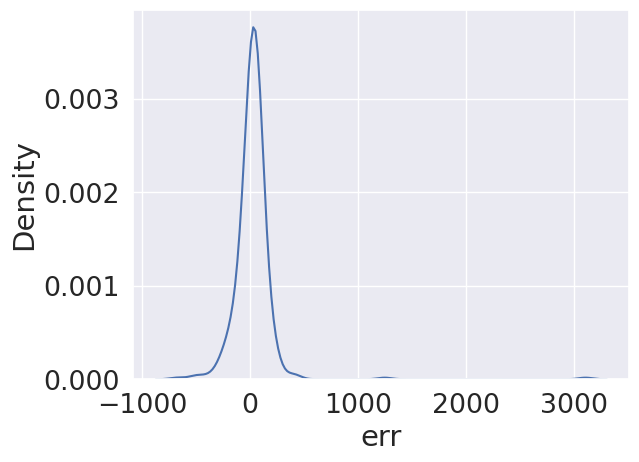

In [51]:
sns.kdeplot(data = features_df_clean_w_f, x = "err")

In [52]:
mhsfpp.cols

['clusters_ch_area_med_arr',
 'mandarin_cv',
 'cv/foliage_fullness',
 'mandarin',
 'fruit_foliage_ratio',
 'total_orange',
 'cv/total_foliage',
 'cv/center_width',
 'orange_surface_area',
 'ndri_skew',
 'cv_q_2_precent_fruits',
 '1/mst_sums_arr',
 '1/mst_sums_arr^2',
 'lemon_cv',
 'total_foliage',
 'sipi_skew',
 'cv_w_h_ratio',
 'center_height',
 'mst_skew_arr',
 'ndri',
 'volume',
 'n_clust_arr_2']

In [53]:
features_df_clean_w_f[features_df_clean_w_f["name"].str.contains("R2")][["name","pred","F","err"]].sort_values("err")

,name,pred,F,err
227,R21B_T1,519.747893,828.0,-308.252107
183,R23B_T1,773.144152,1020.0,-246.855848
226,R21A_T1,603.907084,828.0,-224.092916
247,R26B_T1,299.582630,510.0,-210.417370
278,R25B_T1,319.390483,527.0,-207.609517
246,R26A_T1,360.308209,510.0,-149.691791
259,R26A_T1,303.376466,436.0,-132.623534
267,R23A_T1,253.318217,367.0,-113.681783
253,R2A_T1,314.220192,388.0,-73.779808
207,R23B_T1,464.290579,517.0,-52.709421


In [54]:
# features_df_clean_w_f["abs_err"] = features_df_clean_w_f["err"].abs()
# features_df_clean_w_f.sort_values("abs_err")[mhsfpp.cols[1:] + ["name","pred","F","err"]][-20:]

In [55]:
# features_df_clean_w_f.drop(["abs_err", "err","pred"], axis = 1, inplace = True)

### QuantileRegressor

In [56]:
# mhsfpp_qr = model_hybrid_selector(QuantileRegressor(solver = "highs" ,alpha = 0))
# mhsfpp_qr.fitplusplus(X_tr_lr,y,num_stuck = 3)
# print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp_qr.cols],y))

# print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp_qr.cols],y,groups = rows))

### fit ploy linear

In [57]:
# poly = PolynomialFeatures(interaction_only=False)
# cols = ['clusters_area_med_arr', 'clusters_ch_area_med_arr',
#        'q_2_precent_fruits', 'q_3_precent_fruits', 'w_h_ratio', 'gli', 'ndri',
#        'sipi_skew', 'total_foliage', 'perimeter', 'mandarin', 'orange',
#        'cv/center_height', 'cv/center_width', 'cv/foliage_fullness',
#        'orange_cv', 'mandarin_cv']

# X_inteact = pd.DataFrame(poly.fit_transform(X_tr_lr[cols]),
#                          columns = poly.get_feature_names(cols))
# # mhs_interact =   model_hybrid_selector()          
# # mhs_interact.fit(X_inteact, y, num_stuck = 3, cols = mhs.cols,use_alwyas = [])

### fit scalers

In [58]:
# for sclaer in scalers.keys():
#     print(sclaer)
#     sc = scalers[sclaer]
#     pipe = Pipeline(steps = [(sclaer, sc),
#                             ("lm",LinearRegression())])
#     print(model_hybrid_selector(pipe).fitplusplus(X_tr_lr,y,num_stuck = 3))
#     print("final results")

### XGB

In [59]:
tree_cols = ["cv/center_width", "cv", "mst_mean_arr", "cv/surface_area", "orange_surface_area", "cv/fruit_foliage_ratio",
        "cv/foliage_fullness", "orange_center_width", "orange_cv", "cv/total_foliage", "cv/center_height",
        "w_h_ratio", "fruit_dist_center", "mst_sums_arr", "foliage_fullness",
"center_width", "center_height", "center_perimeter", "clusters_area_med_arr"]

In [60]:
X_tr_trees = X_tr_lr.drop(cfg.drop_from_trees,axis = 1)
X_tr_trees = X_tr_lr.copy()[tree_cols]

In [98]:
#             'min_child_weight': trial.suggest_float('min_child_weight',1e-1, 2),
#             'max_depth': trial.suggest_int('max_depth',1,9),
#             'gamma': trial.suggest_float("gamma",1e-3, 1),
#             'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1, step=0.1),
#             'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.3, 1, step=0.1),
#             "reg_alpha" : trial.suggest_float("reg_alpha" ,0.1, 5),
#             "reg_lambda" : trial.suggest_float("reg_lambda" ,0.1, 5),
#             'subsample': trial.suggest_float('subsample', 0.4, 0.9, step=0.1),

xgb_params = {'eta': 0.4317038955895696, 'min_child_weight': 0.7064823672299997, 'max_depth': 17, 
              'gamma': 0.5769908739974827, 'colsample_bytree': 0.6000000000000001, 
              'colsample_bylevel': 0.8, 'reg_alpha': 1.6664166073409137, 'reg_lambda': 3.6252049236590516, 
              'subsample': 0.6000000000000001, 'n_estimators': 960}

xgb_params =  {'objective': 'reg:squarederror',
  'eta': 0.025062487899819554,
  'min_child_weight': 0.01,
  'max_depth': 7,
  'gamma': 0.9420000000000001,
  'colsample_bytree': 1.0,
  'colsample_bylevel': 0.4,
  'reg_alpha': 12.760555993475265,
  'reg_lambda': 11.537122879581878,
  'subsample': 0.6000000000000001,
  'n_estimators': 90}
model_xgb = XGBRegressor(**xgb_params)
score = cross_validate(model_xgb, X_tr_lr , y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")

In [99]:
print((np.mean(score['test_score']), np.std(score['test_score'])))
print(cross_validate_with_mean(model_xgb,X_tr_trees,y,groups = groups))
print(cross_validate_with_mean(model_xgb,X_tr_trees,y,groups = groups, use_log1p = True))

(-0.37991781387247336, 0.11302035891759168)
true: 28498.0,    pred: 21084.1328125. (26.02 %) (SUMGLD)
true: 11162.0,    pred: 7532.42333984375. (32.52 %) (DWDBCL46)
true: 7898.0,    pred: 3977.552490234375. (49.64 %) (DWDBMN37)
true: 2354.0,    pred: 2182.23876953125. (7.30 %) (DWDBNB07)
true: 3996.0,    pred: 3328.527099609375. (16.70 %) (DWDBCN51)
true: 3354.0,    pred: 3077.023681640625. (8.26 %) (DWDBMN16)
true: 1488.0,    pred: 1478.6875. (0.63 %) (DWDBNW39)
true: 2226.0,    pred: 2366.501220703125. (6.31 %) (DWDBNB05)
true: 4628.0,    pred: 3927.56884765625. (15.13 %) (DWDBMN38)
true: 1598.0,    pred: 1643.9652099609375. (2.88 %) (DWDBNB09)
true: 2495.0,    pred: 2110.45849609375. (15.41 %) (DWDBM17B)
true: 2717.0,    pred: 2290.77099609375. (15.69 %) (DWDBLE43)
true: 1946.0,    pred: 2104.6728515625. (8.15 %) (DWDBNW40)
true: 3732.0,    pred: 2399.26953125. (35.71 %) (DWDBNC47)
true: 2396.0,    pred: 1868.1552734375. (22.03 %) (DWDBLE42)
true: 6208.0,    pred: 4415.052734375. (2

### XGB feature importance

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


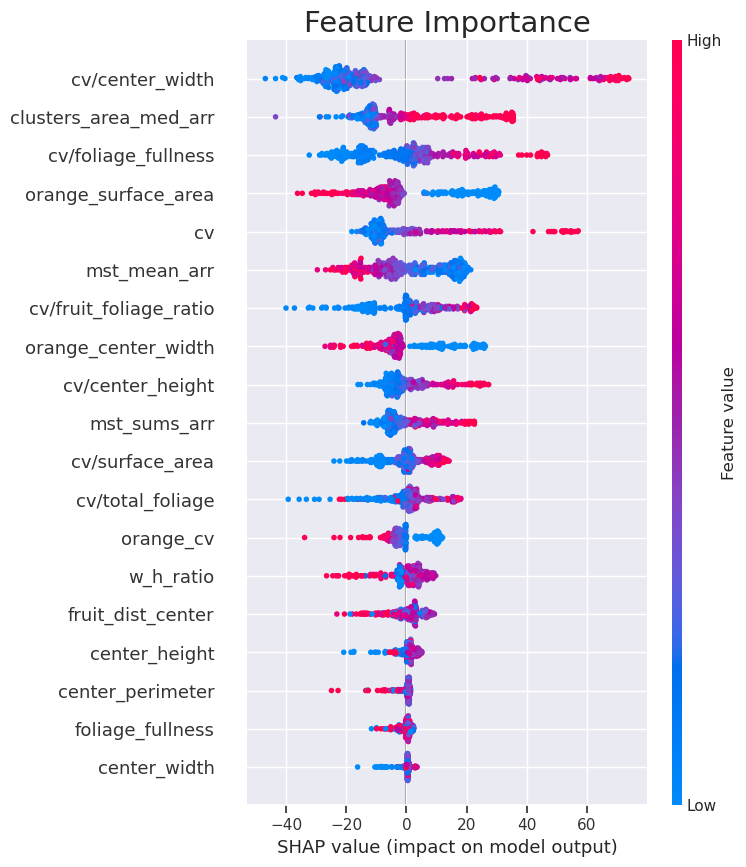

In [63]:
import shap
import matplotlib.pyplot as plt

def plot_shap_summary(model, data, max_display=50):
    # Compute SHAP values
    explainer = shap.Explainer(model, data)
    shap_values = explainer(data)

    # Plot SHAP summary
    shap.summary_plot(shap_values, data, show=False, max_display=max_display)

    # Customize the plot
    plt.title("Feature Importance")
    plt.tight_layout()
    plt.show()
model_xgb.fit(X_tr_trees, y)
plot_shap_summary(model_xgb, X_tr_trees)


In [64]:
["cv/center_width", "cv", "mst_mean_arr", "cv/surface_area", "orange_surface_area", "cv/fruit_foliage_ratio",
        "cv/foliage_fullness", "orange_center_width", "orange_cv", "cv/total_foliage", "cv/center_height",
        "w_h_ratio", "fruit_dist_center", "center_height", "mst_sums_arr", "foliage_fullness",
"center_width", "center_height", "center_perimeter"]

['cv/center_width',
 'cv',
 'mst_mean_arr',
 'cv/surface_area',
 'orange_surface_area',
 'cv/fruit_foliage_ratio',
 'cv/foliage_fullness',
 'orange_center_width',
 'orange_cv',
 'cv/total_foliage',
 'cv/center_height',
 'w_h_ratio',
 'fruit_dist_center',
 'center_height',
 'mst_sums_arr',
 'foliage_fullness',
 'center_width',
 'center_height',
 'center_perimeter']

In [65]:
model_xgb = XGBRegressor(**xgb_params)
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_tr_trees,y,test_size = 0.2)
model_xgb.fit(X_train_lr,y_train_lr)

result = permutation_importance(model_xgb, X_test_lr, y_test_lr, n_repeats=16, n_jobs=8)
sorted_idx = result.importances_mean.argsort()

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarn

In [66]:
permutation_importance_res = pd.DataFrame({"names": X_train_lr.columns,"imp": result.importances_mean,
                                          "std": result.importances_std})
permutation_importance_res["l_ci"] = permutation_importance_res["imp"] - 2* permutation_importance_res["std"] 
permutation_importance_res= permutation_importance_res.sort_values("imp",ascending = False)

In [67]:
cfg.drop_from_trees = ["cv^2", "clusters_area_med_arr", "avg_height", "height", "avg_perimeter", "perimeter",
                   "width", "avg_width", "mst_sums_arr^2", "cv/fruit_foliage_ratio", "avg_volume"]

In [68]:
permutation_importance_res

,names,imp,std,l_ci
0,cv/center_width,0.183509,0.031344,0.120822
6,cv/foliage_fullness,0.087123,0.013194,0.060735
1,cv,0.084727,0.014076,0.056575
3,cv/surface_area,0.073514,0.021555,0.030403
4,orange_surface_area,0.069575,0.025953,0.017670
10,cv/center_height,0.066454,0.008396,0.049663
7,orange_center_width,0.063259,0.014304,0.034652
2,mst_mean_arr,0.055554,0.013114,0.029326
18,clusters_area_med_arr,0.052462,0.011139,0.030184
8,orange_cv,0.029034,0.007521,0.013992


In [69]:
imp_params = permutation_importance_res["names"][permutation_importance_res["imp"]> 0].values
model_xgb = XGBRegressor(**xgb_params)
model_xgb.fit(X_tr_trees[imp_params],y)
print((np.mean(score['test_score']), np.std(score['test_score'])))
print(cross_validate_with_mean(model_xgb,X_tr_trees[imp_params],y,groups = groups))
print(cross_validate_with_mean(model_xgb,X_tr_trees[imp_params],y,groups = groups, use_log1p = True))

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


(-0.37377444067999244, 0.10059774947972468)
true: 28498.0,    pred: 21408.462890625. (24.88 %) (SUMGLD)
true: 11162.0,    pred: 7838.09716796875. (29.78 %) (DWDBCL46)
true: 7898.0,    pred: 3917.528076171875. (50.40 %) (DWDBMN37)
true: 2354.0,    pred: 2239.996826171875. (4.84 %) (DWDBNB07)
true: 3996.0,    pred: 3722.496826171875. (6.84 %) (DWDBCN51)
true: 3354.0,    pred: 3200.1748046875. (4.59 %) (DWDBMN16)
true: 1488.0,    pred: 1679.512939453125. (12.87 %) (DWDBNW39)
true: 2226.0,    pred: 2347.5966796875. (5.46 %) (DWDBNB05)
true: 4628.0,    pred: 3910.9697265625. (15.49 %) (DWDBMN38)
true: 1598.0,    pred: 1716.5438232421875. (7.42 %) (DWDBNB09)
true: 2495.0,    pred: 2136.599609375. (14.36 %) (DWDBM17B)
true: 2717.0,    pred: 2492.789794921875. (8.25 %) (DWDBLE43)
true: 1946.0,    pred: 2186.140625. (12.34 %) (DWDBNW40)
true: 3732.0,    pred: 2413.89794921875. (35.32 %) (DWDBNC47)
true: 2396.0,    pred: 1982.55908203125. (17.26 %) (DWDBLE42)
true: 6208.0,    pred: 4262.95605468

### RF

In [70]:
X_tr_trees = X_tr_lr.drop(cfg.drop_from_trees,axis = 1)
X_tr_trees = X_tr_lr.copy()[tree_cols]

In [102]:
rf_params = {'n_estimators': 1773, 'max_depth': 134, 'min_samples_split': 4, 'min_samples_leaf': 2, 
             'max_features': 1.0, 'ccp_alpha': 0.02258939198870146, 'max_samples': 0.6000000000000001}
rf_params = {'n_estimators': 10,
  'min_samples_split': 3,
  'min_samples_leaf': 2,
  'max_features': 0.9000000000000001,
  'ccp_alpha': 2.4115573736096106e-05,
  'max_samples': 0.9}
model_rf = RandomForestRegressor(**rf_params)
score = cross_validate(model_rf, X_tr_trees , y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")

In [103]:
print((np.mean(score['test_score']), np.std(score['test_score'])))
print(cross_validate_with_mean(model_rf,X_tr_trees,y,groups = groups))
print(cross_validate_with_mean(model_rf,X_tr_trees,y,groups = groups, use_log1p = True))

(-0.4833481860300112, 0.25050774896112726)
true: 28498.0,    pred: 31720.25785714286. (11.31 %) (SUMGLD)
true: 11162.0,    pred: 7238.51892857143. (35.15 %) (DWDBCL46)
true: 7898.0,    pred: 5613.706428571429. (28.92 %) (DWDBMN37)
true: 2354.0,    pred: 2706.9102380952377. (14.99 %) (DWDBNB07)
true: 3996.0,    pred: 5196.470714285714. (30.04 %) (DWDBCN51)
true: 3354.0,    pred: 3768.879404761905. (12.37 %) (DWDBMN16)
true: 1488.0,    pred: 1979.4578571428574. (33.03 %) (DWDBNW39)
true: 2226.0,    pred: 2869.0681746031746. (28.89 %) (DWDBNB05)
true: 4628.0,    pred: 4942.792619047619. (6.80 %) (DWDBMN38)
true: 1598.0,    pred: 1988.1676190476192. (24.42 %) (DWDBNB09)
true: 2495.0,    pred: 2949.3461904761903. (18.21 %) (DWDBM17B)
true: 2717.0,    pred: 2809.2166666666667. (3.39 %) (DWDBLE43)
true: 1946.0,    pred: 2807.013333333333. (44.25 %) (DWDBNW40)
true: 3732.0,    pred: 3264.9342857142856. (12.52 %) (DWDBNC47)
true: 2396.0,    pred: 2188.0559523809525. (8.68 %) (DWDBLE42)
true: 62

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarn

### RF feature importncae

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


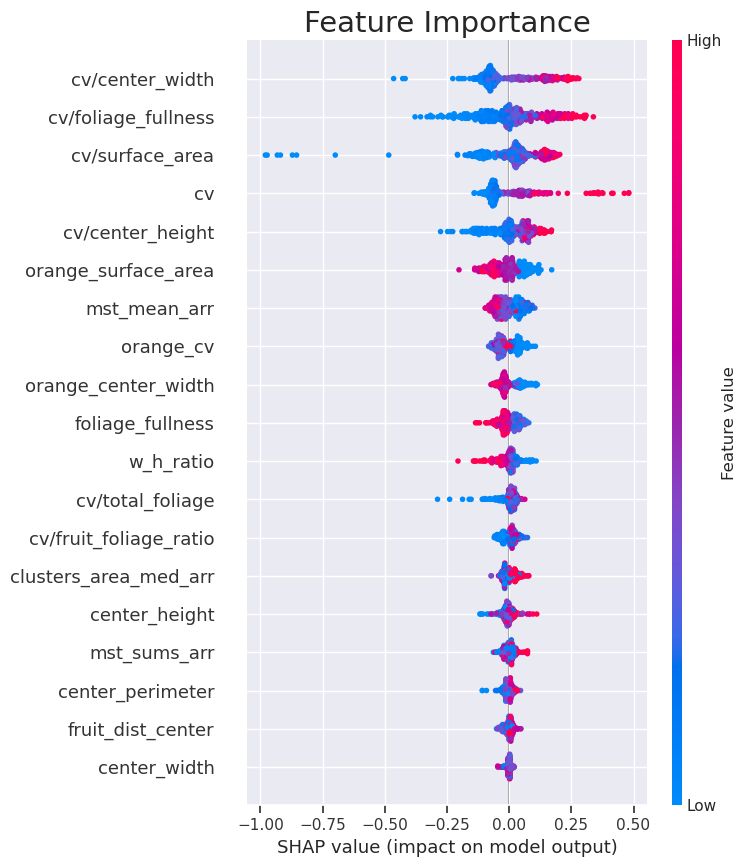

In [73]:
plot_shap_summary(model_rf, X_tr_trees)

In [74]:
model_rf = RandomForestRegressor(**rf_params)
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_tr_trees,y,test_size = 0.2)
model_rf.fit(X_train_lr,y_train_lr)
result = permutation_importance(model_rf, X_test_lr, y_test_lr, n_repeats=16, n_jobs=8)
sorted_idx = result.importances_mean.argsort()
permutation_importance_res = pd.DataFrame({"names": X_train_lr.columns,"imp": result.importances_mean,
                                          "std": result.importances_std})
permutation_importance_res["l_ci"] = permutation_importance_res["imp"] - 2* permutation_importance_res["std"] 
permutation_importance_res= permutation_importance_res.sort_values("imp",ascending = False)
permutation_importance_res

,names,imp,std,l_ci
10,cv/center_height,0.128342,0.030899,0.066544
0,cv/center_width,0.110683,0.028860,0.052964
4,orange_surface_area,0.062104,0.016220,0.029664
3,cv/surface_area,0.029393,0.012491,0.004410
7,orange_center_width,0.011573,0.003074,0.005424
14,foliage_fullness,0.011417,0.008215,-0.005012
8,orange_cv,0.011010,0.004348,0.002314
16,center_height,0.007346,0.007391,-0.007437
18,clusters_area_med_arr,0.006280,0.005583,-0.004886
17,center_perimeter,0.003579,0.005057,-0.006535


### Lasso

In [75]:
# import pickle

# # Save the model to a file
# with open('model.pkl', 'wb') as f:
#     pickle.dump(mhsfpp_statisticly, f)


In [76]:
from sklearn.linear_model import LassoCV
alphas = np.linspace(0.1,50,2500)
las = LassoCV(n_alphas=2500,cv = 8, n_jobs = -1,max_iter=10000, eps=1e-10)
sc = StandardScaler()
las.fit(pd.DataFrame(sc.fit_transform(X_tr_lr), columns = X_tr_lr.columns),y)

las_score = cross_validate(las, sc.fit_transform(X_tr_lr) ,
               y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")

In [77]:
np.mean(las_score["test_score"])

-0.4802377849558074

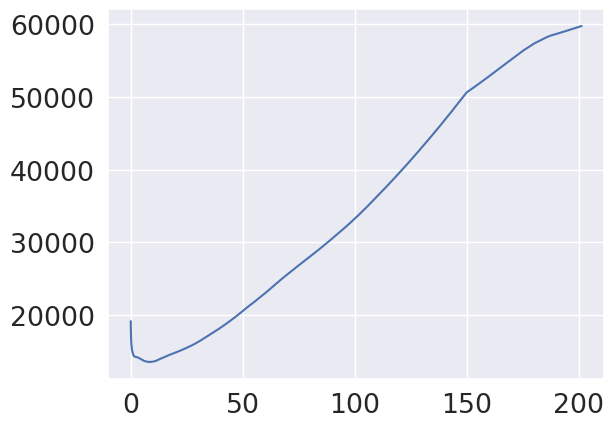

In [78]:
plt.plot(las.alphas_,np.mean(las.mse_path_,axis = 1))

In [79]:
X_tr_lr.columns[las.coef_ !=0]

Index(['clusters_area_med_arr', 'w_h_ratio', 'gli', 'cv/center_height',
       'cv/center_width', 'cv/foliage_fullness', 'cv_fruit_dist_center',
       'orange_surface_area', 'lemon_surface_area', 'mandarin_cv'],
      dtype='object')

In [80]:
cols = X_tr_lr.columns[las.coef_ !=0]
X_non_scale = X_tr_lr.copy()[cols]
sc = scalers["Robust"]
X_scaled = sc.fit_transform(X_non_scale)
X_scaled = pd.DataFrame(X_scaled,columns = X_non_scale.columns)
X_tr_lm = sm.add_constant(X_scaled)

model = sm.OLS(y.reset_index(drop=True),X_tr_lm)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      F   R-squared:                       0.816
Model:                            OLS   Adj. R-squared:                  0.810
Method:                 Least Squares   F-statistic:                     153.5
Date:                Thu, 09 Mar 2023   Prob (F-statistic):          7.38e-121
Time:                        15:10:36   Log-Likelihood:                -2161.6
No. Observations:                 358   AIC:                             4345.
Df Residuals:                     347   BIC:                             4388.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   194.6625      6.835     28.479      0.000     181.219     208.106
clusters_area_med_arr    27.1755     15.172      1.791      0.074      -2.664      57.015
w_h_ratio               -22.4393      7.329     -3.062      0.002     -36.854      -8.025
gli                       7.7964      5.782      1.348      0.178      -3.575      19.168
cv/center_height         21.3169     25.324      0.842      0.400     -28.490      71.124
cv/center_width          63.4163     14.195      4.468      0.000      35.498      91.335
cv/foliage_fullness      52.6911     38.298      1.376      0.170     -22.634     128.016
cv_fruit_dist_center     28.6924     12.609      2.275      0.023       3.892      53.493
orange_surface_area     -42.0524     17.941     -2.344      0.020     -77.340      -6.765
lemon_surface_area       20.8799      6.152      3.394      0.001       8.781      32.979
mandarin_cv               0.5309      0.115      4.634      0.000       0.306       0.756
==============================================================================
Omnibus:                      109.054   Durbin-Watson:                   1.807
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              671.093
Skew:                           1.121   Prob(JB):                    1.88e-146
Kurtosis:                       9.321   Cond. No.                         890.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [81]:
from sklearn.base import BaseEstimator, TransformerMixin

class LassoSelector(BaseEstimator, TransformerMixin):
    def __init__(self, estimator):
        self.estimator = estimator

    def fit(self, X, y=None):
        self.estimator.fit(X, y)
        self.coefs_ = self.estimator.coef_
        return self

    def transform(self, X):
        return X[:, self.coefs_ != 0]

# Define the column transformer and the model
lasso = LassoCV(n_alphas=2500,cv = 8, n_jobs = -1,max_iter=10000)
# lasso = LassoCV(alphas=alphas,cv = 8, n_jobs = -1,max_iter=10000)

# Create the pipeline
pipe = Pipeline([("scaler", scalers["Robust"]), 
                 ("lasso_selector", LassoSelector(lasso)),
                 ("final_estimator", LinearRegression())])

las_pipe_score = cross_validate(pipe, X_tr_lr ,
               y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")
print(np.mean(las_pipe_score["test_score"]))

-0.47659045271551925


In [82]:
print(cross_validate_with_mean(pipe,X_tr_lr,y,groups = groups))

true: 28498.0,    pred: 31584.232423655703. (10.83 %) (SUMGLD)
true: 11162.0,    pred: 9210.391136882872. (17.48 %) (DWDBCL46)
true: 7898.0,    pred: 6598.2781538150375. (16.46 %) (DWDBMN37)
true: 2354.0,    pred: 2578.2326470092157. (9.53 %) (DWDBNB07)
true: 3996.0,    pred: 4185.170053926874. (4.73 %) (DWDBCN51)
true: 3354.0,    pred: 4066.7157674657283. (21.25 %) (DWDBMN16)
true: 1488.0,    pred: 2087.807626485128. (40.31 %) (DWDBNW39)
true: 2226.0,    pred: 2744.800877195342. (23.31 %) (DWDBNB05)
true: 4628.0,    pred: 5226.43808000026. (12.93 %) (DWDBMN38)
true: 1598.0,    pred: 1888.5564701289372. (18.18 %) (DWDBNB09)
true: 2495.0,    pred: 3027.9431552327487. (21.36 %) (DWDBM17B)
true: 2717.0,    pred: 2913.9788322074687. (7.25 %) (DWDBLE43)
true: 1946.0,    pred: 2481.875780837493. (27.54 %) (DWDBNW40)
true: 3732.0,    pred: 2608.503141600453. (30.10 %) (DWDBNC47)
true: 2396.0,    pred: 2421.487329034369. (1.06 %) (DWDBLE42)
true: 6208.0,    pred: 6115.283034553262. (1.49 %) (D

In [83]:
print(cross_validate_with_mean(pipe,X_tr_lr[non_zed_cols],y,groups = groups))

true: 28498.0,    pred: 34846.587065168. (22.28 %) (SUMGLD)
true: 11162.0,    pred: 8719.025432865898. (21.89 %) (DWDBCL46)
true: 7898.0,    pred: 6328.549948677625. (19.87 %) (DWDBMN37)
true: 2354.0,    pred: 2365.2922298198746. (0.48 %) (DWDBNB07)
true: 3996.0,    pred: 3939.5720265531922. (1.41 %) (DWDBCN51)
true: 3354.0,    pred: 4533.411416462223. (35.16 %) (DWDBMN16)
true: 1488.0,    pred: 2071.2616990756724. (39.20 %) (DWDBNW39)
true: 2226.0,    pred: 2673.0168073756845. (20.08 %) (DWDBNB05)
true: 4628.0,    pred: 5348.962512218285. (15.58 %) (DWDBMN38)
true: 1598.0,    pred: 1894.902646451611. (18.58 %) (DWDBNB09)
true: 2495.0,    pred: 3641.3570568007626. (45.95 %) (DWDBM17B)
true: 2717.0,    pred: 2932.097313682974. (7.92 %) (DWDBLE43)
true: 1946.0,    pred: 2458.1071251886387. (26.32 %) (DWDBNW40)
true: 3732.0,    pred: 3094.381582838962. (17.09 %) (DWDBNC47)
true: 2396.0,    pred: 2620.568098937001. (9.37 %) (DWDBLE42)
true: 6208.0,    pred: 6405.6628432963225. (3.18 %) (DW

In [84]:
# Create the pipeline
for sclaer in scalers.keys():
    lasso = LassoCV(n_alphas=2500,cv = 8, n_jobs = -1,max_iter=10000)
    pipe = Pipeline([("scaler", scalers[sclaer]), 
                 ("lasso_selector", LassoSelector(lasso)),
                 ("final_estimator", LinearRegression())])
    print(sclaer)
    print(cross_validate_with_mean(pipe,X_tr_lr,y,groups = groups))


Standard
true: 28498.0,    pred: 30982.95990336348. (8.72 %) (SUMGLD)
true: 11162.0,    pred: 9347.461638029366. (16.26 %) (DWDBCL46)
true: 7898.0,    pred: 6508.260357154078. (17.60 %) (DWDBMN37)
true: 2354.0,    pred: 2977.986173078089. (26.51 %) (DWDBNB07)
true: 3996.0,    pred: 5859.574957638087. (46.64 %) (DWDBCN51)
true: 3354.0,    pred: 4074.294269392307. (21.48 %) (DWDBMN16)
true: 1488.0,    pred: 1788.1692722549742. (20.17 %) (DWDBNW39)
true: 2226.0,    pred: 2519.647166786997. (13.19 %) (DWDBNB05)
true: 4628.0,    pred: 5258.702047575427. (13.63 %) (DWDBMN38)
true: 1598.0,    pred: 1452.834636249681. (9.08 %) (DWDBNB09)
true: 2495.0,    pred: 2657.1088468984467. (6.50 %) (DWDBM17B)
true: 2717.0,    pred: 3019.8432076920253. (11.15 %) (DWDBLE43)
true: 1946.0,    pred: 2667.0602922107096. (37.05 %) (DWDBNW40)
true: 3732.0,    pred: 2457.3087542412127. (34.16 %) (DWDBNC47)
true: 2396.0,    pred: 2577.028308219148. (7.56 %) (DWDBLE42)
true: 6208.0,    pred: 6125.921363141993. (1.

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.176e+04, tolerance: 1.735e+03


true: 11162.0,    pred: 8963.214661344386. (19.70 %) (DWDBCL46)
true: 7898.0,    pred: 6014.135986027945. (23.85 %) (DWDBMN37)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1475.4658674607053, tolerance: 1457.0532950819675
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1777.748140363954, tolerance: 1081.6922052459015
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1748.14183129929, tolerance: 1081.6922052459015
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1767.40965498914, tolerance: 1081.6922052459015
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.078e+04, tolerance: 1.972e+03


true: 2354.0,    pred: 2685.6995485618227. (14.09 %) (DWDBNB07)


Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.913e+04, tolerance: 1.935e+03


true: 3996.0,    pred: 5035.011911370119. (26.00 %) (DWDBCN51)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1946.406971924007, tolerance: 1853.4013462295081
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.665e+04, tolerance: 1.985e+03


true: 3354.0,    pred: 4029.3640493435832. (20.14 %) (DWDBMN16)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1764.21879986953, tolerance: 1093.043664262295
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1783.7615526746958, tolerance: 1093.043664262295
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1798.0016752074007, tolerance: 1093.043664262295
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1807.9934838432819, tolerance: 1093.043664262295
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1846.0098502251785, tolerance: 1093.043664262295
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1843.7965364009142, tolerance: 1093.043664262295
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1871.0690559919458, tolerance: 1093.043664262295
O

true: 1488.0,    pred: 1124.8017046322545. (24.41 %) (DWDBNW39)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1522.636936091818, tolerance: 1472.245024918033
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1796.2510497968178, tolerance: 1097.678206557377
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1824.994903526269, tolerance: 1097.678206557377
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1847.139658168191, tolerance: 1097.678206557377
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.754e+04, tolerance: 1.987e+03


true: 2226.0,    pred: 2528.3927073533487. (13.58 %) (DWDBNB05)


Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.755e+04, tolerance: 1.906e+03


true: 4628.0,    pred: 5018.273344493028. (8.43 %) (DWDBMN38)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1773.113395545166, tolerance: 1084.375588852459
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1758.8657429998275, tolerance: 1084.375588852459
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1780.7409290606156, tolerance: 1084.375588852459
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1796.7503619929776, tolerance: 1084.375588852459
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1841.1018966140691, tolerance: 1084.375588852459
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1842.2301355628297, tolerance: 1084.375588852459
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regular

true: 1598.0,    pred: 1663.4436211307466. (4.10 %) (DWDBNB09)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1964.6311472943053, tolerance: 1874.7742918300655
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1823.7545038983226, tolerance: 1082.9721560655737
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1842.6838673823513, tolerance: 1082.9721560655737
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.820e+04, tolerance: 1.978e+03


true: 2495.0,    pred: 2920.172407737093. (17.04 %) (DWDBM17B)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1958.2155232597142, tolerance: 1847.7810235294119
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1098.2010679782834, tolerance: 1028.6851639344263
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.901e+04, tolerance: 1.980e+03


true: 2717.0,    pred: 3774.196874753736. (38.91 %) (DWDBLE43)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1808.555572078796, tolerance: 1099.7783560655737
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1823.6836315977853, tolerance: 1099.7783560655737
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1835.1450841836631, tolerance: 1099.7783560655737
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1832.5228596744128, tolerance: 1099.7783560655737
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1856.13613845082, tolerance: 1099.7783560655737
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1873.778566962108, tolerance: 1099.7783560655737
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1886.590014935704, tolerance: 1099.77835606557

true: 1946.0,    pred: 2838.8235197553904. (45.88 %) (DWDBNW40)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1486.7146522053517, tolerance: 1059.7858026143792
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.079e+04, tolerance: 1.969e+03


true: 3732.0,    pred: 2902.2739656126023. (22.23 %) (DWDBNC47)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1484.6190451104194, tolerance: 1449.0563179153094
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1938.4411492254585, tolerance: 1838.8884944625404
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1845.269727934152, tolerance: 1837.6825529411765
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1633.4675388289616, tolerance: 1069.106794771242
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1096.9451618371531, tolerance: 1069.106794771242
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1094.6822169821244, tolerance: 1069.106794771242
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regu

true: 2396.0,    pred: 1846.624670652554. (22.93 %) (DWDBLE42)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1812.372668170603, tolerance: 1030.2519673202614
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1841.4482156294398, tolerance: 1030.2519673202614
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1948.86860739626, tolerance: 1030.2519673202614
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1920.7082258102018, tolerance: 1030.2519673202614
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1942.1537139764987, tolerance: 1030.2519673202614
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1967.3738445383497, tolerance: 1030.2519673202614
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1932.89872729755, tolerance: 1030.25196732026

true: 6208.0,    pred: 6810.837284488485. (9.71 %) (DWDBLE34)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 2084.7212720802054, tolerance: 1488.1164692810457
Objective did not converge. You might want to increase the number of iterations. Duality gap: 2070.7509355228394, tolerance: 1488.1164692810457
Objective did not converge. You might want to increase the number of iterations. Duality gap: 2056.2503167223185, tolerance: 1488.1164692810457
Objective did not converge. You might want to increase the number of iterations. Duality gap: 2104.925285969861, tolerance: 1488.1164692810457
Objective did not converge. You might want to increase the number of iterations. Duality gap: 2366.509416409768, tolerance: 1488.1164692810457
Objective did not converge. You might want to increase the number of iterations. Duality gap: 2098.590285729151, tolerance: 1579.5634970588235
Objective did not converge. You might want to increase the number of iterations. Duality gap: 2334.11679426115, tolerance: 1488.11646928104

true: 7202.0,    pred: 6195.350029870988. (13.98 %) (DWDBLE33)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1477.8168357824907, tolerance: 1464.2619701298702
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.727e+04, tolerance: 1.989e+03


true: 2242.0,    pred: 1943.0080511112014. (13.34 %) (DWDBVM20)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1491.8527262937278, tolerance: 1467.475217475728
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.085e+04, tolerance: 1.991e+03


true: 1784.0,    pred: 1653.9134281139509. (7.29 %) (DWDBNW13)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1499.8660624804907, tolerance: 1465.3255009708741
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1922.6670512813143, tolerance: 1855.9874893203885
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1891.6902720741928, tolerance: 1855.9874893203885
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1873.8219347693957, tolerance: 1855.9874893203885
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.445e+03, tolerance: 1.988e+03


true: 1478.0,    pred: 1500.3015866039532. (1.51 %) (DWDBNW24)


Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.661e+04, tolerance: 1.953e+03


true: 1964.0,    pred: 2420.9505604112555. (23.27 %) (DWDBM17A)


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1882.5593725908548, tolerance: 1862.66037012987
Objective did not converge. You might want to increase the number of iterations. Duality gap: 2051.170584476553, tolerance: 1857.4161035598704
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1983.3554575857706, tolerance: 1857.4161035598704
Objective did not converge. You might want to increase the number of iterations. Duality gap: 2008.460214780178, tolerance: 1857.4161035598704
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.853e+03, tolerance: 1.989e+03
n_quantiles (1000) is greater than the total number of samples (183). n_quantiles is set to n_samples.


true: 1917.0,    pred: 1793.0174302122455. (6.47 %) (DWDBNW25)
1271985.0330749825 5828965.443793165
(850754.0998049543, 3898644.2377909813)
Quantile
true: 28498.0,    pred: 15078.714001302129. (47.09 %) (SUMGLD)


n_quantiles (1000) is greater than the total number of samples (340). n_quantiles is set to n_samples.


true: 11162.0,    pred: 10471.37617313611. (6.19 %) (DWDBCL46)


n_quantiles (1000) is greater than the total number of samples (348). n_quantiles is set to n_samples.


true: 7898.0,    pred: 429917916659.5. (5443376915.19 %) (DWDBMN37)


n_quantiles (1000) is greater than the total number of samples (348). n_quantiles is set to n_samples.


true: 2354.0,    pred: 2691.138221012591. (14.32 %) (DWDBNB07)


n_quantiles (1000) is greater than the total number of samples (348). n_quantiles is set to n_samples.


true: 3996.0,    pred: 4769.678909721195. (19.36 %) (DWDBCN51)


n_quantiles (1000) is greater than the total number of samples (348). n_quantiles is set to n_samples.


true: 3354.0,    pred: 4287.022709050669. (27.82 %) (DWDBMN16)


n_quantiles (1000) is greater than the total number of samples (348). n_quantiles is set to n_samples.


true: 1488.0,    pred: 1381.0204055318889. (7.19 %) (DWDBNW39)


n_quantiles (1000) is greater than the total number of samples (348). n_quantiles is set to n_samples.


true: 2226.0,    pred: 2299.9349596991274. (3.32 %) (DWDBNB05)


n_quantiles (1000) is greater than the total number of samples (348). n_quantiles is set to n_samples.


true: 4628.0,    pred: 4799.098235153807. (3.70 %) (DWDBMN38)


n_quantiles (1000) is greater than the total number of samples (348). n_quantiles is set to n_samples.


true: 1598.0,    pred: 1801.596932288606. (12.74 %) (DWDBNB09)


n_quantiles (1000) is greater than the total number of samples (349). n_quantiles is set to n_samples.


true: 2495.0,    pred: 2980.6925718009034. (19.47 %) (DWDBM17B)


n_quantiles (1000) is greater than the total number of samples (349). n_quantiles is set to n_samples.


true: 2717.0,    pred: 3791.708981750013. (39.55 %) (DWDBLE43)


n_quantiles (1000) is greater than the total number of samples (349). n_quantiles is set to n_samples.


true: 1946.0,    pred: 2600.0948256709025. (33.61 %) (DWDBNW40)


n_quantiles (1000) is greater than the total number of samples (350). n_quantiles is set to n_samples.


true: 3732.0,    pred: 2582.036605704683. (30.81 %) (DWDBNC47)


n_quantiles (1000) is greater than the total number of samples (350). n_quantiles is set to n_samples.


true: 2396.0,    pred: 2409.9604348891808. (0.58 %) (DWDBLE42)


n_quantiles (1000) is greater than the total number of samples (350). n_quantiles is set to n_samples.


true: 6208.0,    pred: 6299.790619577732. (1.48 %) (DWDBLE34)


n_quantiles (1000) is greater than the total number of samples (350). n_quantiles is set to n_samples.


true: 7202.0,    pred: 6091.437924168597. (15.42 %) (DWDBLE33)


n_quantiles (1000) is greater than the total number of samples (352). n_quantiles is set to n_samples.


true: 2242.0,    pred: 1868.4711951078389. (16.66 %) (DWDBVM20)


n_quantiles (1000) is greater than the total number of samples (353). n_quantiles is set to n_samples.


true: 1784.0,    pred: 1655.4911291407955. (7.20 %) (DWDBNW13)


n_quantiles (1000) is greater than the total number of samples (353). n_quantiles is set to n_samples.


true: 1478.0,    pred: 1482.2238577945163. (0.29 %) (DWDBNW24)


n_quantiles (1000) is greater than the total number of samples (353). n_quantiles is set to n_samples.


true: 1964.0,    pred: 2546.7438042805793. (29.67 %) (DWDBM17A)


n_quantiles (1000) is greater than the total number of samples (353). n_quantiles is set to n_samples.


true: 1917.0,    pred: 1998.668999260434. (4.26 %) (DWDBNW25)
1857009.4860192044 8509884.308186771
(2474262.389056131, 11338493.94348487)
Robust
true: 28498.0,    pred: 31584.232423655703. (10.83 %) (SUMGLD)
true: 11162.0,    pred: 9210.391136882872. (17.48 %) (DWDBCL46)
true: 7898.0,    pred: 6598.2781538150375. (16.46 %) (DWDBMN37)
true: 2354.0,    pred: 2578.2326470092157. (9.53 %) (DWDBNB07)
true: 3996.0,    pred: 4185.170053926874. (4.73 %) (DWDBCN51)
true: 3354.0,    pred: 4066.7157674657283. (21.25 %) (DWDBMN16)
true: 1488.0,    pred: 2087.807626485128. (40.31 %) (DWDBNW39)
true: 2226.0,    pred: 2744.800877195342. (23.31 %) (DWDBNB05)
true: 4628.0,    pred: 5226.43808000026. (12.93 %) (DWDBMN38)
true: 1598.0,    pred: 1888.5564701289372. (18.18 %) (DWDBNB09)
true: 2495.0,    pred: 3027.9431552327487. (21.36 %) (DWDBM17B)
true: 2717.0,    pred: 2913.9788322074687. (7.25 %) (DWDBLE43)
true: 1946.0,    pred: 2481.875780837493. (27.54 %) (DWDBNW40)
true: 3732.0,    pred: 2608.50314

### optuna

In [85]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [86]:
np.mean(las_score["test_score"])

-0.4802377849558074

In [87]:
las_score2 = cross_validate(LinearRegression(), X_tr_lr.loc[:,np.abs(las.coef_) > 0] ,
               y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")

In [88]:
print(np.mean(las_score2["test_score"]))

print(X_tr_lr.loc[:,np.abs(las.coef_) > 0].columns)

print(cross_validate_with_mean(LinearRegression(),X_tr_lr.loc[:,np.abs(las.coef_) > 0],y,groups = groups))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr.loc[:,np.abs(las.coef_) > 0],y,groups = groups, use_log1p = True))


-0.4279439347823989
Index(['clusters_area_med_arr', 'w_h_ratio', 'gli', 'cv/center_height',
       'cv/center_width', 'cv/foliage_fullness', 'cv_fruit_dist_center',
       'orange_surface_area', 'lemon_surface_area', 'mandarin_cv'],
      dtype='object')
true: 28498.0,    pred: 30741.045588820503. (7.87 %) (SUMGLD)
true: 11162.0,    pred: 9210.384681526844. (17.48 %) (DWDBCL46)
true: 7898.0,    pred: 6434.114092640533. (18.53 %) (DWDBMN37)
true: 2354.0,    pred: 2599.648392628416. (10.44 %) (DWDBNB07)
true: 3996.0,    pred: 4114.141438045908. (2.96 %) (DWDBCN51)
true: 3354.0,    pred: 4051.9941678446316. (20.81 %) (DWDBMN16)
true: 1488.0,    pred: 1608.1682927040542. (8.08 %) (DWDBNW39)
true: 2226.0,    pred: 2624.4176022804277. (17.90 %) (DWDBNB05)
true: 4628.0,    pred: 5166.783016360734. (11.64 %) (DWDBMN38)
true: 1598.0,    pred: 1870.2770571880108. (17.04 %) (DWDBNB09)
true: 2495.0,    pred: 3045.469487992505. (22.06 %) (DWDBM17B)
true: 2717.0,    pred: 3389.355716848807. (24.75 %

In [89]:
# XGB with feature selection
# train test split
# train xgb
# permutation_importance
# select all with value above zero
# cross validate

def objective_xgb_w_p_import(trial,n_jobs = -1, scoring = "neg_mean_absolute_percentage_error",
                 n_splits=8, shuffle=True, random_state=42, param = None, stratify = None):
    if not isinstance(stratify, type(None)):
        kfolds = StratifiedKFold(n_splits, shuffle= shuffle, random_state=random_state)
    else:
        kfolds = KFold(n_splits=n_splits, shuffle=shuffle, random_state=random_state)
    if isinstance(param, type(None)):
        param = {
            'objective': trial.suggest_categorical('objective', ["reg:squarederror",
                                                                "reg:pseudohubererror","reg:squaredlogerror"]),
            'eta': trial.suggest_float("eta", 0.0001,0.5, log = True),
            'min_child_weight': trial.suggest_float('min_child_weight',1e-2, 5+1e-2, step=1e-2),
            'max_depth': trial.suggest_int('max_depth',1,7),
            'gamma': trial.suggest_float("gamma",1e-3, 2+1e-3, step=1e-3),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1, step=0.1),
            'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.3, 1, step=0.1),
            "reg_alpha" : trial.suggest_float("reg_alpha" ,0.1, 20, log = True),
            "reg_lambda" : trial.suggest_float("reg_lambda" ,0.1, 20, log = True),
            'subsample': trial.suggest_float('subsample', 0.4, 0.9, step=0.1),
            'n_estimators': trial.suggest_int('n_estimators', 10, 2500, step = 10)

        }
    reg = XGBRegressor(**param)
    
    X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_tr_trees.reset_index(),y,test_size = 0.2)
    reg.fit(X_train_lr,y_train_lr)

    result = permutation_importance(reg, X_test_lr.reset_index(), y_test_lr, n_repeats=8, n_jobs=n_jobs)
    sorted_idx = result.importances_mean.argsort()
    
    permutation_importance_res = pd.DataFrame({"names": X_train_lr.columns,"imp": result.importances_mean,
                                          "std": result.importances_std}) 
    imp_params = permutation_importance_res["names"][permutation_importance_res["imp"]> 0].values
    reg = XGBRegressor(**param)
    
    scores = cross_val_score(reg, X_tr_trees[imp_params].reset_index(),y, cv=kfolds,scoring=scoring)
    return scores.mean()

In [90]:
def objective_rf(trial,n_jobs = -1, scoring = "neg_mean_absolute_percentage_error",
                 n_splits=8, shuffle=True, random_state=42, param = None, stratify = None):
    if not isinstance(stratify, type(None)):
        kfolds = StratifiedKFold(n_splits, shuffle= shuffle, random_state=random_state)
    else:
        kfolds = KFold(n_splits=n_splits, shuffle=shuffle, random_state=random_state)
    if isinstance(param, type(None)):
        param = {
            'n_estimators': trial.suggest_int("n_estimators",10,5000, step = 10),
#             'max_depth': trial.suggest_int('max_depth', 1,150),
#             'criterion': trial.suggest_categorical('criterion', ["squared_error","absolute_error"]),
            'min_samples_split': trial.suggest_int("min_samples_split", 2,50), ###
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 2,50),
            'max_features': trial.suggest_float('max_features', 0.3, 1, step=0.1),
            "ccp_alpha" : trial.suggest_float("ccp_alpha" ,1e-16, 0.1, log = True),
            'max_samples': trial.suggest_float('max_samples', 0.4, 0.9, step=0.1),
        }
    reg = RandomForestRegressor(**param)
    scores = cross_val_score(reg, X_tr_trees.reset_index(),y, cv=kfolds,n_jobs = n_jobs,scoring=scoring)
    return scores.mean()


In [104]:
# TODO try RFE with XGV as a combiend pipeline for paramater search
def objective_xgb(trial,n_jobs = -1, scoring = "neg_mean_absolute_percentage_error",
                 n_splits=8, shuffle=True, random_state=42, param = None, stratify = None):
    if not isinstance(stratify, type(None)):
        kfolds = StratifiedKFold(n_splits, shuffle= shuffle, random_state=random_state)
    else:
        kfolds = KFold(n_splits=n_splits, shuffle=shuffle, random_state=random_state)
    if isinstance(param, type(None)):
        param = {
            'objective': trial.suggest_categorical('objective', ["reg:squarederror",
                                                                "reg:pseudohubererror","reg:squaredlogerror"]),
            'eval_metric': trial.suggest_categorical('eval_metric', ['rmse', 'rmsle', 'mape']),
            'booster': trial.suggest_categorical('booster', ['gbtree', 'gblinear', 'dart']),
            'eta': trial.suggest_float("eta", 0.0001,0.5, log = True),
            'min_child_weight': trial.suggest_float('min_child_weight',1e-2, 5),
            'max_depth': trial.suggest_int('max_depth',1,30),
            'gamma': trial.suggest_float("gamma",1e-3, 3),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1),
            'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.3, 1),
            "reg_alpha" : trial.suggest_float("reg_alpha" ,0.1, 20),
            "reg_lambda" : trial.suggest_float("reg_lambda" ,0.1, 20),
            'subsample': trial.suggest_float('subsample', 0.1, 0.9),
            'n_estimators': trial.suggest_int('n_estimators', 10, 2500)

        }
    reg = XGBRegressor(**param)
    scores = cross_val_score(reg, X_tr_trees.reset_index(),y, cv=kfolds,scoring=scoring)
    return scores.mean()

In [92]:
def optimize_estimator(objective,direction='maximize',n_trails = 200,save_int = 0, save_dst="", read_from=""):
    if read_from != "":
        study = joblib.load(read_from)
    else:
        study = optuna.create_study(direction=direction)
    if save_int == 0:
        study.optimize(objective, n_trials=n_trails, n_jobs = -1)
        if save_dst!="":
            joblib.dump(study, save_dst)
    else:
        trails_per_save = np.ceil(n_trails/save_int)
        for i in range(save_int):
            study.optimize(objective, n_trials=trails_per_save)
            if save_dst!="":
                joblib.dump(study, save_dst)
    best_params = study.best_params
    best_score = study.best_value
    print(f"Best score: {best_score}\n")
    print(f"Optimized parameters: {best_params}\n")
    return best_params, best_score

In [105]:
# {'objective': 'reg:squarederror',
#   'eta': 0.0038689409213598755,
#   'min_child_weight': 0.59,
#   'max_depth': 7,
#   'gamma': 1.8279999999999998,
#   'colsample_bytree': 0.6000000000000001,
#   'colsample_bylevel': 0.8,
#   'reg_alpha': 12.336753937066918,
#   'reg_lambda': 5.161663581823111,
#   'subsample': 0.4,
#   'n_estimators': 540}
optimize_estimator(objective_xgb,n_trails=10000,save_int = 50,save_dst = "study_xgb_notebook_2.pkl",
                   read_from = "study_xgb_notebook_2.pkl")

[I 2023-03-12 10:46:08,722] A new study created in memory with name: no-name-b2f04744-ffe7-4089-9af7-25827ec463e5
[I 2023-03-12 10:53:05,560] Trial 0 finished with value: -0.32874641635154955 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.002237118244098565, 'min_child_weight': 1.40448101547781, 'max_depth': 22, 'gamma': 2.4479748523774045, 'colsample_bytree': 0.6740574550133944, 'colsample_bylevel': 0.4914331918586637, 'reg_alpha': 8.502307394103834, 'reg_lambda': 5.819798543665543, 'subsample': 0.7154466950446837, 'n_estimators': 1273}. Best is trial 0 with value: -0.32874641635154955.
[I 2023-03-12 10:55:39,318] Trial 1 finished with value: -0.8683621397204103 and parameters: {'objective': 'reg:squaredlogerror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.1703810558351475, 'min_child_weight': 1.5083525941881997, 'max_depth': 20, 'gamma': 1.861031563575529, 'colsample_bytree': 0.9029424196345572, 'colsample_bylevel': 0.67

[11:39:26] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[11:39:26] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 11:39:27,368] Trial 8 finished with value: -0.4811903430475409 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mape', 'booster': 'gblinear', 'eta': 0.000771129338562666, 'min_child_weight': 2.5740201308520603, 'max_depth': 28, 'gamma': 1.3444235772480946, 'colsample_bytree': 0.4667472716904231, 'colsample_bylevel': 0.7635857686522837, 'reg_alpha': 0.9372245348964584, 'reg_lambda': 15.343843691161368, 'subsample': 0.8013269532991636, 'n_estimators': 669}. Best is trial 0 with value: -0.32874641635154955.


[11:39:27] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2023-03-12 11:39:30,862] Trial 9 finished with value: -0.9966389233739813 and parameters: {'objective': 'reg:pseudohubererror', 'eval_metric': 'rmse', 'booster': 'gbtree', 'eta': 0.13984237047196224, 'min_child_weight': 3.712706996230421, 'max_depth': 26, 'gamma': 2.9124657947447505, 'colsample_bytree': 0.478398015801771, 'colsample_bylevel': 0.690551791385393, 'reg_alpha': 17.263420607157332, 'reg_lambda': 14.296537288691383, 'subsample': 0.49568649104081786, 'n_estimators': 1442}. Best is trial 0 with value: -0.32874641635154955.


[11:39:30] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[11:39:31] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 11:39:35,025] Trial 10 finished with value: -0.39702606100273763 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mape', 'booster': 'gblinear', 'eta': 0.002902942366707341, 'min_child_weight': 1.920464741649021, 'max_depth': 23, 'gamma': 0.35511785747765034, 'colsample_bytree': 0.7532336289810277, 'colsample_bylevel': 0.3037572909853197, 'reg_alpha': 6.6150433451971935, 'reg_lambda': 2.46908130408005, 'subsample': 0.6562755086573371, 'n_estimators': 2480}. Best is trial 0 with value: -0.32874641635154955.


[11:39:35] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[11:39:35] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 11:39:38,915] Trial 11 finished with value: -0.400239809482747 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mape', 'booster': 'gblinear', 'eta': 0.003298443384547783, 'min_child_weight': 1.9007757281232798, 'max_depth': 23, 'gamma': 0.11087948892282862, 'colsample_bytree': 0.7488432114295049, 'colsample_bylevel': 0.30633995817033616, 'reg_alpha': 7.114883868444304, 'reg_lambda': 2.9156822200536605, 'subsample': 0.6285461874835038, 'n_estimators': 2271}. Best is trial 0 with value: -0.32874641635154955.


[11:39:38] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[11:39:39] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 11:39:42,565] Trial 12 finished with value: -0.41323520081918386 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mape', 'booster': 'gblinear', 'eta': 0.006626640894682097, 'min_child_weight': 1.9996724077446666, 'max_depth': 22, 'gamma': 0.05655163488007675, 'colsample_bytree': 0.7596221222752273, 'colsample_bylevel': 0.4648650020295243, 'reg_alpha': 6.307186985907698, 'reg_lambda': 2.677856105950222, 'subsample': 0.6345881134327351, 'n_estimators': 2440}. Best is trial 0 with value: -0.32874641635154955.
[I 2023-03-12 11:39:42,704] Trial 13 finished with value: -0.4860944697124394 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mape', 'booster': 'gblinear', 'eta': 0.0022338526607536915, 'min_child_weight': 3.2826304359946548, 'max_depth': 15, 'gamma': 0.8080220650878522, 'colsample_bytree': 0.6428437806215725, 'colsample_bylevel': 0.4808188169812323, 'reg_alpha': 6.014073201759629, 'reg_lambda': 6.000011237052606, 'subsample': 0.641046

[11:39:42] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[11:39:42] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 11:39:45,645] Trial 14 finished with value: -0.4208810229412529 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mape', 'booster': 'gblinear', 'eta': 0.017076694278824005, 'min_child_weight': 2.0774072651975453, 'max_depth': 25, 'gamma': 0.5056476384238447, 'colsample_bytree': 0.834304661372062, 'colsample_bylevel': 0.4794817206828704, 'reg_alpha': 13.636743687829036, 'reg_lambda': 0.5350940189104145, 'subsample': 0.7337907365149767, 'n_estimators': 2037}. Best is trial 0 with value: -0.32874641635154955.
[I 2023-03-12 11:39:53,249] Trial 15 finished with value: -0.3914101732622829 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gbtree', 'eta': 0.0010624416634023458, 'min_child_weight': 1.1479960888637233, 'max_depth': 18, 'gamma': 2.9725060798645453, 'colsample_bytree': 0.5853573052922117, 'colsample_bylevel': 0.3043511656018151, 'reg_alpha': 8.727081945118764, 'reg_lambda': 7.1820402128263465, 'subsample': 0.5705201

[I 2023-03-12 12:28:20,403] Trial 29 finished with value: -0.9966389233739813 and parameters: {'objective': 'reg:pseudohubererror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.004824735654401603, 'min_child_weight': 1.5515226900536856, 'max_depth': 21, 'gamma': 2.403826072178681, 'colsample_bytree': 0.6869001961309861, 'colsample_bylevel': 0.9372036758820883, 'reg_alpha': 13.627047251151664, 'reg_lambda': 9.168618225410297, 'subsample': 0.17383194859052964, 'n_estimators': 1717}. Best is trial 0 with value: -0.32874641635154955.
[I 2023-03-12 12:28:23,217] Trial 30 finished with value: -0.9607685936927957 and parameters: {'objective': 'reg:squaredlogerror', 'eval_metric': 'rmse', 'booster': 'gbtree', 'eta': 0.024724861007265318, 'min_child_weight': 3.7668644757786947, 'max_depth': 3, 'gamma': 2.039854595650933, 'colsample_bytree': 0.9475667796987656, 'colsample_bylevel': 0.887150876275272, 'reg_alpha': 16.025953637792178, 'reg_lambda': 4.305463040477876, 'subsample': 0.10337319

[I 2023-03-12 14:38:43,254] Trial 44 finished with value: -0.7708995262318096 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0002220142709325362, 'min_child_weight': 1.909360078166137, 'max_depth': 11, 'gamma': 2.101963837725617, 'colsample_bytree': 0.9082658116158246, 'colsample_bylevel': 0.6329270063946396, 'reg_alpha': 12.860704878611301, 'reg_lambda': 13.886320696990751, 'subsample': 0.2583642132525129, 'n_estimators': 1209}. Best is trial 0 with value: -0.32874641635154955.
[I 2023-03-12 14:47:16,161] Trial 45 finished with value: -0.34286982776600705 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0012285859325561364, 'min_child_weight': 1.8020340040370697, 'max_depth': 12, 'gamma': 2.849080288328314, 'colsample_bytree': 0.7352683919088386, 'colsample_bylevel': 0.6954421338673444, 'reg_alpha': 8.039321559090638, 'reg_lambda': 10.711399544702426, 'subsample': 0.302771660731

[15:17:06] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[15:17:07] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 15:17:09,505] Trial 50 finished with value: -0.410869757224767 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mape', 'booster': 'gblinear', 'eta': 0.42995507086828705, 'min_child_weight': 0.29010076682740316, 'max_depth': 12, 'gamma': 2.9978922607075664, 'colsample_bytree': 0.7130140615099924, 'colsample_bylevel': 0.5518506686095024, 'reg_alpha': 5.660077159478072, 'reg_lambda': 1.0889392924107035, 'subsample': 0.8402260144320526, 'n_estimators': 1445}. Best is trial 0 with value: -0.32874641635154955.
[I 2023-03-12 15:30:14,696] Trial 51 finished with value: -0.3423151335968848 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.002201440541119647, 'min_child_weight': 1.4048949547892409, 'max_depth': 10, 'gamma': 2.863753756859777, 'colsample_bytree': 0.8279435244755795, 'colsample_bylevel': 0.6981357209129555, 'reg_alpha': 8.276506590433694, 'reg_lambda': 8.972288757834994, 'subsample': 0.3121751731822

[17:02:32] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[17:02:32] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 17:02:35,535] Trial 57 finished with value: -0.38437800404426037 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gblinear', 'eta': 0.0014069253131611488, 'min_child_weight': 2.0201611395927235, 'max_depth': 5, 'gamma': 1.6876850490502895, 'colsample_bytree': 0.8562490440653652, 'colsample_bylevel': 0.4389620463544427, 'reg_alpha': 10.97733676031887, 'reg_lambda': 3.413245837591325, 'subsample': 0.6962521023274636, 'n_estimators': 2132}. Best is trial 0 with value: -0.32874641635154955.
[I 2023-03-12 17:18:52,680] Trial 58 finished with value: -0.3753189178189116 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mape', 'booster': 'dart', 'eta': 0.0034774350388839343, 'min_child_weight': 0.7640092807067558, 'max_depth': 4, 'gamma': 1.962808879711795, 'colsample_bytree': 0.9577343480404705, 'colsample_bylevel': 0.3479048447640437, 'reg_alpha': 7.062372422688587, 'reg_lambda': 6.528901516182215, 'subsample': 0.763693114338

[18:12:05] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[18:12:05] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 18:12:07,231] Trial 65 finished with value: -0.41465284950353604 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gblinear', 'eta': 0.004083363834839174, 'min_child_weight': 2.0290902004316465, 'max_depth': 28, 'gamma': 2.4721785334020345, 'colsample_bytree': 0.7546036026094906, 'colsample_bylevel': 0.5168231482279021, 'reg_alpha': 7.247084957256673, 'reg_lambda': 11.937694114935043, 'subsample': 0.31924320347201035, 'n_estimators': 1688}. Best is trial 0 with value: -0.32874641635154955.
[I 2023-03-12 18:23:30,965] Trial 66 finished with value: -0.9966389233739813 and parameters: {'objective': 'reg:pseudohubererror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0019196683103551468, 'min_child_weight': 1.0271458960982005, 'max_depth': 7, 'gamma': 2.14848397463913, 'colsample_bytree': 0.8361491120704038, 'colsample_bylevel': 0.5186377551975957, 'reg_alpha': 6.053037909600993, 'reg_lambda': 7.4309395094387645, 'subsample': 0.27767

[19:46:58] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[19:46:59] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 19:47:01,049] Trial 77 finished with value: -0.39305748908958177 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mape', 'booster': 'gblinear', 'eta': 0.0013589921756521914, 'min_child_weight': 0.8109144015772852, 'max_depth': 25, 'gamma': 2.908686877709002, 'colsample_bytree': 0.6630959073413657, 'colsample_bylevel': 0.6466014203676254, 'reg_alpha': 6.728945626977213, 'reg_lambda': 10.35879313607119, 'subsample': 0.2878667719312054, 'n_estimators': 1973}. Best is trial 72 with value: -0.32775013705222356.
[I 2023-03-12 19:59:37,261] Trial 78 finished with value: -0.9966389233739813 and parameters: {'objective': 'reg:pseudohubererror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.005240234751234031, 'min_child_weight': 1.8841914847999526, 'max_depth': 23, 'gamma': 2.7140933386553443, 'colsample_bytree': 0.9058302697286964, 'colsample_bylevel': 0.5921510459379071, 'reg_alpha': 5.543848396830873, 'reg_lambda': 5.8287944548254345, 'subsample': 0.47913

[I 2023-03-12 20:53:21,047] Trial 92 finished with value: -0.32184402376227444 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0025897654970578835, 'min_child_weight': 0.6465888492954055, 'max_depth': 23, 'gamma': 2.7928645193960397, 'colsample_bytree': 0.7896944511472708, 'colsample_bylevel': 0.5796172952298865, 'reg_alpha': 16.093834080121468, 'reg_lambda': 6.214082925525836, 'subsample': 0.3835420913590759, 'n_estimators': 1175}. Best is trial 82 with value: -0.3171088979917383.
[I 2023-03-12 20:59:14,285] Trial 93 finished with value: -0.32727423379482323 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.002606477337933775, 'min_child_weight': 0.4065020040869243, 'max_depth': 23, 'gamma': 2.829234307388767, 'colsample_bytree': 0.7971307133384682, 'colsample_bylevel': 0.5407126165751357, 'reg_alpha': 16.7374494970639, 'reg_lambda': 6.433110185610804, 'subsample': 0.3945487868602

[I 2023-03-12 22:09:25,617] Trial 107 finished with value: -0.3162650141178366 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.001873227785390193, 'min_child_weight': 0.5265666045739267, 'max_depth': 26, 'gamma': 2.553536616222758, 'colsample_bytree': 0.8922146797232644, 'colsample_bylevel': 0.4458516030289855, 'reg_alpha': 15.77590000759201, 'reg_lambda': 7.50898708394674, 'subsample': 0.4276780622203879, 'n_estimators': 1171}. Best is trial 102 with value: -0.3158892593040542.
[I 2023-03-12 22:13:12,069] Trial 108 finished with value: -0.9673896254277012 and parameters: {'objective': 'reg:squaredlogerror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0018404661939753814, 'min_child_weight': 0.5055287541408623, 'max_depth': 27, 'gamma': 2.7241759611525964, 'colsample_bytree': 0.8775862023891744, 'colsample_bylevel': 0.43601419942790154, 'reg_alpha': 15.965579130128537, 'reg_lambda': 7.496723167323393, 'subsample': 0.50727995

[22:13:12] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[22:13:12] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 22:13:13,095] Trial 109 finished with value: -0.41789812149923145 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gblinear', 'eta': 0.0011137069432621703, 'min_child_weight': 0.1467114509060407, 'max_depth': 26, 'gamma': 2.515165073284726, 'colsample_bytree': 0.8424320317355525, 'colsample_bylevel': 0.3996548288072107, 'reg_alpha': 14.241872677822586, 'reg_lambda': 5.561971344134071, 'subsample': 0.4306393184019249, 'n_estimators': 954}. Best is trial 102 with value: -0.3158892593040542.
[I 2023-03-12 22:17:56,562] Trial 110 finished with value: -0.31531804769262106 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.001957704896746529, 'min_child_weight': 0.37306473545251684, 'max_depth': 26, 'gamma': 2.452388648789717, 'colsample_bytree': 0.8890122271145208, 'colsample_bylevel': 0.4534857337886179, 'reg_alpha': 17.40805121421249, 'reg_lambda': 7.086752612095875, 'subsample': 0.449249

[I 2023-03-12 23:19:46,184] Trial 124 finished with value: -0.31509100318196914 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0020699851790378482, 'min_child_weight': 0.31184966407861625, 'max_depth': 27, 'gamma': 2.6749489738095833, 'colsample_bytree': 0.9380498500163523, 'colsample_bylevel': 0.42209132790568005, 'reg_alpha': 15.454857900052883, 'reg_lambda': 6.840235283336779, 'subsample': 0.5202583536682651, 'n_estimators': 1035}. Best is trial 113 with value: -0.3133871141425115.
[I 2023-03-12 23:21:17,821] Trial 125 finished with value: -0.3388830257993509 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.002064558858127305, 'min_child_weight': 0.2499367066521693, 'max_depth': 27, 'gamma': 2.654457185528237, 'colsample_bytree': 0.9377270805823748, 'colsample_bylevel': 0.4226077589612684, 'reg_alpha': 15.606496547047703, 'reg_lambda': 6.646003046727972, 'subsample': 0.5173292

[23:29:54] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[23:29:54] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-12 23:29:55,333] Trial 129 finished with value: -0.4327233881111443 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gblinear', 'eta': 0.0008173526037727282, 'min_child_weight': 0.7941114005698646, 'max_depth': 29, 'gamma': 0.26171910262839315, 'colsample_bytree': 0.8939687374914993, 'colsample_bylevel': 0.4598627067270908, 'reg_alpha': 17.504998030364913, 'reg_lambda': 8.90125140651546, 'subsample': 0.49553824070488006, 'n_estimators': 1122}. Best is trial 113 with value: -0.3133871141425115.
[I 2023-03-12 23:34:07,784] Trial 130 finished with value: -0.32552306441096135 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.001390135287183767, 'min_child_weight': 0.1700190408384688, 'max_depth': 30, 'gamma': 2.5133366446918974, 'colsample_bytree': 0.9248963153123976, 'colsample_bylevel': 0.4175250604365075, 'reg_alpha': 17.057100992415346, 'reg_lambda': 7.9944695963203625, 'subsample': 0.57

[I 2023-03-13 00:38:25,794] Trial 144 finished with value: -0.37833136622694685 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0010575028295829899, 'min_child_weight': 3.963821156892273, 'max_depth': 29, 'gamma': 2.7601566069877514, 'colsample_bytree': 0.9031723508505187, 'colsample_bylevel': 0.5208698825203918, 'reg_alpha': 18.97257856915688, 'reg_lambda': 4.7548669967055295, 'subsample': 0.5367846554415769, 'n_estimators': 1157}. Best is trial 113 with value: -0.3133871141425115.
[I 2023-03-13 00:41:44,407] Trial 145 finished with value: -0.3279195494424373 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0014916112704089245, 'min_child_weight': 0.20384337996530877, 'max_depth': 28, 'gamma': 2.683549677570187, 'colsample_bytree': 0.9317769989769786, 'colsample_bylevel': 0.4336687139384612, 'reg_alpha': 19.597779565109256, 'reg_lambda': 5.206607918114907, 'subsample': 0.56150273

[01:31:24] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[01:31:25] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-13 01:31:26,156] Trial 157 finished with value: -0.38604448985518797 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'booster': 'gblinear', 'eta': 0.002271316939036341, 'min_child_weight': 0.6085220879502682, 'max_depth': 30, 'gamma': 2.2715443454120794, 'colsample_bytree': 0.9577549631882871, 'colsample_bylevel': 0.4920116160692296, 'reg_alpha': 16.969403326978572, 'reg_lambda': 3.9434938592062783, 'subsample': 0.5417917295663371, 'n_estimators': 1117}. Best is trial 113 with value: -0.3133871141425115.
[I 2023-03-13 01:36:30,314] Trial 158 finished with value: -0.31308545868599735 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.001744795530970096, 'min_child_weight': 0.33989300071383566, 'max_depth': 27, 'gamma': 2.6438476638511297, 'colsample_bytree': 0.9101954602719391, 'colsample_bylevel': 0.35936087025151076, 'reg_alpha': 17.763817935545042, 'reg_lambda': 8.314117485619466, 'subsample': 0.59

[I 2023-03-13 02:52:37,365] Trial 172 finished with value: -0.31886650065257405 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0019985494440760694, 'min_child_weight': 0.48556486773466323, 'max_depth': 29, 'gamma': 2.35045342565003, 'colsample_bytree': 0.8826731560607778, 'colsample_bylevel': 0.31808368020635597, 'reg_alpha': 17.10313336489314, 'reg_lambda': 1.6229492760102744, 'subsample': 0.686508961290317, 'n_estimators': 1292}. Best is trial 158 with value: -0.31308545868599735.
[I 2023-03-13 02:57:28,388] Trial 173 finished with value: -0.3155087948739017 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0015845414920244597, 'min_child_weight': 0.6079934460626466, 'max_depth': 30, 'gamma': 2.4732519818362877, 'colsample_bytree': 0.9992489158999919, 'colsample_bylevel': 0.30681504274339627, 'reg_alpha': 18.118608338865748, 'reg_lambda': 7.829454062048992, 'subsample': 0.605624

[I 2023-03-13 04:12:18,875] Trial 187 finished with value: -0.9966389233739813 and parameters: {'objective': 'reg:pseudohubererror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0015875345246884824, 'min_child_weight': 0.12906558032733173, 'max_depth': 29, 'gamma': 2.618155353786956, 'colsample_bytree': 0.852492485815331, 'colsample_bylevel': 0.3683076620685391, 'reg_alpha': 17.32114636313509, 'reg_lambda': 6.816706403829727, 'subsample': 0.6090604412775786, 'n_estimators': 1500}. Best is trial 158 with value: -0.31308545868599735.
[I 2023-03-13 04:17:12,844] Trial 188 finished with value: -0.3235224616183314 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'booster': 'dart', 'eta': 0.00280015786565452, 'min_child_weight': 0.4010989143478084, 'max_depth': 29, 'gamma': 2.2678980698915976, 'colsample_bytree': 0.8810603374788155, 'colsample_bylevel': 0.3174598340307569, 'reg_alpha': 19.333210814655928, 'reg_lambda': 8.14089821513714, 'subsample': 0.595765872

[04:17:12] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[04:17:13] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-13 04:17:14,260] Trial 189 finished with value: -0.3941100931167195 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gblinear', 'eta': 0.002144461863512598, 'min_child_weight': 0.24450778635962148, 'max_depth': 30, 'gamma': 2.5506063148873848, 'colsample_bytree': 0.8707780694581089, 'colsample_bylevel': 0.3888674706338222, 'reg_alpha': 16.936637853348543, 'reg_lambda': 8.580871349534169, 'subsample': 0.6753179789500743, 'n_estimators': 1327}. Best is trial 158 with value: -0.31308545868599735.
[I 2023-03-13 04:23:04,551] Trial 190 finished with value: -0.34988105972356087 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0009541286343786534, 'min_child_weight': 0.5723237122302111, 'max_depth': 27, 'gamma': 2.4584903895712396, 'colsample_bytree': 0.910153696093835, 'colsample_bylevel': 0.3275257582134371, 'reg_alpha': 19.77775010763592, 'reg_lambda': 7.372911423552885, 'subsample': 0.6249

[I 2023-03-13 05:22:08,735] Trial 204 finished with value: -0.31481387482691525 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.002290304251243227, 'min_child_weight': 0.3408187089884769, 'max_depth': 28, 'gamma': 2.677769747312186, 'colsample_bytree': 0.9499008296509504, 'colsample_bylevel': 0.3639416880615914, 'reg_alpha': 15.562543735029402, 'reg_lambda': 10.193424856692511, 'subsample': 0.7352343087718958, 'n_estimators': 1086}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 05:25:41,094] Trial 205 finished with value: -0.3155421144130434 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0023713286104828034, 'min_child_weight': 0.4350754230991998, 'max_depth': 28, 'gamma': 2.675359007984146, 'colsample_bytree': 0.9490591542132639, 'colsample_bylevel': 0.3521901928801555, 'reg_alpha': 15.21050248895036, 'reg_lambda': 9.100331768908253, 'subsample': 0.765386752

[I 2023-03-13 06:07:42,616] Trial 219 finished with value: -0.3226218957451337 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gbtree', 'eta': 0.0015500987967220997, 'min_child_weight': 0.19246566371210727, 'max_depth': 28, 'gamma': 2.3347689542789793, 'colsample_bytree': 0.9052381180351939, 'colsample_bylevel': 0.384273898289114, 'reg_alpha': 14.089460357425098, 'reg_lambda': 9.05811107966597, 'subsample': 0.6298210011363308, 'n_estimators': 1135}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 06:07:55,128] Trial 220 finished with value: -0.32098178305328356 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gbtree', 'eta': 0.0025914249137215664, 'min_child_weight': 0.3466059129305018, 'max_depth': 29, 'gamma': 2.497688908160469, 'colsample_bytree': 0.960280191139856, 'colsample_bylevel': 0.339055319874667, 'reg_alpha': 15.207419772237985, 'reg_lambda': 9.656061575761575, 'subsample': 0.618999

[I 2023-03-13 06:10:18,311] Trial 234 finished with value: -0.31394995121434716 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'booster': 'gbtree', 'eta': 0.002038992144362475, 'min_child_weight': 0.4068325932215463, 'max_depth': 27, 'gamma': 2.2299592936168353, 'colsample_bytree': 0.9373660050717967, 'colsample_bylevel': 0.3706772544772495, 'reg_alpha': 13.664670920784959, 'reg_lambda': 8.554491756016725, 'subsample': 0.6784332793700433, 'n_estimators': 1194}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 06:10:28,036] Trial 235 finished with value: -0.3157221795092232 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'booster': 'gbtree', 'eta': 0.002030988369475957, 'min_child_weight': 0.4412515133807633, 'max_depth': 27, 'gamma': 2.2632121501164115, 'colsample_bytree': 0.9732100821214792, 'colsample_bylevel': 0.36848298747748254, 'reg_alpha': 13.561503234910973, 'reg_lambda': 8.56042349821597, 'subsample': 0.681613

[I 2023-03-13 06:12:57,658] Trial 249 finished with value: -0.31522185602238817 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'booster': 'gbtree', 'eta': 0.0022725640990457568, 'min_child_weight': 0.28839722782118504, 'max_depth': 17, 'gamma': 1.05066081789375, 'colsample_bytree': 0.9804511105693948, 'colsample_bylevel': 0.3593426309350089, 'reg_alpha': 13.267413427541383, 'reg_lambda': 8.34010489875597, 'subsample': 0.7058767882281539, 'n_estimators': 1177}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 06:13:08,132] Trial 250 finished with value: -0.31973404664647365 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'booster': 'gbtree', 'eta': 0.0018121969703911171, 'min_child_weight': 0.37530097583313515, 'max_depth': 28, 'gamma': 2.2334480696839605, 'colsample_bytree': 0.9205750144379579, 'colsample_bylevel': 0.34538169265500906, 'reg_alpha': 14.93794497311424, 'reg_lambda': 19.382753044057342, 'subsample': 0.658

[I 2023-03-13 06:15:27,203] Trial 264 finished with value: -0.31824924566745577 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'booster': 'gbtree', 'eta': 0.001846254092182836, 'min_child_weight': 0.08078543060012386, 'max_depth': 29, 'gamma': 2.2190417926316783, 'colsample_bytree': 0.9171996863227676, 'colsample_bylevel': 0.36451000814765877, 'reg_alpha': 16.60231028277135, 'reg_lambda': 7.578457919497148, 'subsample': 0.6284028557466376, 'n_estimators': 1041}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 06:15:39,276] Trial 265 finished with value: -0.31946929618195163 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gbtree', 'eta': 0.0027651325566759614, 'min_child_weight': 0.1853792742012105, 'max_depth': 27, 'gamma': 2.376675186057142, 'colsample_bytree': 0.9431982931510552, 'colsample_bylevel': 0.34892707358676467, 'reg_alpha': 16.434746941896204, 'reg_lambda': 8.263688590164106, 'subsample': 0.67

[06:15:40] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[06:15:40] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-13 06:15:41,488] Trial 267 finished with value: -0.7590112952467407 and parameters: {'objective': 'reg:squaredlogerror', 'eval_metric': 'rmsle', 'booster': 'gblinear', 'eta': 0.002246544971258566, 'min_child_weight': 0.4035157079374274, 'max_depth': 30, 'gamma': 2.2747983310162074, 'colsample_bytree': 0.9238085394007992, 'colsample_bylevel': 0.3843196378039799, 'reg_alpha': 16.028681238159788, 'reg_lambda': 9.310864862810316, 'subsample': 0.6634685539881516, 'n_estimators': 1201}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 06:15:53,617] Trial 268 finished with value: -0.3170605536662255 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gbtree', 'eta': 0.0019830569259440007, 'min_child_weight': 0.278822407373016, 'max_depth': 28, 'gamma': 2.574655477108866, 'colsample_bytree': 0.9549604491819802, 'colsample_bylevel': 0.4108462226754086, 'reg_alpha': 15.094120404989258, 'reg_lambda': 9.829977889415822, 'subsample': 0.5

[06:17:02] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[06:17:03] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-13 06:17:04,121] Trial 275 finished with value: -0.39513068896347625 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gblinear', 'eta': 0.0016296846319807836, 'min_child_weight': 0.3037691024711059, 'max_depth': 26, 'gamma': 2.3304249680261906, 'colsample_bytree': 0.913476373620033, 'colsample_bylevel': 0.34183196112415093, 'reg_alpha': 16.105877453275244, 'reg_lambda': 7.725709076975056, 'subsample': 0.6693364621721458, 'n_estimators': 1117}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 06:17:17,836] Trial 276 finished with value: -0.3215001306124562 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gbtree', 'eta': 0.002732927288585323, 'min_child_weight': 0.2222571417250126, 'max_depth': 27, 'gamma': 2.5138972436484157, 'colsample_bytree': 0.9493641494342916, 'colsample_bylevel': 0.3196362185140756, 'reg_alpha': 1.8970166951111445, 'reg_lambda': 8.431864533803747, 'subsample': 0.6

[06:19:40] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[06:19:40] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-13 06:19:41,958] Trial 290 finished with value: -0.39637538253304005 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gblinear', 'eta': 0.00250429561677938, 'min_child_weight': 0.4947697105519031, 'max_depth': 28, 'gamma': 0.03712455243064805, 'colsample_bytree': 0.9736430946431429, 'colsample_bylevel': 0.3345062475410775, 'reg_alpha': 13.469540087008754, 'reg_lambda': 8.38623284119448, 'subsample': 0.663223280396639, 'n_estimators': 1425}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 06:19:51,430] Trial 291 finished with value: -0.3202324647659823 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gbtree', 'eta': 0.0015667420049962151, 'min_child_weight': 0.3162661156532936, 'max_depth': 27, 'gamma': 2.2719930177689798, 'colsample_bytree': 0.9223749672947344, 'colsample_bylevel': 0.37966568139145146, 'reg_alpha': 16.247163244508453, 'reg_lambda': 9.18128365795314, 'subsample': 0.683

[I 2023-03-13 07:13:34,428] Trial 305 finished with value: -0.3319992205040307 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'booster': 'dart', 'eta': 0.0036052457176101943, 'min_child_weight': 0.5700449163457223, 'max_depth': 27, 'gamma': 2.549946890756354, 'colsample_bytree': 0.9173081752113218, 'colsample_bylevel': 0.3509895121130631, 'reg_alpha': 14.052569035086648, 'reg_lambda': 8.63505052875397, 'subsample': 0.8620727903147356, 'n_estimators': 1247}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 07:17:19,686] Trial 306 finished with value: -0.9966389233739813 and parameters: {'objective': 'reg:pseudohubererror', 'eval_metric': 'mape', 'booster': 'dart', 'eta': 0.0021326825124053433, 'min_child_weight': 3.255309251239274, 'max_depth': 28, 'gamma': 2.506597606413869, 'colsample_bytree': 0.8862324410523237, 'colsample_bylevel': 0.39980146653119514, 'reg_alpha': 12.963468215779017, 'reg_lambda': 7.641302683169589, 'subsample': 0.60242963

[I 2023-03-13 08:22:08,286] Trial 320 finished with value: -0.3172234318496091 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0015298047594648496, 'min_child_weight': 0.3859015903051675, 'max_depth': 29, 'gamma': 1.5606315755546083, 'colsample_bytree': 0.9641822182674398, 'colsample_bylevel': 0.3599629098913532, 'reg_alpha': 17.74749889219311, 'reg_lambda': 9.972478347171213, 'subsample': 0.6692717575400764, 'n_estimators': 1344}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 08:26:43,099] Trial 321 finished with value: -0.8035311488254078 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.00015746925207456075, 'min_child_weight': 0.28841863158479963, 'max_depth': 28, 'gamma': 2.6455972611327523, 'colsample_bytree': 0.8685443413075868, 'colsample_bylevel': 0.32846145114545505, 'reg_alpha': 12.976745856942827, 'reg_lambda': 7.356631418534605, 'subsample': 0.63825

[08:36:02] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[08:36:02] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-13 08:36:03,330] Trial 324 finished with value: -0.3922031027429916 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'booster': 'gblinear', 'eta': 0.0018677237910437558, 'min_child_weight': 4.661177412717439, 'max_depth': 28, 'gamma': 2.547585685170459, 'colsample_bytree': 0.9667201841870523, 'colsample_bylevel': 0.37086182577873933, 'reg_alpha': 17.073399348343276, 'reg_lambda': 7.66751781712345, 'subsample': 0.13178976233312117, 'n_estimators': 1224}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 08:40:07,174] Trial 325 finished with value: -0.3315654839129611 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'booster': 'dart', 'eta': 0.004456002476307478, 'min_child_weight': 0.6361513209383756, 'max_depth': 29, 'gamma': 2.6772064116447614, 'colsample_bytree': 0.9919327977818126, 'colsample_bylevel': 0.34032197120406527, 'reg_alpha': 17.540422536924442, 'reg_lambda': 7.940913951157922, 'subsample': 0.694250

[09:49:32] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[09:49:32] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:576: 
Parameters: { "colsample_bylevel", "colsample_bytree", "gamma", "max_depth", "min_child_weight", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any 

[I 2023-03-13 09:49:35,410] Trial 339 finished with value: -0.3926206230433352 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'gblinear', 'eta': 0.001497389521206485, 'min_child_weight': 0.41372064245595674, 'max_depth': 26, 'gamma': 2.396935891103376, 'colsample_bytree': 0.9977432897957348, 'colsample_bylevel': 0.33328433263790846, 'reg_alpha': 17.373161036630094, 'reg_lambda': 7.718562716408718, 'subsample': 0.5808237724594226, 'n_estimators': 1459}. Best is trial 192 with value: -0.31203964032218134.
[I 2023-03-13 10:06:12,056] Trial 340 finished with value: -0.3112504788126402 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'rmsle', 'booster': 'dart', 'eta': 0.0017604669298706321, 'min_child_weight': 0.2769597882285778, 'max_depth': 27, 'gamma': 2.328622965930071, 'colsample_bytree': 0.9829447774038188, 'colsample_bylevel': 0.39628211297801985, 'reg_alpha': 17.67617695850638, 'reg_lambda': 7.201269121845118, 'subsample': 0.5981

KeyboardInterrupt: 

In [94]:
optimize_estimator(objective_rf,n_trails=10000,save_int = 50,save_dst = "study_rf_notebook.pkl")

[I 2023-03-10 08:45:53,437] A new study created in memory with name: no-name-2dac42b8-25f7-4159-b510-e6f1711a81cb
[I 2023-03-10 08:45:58,117] Trial 0 finished with value: -0.5116021056371274 and parameters: {'n_estimators': 3850, 'min_samples_split': 8, 'min_samples_leaf': 19, 'max_features': 0.3, 'ccp_alpha': 8.004556708747086e-14, 'max_samples': 0.7000000000000001}. Best is trial 0 with value: -0.5116021056371274.
[I 2023-03-10 08:45:58,621] Trial 1 finished with value: -0.6741416462234682 and parameters: {'n_estimators': 20, 'min_samples_split': 31, 'min_samples_leaf': 49, 'max_features': 0.8, 'ccp_alpha': 0.00018814523712576726, 'max_samples': 0.5}. Best is trial 0 with value: -0.5116021056371274.
[I 2023-03-10 08:46:00,585] Trial 2 finished with value: -0.5209787304063256 and parameters: {'n_estimators': 1540, 'min_samples_split': 14, 'min_samples_leaf': 28, 'max_features': 0.9000000000000001, 'ccp_alpha': 2.262598611726859e-08, 'max_samples': 0.9}. Best is trial 0 with value: -0.

[I 2023-03-10 08:46:56,547] Trial 26 finished with value: -0.47907519837618256 and parameters: {'n_estimators': 1990, 'min_samples_split': 30, 'min_samples_leaf': 16, 'max_features': 0.7, 'ccp_alpha': 2.6573107902168567e-12, 'max_samples': 0.8}. Best is trial 11 with value: -0.4338784136878197.
[I 2023-03-10 08:46:58,203] Trial 27 finished with value: -0.4194605951739202 and parameters: {'n_estimators': 1270, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.1141356283785618e-09, 'max_samples': 0.7000000000000001}. Best is trial 27 with value: -0.4194605951739202.
[I 2023-03-10 08:46:59,471] Trial 28 finished with value: -0.48572408915031284 and parameters: {'n_estimators': 1170, 'min_samples_split': 2, 'min_samples_leaf': 16, 'max_features': 0.4, 'ccp_alpha': 2.2116315797340476e-10, 'max_samples': 0.8}. Best is trial 27 with value: -0.4194605951739202.
[I 2023-03-10 08:46:59,646] Trial 29 finished with value: -0.5484259334614292 and parameters: {'n_est

[I 2023-03-10 08:47:42,525] Trial 53 finished with value: -0.42167020425405505 and parameters: {'n_estimators': 2440, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.0045137767449973e-16, 'max_samples': 0.8}. Best is trial 51 with value: -0.4180697369285239.
[I 2023-03-10 08:47:46,024] Trial 54 finished with value: -0.42082519037535737 and parameters: {'n_estimators': 2440, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.4011276444431996e-16, 'max_samples': 0.8}. Best is trial 51 with value: -0.4180697369285239.
[I 2023-03-10 08:47:49,416] Trial 55 finished with value: -0.4217198963158054 and parameters: {'n_estimators': 2370, 'min_samples_split': 14, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.0302206259270503e-16, 'max_samples': 0.8}. Best is trial 51 with value: -0.4180697369285239.
[I 2023-03-10 08:47:53,209] Trial 56 finished with value: -0.4317603764

[I 2023-03-10 08:49:45,514] Trial 80 finished with value: -0.522025349999139 and parameters: {'n_estimators': 2820, 'min_samples_split': 8, 'min_samples_leaf': 24, 'max_features': 0.6000000000000001, 'ccp_alpha': 0.006803942513629797, 'max_samples': 0.7000000000000001}. Best is trial 64 with value: -0.41001524279923235.
[I 2023-03-10 08:49:50,638] Trial 81 finished with value: -0.41277028639051316 and parameters: {'n_estimators': 3220, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 0.0015889703486960372, 'max_samples': 0.8}. Best is trial 64 with value: -0.41001524279923235.
[I 2023-03-10 08:49:55,698] Trial 82 finished with value: -0.4140559476872091 and parameters: {'n_estimators': 3460, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 0.001475325610738819, 'max_samples': 0.8}. Best is trial 64 with value: -0.41001524279923235.
[I 2023-03-10 08:50:00,838] Trial 83 finished with value: -0.4

[I 2023-03-10 08:51:50,129] Trial 106 finished with value: -0.48554817570258296 and parameters: {'n_estimators': 2730, 'min_samples_split': 42, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 0.003350055184030268, 'max_samples': 0.8}. Best is trial 64 with value: -0.41001524279923235.
[I 2023-03-10 08:51:55,356] Trial 107 finished with value: -0.4451962983381088 and parameters: {'n_estimators': 3810, 'min_samples_split': 7, 'min_samples_leaf': 10, 'max_features': 0.7, 'ccp_alpha': 0.0009865304825030286, 'max_samples': 0.8}. Best is trial 64 with value: -0.41001524279923235.
[I 2023-03-10 08:51:59,241] Trial 108 finished with value: -0.4944590014468199 and parameters: {'n_estimators': 3220, 'min_samples_split': 2, 'min_samples_leaf': 19, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.986835845290012e-05, 'max_samples': 0.8}. Best is trial 64 with value: -0.41001524279923235.
[I 2023-03-10 08:52:03,672] Trial 109 finished with value: -0.5249524409376904 and parameters: {'n_e

[I 2023-03-10 08:53:45,256] Trial 132 finished with value: -0.41294433785157736 and parameters: {'n_estimators': 2920, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.00506756974612617, 'max_samples': 0.9}. Best is trial 64 with value: -0.41001524279923235.
[I 2023-03-10 08:53:51,459] Trial 133 finished with value: -0.410521019083564 and parameters: {'n_estimators': 3120, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.015296113535334705, 'max_samples': 0.9}. Best is trial 64 with value: -0.41001524279923235.
[I 2023-03-10 08:53:57,077] Trial 134 finished with value: -0.4118478349781932 and parameters: {'n_estimators': 3100, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.008662168126968732, 'max_samples': 0.9}. Best is trial 64 with value: -0.41001524279923235.
[I 2023-03-10 08:54:02,484] Trial 135 finished with value: -0.414487437685741

[I 2023-03-10 08:56:13,865] Trial 158 finished with value: -0.4129673620277491 and parameters: {'n_estimators': 3210, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.009567824927940548, 'max_samples': 0.9}. Best is trial 151 with value: -0.40971604104842774.
[I 2023-03-10 08:56:18,254] Trial 159 finished with value: -0.42010115058495356 and parameters: {'n_estimators': 2730, 'min_samples_split': 8, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 0.019590855346927165, 'max_samples': 0.9}. Best is trial 151 with value: -0.40971604104842774.
[I 2023-03-10 08:56:23,694] Trial 160 finished with value: -0.41447275468062506 and parameters: {'n_estimators': 3060, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.001982067098633692, 'max_samples': 0.9}. Best is trial 151 with value: -0.40971604104842774.
[I 2023-03-10 08:56:29,492] Trial 161 finished with value: -0.4117230195404399 and pa

[I 2023-03-10 08:58:32,220] Trial 185 finished with value: -0.41476294293287175 and parameters: {'n_estimators': 2380, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 1.0, 'ccp_alpha': 9.203183698694929e-05, 'max_samples': 0.9}. Best is trial 182 with value: -0.4079518331463451.
[I 2023-03-10 08:58:36,396] Trial 186 finished with value: -0.40943034959451685 and parameters: {'n_estimators': 2080, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 7.470784589192639e-06, 'max_samples': 0.9}. Best is trial 182 with value: -0.4079518331463451.
[I 2023-03-10 08:58:40,361] Trial 187 finished with value: -0.41155805182739846 and parameters: {'n_estimators': 2030, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 3.992618912685112e-05, 'max_samples': 0.9}. Best is trial 182 with value: -0.4079518331463451.
[I 2023-03-10 08:58:43,332] Trial 188 finished with value: -0.5103995700854964 and parameters: {'n_estimators': 219

[I 2023-03-10 09:00:26,951] Trial 212 finished with value: -0.41024661798134854 and parameters: {'n_estimators': 2070, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 3.527885227592142e-05, 'max_samples': 0.9}. Best is trial 182 with value: -0.4079518331463451.
[I 2023-03-10 09:00:32,036] Trial 213 finished with value: -0.4126712781011259 and parameters: {'n_estimators': 2300, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 1.4475214912823881e-06, 'max_samples': 0.9}. Best is trial 182 with value: -0.4079518331463451.
[I 2023-03-10 09:00:37,050] Trial 214 finished with value: -0.4089541538265251 and parameters: {'n_estimators': 2480, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.00012324917660993148, 'max_samples': 0.9}. Best is trial 182 with value: -0.4079518331463451.
[I 2023-03-10 09:00:41,663] Trial 215 finished with value: -0.4142448376022809 and parameters: {'n_estimators': 250

[I 2023-03-10 09:02:18,558] Trial 239 finished with value: -0.4096376552357769 and parameters: {'n_estimators': 2300, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 2.7141799719421332e-06, 'max_samples': 0.9}. Best is trial 182 with value: -0.4079518331463451.
[I 2023-03-10 09:02:21,942] Trial 240 finished with value: -0.40837267186611614 and parameters: {'n_estimators': 1560, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 1.4880552664881138e-05, 'max_samples': 0.9}. Best is trial 182 with value: -0.4079518331463451.
[I 2023-03-10 09:02:27,304] Trial 241 finished with value: -0.4110546405448515 and parameters: {'n_estimators': 2460, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 4.258276064162105e-07, 'max_samples': 0.9}. Best is trial 182 with value: -0.4079518331463451.
[I 2023-03-10 09:02:30,177] Trial 242 finished with value: -0.41099616941745754 and parameters: {'n_estimators': 14

[I 2023-03-10 09:03:50,603] Trial 266 finished with value: -0.5219304096888713 and parameters: {'n_estimators': 1370, 'min_samples_split': 7, 'min_samples_leaf': 29, 'max_features': 1.0, 'ccp_alpha': 2.4070466852022154e-05, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:03:52,697] Trial 267 finished with value: -0.5285206262429348 and parameters: {'n_estimators': 1700, 'min_samples_split': 2, 'min_samples_leaf': 35, 'max_features': 1.0, 'ccp_alpha': 9.514668345698347e-05, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:03:57,534] Trial 268 finished with value: -0.4100341032664287 and parameters: {'n_estimators': 2480, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 3.4357275583490227e-06, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:04:02,154] Trial 269 finished with value: -0.4105742897605864 and parameters: {'n_estimators': 22

[I 2023-03-10 09:05:36,906] Trial 293 finished with value: -0.4120567192177632 and parameters: {'n_estimators': 2440, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 0.00013550619509569166, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:05:39,630] Trial 294 finished with value: -0.40762658842847754 and parameters: {'n_estimators': 1320, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.0006115286805304537, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:05:41,963] Trial 295 finished with value: -0.41861501602780105 and parameters: {'n_estimators': 1300, 'min_samples_split': 2, 'min_samples_leaf': 6, 'max_features': 1.0, 'ccp_alpha': 0.0008245521170573215, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:05:44,859] Trial 296 finished with value: -0.4107582228199387 and parameters: {'n_estimators': 142

[I 2023-03-10 09:07:10,025] Trial 320 finished with value: -0.4127848404329154 and parameters: {'n_estimators': 2350, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 2.7211088899502533e-10, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:07:15,279] Trial 321 finished with value: -0.4110354629206377 and parameters: {'n_estimators': 2670, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 0.0002525230004074202, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:07:18,289] Trial 322 finished with value: -0.4095819870550115 and parameters: {'n_estimators': 1500, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.0001091474944333903, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:07:20,381] Trial 323 finished with value: -0.4209264555990805 and parameters: {'n_estimators': 1140,

[I 2023-03-10 09:08:56,059] Trial 347 finished with value: -0.41470097389484994 and parameters: {'n_estimators': 2400, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 1.0, 'ccp_alpha': 1.8437997574662807e-06, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:09:01,431] Trial 348 finished with value: -0.41123897575481805 and parameters: {'n_estimators': 2760, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 5.394873837691741e-05, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:09:05,053] Trial 349 finished with value: -0.411606652173486 and parameters: {'n_estimators': 1780, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.00011341384338930588, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:09:07,601] Trial 350 finished with value: -0.46363430303783226 and parameters: {'n_estimators': 15

[I 2023-03-10 09:10:36,626] Trial 374 finished with value: -0.41091072694156844 and parameters: {'n_estimators': 1750, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 3.341147799067766e-05, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:10:39,238] Trial 375 finished with value: -0.420424728291787 and parameters: {'n_estimators': 1490, 'min_samples_split': 3, 'min_samples_leaf': 6, 'max_features': 1.0, 'ccp_alpha': 7.949168217901198e-05, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:10:42,771] Trial 376 finished with value: -0.4100919699080897 and parameters: {'n_estimators': 1840, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 0.00015732523942768432, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:10:46,135] Trial 377 finished with value: -0.408938168831507 and parameters: {'n_estimators': 1680, 

[I 2023-03-10 09:11:53,630] Trial 401 finished with value: -0.4138166873222636 and parameters: {'n_estimators': 1940, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 3.574500595288233e-05, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:11:56,158] Trial 402 finished with value: -0.4124576678685732 and parameters: {'n_estimators': 1310, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 7.851786294689387e-05, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:11:59,322] Trial 403 finished with value: -0.4280431487145071 and parameters: {'n_estimators': 1830, 'min_samples_split': 3, 'min_samples_leaf': 8, 'max_features': 1.0, 'ccp_alpha': 3.867578489543056e-06, 'max_samples': 0.9}. Best is trial 251 with value: -0.4070191099154952.
[I 2023-03-10 09:12:03,292] Trial 404 finished with value: -0.40955882879305316 and parameters: {'n_estimators': 1960,

[I 2023-03-10 09:13:13,560] Trial 428 finished with value: -0.4245480100480677 and parameters: {'n_estimators': 1210, 'min_samples_split': 5, 'min_samples_leaf': 7, 'max_features': 1.0, 'ccp_alpha': 8.435785178289458e-05, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:13:16,487] Trial 429 finished with value: -0.40917373937106016 and parameters: {'n_estimators': 1440, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.00020948994420658842, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:13:18,979] Trial 430 finished with value: -0.5247837198099045 and parameters: {'n_estimators': 1890, 'min_samples_split': 3, 'min_samples_leaf': 32, 'max_features': 1.0, 'ccp_alpha': 0.00041806685487457036, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:13:22,059] Trial 431 finished with value: -0.41541441771665905 and parameters: {'n_estimators': 1

[I 2023-03-10 09:14:23,144] Trial 455 finished with value: -0.4098374579665154 and parameters: {'n_estimators': 1080, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 8.053418496722671e-05, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:14:25,541] Trial 456 finished with value: -0.41235142278176795 and parameters: {'n_estimators': 1290, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.9000000000000001, 'ccp_alpha': 1.3610677832521367e-05, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:14:27,208] Trial 457 finished with value: -0.4131688538790097 and parameters: {'n_estimators': 800, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 0.002667402609756527, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:14:28,874] Trial 458 finished with value: -0.4186595010112613 and parameters: {'n_esti

[I 2023-03-10 09:15:47,689] Trial 482 finished with value: -0.4099360904790199 and parameters: {'n_estimators': 1310, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 2.1052497315979336e-05, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:15:50,163] Trial 483 finished with value: -0.44740045183856764 and parameters: {'n_estimators': 1590, 'min_samples_split': 3, 'min_samples_leaf': 12, 'max_features': 1.0, 'ccp_alpha': 0.00018536294675774236, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:15:53,342] Trial 484 finished with value: -0.42129943349443466 and parameters: {'n_estimators': 1940, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 1.0, 'ccp_alpha': 3.4513940979056218e-09, 'max_samples': 0.7000000000000001}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:15:55,447] Trial 485 finished with value: -0.41045165267058914 and parameters: {

[I 2023-03-10 09:17:22,461] Trial 509 finished with value: -0.41044635763550225 and parameters: {'n_estimators': 4810, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 4.257120743728643e-05, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:17:25,193] Trial 510 finished with value: -0.41096485213803013 and parameters: {'n_estimators': 1370, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.0020108135517198757, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:17:28,159] Trial 511 finished with value: -0.41204625732739164 and parameters: {'n_estimators': 1540, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 1.604947683633154e-05, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:17:32,703] Trial 512 finished with value: -0.4101496935385669 and parameters: {'n_estimators': 218

[I 2023-03-10 09:18:49,473] Trial 536 finished with value: -0.40879370520314007 and parameters: {'n_estimators': 2070, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.00043457546096620345, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:18:53,203] Trial 537 finished with value: -0.42407674994638134 and parameters: {'n_estimators': 2140, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 1.0, 'ccp_alpha': 0.002514177043536808, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:18:57,012] Trial 538 finished with value: -0.4078395774441869 and parameters: {'n_estimators': 2040, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.0002732602231509225, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:19:00,877] Trial 539 finished with value: -0.4110828112889451 and parameters: {'n_es

[I 2023-03-10 09:20:26,397] Trial 563 finished with value: -0.4099326159267713 and parameters: {'n_estimators': 1740, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 0.0001621784014340379, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:20:30,166] Trial 564 finished with value: -0.40988297474954244 and parameters: {'n_estimators': 2000, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 0.00030093489295503835, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:20:33,579] Trial 565 finished with value: -0.41015320477818384 and parameters: {'n_estimators': 1670, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 8.010036616625186e-05, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:20:37,145] Trial 566 finished with value: -0.4112443466450387 and parameters: {'n_estimators': 188

[I 2023-03-10 09:21:54,384] Trial 590 finished with value: -0.4118986253101796 and parameters: {'n_estimators': 1710, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 0.007603468437199288, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:21:57,485] Trial 591 finished with value: -0.4124378319056657 and parameters: {'n_estimators': 1840, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 0.003162960513448688, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:22:00,317] Trial 592 finished with value: -0.408688509002175 and parameters: {'n_estimators': 1540, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 0.002544505733614244, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:22:03,656] Trial 593 finished with value: -0.4111588609562957 and parameters: {'n_estimators': 1640, 'min

[I 2023-03-10 09:23:14,680] Trial 617 finished with value: -0.41128916158141254 and parameters: {'n_estimators': 1950, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.0013700859724183698, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:23:17,764] Trial 618 finished with value: -0.4117755650778082 and parameters: {'n_estimators': 1640, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 0.0007458567226331545, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:23:21,336] Trial 619 finished with value: -0.408625002068836 and parameters: {'n_estimators': 1830, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.0024826622120351074, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:23:23,718] Trial 620 finished with value: -0.4242514118658052 and parameters: {'n_esti

[I 2023-03-10 09:24:46,775] Trial 644 finished with value: -0.41299676149153325 and parameters: {'n_estimators': 1350, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 0.0013073901872367375, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:24:47,969] Trial 645 finished with value: -0.4292797904524451 and parameters: {'n_estimators': 690, 'min_samples_split': 25, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 4.803510439026232e-06, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:24:51,014] Trial 646 finished with value: -0.4563306673365021 and parameters: {'n_estimators': 1960, 'min_samples_split': 38, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.027019729684372558, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:24:53,907] Trial 647 finished with value: -0.42091263138911905 and parameters: {'n_estimators': 1590

[I 2023-03-10 09:25:59,248] Trial 671 finished with value: -0.40929295486589 and parameters: {'n_estimators': 1150, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.0026183368472883304, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:26:02,168] Trial 672 finished with value: -0.4098789030416366 and parameters: {'n_estimators': 1480, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 1.7006283546790105e-05, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:26:03,728] Trial 673 finished with value: -0.4923385610770429 and parameters: {'n_estimators': 1080, 'min_samples_split': 49, 'min_samples_leaf': 11, 'max_features': 1.0, 'ccp_alpha': 0.0006290099442360882, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:26:08,197] Trial 674 finished with value: -0.4123046166921399 and parameters: {'n_estimators': 2080,

[I 2023-03-10 09:27:31,238] Trial 698 finished with value: -0.4123646753546482 and parameters: {'n_estimators': 2140, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 0.0010757330069137534, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:27:35,345] Trial 699 finished with value: -0.4207810219817646 and parameters: {'n_estimators': 2290, 'min_samples_split': 6, 'min_samples_leaf': 6, 'max_features': 1.0, 'ccp_alpha': 0.00029259670206258575, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:27:39,772] Trial 700 finished with value: -0.4115061672562814 and parameters: {'n_estimators': 2230, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.004242828146004849, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:27:42,708] Trial 701 finished with value: -0.48073683321014204 and parameters: {'n_estimators': 2140,

[I 2023-03-10 09:29:01,715] Trial 725 finished with value: -0.42216767642520514 and parameters: {'n_estimators': 1980, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 4.324962866659211e-05, 'max_samples': 0.6000000000000001}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:29:05,123] Trial 726 finished with value: -0.41264543469500864 and parameters: {'n_estimators': 1570, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 1.3014026115415597e-05, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:29:07,016] Trial 727 finished with value: -0.4227715668487304 and parameters: {'n_estimators': 1100, 'min_samples_split': 6, 'min_samples_leaf': 7, 'max_features': 1.0, 'ccp_alpha': 0.0011028543903935874, 'max_samples': 0.9}. Best is trial 418 with value: -0.4066370112352327.
[I 2023-03-10 09:29:10,461] Trial 728 finished with value: -0.416258992468318 and parameters: {'n_es

[I 2023-03-10 09:30:19,928] Trial 752 finished with value: -0.4088478082826137 and parameters: {'n_estimators': 1160, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 2.9663790565348683e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:30:22,931] Trial 753 finished with value: -0.41219752428959333 and parameters: {'n_estimators': 1640, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.9000000000000001, 'ccp_alpha': 6.820289317527447e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:30:25,988] Trial 754 finished with value: -0.4146713390556427 and parameters: {'n_estimators': 1450, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 1.5432107216601527e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:30:29,643] Trial 755 finished with value: -0.4108932324156238 and parameters: {'

[I 2023-03-10 09:31:39,800] Trial 779 finished with value: -0.4086404195971207 and parameters: {'n_estimators': 1740, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.0006720783236096804, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:31:43,657] Trial 780 finished with value: -0.41405262431243567 and parameters: {'n_estimators': 2110, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 1.0, 'ccp_alpha': 7.976339326607032e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:31:45,763] Trial 781 finished with value: -0.428017722768915 and parameters: {'n_estimators': 1380, 'min_samples_split': 19, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 3.707952909522644e-05, 'max_samples': 0.8}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:31:49,941] Trial 782 finished with value: -0.41186516856925004 and parameters: {'n_estimators': 1

[I 2023-03-10 09:32:54,931] Trial 806 finished with value: -0.41197459344305726 and parameters: {'n_estimators': 1290, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.5478604220291877e-08, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:32:58,486] Trial 807 finished with value: -0.41168033232777207 and parameters: {'n_estimators': 1620, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 0.0001478094254543104, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:33:01,549] Trial 808 finished with value: -0.418473989281324 and parameters: {'n_estimators': 1760, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 6.377247662003929e-05, 'max_samples': 0.7000000000000001}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:33:04,674] Trial 809 finished with value: -0.41085638825173376 and parameters: {'

[I 2023-03-10 09:34:11,957] Trial 833 finished with value: -0.4140898694540834 and parameters: {'n_estimators': 2230, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 0.00030499051298876707, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:34:15,709] Trial 834 finished with value: -0.4099466622779886 and parameters: {'n_estimators': 1860, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 6.614614503109336e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:34:17,060] Trial 835 finished with value: -0.4195324159767063 and parameters: {'n_estimators': 750, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 1.0, 'ccp_alpha': 4.840926292141042e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:34:20,346] Trial 836 finished with value: -0.4103356257899977 and parameters: {'n_estimators': 172

[I 2023-03-10 09:35:40,153] Trial 860 finished with value: -0.41061051076279226 and parameters: {'n_estimators': 1820, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 0.0005671695131770815, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:35:41,355] Trial 861 finished with value: -0.41829618371737515 and parameters: {'n_estimators': 970, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 0.006165594551805558, 'max_samples': 0.8}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:35:44,007] Trial 862 finished with value: -0.4345575143600545 and parameters: {'n_estimators': 1620, 'min_samples_split': 27, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 4.730753094474898e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:35:48,323] Trial 863 finished with value: -0.4098837055044791 and parameters: {'n_estimators': 23

[I 2023-03-10 09:37:06,976] Trial 887 finished with value: -0.4115930916725322 and parameters: {'n_estimators': 2260, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 0.00011628743206043933, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:37:10,174] Trial 888 finished with value: -0.41131253307630433 and parameters: {'n_estimators': 1740, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.9000000000000001, 'ccp_alpha': 5.2879023895426714e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:37:13,976] Trial 889 finished with value: -0.4087755619232327 and parameters: {'n_estimators': 1840, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 3.433726651747127e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:37:18,442] Trial 890 finished with value: -0.4114166715958645 and parameters: {'

[I 2023-03-10 09:38:40,191] Trial 914 finished with value: -0.42356108647399277 and parameters: {'n_estimators': 1220, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 3.989427761853295e-05, 'max_samples': 0.6000000000000001}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:38:42,200] Trial 915 finished with value: -0.40927306635568905 and parameters: {'n_estimators': 1000, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 9.189634927784569e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:38:45,707] Trial 916 finished with value: -0.4127413728564264 and parameters: {'n_estimators': 1630, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 7.026791774998016e-11, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:38:48,831] Trial 917 finished with value: -0.4204997752780928 and parameters: {'n

[I 2023-03-10 09:40:12,363] Trial 941 finished with value: -0.4098850966796663 and parameters: {'n_estimators': 1790, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.000932402731154247, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:40:16,150] Trial 942 finished with value: -0.4097763148633598 and parameters: {'n_estimators': 1960, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 4.948925159593234e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:40:18,802] Trial 943 finished with value: -0.412608904920359 and parameters: {'n_estimators': 1500, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 1.6239004141487058e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:40:21,208] Trial 944 finished with value: -0.4150366346462123 and parameters: {'n_estimators': 1290

[I 2023-03-10 09:41:47,042] Trial 968 finished with value: -0.40926714912373185 and parameters: {'n_estimators': 2030, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 2.7178865635127572e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:41:49,780] Trial 969 finished with value: -0.40857257539236735 and parameters: {'n_estimators': 1360, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.000277357758839039, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:41:53,648] Trial 970 finished with value: -0.4109142770777445 and parameters: {'n_estimators': 1770, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 0.004447172539871274, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:41:55,806] Trial 971 finished with value: -0.4115533699897832 and parameters: {'n_estimators': 11

[I 2023-03-10 09:43:13,812] Trial 995 finished with value: -0.4104498322318921 and parameters: {'n_estimators': 2060, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.9000000000000001, 'ccp_alpha': 2.07942812463866e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:43:15,218] Trial 996 finished with value: -0.41418614825273425 and parameters: {'n_estimators': 760, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 1.0, 'ccp_alpha': 0.0009741908141129113, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:43:19,768] Trial 997 finished with value: -0.47325944835052425 and parameters: {'n_estimators': 3060, 'min_samples_split': 44, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 1.0813615584888165e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:43:22,835] Trial 998 finished with value: -0.4124519501092822 and parameters: {'n

[I 2023-03-10 09:44:36,189] Trial 1021 finished with value: -0.4111765095312945 and parameters: {'n_estimators': 1020, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 9.824482232514848e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:44:38,639] Trial 1022 finished with value: -0.41135766279461344 and parameters: {'n_estimators': 1200, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 7.067015291732114e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:44:41,078] Trial 1023 finished with value: -0.41066950920563217 and parameters: {'n_estimators': 1310, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.0001785286294176089, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:44:44,014] Trial 1024 finished with value: -0.4092085415770884 

[I 2023-03-10 09:46:17,436] Trial 1047 finished with value: -0.4147336329225217 and parameters: {'n_estimators': 2320, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.0004673394644325724, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:46:19,379] Trial 1048 finished with value: -0.41342038791783914 and parameters: {'n_estimators': 930, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.00010772906461294727, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:46:24,494] Trial 1049 finished with value: -0.40884942224619414 and parameters: {'n_estimators': 2740, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.9000000000000001, 'ccp_alpha': 0.00020753174532276203, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:46:26,662] Trial 1050 finished with value: -0.4

[I 2023-03-10 09:47:41,068] Trial 1073 finished with value: -0.4109578500807123 and parameters: {'n_estimators': 1370, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 5.3821928385979455e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:47:43,708] Trial 1074 finished with value: -0.4127184607560129 and parameters: {'n_estimators': 1440, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.9000000000000001, 'ccp_alpha': 7.56710077286124e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:47:46,014] Trial 1075 finished with value: -0.40852415856375474 and parameters: {'n_estimators': 1140, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 6.685796451778921e-07, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:47:48,557] Trial 1076 finished with value: -0.41210480754004747 and parameters:

[I 2023-03-10 09:48:37,686] Trial 1100 finished with value: -0.41139986512495785 and parameters: {'n_estimators': 890, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 2.272512171164247e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:48:38,937] Trial 1101 finished with value: -0.4519056070355227 and parameters: {'n_estimators': 790, 'min_samples_split': 6, 'min_samples_leaf': 13, 'max_features': 1.0, 'ccp_alpha': 4.124648495082062e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:48:40,553] Trial 1102 finished with value: -0.4160758886991574 and parameters: {'n_estimators': 860, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 1.0, 'ccp_alpha': 1.1424626716240455e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:48:42,603] Trial 1103 finished with value: -0.41228563347517044 and parameters: {'n_estimators'

[I 2023-03-10 09:49:35,653] Trial 1127 finished with value: -0.41266931420496517 and parameters: {'n_estimators': 1290, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 6.571763223858459e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:49:37,663] Trial 1128 finished with value: -0.4320975496993571 and parameters: {'n_estimators': 1160, 'min_samples_split': 2, 'min_samples_leaf': 9, 'max_features': 1.0, 'ccp_alpha': 2.665205497002949e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:49:39,867] Trial 1129 finished with value: -0.46672399345952575 and parameters: {'n_estimators': 1430, 'min_samples_split': 41, 'min_samples_leaf': 5, 'max_features': 1.0, 'ccp_alpha': 3.139146679156498e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:49:42,811] Trial 1130 finished with value: -0.40960410622550103 and parameters: {'n_estimato

[I 2023-03-10 09:50:37,947] Trial 1154 finished with value: -0.42060691461674704 and parameters: {'n_estimators': 780, 'min_samples_split': 4, 'min_samples_leaf': 6, 'max_features': 1.0, 'ccp_alpha': 0.0002573352573787919, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:50:39,736] Trial 1155 finished with value: -0.41136081024804494 and parameters: {'n_estimators': 920, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 9.227653316291607e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:50:41,472] Trial 1156 finished with value: -0.42462239553201453 and parameters: {'n_estimators': 1140, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 7.983063298578123e-06, 'max_samples': 0.5}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:50:44,061] Trial 1157 finished with value: -0.42223307090707346 and parameters: {'n_estimators

[I 2023-03-10 09:51:49,765] Trial 1181 finished with value: -0.4107295655225318 and parameters: {'n_estimators': 1540, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 2.5178886960652888e-08, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:51:52,178] Trial 1182 finished with value: -0.428175867153778 and parameters: {'n_estimators': 1410, 'min_samples_split': 5, 'min_samples_leaf': 8, 'max_features': 1.0, 'ccp_alpha': 4.508836473848935e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:51:54,751] Trial 1183 finished with value: -0.409100842028273 and parameters: {'n_estimators': 1540, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 1.6640226278826258e-07, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:51:57,712] Trial 1184 finished with value: -0.4184694148014107 and parameters: {'n_estimators':

[I 2023-03-10 09:53:01,324] Trial 1208 finished with value: -0.4098238470388197 and parameters: {'n_estimators': 1130, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.0001142832294141096, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:53:04,421] Trial 1209 finished with value: -0.41148802734024337 and parameters: {'n_estimators': 1410, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 0.00018399282048539407, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:53:07,043] Trial 1210 finished with value: -0.4121222885395546 and parameters: {'n_estimators': 1350, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 2.7304088480567657e-09, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:53:08,809] Trial 1211 finished with value: -0.4115556512630643 and parameters: {'n_estimator

[I 2023-03-10 09:54:20,239] Trial 1235 finished with value: -0.42988166964385605 and parameters: {'n_estimators': 1920, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 1.265330227119764e-06, 'max_samples': 0.5}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:54:24,288] Trial 1236 finished with value: -0.4160017639917681 and parameters: {'n_estimators': 2170, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 1.0, 'ccp_alpha': 2.1604941705014007e-12, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:54:33,439] Trial 1237 finished with value: -0.40953995294334 and parameters: {'n_estimators': 3930, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 6.600141310545255e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:54:37,246] Trial 1238 finished with value: -0.41255869798443656 and parameters: {'n_estimators'

[I 2023-03-10 09:55:45,648] Trial 1262 finished with value: -0.42069676352396645 and parameters: {'n_estimators': 1660, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 1.0, 'ccp_alpha': 3.4009089865503614e-09, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:55:46,511] Trial 1263 finished with value: -0.534681751266743 and parameters: {'n_estimators': 670, 'min_samples_split': 4, 'min_samples_leaf': 38, 'max_features': 1.0, 'ccp_alpha': 1.059748762167893e-09, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:55:48,542] Trial 1264 finished with value: -0.4091649695509234 and parameters: {'n_estimators': 990, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 8.20963830693468e-09, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:55:51,438] Trial 1265 finished with value: -0.41525790308660315 and parameters: {'n_estimators':

[I 2023-03-10 09:57:00,431] Trial 1289 finished with value: -0.41634333649488103 and parameters: {'n_estimators': 1760, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 0.00014519811674639643, 'max_samples': 0.7000000000000001}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:57:09,831] Trial 1290 finished with value: -0.41117830812203143 and parameters: {'n_estimators': 4840, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 0.0004610769472738503, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:57:12,770] Trial 1291 finished with value: -0.4145380108947423 and parameters: {'n_estimators': 1630, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 1.0, 'ccp_alpha': 2.201008127637725e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:57:15,670] Trial 1292 finished with value: -0.4107984068799851 and parameters

[I 2023-03-10 09:58:21,580] Trial 1316 finished with value: -0.4107247472171903 and parameters: {'n_estimators': 930, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 5.2890385602717305e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:58:23,704] Trial 1317 finished with value: -0.42607934626053484 and parameters: {'n_estimators': 1150, 'min_samples_split': 6, 'min_samples_leaf': 7, 'max_features': 1.0, 'ccp_alpha': 1.802606764686213e-07, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:58:27,369] Trial 1318 finished with value: -0.40963420229609626 and parameters: {'n_estimators': 1650, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 5.292615068026742e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:58:30,008] Trial 1319 finished with value: -0.40889470286536406 and parameters: {'n_estimator

[I 2023-03-10 09:59:36,609] Trial 1343 finished with value: -0.40936000802853006 and parameters: {'n_estimators': 710, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 2.9668596670366365e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:59:39,908] Trial 1344 finished with value: -0.4566530194737101 and parameters: {'n_estimators': 2110, 'min_samples_split': 38, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 8.002308601516685e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:59:42,571] Trial 1345 finished with value: -0.4154246751809052 and parameters: {'n_estimators': 1710, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 2.387151795835573e-05, 'max_samples': 0.8}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 09:59:45,147] Trial 1346 finished with value: -0.41198577830147676 and parameters: {'n_estimator

[I 2023-03-10 10:00:49,674] Trial 1370 finished with value: -0.4093627874741389 and parameters: {'n_estimators': 1270, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 5.137865244353577e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:00:52,887] Trial 1371 finished with value: -0.4119754500372132 and parameters: {'n_estimators': 1470, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 8.18393742535773e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:00:56,224] Trial 1372 finished with value: -0.437723402443866 and parameters: {'n_estimators': 1990, 'min_samples_split': 30, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 2.1354572434872533e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:00:59,600] Trial 1373 finished with value: -0.4145452524493476 and parameters: {'n_estimators':

[I 2023-03-10 10:02:08,291] Trial 1397 finished with value: -0.41160287164293297 and parameters: {'n_estimators': 1660, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 1.5490872424155327e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:02:09,563] Trial 1398 finished with value: -0.4109968822173865 and parameters: {'n_estimators': 750, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 0.0003762306366283367, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:02:12,961] Trial 1399 finished with value: -0.41913684112763083 and parameters: {'n_estimators': 1940, 'min_samples_split': 6, 'min_samples_leaf': 6, 'max_features': 1.0, 'ccp_alpha': 0.0001033973647154061, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:02:16,950] Trial 1400 finished with value: -0.4194136746983257 and parameters: {'n_estimators

[I 2023-03-10 10:03:43,866] Trial 1424 finished with value: -0.4085939529741088 and parameters: {'n_estimators': 2000, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.336667459491049e-07, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:03:47,440] Trial 1425 finished with value: -0.4236913717031109 and parameters: {'n_estimators': 1960, 'min_samples_split': 21, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 6.562075375670035e-10, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:03:51,499] Trial 1426 finished with value: -0.4140186582151656 and parameters: {'n_estimators': 2320, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 0.9000000000000001, 'ccp_alpha': 6.585856681878224e-10, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:03:55,028] Trial 1427 finished with value: -0.41224936710462723 and parameters:

[I 2023-03-10 10:05:26,887] Trial 1451 finished with value: -0.41369320197093806 and parameters: {'n_estimators': 2070, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 2.6932617761785806e-07, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:05:30,192] Trial 1452 finished with value: -0.4189674833356101 and parameters: {'n_estimators': 1900, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 0.9000000000000001, 'ccp_alpha': 8.751494789551699e-09, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:05:34,860] Trial 1453 finished with value: -0.41139576309613285 and parameters: {'n_estimators': 2370, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 2.8922326607344404e-10, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:05:38,539] Trial 1454 finished with value: -0.410002174716822 and parameter

[I 2023-03-10 10:07:00,280] Trial 1478 finished with value: -0.4354063632441244 and parameters: {'n_estimators': 790, 'min_samples_split': 28, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 4.1917400720124485e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:07:03,054] Trial 1479 finished with value: -0.41454831655691177 and parameters: {'n_estimators': 1500, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 1.0, 'ccp_alpha': 4.7404349213547865e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:07:07,041] Trial 1480 finished with value: -0.4073386885622923 and parameters: {'n_estimators': 1820, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 0.00013460324018187868, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:07:09,468] Trial 1481 finished with value: -0.42221485005043075 and parameters: {'n_estimat

[I 2023-03-10 10:08:20,472] Trial 1505 finished with value: -0.41411808648776227 and parameters: {'n_estimators': 1870, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 0.9000000000000001, 'ccp_alpha': 9.082966037556202e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:08:23,117] Trial 1506 finished with value: -0.4096233047079364 and parameters: {'n_estimators': 1380, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 0.0001372226649681643, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:08:26,567] Trial 1507 finished with value: -0.40886726679023927 and parameters: {'n_estimators': 1690, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 1.0, 'ccp_alpha': 0.00039785444507427795, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:08:28,619] Trial 1508 finished with value: -0.41025711581551044 and parameter

[I 2023-03-10 10:09:45,351] Trial 1532 finished with value: -0.4231300033554365 and parameters: {'n_estimators': 2130, 'min_samples_split': 3, 'min_samples_leaf': 6, 'max_features': 1.0, 'ccp_alpha': 0.00016675063803690167, 'max_samples': 0.8}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:09:49,084] Trial 1533 finished with value: -0.40988647087290886 and parameters: {'n_estimators': 1920, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 3.4848920450556757e-09, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:09:51,807] Trial 1534 finished with value: -0.4098367855651963 and parameters: {'n_estimators': 1590, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 1.974855319277507e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:09:54,470] Trial 1535 finished with value: -0.40937076362742597 and parameters: {'n_estimato

[I 2023-03-10 10:11:03,384] Trial 1559 finished with value: -0.4199049020194231 and parameters: {'n_estimators': 1370, 'min_samples_split': 2, 'min_samples_leaf': 6, 'max_features': 1.0, 'ccp_alpha': 6.981478626131122e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:11:07,120] Trial 1560 finished with value: -0.41238244846159844 and parameters: {'n_estimators': 1830, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 7.758248827497752e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:11:10,827] Trial 1561 finished with value: -0.4131326122760276 and parameters: {'n_estimators': 1990, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 1.5317006487766798e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:11:14,109] Trial 1562 finished with value: -0.41017419088151363 and parameter

[I 2023-03-10 10:12:14,394] Trial 1586 finished with value: -0.4153155305213873 and parameters: {'n_estimators': 550, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 1.0, 'ccp_alpha': 6.3681605436515835e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:12:15,763] Trial 1587 finished with value: -0.41643077217481983 and parameters: {'n_estimators': 670, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 1.0, 'ccp_alpha': 1.9007958927598462e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:12:15,944] Trial 1588 finished with value: -0.4163423487972441 and parameters: {'n_estimators': 80, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 0.9000000000000001, 'ccp_alpha': 3.516652381410444e-05, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:12:16,931] Trial 1589 finished with value: -0.4099973370389851 and parameters: {

[I 2023-03-10 10:12:45,512] Trial 1613 finished with value: -0.4131328646453355 and parameters: {'n_estimators': 640, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 4.9056322417975455e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:12:46,542] Trial 1614 finished with value: -0.4083615981532542 and parameters: {'n_estimators': 510, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 2.375067246207016e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:12:47,620] Trial 1615 finished with value: -0.41336725795825885 and parameters: {'n_estimators': 610, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 6.531421103563927e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:12:48,956] Trial 1616 finished with value: -0.41026355214010773 and parameters: {'n_estimators':

[I 2023-03-10 10:13:15,334] Trial 1640 finished with value: -0.41769841893502063 and parameters: {'n_estimators': 670, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 3.629480494251024e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:13:16,545] Trial 1641 finished with value: -0.4323296617481961 and parameters: {'n_estimators': 780, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.8, 'ccp_alpha': 1.092172407904251e-06, 'max_samples': 0.9}. Best is trial 740 with value: -0.40616422568650545.
[I 2023-03-10 10:13:17,919] Trial 1642 finished with value: -0.4056399368613055 and parameters: {'n_estimators': 620, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.5936382090374163e-06, 'max_samples': 0.9}. Best is trial 1642 with value: -0.4056399368613055.
[I 2023-03-10 10:13:18,884] Trial 1643 finished with value: -0.407438840309625 and parameters: {'n_estimators': 4

[I 2023-03-10 10:13:40,125] Trial 1667 finished with value: -0.41045416818648534 and parameters: {'n_estimators': 490, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 6.173389187518921e-07, 'max_samples': 0.9}. Best is trial 1642 with value: -0.4056399368613055.
[I 2023-03-10 10:13:41,281] Trial 1668 finished with value: -0.4092930548961794 and parameters: {'n_estimators': 630, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 4.073218109342388e-07, 'max_samples': 0.9}. Best is trial 1642 with value: -0.4056399368613055.
[I 2023-03-10 10:13:42,072] Trial 1669 finished with value: -0.41506272683095097 and parameters: {'n_estimators': 380, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.550798139206195e-06, 'max_samples': 0.9}. Best is trial 1642 with value: -0.4056399368613055.
[I 2023-03-10 10:13:43,078] Trial 1670 finished with value: -0.40929550448125496 and parameters: {'n_estimators':

[I 2023-03-10 10:14:09,374] Trial 1694 finished with value: -0.41299197033267787 and parameters: {'n_estimators': 480, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 2.5847865909741007e-06, 'max_samples': 0.9}. Best is trial 1642 with value: -0.4056399368613055.
[I 2023-03-10 10:14:09,852] Trial 1695 finished with value: -0.4103167236448378 and parameters: {'n_estimators': 240, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 2.5767169640316735e-06, 'max_samples': 0.9}. Best is trial 1642 with value: -0.4056399368613055.
[I 2023-03-10 10:14:10,664] Trial 1696 finished with value: -0.4097175147902104 and parameters: {'n_estimators': 440, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 2.6249568616992063e-07, 'max_samples': 0.9}. Best is trial 1642 with value: -0.4056399368613055.
[I 2023-03-10 10:14:11,136] Trial 1697 finished with value: -0.4955400018297095 and parameters: {'n_estimators'

[I 2023-03-10 10:14:26,846] Trial 1721 finished with value: -0.40850569325008224 and parameters: {'n_estimators': 610, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 3.243859624272206e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:14:27,618] Trial 1722 finished with value: -0.4132003816157084 and parameters: {'n_estimators': 410, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 7.590061313845939e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:14:28,699] Trial 1723 finished with value: -0.41240727488730994 and parameters: {'n_estimators': 540, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.7377806373447435e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:14:29,106] Trial 1724 finished with value: -0.40693177828760774 and parameters: {'n_estimators'

[I 2023-03-10 10:14:42,290] Trial 1748 finished with value: -0.5513635422506213 and parameters: {'n_estimators': 290, 'min_samples_split': 34, 'min_samples_leaf': 43, 'max_features': 0.8, 'ccp_alpha': 5.587308228234287e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:14:43,294] Trial 1749 finished with value: -0.4164524636947115 and parameters: {'n_estimators': 580, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 3.4966538091634746e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:14:44,543] Trial 1750 finished with value: -0.412730608745133 and parameters: {'n_estimators': 670, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.006831614664833e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:14:45,286] Trial 1751 finished with value: -0.4113083172935114 and parameters: {'n_estimators': 

[I 2023-03-10 10:15:08,177] Trial 1775 finished with value: -0.4281705632102836 and parameters: {'n_estimators': 560, 'min_samples_split': 18, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 4.0341436394982567e-07, 'max_samples': 0.8}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:15:09,448] Trial 1776 finished with value: -0.40968680001800906 and parameters: {'n_estimators': 660, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 2.9709823194668235e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:15:10,935] Trial 1777 finished with value: -0.40942424331914395 and parameters: {'n_estimators': 800, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.1825238422350898e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:15:11,617] Trial 1778 finished with value: -0.4115192102182827 and parameters: {'n_estimator

[I 2023-03-10 10:15:35,429] Trial 1802 finished with value: -0.41119983204542276 and parameters: {'n_estimators': 830, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 6.344431603598484e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:15:36,552] Trial 1803 finished with value: -0.41487687385062944 and parameters: {'n_estimators': 650, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 7.175099016169849e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:15:37,412] Trial 1804 finished with value: -0.4150218381493196 and parameters: {'n_estimators': 420, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.5047572046527517e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:15:37,703] Trial 1805 finished with value: -0.42031335612568055 and parameters: {'n_estimators'

[I 2023-03-10 10:16:02,013] Trial 1829 finished with value: -0.4267434709842898 and parameters: {'n_estimators': 830, 'min_samples_split': 5, 'min_samples_leaf': 7, 'max_features': 0.8, 'ccp_alpha': 1.5368989928004383e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:16:02,830] Trial 1830 finished with value: -0.42185180374723397 and parameters: {'n_estimators': 490, 'min_samples_split': 2, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 4.829831489964354e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:16:03,428] Trial 1831 finished with value: -0.4127546753033361 and parameters: {'n_estimators': 320, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.3825519094943255e-11, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:16:04,823] Trial 1832 finished with value: -0.40917717505867374 and parameters: {'n_estimators'

[I 2023-03-10 10:16:26,728] Trial 1856 finished with value: -0.414346092118025 and parameters: {'n_estimators': 740, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 8.251477182235311e-06, 'max_samples': 0.8}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:16:27,550] Trial 1857 finished with value: -0.43574258109940045 and parameters: {'n_estimators': 530, 'min_samples_split': 4, 'min_samples_leaf': 9, 'max_features': 0.8, 'ccp_alpha': 5.015675657571368e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:16:28,342] Trial 1858 finished with value: -0.4101633967894125 and parameters: {'n_estimators': 420, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 3.845730558815269e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:16:29,526] Trial 1859 finished with value: -0.409727998087361 and parameters: {'n_estimators': 630

[I 2023-03-10 10:16:53,655] Trial 1883 finished with value: -0.41323635981936113 and parameters: {'n_estimators': 790, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 9.466031406483998e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:16:54,104] Trial 1884 finished with value: -0.4102880171667409 and parameters: {'n_estimators': 210, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.537564989752392e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:16:54,653] Trial 1885 finished with value: -0.42222981500257883 and parameters: {'n_estimators': 340, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 4.794042813671281e-06, 'max_samples': 0.6000000000000001}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:16:55,619] Trial 1886 finished with value: -0.41247157675078705 and parameters: {

[I 2023-03-10 10:17:25,852] Trial 1910 finished with value: -0.41157622351211265 and parameters: {'n_estimators': 720, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 4.64176489588723e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:17:26,951] Trial 1911 finished with value: -0.4118107985151699 and parameters: {'n_estimators': 610, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 7.393423454440959e-08, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:17:28,275] Trial 1912 finished with value: -0.41066308658036493 and parameters: {'n_estimators': 710, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 7.358109285638094e-08, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:17:29,510] Trial 1913 finished with value: -0.41281209377754025 and parameters: {'n_estimators': 

[I 2023-03-10 10:17:55,132] Trial 1937 finished with value: -0.4254824187921511 and parameters: {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 0.3, 'ccp_alpha': 3.295301575377975e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:17:55,607] Trial 1938 finished with value: -0.40830364000287295 and parameters: {'n_estimators': 240, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 5.991375266763266e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:17:56,454] Trial 1939 finished with value: -0.575746333081291 and parameters: {'n_estimators': 770, 'min_samples_split': 4, 'min_samples_leaf': 49, 'max_features': 0.8, 'ccp_alpha': 1.0765745068786525e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:17:57,687] Trial 1940 finished with value: -0.4090840907014506 and parameters: {'n_estimators': 

[I 2023-03-10 10:18:12,216] Trial 1964 finished with value: -0.4093634806736004 and parameters: {'n_estimators': 180, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 5.394710078063408e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:18:12,519] Trial 1965 finished with value: -0.4177650132882877 and parameters: {'n_estimators': 140, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 4.6026953260395067e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:18:12,920] Trial 1966 finished with value: -0.4108132477316349 and parameters: {'n_estimators': 200, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 2.0619307657542965e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:18:13,011] Trial 1967 finished with value: -0.4137163521169861 and parameters: {'n_estimators': 

[I 2023-03-10 10:18:24,688] Trial 1991 finished with value: -0.42109874652393764 and parameters: {'n_estimators': 430, 'min_samples_split': 19, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 3.0391902890077015e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:18:25,177] Trial 1992 finished with value: -0.41283016216885515 and parameters: {'n_estimators': 260, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.0428699869074874e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:18:25,930] Trial 1993 finished with value: -0.4078094446047318 and parameters: {'n_estimators': 390, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 4.0378652100569664e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:18:26,300] Trial 1994 finished with value: -0.4101534202801043 and parameters: {'n_estimator

[I 2023-03-10 10:18:47,521] Trial 2018 finished with value: -0.41621091256234044 and parameters: {'n_estimators': 300, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.6218816446014714e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:18:48,438] Trial 2019 finished with value: -0.4112318718889164 and parameters: {'n_estimators': 440, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 2.0049122377503262e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:18:49,091] Trial 2020 finished with value: -0.543350015872166 and parameters: {'n_estimators': 530, 'min_samples_split': 3, 'min_samples_leaf': 41, 'max_features': 0.8, 'ccp_alpha': 4.6060648786672054e-08, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:18:49,522] Trial 2021 finished with value: -0.414680001602812 and parameters: {'n_estimators':

[I 2023-03-10 10:19:22,625] Trial 2045 finished with value: -0.4156176801153737 and parameters: {'n_estimators': 820, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 1.242354445415373e-05, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:19:23,722] Trial 2046 finished with value: -0.4112838809218464 and parameters: {'n_estimators': 610, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 3.010598362279872e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:19:24,937] Trial 2047 finished with value: -0.4224100339678528 and parameters: {'n_estimators': 740, 'min_samples_split': 4, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 1.0256394618863441e-05, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:19:26,739] Trial 2048 finished with value: -0.41308726034974586 and parameters: {'n_estimators': 

[I 2023-03-10 10:19:48,570] Trial 2072 finished with value: -0.4124604170486802 and parameters: {'n_estimators': 710, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 6.994676783912237e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:19:49,226] Trial 2073 finished with value: -0.41589102120253896 and parameters: {'n_estimators': 370, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 3.028655663838988e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:19:50,603] Trial 2074 finished with value: -0.436592199721482 and parameters: {'n_estimators': 940, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.8, 'ccp_alpha': 1.3618496644425783e-06, 'max_samples': 0.7000000000000001}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:19:51,430] Trial 2075 finished with value: -0.4173198287240528 and parameters: {'n

[I 2023-03-10 10:20:14,896] Trial 2099 finished with value: -0.4106956998234594 and parameters: {'n_estimators': 860, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 5.194925806152747e-07, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:20:15,977] Trial 2100 finished with value: -0.41322575091181957 and parameters: {'n_estimators': 590, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.4125334657868945e-05, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:20:16,713] Trial 2101 finished with value: -0.41069468594118896 and parameters: {'n_estimators': 440, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 6.361091846547582e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:20:18,135] Trial 2102 finished with value: -0.4102454162826007 and parameters: {'n_estimators':

[I 2023-03-10 10:20:47,423] Trial 2126 finished with value: -0.5241727707119831 and parameters: {'n_estimators': 580, 'min_samples_split': 2, 'min_samples_leaf': 30, 'max_features': 0.8, 'ccp_alpha': 4.8494332272901884e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:20:48,764] Trial 2127 finished with value: -0.41239790119920494 and parameters: {'n_estimators': 660, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.5525020954681609e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:20:49,628] Trial 2128 finished with value: -0.4208425169184039 and parameters: {'n_estimators': 490, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 8.05175784233042e-08, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:20:50,251] Trial 2129 finished with value: -0.41044019850248414 and parameters: {'n_estimators'

[I 2023-03-10 10:21:17,756] Trial 2153 finished with value: -0.41212612139668103 and parameters: {'n_estimators': 310, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.5442442603607233e-05, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:21:19,755] Trial 2154 finished with value: -0.4118004558417759 and parameters: {'n_estimators': 970, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.7153997476842952e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:21:19,954] Trial 2155 finished with value: -0.41051995909502 and parameters: {'n_estimators': 90, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 5.806792612046095e-06, 'max_samples': 0.9}. Best is trial 1698 with value: -0.4040087661759052.
[I 2023-03-10 10:21:20,973] Trial 2156 finished with value: -0.40909610088450593 and parameters: {'n_estimators': 5

[I 2023-03-10 10:21:33,483] Trial 2180 finished with value: -0.41555887644294265 and parameters: {'n_estimators': 150, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.0276621886458387e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:21:33,676] Trial 2181 finished with value: -0.428708187662703 and parameters: {'n_estimators': 90, 'min_samples_split': 23, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 2.2579901370249351e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:21:33,873] Trial 2182 finished with value: -0.410901938327733 and parameters: {'n_estimators': 80, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 2.818489763882438e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:21:33,979] Trial 2183 finished with value: -0.41429491498934823 and parameters: {'n_estimators': 3

[I 2023-03-10 10:21:40,669] Trial 2207 finished with value: -0.41204204000589767 and parameters: {'n_estimators': 10, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 2.2799642847452847e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:21:40,939] Trial 2208 finished with value: -0.42811721080243254 and parameters: {'n_estimators': 140, 'min_samples_split': 20, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 8.338587814196912e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:21:41,181] Trial 2209 finished with value: -0.40990689601866764 and parameters: {'n_estimators': 110, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.947075535249104e-06, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:21:41,252] Trial 2210 finished with value: -0.4587653368524178 and parameters: {'n_estimators'

[I 2023-03-10 10:21:53,141] Trial 2234 finished with value: -0.4182609707148977 and parameters: {'n_estimators': 410, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 5.497408170182527e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:21:53,870] Trial 2235 finished with value: -0.4121489791479743 and parameters: {'n_estimators': 380, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.1308320322260214e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:21:54,169] Trial 2236 finished with value: -0.5751861164734753 and parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 47, 'max_features': 0.7, 'ccp_alpha': 5.472416146989189e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:21:54,715] Trial 2237 finished with value: -0.42267943539651365 and parameters: {'n_estimators':

[I 2023-03-10 10:22:13,149] Trial 2261 finished with value: -0.43871622877612765 and parameters: {'n_estimators': 10, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 7.864629763883684e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:22:13,696] Trial 2262 finished with value: -0.4126179521743971 and parameters: {'n_estimators': 250, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.5467893267342822e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:22:14,309] Trial 2263 finished with value: -0.44526373915482825 and parameters: {'n_estimators': 470, 'min_samples_split': 29, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 8.346478292335962e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:22:15,212] Trial 2264 finished with value: -0.421037573215605 and parameters: {'n_estimators': 

[I 2023-03-10 10:22:36,305] Trial 2288 finished with value: -0.41247414355525636 and parameters: {'n_estimators': 330, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.0123210363446174e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:22:36,632] Trial 2289 finished with value: -0.4773139587399392 and parameters: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 17, 'max_features': 0.8, 'ccp_alpha': 8.054777442434319e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:22:37,317] Trial 2290 finished with value: -0.4160388889482515 and parameters: {'n_estimators': 380, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 2.3070211917902764e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:22:37,862] Trial 2291 finished with value: -0.41599712273043987 and parameters: {'n_estimator

[I 2023-03-10 10:23:01,351] Trial 2315 finished with value: -0.4140471642651189 and parameters: {'n_estimators': 340, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 4.363583178559466e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:02,452] Trial 2316 finished with value: -0.41539557560943857 and parameters: {'n_estimators': 510, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 1.486789316851397e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:02,878] Trial 2317 finished with value: -0.4102758660065188 and parameters: {'n_estimators': 220, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.2892923913595504e-06, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:03,795] Trial 2318 finished with value: -0.4082364134049692 and parameters: {'

[I 2023-03-10 10:23:24,532] Trial 2342 finished with value: -0.4093598127121445 and parameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 3.5656341420790457e-06, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:24,911] Trial 2343 finished with value: -0.4266482043604224 and parameters: {'n_estimators': 200, 'min_samples_split': 6, 'min_samples_leaf': 7, 'max_features': 0.8, 'ccp_alpha': 5.040252062489415e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:25,678] Trial 2344 finished with value: -0.41831428546432525 and parameters: {'n_estimators': 430, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 2.1721976643118406e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:26,775] Trial 2345 finished with value: -0.41311548060573944 and parameters: {'n_estimators'

[I 2023-03-10 10:23:36,012] Trial 2369 finished with value: -0.4083930438129132 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.7820465247827358e-06, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:36,088] Trial 2370 finished with value: -0.4381036232717517 and parameters: {'n_estimators': 10, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 1.382986764785676e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:36,701] Trial 2371 finished with value: -0.4119000821803398 and parameters: {'n_estimators': 330, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 5.134030154711012e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:42,661] Trial 2372 finished with value: -0.40919460280637626 and parameters: {'n_estimators': 3

[I 2023-03-10 10:23:59,443] Trial 2396 finished with value: -0.46347475002985067 and parameters: {'n_estimators': 160, 'min_samples_split': 39, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 4.933799453000955e-08, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:59,573] Trial 2397 finished with value: -0.40101506570147655 and parameters: {'n_estimators': 20, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 5.303839210135552e-06, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:59,665] Trial 2398 finished with value: -0.4089371336748151 and parameters: {'n_estimators': 20, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 6.307774683438869e-06, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:23:59,928] Trial 2399 finished with value: -0.42484365905505034 and parameters: {'n_estimators': 

[I 2023-03-10 10:24:05,170] Trial 2423 finished with value: -0.4180097160268259 and parameters: {'n_estimators': 20, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 0.9000000000000001, 'ccp_alpha': 3.592597141305828e-06, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:05,411] Trial 2424 finished with value: -0.5485411958803138 and parameters: {'n_estimators': 160, 'min_samples_split': 3, 'min_samples_leaf': 42, 'max_features': 0.8, 'ccp_alpha': 3.30515924520848e-06, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:05,737] Trial 2425 finished with value: -0.41722270520143506 and parameters: {'n_estimators': 180, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 8.364538164149715e-06, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:05,981] Trial 2426 finished with value: -0.4150962537595728 and p

[I 2023-03-10 10:24:12,261] Trial 2450 finished with value: -0.40925044900079044 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 3.324777345764326e-08, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:12,663] Trial 2451 finished with value: -0.4072759092450415 and parameters: {'n_estimators': 110, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.2196525907420975e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:13,077] Trial 2452 finished with value: -0.4227770404794519 and parameters: {'n_estimators': 220, 'min_samples_split': 4, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 1.0418946945700869e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:13,393] Trial 2453 finished with value: -0.4151546918148216 and parameters: {'n_estimators': 

[I 2023-03-10 10:24:20,857] Trial 2477 finished with value: -0.4168011600153996 and parameters: {'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 1.247615275275592e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:21,402] Trial 2478 finished with value: -0.4131412789574266 and parameters: {'n_estimators': 260, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.1542176337093075e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:21,687] Trial 2479 finished with value: -0.4158235347584173 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 7.245114309331914e-08, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:22,247] Trial 2480 finished with value: -0.4072205987394748 and parameters: {'n_estimators': 1

[I 2023-03-10 10:24:28,490] Trial 2504 finished with value: -0.4442255724482288 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 7, 'max_features': 0.3, 'ccp_alpha': 1.8495940938412966e-08, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:28,690] Trial 2505 finished with value: -0.4289685076747637 and parameters: {'n_estimators': 120, 'min_samples_split': 8, 'min_samples_leaf': 6, 'max_features': 0.3, 'ccp_alpha': 7.461268249105757e-09, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:28,852] Trial 2506 finished with value: -0.41518350788141806 and parameters: {'n_estimators': 80, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.4, 'ccp_alpha': 1.3479843902581168e-08, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:29,027] Trial 2507 finished with value: -0.4301903495723702 and parameters: {'n_estimators': 9

[I 2023-03-10 10:24:34,033] Trial 2531 finished with value: -0.4221012387486388 and parameters: {'n_estimators': 230, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 2.4176342319342896e-08, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:34,270] Trial 2532 finished with value: -0.4093899794124488 and parameters: {'n_estimators': 110, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 7.700161943134861e-08, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:34,699] Trial 2533 finished with value: -0.41303425206387845 and parameters: {'n_estimators': 240, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 9.363454154148795e-08, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:34,863] Trial 2534 finished with value: -0.43000652009955215 and parameters: {'n_estimators':

[I 2023-03-10 10:24:44,598] Trial 2558 finished with value: -0.41542243616681485 and parameters: {'n_estimators': 270, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 2.7288164021458768e-08, 'max_samples': 0.8}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:44,671] Trial 2559 finished with value: -0.44980723298631964 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 9.563760188532635e-09, 'max_samples': 0.7000000000000001}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:44,862] Trial 2560 finished with value: -0.42420391483596476 and parameters: {'n_estimators': 110, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 3.990257822811733e-08, 'max_samples': 0.7000000000000001}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:44,937] Trial 2561 finished with value: -0.4300483860441708 an

[I 2023-03-10 10:24:51,856] Trial 2585 finished with value: -0.43748889339949054 and parameters: {'n_estimators': 100, 'min_samples_split': 24, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 4.302513085073627e-08, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:52,083] Trial 2586 finished with value: -0.417076206718924 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.3640411110657034e-07, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:52,470] Trial 2587 finished with value: -0.4063480953439173 and parameters: {'n_estimators': 190, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.611184961503143e-08, 'max_samples': 0.9}. Best is trial 2167 with value: -0.4007477896753092.
[I 2023-03-10 10:24:53,103] Trial 2588 finished with value: -0.40973483874190375 an

[I 2023-03-10 10:25:01,160] Trial 2612 finished with value: -0.41913572399924237 and parameters: {'n_estimators': 140, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 5.731837810895438e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:01,289] Trial 2613 finished with value: -0.42692825705333837 and parameters: {'n_estimators': 20, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 3.913019705578389e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:01,366] Trial 2614 finished with value: -0.44264856093846383 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 8.358602652225131e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:01,587] Trial 2615 finished with value: -0.41919270873758074 and parameters: {'n_estimators

[I 2023-03-10 10:25:08,381] Trial 2639 finished with value: -0.44042822019382954 and parameters: {'n_estimators': 190, 'min_samples_split': 12, 'min_samples_leaf': 9, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.7436307863449685e-07, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:08,598] Trial 2640 finished with value: -0.42195958698653774 and parameters: {'n_estimators': 110, 'min_samples_split': 18, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 3.9179907038431074e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:09,122] Trial 2641 finished with value: -0.4189246036425833 and parameters: {'n_estimators': 330, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.1635366297238217e-07, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:09,545] Trial 2642 finished with value: -0.410928921796

[I 2023-03-10 10:25:16,562] Trial 2665 finished with value: -0.4405155754308778 and parameters: {'n_estimators': 160, 'min_samples_split': 26, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.0650753669465422e-07, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:16,643] Trial 2666 finished with value: -0.4124668128067688 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.5464715339845618e-07, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:16,852] Trial 2667 finished with value: -0.40506271412124445 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.039945773286125e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:17,080] Trial 2668 finished with value: -0.4075710658459384 and parameters: {'n_estimator

[I 2023-03-10 10:25:23,155] Trial 2692 finished with value: -0.42699356522708676 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.1460452010798446e-07, 'max_samples': 0.6000000000000001}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:23,352] Trial 2693 finished with value: -0.4274558196783164 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 7.573212906050283e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:23,600] Trial 2694 finished with value: -0.4161245604311203 and parameters: {'n_estimators': 130, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.1550178286033095e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:23,822] Trial 2695 finished with value: -0.4275953900926587 and parameters:

[I 2023-03-10 10:25:37,479] Trial 2719 finished with value: -0.4192362996734587 and parameters: {'n_estimators': 110, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 4.162017846538497e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:37,834] Trial 2720 finished with value: -0.41123086685962096 and parameters: {'n_estimators': 190, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.1865855098959639e-07, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:38,191] Trial 2721 finished with value: -0.5344877133714969 and parameters: {'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 34, 'max_features': 0.5, 'ccp_alpha': 2.6259618643828234e-07, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:38,402] Trial 2722 finished with value: -0.4116381023556725 and parameters: {'n_estimato

[I 2023-03-10 10:25:48,548] Trial 2746 finished with value: -0.41564462225829557 and parameters: {'n_estimators': 280, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 8.234969524290234e-09, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:49,078] Trial 2747 finished with value: -0.42686065572712284 and parameters: {'n_estimators': 340, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 4.700216418824503e-09, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:49,433] Trial 2748 finished with value: -0.41021527443044337 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.0929346313237817e-09, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:49,657] Trial 2749 finished with value: -0.4157374741702995 and parameter

[I 2023-03-10 10:25:56,376] Trial 2773 finished with value: -0.4263859769930608 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.3179718684103674e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:56,457] Trial 2774 finished with value: -0.43126097070219666 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.4988309173067477e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:56,538] Trial 2775 finished with value: -0.42823015179933793 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.2357352912026297e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:25:56,657] Trial 2776 finished with value: -0.43494832558914875 and parameters: {'n_estimato

[I 2023-03-10 10:26:02,639] Trial 2800 finished with value: -0.5114917564082527 and parameters: {'n_estimators': 110, 'min_samples_split': 6, 'min_samples_leaf': 24, 'max_features': 0.5, 'ccp_alpha': 3.751607020070292e-09, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:03,051] Trial 2801 finished with value: -0.4125864949899188 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.0635339541470544e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:03,132] Trial 2802 finished with value: -0.422940332485979 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.1886585142967293e-09, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:03,315] Trial 2803 finished with value: -0.42934928475710066 and parameters: {'n_estimators

[I 2023-03-10 10:26:15,042] Trial 2827 finished with value: -0.40904566998297565 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.456271482925287e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:15,457] Trial 2828 finished with value: -0.4113559912189667 and parameters: {'n_estimators': 260, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 4.481509873285756e-09, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:15,574] Trial 2829 finished with value: -0.5198558699597309 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 27, 'max_features': 0.5, 'ccp_alpha': 2.8098589510424466e-09, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:15,832] Trial 2830 finished with value: -0.41913269889441085 and parameters: {'n_estimator

[I 2023-03-10 10:26:23,190] Trial 2854 finished with value: -0.41729188014134594 and parameters: {'n_estimators': 280, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 6.403221549000144e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:23,404] Trial 2855 finished with value: -0.41564111920799446 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.50361878160911e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:23,707] Trial 2856 finished with value: -0.42535178001704715 and parameters: {'n_estimators': 190, 'min_samples_split': 6, 'min_samples_leaf': 6, 'max_features': 0.4, 'ccp_alpha': 2.467210642357355e-07, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:24,121] Trial 2857 finished with value: -0.5765349395154503 and parameters: {'n_estimators

[I 2023-03-10 10:26:29,989] Trial 2881 finished with value: -0.4067543276149791 and parameters: {'n_estimators': 180, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 5.43132952916991e-09, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:30,471] Trial 2882 finished with value: -0.41577731911097443 and parameters: {'n_estimators': 310, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.4275503120960496e-07, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:30,554] Trial 2883 finished with value: -0.4226751688241437 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.945503031318759e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:30,780] Trial 2884 finished with value: -0.41590142309903855 and parameters: {'n_estimators'

[I 2023-03-10 10:26:38,122] Trial 2908 finished with value: -0.41472648744666685 and parameters: {'n_estimators': 10, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.2427634592021538e-07, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:38,460] Trial 2909 finished with value: -0.4074949407613742 and parameters: {'n_estimators': 90, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.434474998293756e-07, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:38,901] Trial 2910 finished with value: -0.41213768747023694 and parameters: {'n_estimators': 260, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 1.2440359508718472e-08, 'max_samples': 0.9}. Best is trial 2602 with value: -0.39701787859711213.
[I 2023-03-10 10:26:39,185] Trial 2911 finished with value: -0.4258831382397995 and parameters: {'n_estimators

[I 2023-03-10 10:26:53,522] Trial 2935 finished with value: -0.4062921185744136 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.582092076692632e-10, 'max_samples': 0.9}. Best is trial 2926 with value: -0.39508479636107685.
[I 2023-03-10 10:26:53,606] Trial 2936 finished with value: -0.42257697847985387 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.300406061921163e-09, 'max_samples': 0.9}. Best is trial 2926 with value: -0.39508479636107685.
[I 2023-03-10 10:26:53,944] Trial 2937 finished with value: -0.4036339049449878 and parameters: {'n_estimators': 180, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.389624397940908e-09, 'max_samples': 0.9}. Best is trial 2926 with value: -0.39508479636107685.
[I 2023-03-10 10:26:54,547] Trial 2938 finished with value: -0.4143125693792902 and parameters: {'n_estimators': 

[I 2023-03-10 10:27:07,401] Trial 2962 finished with value: -0.419858325196884 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 5.239787896800501e-09, 'max_samples': 0.9}. Best is trial 2926 with value: -0.39508479636107685.
[I 2023-03-10 10:27:08,027] Trial 2963 finished with value: -0.4086190421290185 and parameters: {'n_estimators': 360, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 5.590148910326756e-09, 'max_samples': 0.9}. Best is trial 2926 with value: -0.39508479636107685.
[I 2023-03-10 10:27:08,360] Trial 2964 finished with value: -0.4068430881767258 and parameters: {'n_estimators': 180, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.4418288094167277e-09, 'max_samples': 0.9}. Best is trial 2926 with value: -0.39508479636107685.
[I 2023-03-10 10:27:08,864] Trial 2965 finished with value: -0.41245320963174703 and parameters: {'n_estimators':

[I 2023-03-10 10:27:15,368] Trial 2989 finished with value: -0.414922939250544 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.569500380482975e-10, 'max_samples': 0.9}. Best is trial 2926 with value: -0.39508479636107685.
[I 2023-03-10 10:27:15,611] Trial 2990 finished with value: -0.4125370007853678 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 1.3508424823699875e-08, 'max_samples': 0.9}. Best is trial 2926 with value: -0.39508479636107685.
[I 2023-03-10 10:27:15,690] Trial 2991 finished with value: -0.5583239895462003 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 43, 'max_features': 0.4, 'ccp_alpha': 1.9896508618259847e-10, 'max_samples': 0.9}. Best is trial 2926 with value: -0.39508479636107685.
[I 2023-03-10 10:27:15,776] Trial 2992 finished with value: -0.420014769202712 and parameters: {'n_estimators':

[I 2023-03-10 10:27:25,973] Trial 3016 finished with value: -0.4303483000414229 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.3, 'ccp_alpha': 1.1414046500681071e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:27:29,482] Trial 3017 finished with value: -0.436829397250514 and parameters: {'n_estimators': 3060, 'min_samples_split': 8, 'min_samples_leaf': 7, 'max_features': 0.3, 'ccp_alpha': 1.1896586696980792e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:27:29,674] Trial 3018 finished with value: -0.42072538950012944 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 9.923863764579196e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:27:29,866] Trial 3019 finished with value: -0.42334134070012186 and parameters: {'n_estimators':

[I 2023-03-10 10:27:39,226] Trial 3043 finished with value: -0.48478661704191794 and parameters: {'n_estimators': 110, 'min_samples_split': 5, 'min_samples_leaf': 17, 'max_features': 0.4, 'ccp_alpha': 9.219654585478189e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:27:39,353] Trial 3044 finished with value: -0.4358523109056064 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 2.5915347901879128e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:27:39,676] Trial 3045 finished with value: -0.4189249692679782 and parameters: {'n_estimators': 220, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 2.1916248511394596e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:27:40,015] Trial 3046 finished with value: -0.4431931593560382 and parameters: {'n_estimators':

[I 2023-03-10 10:27:49,944] Trial 3069 finished with value: -0.412939669742301 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 8.75663156144009e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:27:50,329] Trial 3070 finished with value: -0.428311846877472 and parameters: {'n_estimators': 230, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.3, 'ccp_alpha': 2.829251107098017e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:27:50,556] Trial 3071 finished with value: -0.45428494918987855 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 1.2689258872160294e-08, 'max_samples': 0.4}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:27:50,748] Trial 3072 finished with value: -0.43880713351915196 and parameters: {'n_e

[I 2023-03-10 10:28:05,166] Trial 3095 finished with value: -0.42886477938418416 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 7, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.675693880858343e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:05,611] Trial 3096 finished with value: -0.4183299751135471 and parameters: {'n_estimators': 160, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.744152197542475e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:05,740] Trial 3097 finished with value: -0.4196540424585311 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.6000000000000001, 'ccp_alpha': 6.624459867400522e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:05,968] Trial 3098 finished with value: -0.425776

[I 2023-03-10 10:28:11,874] Trial 3121 finished with value: -0.4142524443859798 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.518693440378698e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:12,370] Trial 3122 finished with value: -0.42153599366270955 and parameters: {'n_estimators': 170, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 3.238707704551705e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:12,838] Trial 3123 finished with value: -0.433279634958473 and parameters: {'n_estimators': 240, 'min_samples_split': 24, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 4.370903700046364e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:13,038] Trial 3124 finished with value: -0.4297012461110273 and parameters: {'n_

[I 2023-03-10 10:28:19,985] Trial 3148 finished with value: -0.41131958207227687 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.930475501577657e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:20,073] Trial 3149 finished with value: -0.41489459569862386 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.65012731696775e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:20,293] Trial 3150 finished with value: -0.409931015123049 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 6.309068139546531e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:20,660] Trial 3151 finished with value: -0.4140690001312358 and parameters: {'n_estimators': 170

[I 2023-03-10 10:28:31,128] Trial 3175 finished with value: -0.4142245725924779 and parameters: {'n_estimators': 270, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.0170655552363398e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:31,212] Trial 3176 finished with value: -0.43900108183135367 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 9.380603804812253e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:31,439] Trial 3177 finished with value: -0.41263211435495784 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 7.688088675484292e-12, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:31,767] Trial 3178 finished with value: -0.41655191311141104 and parameters: {'n_estimators':

[I 2023-03-10 10:28:39,202] Trial 3202 finished with value: -0.41473911093001825 and parameters: {'n_estimators': 180, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.5308453075508215e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:39,632] Trial 3203 finished with value: -0.425414360279601 and parameters: {'n_estimators': 270, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 5.453649110629931e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:39,864] Trial 3204 finished with value: -0.447003470113452 and parameters: {'n_estimators': 10, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 7.540445698229572e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:40,084] Trial 3205 finished with value: -0.40274591300914975 and parameters: {'n_estimators': 1

[I 2023-03-10 10:28:52,034] Trial 3229 finished with value: -0.4263253906703255 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 4.120494687042407e-09, 'max_samples': 0.6000000000000001}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:52,254] Trial 3230 finished with value: -0.4154035125215031 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.044839934483167e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:52,747] Trial 3231 finished with value: -0.4084818616325538 and parameters: {'n_estimators': 260, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.2407136825851024e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:28:53,116] Trial 3232 finished with value: -0.41138187760245487 and parameters: {'

[I 2023-03-10 10:29:06,100] Trial 3256 finished with value: -0.4167704475914994 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.2997019974349653e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:06,190] Trial 3257 finished with value: -0.428290608232077 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.915563887786914e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:06,506] Trial 3258 finished with value: -0.418710711123766 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 8.24004423297922e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:06,829] Trial 3259 finished with value: -0.4433009072976464 and parameters: {'n_estimators': 90, '

[I 2023-03-10 10:29:14,082] Trial 3283 finished with value: -0.5357747950884589 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 31, 'max_features': 0.3, 'ccp_alpha': 4.1566529080796127e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:14,502] Trial 3284 finished with value: -0.4098776968867699 and parameters: {'n_estimators': 230, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.57414713822047e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:14,723] Trial 3285 finished with value: -0.41877228525372145 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 5.240104593712416e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:15,066] Trial 3286 finished with value: -0.4167440682795509 and parameters: {'n_estimators': 

[I 2023-03-10 10:29:29,287] Trial 3310 finished with value: -0.5347834703795538 and parameters: {'n_estimators': 10, 'min_samples_split': 4, 'min_samples_leaf': 24, 'max_features': 0.4, 'ccp_alpha': 7.528566323418674e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:29,375] Trial 3311 finished with value: -0.41956114355668506 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 8.704132672856243e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:29,593] Trial 3312 finished with value: -0.4195283070251876 and parameters: {'n_estimators': 90, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 1.3906169148521546e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:29,684] Trial 3313 finished with value: -0.4626249392987295 and parameters: {'n_estimators': 10

[I 2023-03-10 10:29:41,754] Trial 3337 finished with value: -0.4119517682618824 and parameters: {'n_estimators': 180, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.891513764629324e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:42,278] Trial 3338 finished with value: -0.4161662305079289 and parameters: {'n_estimators': 220, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 5.352354643805744e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:42,499] Trial 3339 finished with value: -0.4239469477737114 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 9.92376951771312e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:42,592] Trial 3340 finished with value: -0.42466486873687426 and parameters: {'n_estimators': 1

[I 2023-03-10 10:29:54,028] Trial 3364 finished with value: -0.42261036113883144 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.9887449031044694e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:54,607] Trial 3365 finished with value: -0.41950087527563096 and parameters: {'n_estimators': 330, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 1.7203731148939198e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:54,973] Trial 3366 finished with value: -0.41280799538632434 and parameters: {'n_estimators': 170, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 4.966812576129001e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:29:55,508] Trial 3367 finished with value: -0.4137818861736646 and parameters: {'n_estimators'

[I 2023-03-10 10:30:08,820] Trial 3391 finished with value: -0.41211727703518664 and parameters: {'n_estimators': 360, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 1.0699401263915186e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:09,140] Trial 3392 finished with value: -0.40919337615669493 and parameters: {'n_estimators': 190, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 3.6937832370336083e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:09,451] Trial 3393 finished with value: -0.4073286107632212 and parameters: {'n_estimators': 180, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 7.664355192849466e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:09,840] Trial 3394 finished with value: -0.41108529117593934 and parameters: {'n_estimators

[I 2023-03-10 10:30:21,116] Trial 3418 finished with value: -0.4150615613268558 and parameters: {'n_estimators': 170, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 3.494416668445864e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:21,207] Trial 3419 finished with value: -0.42768920129466403 and parameters: {'n_estimators': 10, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 0.3, 'ccp_alpha': 7.389802589460276e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:21,675] Trial 3420 finished with value: -0.4348581092918056 and parameters: {'n_estimators': 360, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 3.5089134942364813e-09, 'max_samples': 0.6000000000000001}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:21,873] Trial 3421 finished with value: -0.4166609644700528 and parameters: {'n

[I 2023-03-10 10:30:35,253] Trial 3445 finished with value: -0.4103035811329237 and parameters: {'n_estimators': 350, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 7.996122166849414e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:35,545] Trial 3446 finished with value: -0.41793068254098903 and parameters: {'n_estimators': 180, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 1.02526053654371e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:35,766] Trial 3447 finished with value: -0.41583399708866053 and parameters: {'n_estimators': 110, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 2.9176255011791137e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:41,287] Trial 3448 finished with value: -0.4125060571907503 and parameters: {'n_estimators': 

[I 2023-03-10 10:30:48,744] Trial 3472 finished with value: -0.4142806064299277 and parameters: {'n_estimators': 240, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 3.7187455593017213e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:48,836] Trial 3473 finished with value: -0.4212296160321149 and parameters: {'n_estimators': 10, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 2.072405881308019e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:49,032] Trial 3474 finished with value: -0.4198910773377272 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 7.350024801326172e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:49,327] Trial 3475 finished with value: -0.4142035803662789 and parameters: {'n_estimators': 18

[I 2023-03-10 10:30:56,409] Trial 3499 finished with value: -0.4285403585597816 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 3.805282973533667e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:56,690] Trial 3500 finished with value: -0.4227427926455026 and parameters: {'n_estimators': 170, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 1.3707258468457874e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:57,152] Trial 3501 finished with value: -0.41485081602235474 and parameters: {'n_estimators': 310, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 5.08872753462957e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:30:57,405] Trial 3502 finished with value: -0.42673733853455165 and parameters: {'n_estimators': 1

[I 2023-03-10 10:31:09,368] Trial 3526 finished with value: -0.42282286033004085 and parameters: {'n_estimators': 270, 'min_samples_split': 17, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 6.613957468774058e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:09,580] Trial 3527 finished with value: -0.40748908499467884 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 2.2763093859982688e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:09,905] Trial 3528 finished with value: -0.416419443788396 and parameters: {'n_estimators': 200, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.4, 'ccp_alpha': 6.695901469995593e-09, 'max_samples': 0.8}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:10,266] Trial 3529 finished with value: -0.4127582023887015 and parameters: {

[I 2023-03-10 10:31:21,772] Trial 3553 finished with value: -0.43551463523937706 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.0756499318932485e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:21,870] Trial 3554 finished with value: -0.4384974681658364 and parameters: {'n_estimators': 10, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 6.565393867346041e-10, 'max_samples': 0.8}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:22,112] Trial 3555 finished with value: -0.439774371213675 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.984145069450764e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:22,209] Trial 3556 finished with value: -0.393651722

[I 2023-03-10 10:31:27,123] Trial 3579 finished with value: -0.4448445517470434 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 5.838573046844904e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:27,467] Trial 3580 finished with value: -0.41178670625248104 and parameters: {'n_estimators': 170, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.7919122530470106e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:27,561] Trial 3581 finished with value: -0.42695128152415784 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 8.197168973911578e-10, 'max_samples': 0.4}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:27,655] Trial 3582 finished with value: -0.4119648929294172 and

[I 2023-03-10 10:31:38,266] Trial 3605 finished with value: -0.4092887750113327 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.4317003265142627e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:38,648] Trial 3606 finished with value: -0.4127509746550892 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 3.9151835300779005e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:39,015] Trial 3607 finished with value: -0.4167973299621642 and parameters: {'n_estimators': 190, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.5029222207978955e-09, 'max_samples': 0.8}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:39,111] Trial 3608 finished with value: -0.4612

[I 2023-03-10 10:31:50,894] Trial 3631 finished with value: -0.5758708288987117 and parameters: {'n_estimators': 230, 'min_samples_split': 9, 'min_samples_leaf': 48, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.1486358504767845e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:50,993] Trial 3632 finished with value: -0.4480804476895267 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 8.25252655832066e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:51,285] Trial 3633 finished with value: -0.41339424915316786 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 5.155125853186249e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:31:51,703] Trial 3634 finished with value: -0.415540

[I 2023-03-10 10:32:04,662] Trial 3657 finished with value: -0.4107119060048145 and parameters: {'n_estimators': 250, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.8428443506637605e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:04,760] Trial 3658 finished with value: -0.43027672608104756 and parameters: {'n_estimators': 10, 'min_samples_split': 19, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.3958122330108405e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:05,215] Trial 3659 finished with value: -0.41874105735003636 and parameters: {'n_estimators': 160, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 8.238243244119047e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:05,594] Trial 3660 finished with value: -0.4442423243540714 and parameters: 

[I 2023-03-10 10:32:15,716] Trial 3684 finished with value: -0.4114413219017604 and parameters: {'n_estimators': 180, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.205906613262277e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:16,204] Trial 3685 finished with value: -0.4134646435044268 and parameters: {'n_estimators': 280, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.286832292238759e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:16,607] Trial 3686 finished with value: -0.4188877385585281 and parameters: {'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 9.273975813974251e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:16,815] Trial 3687 finished with value: -0.41801610876879136 and parameters: {'n

[I 2023-03-10 10:32:24,705] Trial 3711 finished with value: -0.4120658953955053 and parameters: {'n_estimators': 300, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.165201197793426e-15, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:24,894] Trial 3712 finished with value: -0.4234920137117232 and parameters: {'n_estimators': 90, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.3, 'ccp_alpha': 1.1888893932313142e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:25,246] Trial 3713 finished with value: -0.4083764165091338 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.7074465367971564e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:25,343] Trial 3714 finished with value: -0.42734626598927244 and parameters: {'n_estimators': 

[I 2023-03-10 10:32:42,104] Trial 3738 finished with value: -0.41025491976019135 and parameters: {'n_estimators': 10, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.6551545160109466e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:42,564] Trial 3739 finished with value: -0.4130771952377267 and parameters: {'n_estimators': 230, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.570691419131474e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:42,773] Trial 3740 finished with value: -0.4225569307843737 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 8.301168363544179e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:43,104] Trial 3741 finished with value: -0.4135832177629111 and parameters: {'n

[I 2023-03-10 10:32:57,770] Trial 3765 finished with value: -0.4095625456524853 and parameters: {'n_estimators': 310, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 1.4054339091381676e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:58,261] Trial 3766 finished with value: -0.41658714144260556 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.0615842008658407e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:58,508] Trial 3767 finished with value: -0.40606296242889794 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.7937980173731085e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:32:58,608] Trial 3768 finished with value: -0.4320738558765142 and parameters:

[I 2023-03-10 10:33:06,544] Trial 3792 finished with value: -0.42679972416085354 and parameters: {'n_estimators': 260, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.3, 'ccp_alpha': 1.6039216346337227e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:06,916] Trial 3793 finished with value: -0.41603690834532137 and parameters: {'n_estimators': 190, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.7428302015921982e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:07,787] Trial 3794 finished with value: -0.4107645843904713 and parameters: {'n_estimators': 380, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 2.848772325186266e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:07,976] Trial 3795 finished with value: -0.4346668322214948 and parameters: {'n_estimators'

[I 2023-03-10 10:33:16,330] Trial 3819 finished with value: -0.4121957896786694 and parameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.2136283639943822e-09, 'max_samples': 0.8}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:16,846] Trial 3820 finished with value: -0.41302406734991953 and parameters: {'n_estimators': 180, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.2395720627331466e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:16,948] Trial 3821 finished with value: -0.45560872048223355 and parameters: {'n_estimators': 10, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.972789310802522e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:17,488] Trial 3822 finished with value: -0.4117353247918319 and parameters: {'n_estimators':

[I 2023-03-10 10:33:25,196] Trial 3846 finished with value: -0.4088112845308861 and parameters: {'n_estimators': 10, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.2390889204873753e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:25,964] Trial 3847 finished with value: -0.41444998031960645 and parameters: {'n_estimators': 380, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.6496588279831198e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:32,536] Trial 3848 finished with value: -0.4131238226852557 and parameters: {'n_estimators': 4630, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 4.0002457032338485e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:32,780] Trial 3849 finished with value: -0.40699842424982524 and parameters: {'n_estimators

[I 2023-03-10 10:33:43,866] Trial 3873 finished with value: -0.44356539158466396 and parameters: {'n_estimators': 10, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.248216452116716e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:44,403] Trial 3874 finished with value: -0.41100157196218057 and parameters: {'n_estimators': 320, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.991037330136476e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:49,082] Trial 3875 finished with value: -0.42509978977035473 and parameters: {'n_estimators': 3440, 'min_samples_split': 3, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 8.049683622360071e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:49,428] Trial 3876 finished with value: -0.4091031630627265 and parameters: {'n_estimators':

[I 2023-03-10 10:33:57,942] Trial 3900 finished with value: -0.414369987444685 and parameters: {'n_estimators': 190, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.1306373563352129e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:58,159] Trial 3901 finished with value: -0.43016782153459 and parameters: {'n_estimators': 100, 'min_samples_split': 20, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.5510917935481995e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:58,762] Trial 3902 finished with value: -0.41434619801093553 and parameters: {'n_estimators': 240, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.0311265671347518e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:33:58,865] Trial 3903 finished with value: -0.4214165365856605 and parameters: {'n_estimators': 

[I 2023-03-10 10:34:07,133] Trial 3927 finished with value: -0.41366633381538953 and parameters: {'n_estimators': 100, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.5349842117645114e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:07,457] Trial 3928 finished with value: -0.4252264586468957 and parameters: {'n_estimators': 180, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 2.2285743837832284e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:07,712] Trial 3929 finished with value: -0.407692601073101 and parameters: {'n_estimators': 10, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 9.69229015428535e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:07,960] Trial 3930 finished with value: -0.4126820815895011 and parameters: {'n_

[I 2023-03-10 10:34:22,187] Trial 3954 finished with value: -0.4227584495121085 and parameters: {'n_estimators': 250, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 2.3664275451751123e-08, 'max_samples': 0.5}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:22,565] Trial 3955 finished with value: -0.4136873569826242 and parameters: {'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.6093926454628487e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:22,852] Trial 3956 finished with value: -0.49914469468192085 and parameters: {'n_estimators': 180, 'min_samples_split': 2, 'min_samples_leaf': 21, 'max_features': 0.5, 'ccp_alpha': 1.3855205767571297e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:23,314] Trial 3957 finished with value: -0.4462003846403825 and parameters: {'n_estimators

[I 2023-03-10 10:34:36,959] Trial 3981 finished with value: -0.4607534914131507 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.4591264182162035e-09, 'max_samples': 0.6000000000000001}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:37,066] Trial 3982 finished with value: -0.4076666942928305 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.1343477935328227e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:37,285] Trial 3983 finished with value: -0.41664982916065596 and parameters: {'n_estimators': 90, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.532745449240476e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:37,389] Trial 3984 finished with value: -0.4581776405712772 and parameters: {'

[I 2023-03-10 10:34:43,372] Trial 4008 finished with value: -0.41529046232470557 and parameters: {'n_estimators': 160, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.464884871053915e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:47,902] Trial 4009 finished with value: -0.4190876812878225 and parameters: {'n_estimators': 3140, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 6.192391740553652e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:48,222] Trial 4010 finished with value: -0.4171940425095063 and parameters: {'n_estimators': 150, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.0802305087439015e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:34:48,324] Trial 4011 finished with value: -0.43745068491319283 and parameters: {'n_estimato

[I 2023-03-10 10:35:05,016] Trial 4035 finished with value: -0.4078332790486911 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 6.122663524902713e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:05,392] Trial 4036 finished with value: -0.41508693671908986 and parameters: {'n_estimators': 190, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.3232834330821986e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:05,614] Trial 4037 finished with value: -0.4153324718389365 and parameters: {'n_estimators': 90, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.0907952481300217e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:06,040] Trial 4038 finished with value: -0.41465898987673894 and parameters: {'

[I 2023-03-10 10:35:13,395] Trial 4062 finished with value: -0.43025861447242375 and parameters: {'n_estimators': 170, 'min_samples_split': 8, 'min_samples_leaf': 7, 'max_features': 0.5, 'ccp_alpha': 1.147129725083629e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:18,509] Trial 4063 finished with value: -0.41004661611470583 and parameters: {'n_estimators': 3630, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.218613559133722e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:18,674] Trial 4064 finished with value: -0.41577983431124155 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.714316501880211e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:19,382] Trial 4065 finished with value: -0.4085016707648738 and parameters: {'n_estimators':

[I 2023-03-10 10:35:27,222] Trial 4089 finished with value: -0.4241440580620156 and parameters: {'n_estimators': 250, 'min_samples_split': 15, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.210933604952993e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:27,329] Trial 4090 finished with value: -0.4311946721535843 and parameters: {'n_estimators': 10, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 5.892053894657653e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:27,765] Trial 4091 finished with value: -0.5373332884245897 and parameters: {'n_estimators': 180, 'min_samples_split': 4, 'min_samples_leaf': 35, 'max_features': 0.5, 'ccp_alpha': 2.8787915260265425e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:28,031] Trial 4092 finished with value: -0.40971940966552156 and parameters: {'n_estimators':

[I 2023-03-10 10:35:41,461] Trial 4116 finished with value: -0.41735109291947997 and parameters: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 4.430010645236833e-07, 'max_samples': 0.7000000000000001}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:41,839] Trial 4117 finished with value: -0.41250303333926414 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 3.0493205012305175e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:42,114] Trial 4118 finished with value: -0.5340029539426936 and parameters: {'n_estimators': 180, 'min_samples_split': 9, 'min_samples_leaf': 33, 'max_features': 0.4, 'ccp_alpha': 3.126247226832921e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:42,341] Trial 4119 finished with value: -0.4151542553812185 and parameters:

[I 2023-03-10 10:35:50,496] Trial 4143 finished with value: -0.4156645295425675 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 5.268843962993929e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:50,844] Trial 4144 finished with value: -0.4147020750906729 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 1.529625366650654e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:50,952] Trial 4145 finished with value: -0.43235658778795055 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 3.954959296590157e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:35:51,338] Trial 4146 finished with value: -0.41161217496729446 and parameters: {'n_estimators': 1

[I 2023-03-10 10:36:04,721] Trial 4170 finished with value: -0.4118988392161256 and parameters: {'n_estimators': 240, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 5.098999721251939e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:05,518] Trial 4171 finished with value: -0.4164005373249922 and parameters: {'n_estimators': 380, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.1049330643479292e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:05,984] Trial 4172 finished with value: -0.4132309300808593 and parameters: {'n_estimators': 240, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.773676984950552e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:06,450] Trial 4173 finished with value: -0.41047422276588713 and parameters: {

[I 2023-03-10 10:36:25,975] Trial 4197 finished with value: -0.4207932412471027 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.3213865381527416e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:26,417] Trial 4198 finished with value: -0.4158571982271787 and parameters: {'n_estimators': 180, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 3.2377269446720683e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:26,943] Trial 4199 finished with value: -0.41633146879988336 and parameters: {'n_estimators': 320, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.2487171865989795e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:27,922] Trial 4200 finished with value: -0.4346998335365472 and parameters:

[I 2023-03-10 10:36:39,823] Trial 4224 finished with value: -0.4138922362719456 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.900248992168542e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:39,933] Trial 4225 finished with value: -0.41461753193558243 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.173366423283989e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:40,366] Trial 4226 finished with value: -0.42173246964899913 and parameters: {'n_estimators': 160, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.9055020108482597e-07, 'max_samples': 0.5}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:40,664] Trial 4227 finished with value: -0.40752420134554224 and parameters: {'n_estimators'

[I 2023-03-10 10:36:46,797] Trial 4251 finished with value: -0.41253677380970366 and parameters: {'n_estimators': 90, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.2690958148480245e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:46,907] Trial 4252 finished with value: -0.4114399862025835 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.498329218568601e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:47,164] Trial 4253 finished with value: -0.4139607186072228 and parameters: {'n_estimators': 110, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.6973749744775786e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:47,275] Trial 4254 finished with value: -0.42419110627137724 and parameters: {'n_estimators': 

[I 2023-03-10 10:36:59,175] Trial 4278 finished with value: -0.43534442610707125 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.373121855197568e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:59,547] Trial 4279 finished with value: -0.4109898240764681 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.165429259263319e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:36:59,791] Trial 4280 finished with value: -0.4152354050322555 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.6832310382647198e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:37:00,134] Trial 4281 finished with value: -0.5277618943974745 and parameters: {'n_estimators': 2

[I 2023-03-10 10:37:16,800] Trial 4305 finished with value: -0.41352703222965037 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.4673362937915584e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:37:17,050] Trial 4306 finished with value: -0.4137242581377517 and parameters: {'n_estimators': 110, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.9484188206325876e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:37:17,708] Trial 4307 finished with value: -0.41655285377951123 and parameters: {'n_estimators': 250, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.577113790563161e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:37:17,819] Trial 4308 finished with value: -0.41440526476941236 and parameters: {'n_estimators

[I 2023-03-10 10:37:31,566] Trial 4332 finished with value: -0.4168672294500134 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.4653074365718414e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:37:31,676] Trial 4333 finished with value: -0.5004888087489034 and parameters: {'n_estimators': 10, 'min_samples_split': 46, 'min_samples_leaf': 4, 'max_features': 0.4, 'ccp_alpha': 7.064712421015633e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:37:32,327] Trial 4334 finished with value: -0.40957507367260204 and parameters: {'n_estimators': 270, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.7014812238402664e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:37:32,572] Trial 4335 finished with value: -0.40587006869509135 and parameters: 

[I 2023-03-10 10:37:42,899] Trial 4359 finished with value: -0.4235330237585547 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 3.3898738521350356e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:37:48,257] Trial 4360 finished with value: -0.4141956346079221 and parameters: {'n_estimators': 3720, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.5467563274806462e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:37:48,374] Trial 4361 finished with value: -0.43223176163265076 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.4305465878789848e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:37:48,718] Trial 4362 finished with value: -0.41705832112211344 and parameters:

[I 2023-03-10 10:37:59,982] Trial 4386 finished with value: -0.4132392881179925 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.102921332282414e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:00,445] Trial 4387 finished with value: -0.41257021048717224 and parameters: {'n_estimators': 240, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.9840967472395567e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:00,623] Trial 4388 finished with value: -0.41596137950196616 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.839026042873505e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:00,964] Trial 4389 finished with value: -0.4158181551574449 and parameters: {'

[I 2023-03-10 10:38:09,691] Trial 4413 finished with value: -0.415163027007329 and parameters: {'n_estimators': 250, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.4033776571331575e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:09,987] Trial 4414 finished with value: -0.4790264959228926 and parameters: {'n_estimators': 170, 'min_samples_split': 7, 'min_samples_leaf': 16, 'max_features': 0.5, 'ccp_alpha': 5.118175659935438e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:10,222] Trial 4415 finished with value: -0.44599441338597995 and parameters: {'n_estimators': 100, 'min_samples_split': 30, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.117405829144415e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:10,600] Trial 4416 finished with value: -0.4263150095052987 and parameters: 

[I 2023-03-10 10:38:18,687] Trial 4440 finished with value: -0.42367160885290023 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.1823276220470945e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:19,267] Trial 4441 finished with value: -0.41082746628880523 and parameters: {'n_estimators': 360, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 8.055016097763021e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:19,511] Trial 4442 finished with value: -0.4174870849538663 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.4532216542293013e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:19,776] Trial 4443 finished with value: -0.4316070889434111 and parameters: {'n_estimators

[I 2023-03-10 10:38:34,851] Trial 4467 finished with value: -0.4105327070860396 and parameters: {'n_estimators': 260, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.4987644855143274e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:35,067] Trial 4468 finished with value: -0.4740462929260606 and parameters: {'n_estimators': 100, 'min_samples_split': 38, 'min_samples_leaf': 5, 'max_features': 0.4, 'ccp_alpha': 1.763977447165716e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:35,182] Trial 4469 finished with value: -0.41155486630958465 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.2256698331713663e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:35,662] Trial 4470 finished with value: -0.4110058729523376 and parameters: {'n_estimators':

[I 2023-03-10 10:38:48,033] Trial 4494 finished with value: -0.424996057989717 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.6000000000000001, 'ccp_alpha': 5.656657397663474e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:48,278] Trial 4495 finished with value: -0.414168904865759 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 5.047832682840645e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:49,126] Trial 4496 finished with value: -0.41118458761766535 and parameters: {'n_estimators': 410, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.4850336844402305e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:49,248] Trial 4497 finished with value: -0.4333060476226177 and parameters: {'n_e

[I 2023-03-10 10:38:57,447] Trial 4521 finished with value: -0.4134909986869545 and parameters: {'n_estimators': 170, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.8713568239010215e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:57,833] Trial 4522 finished with value: -0.4212855414077765 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.0777891181454413e-09, 'max_samples': 0.7000000000000001}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:58,452] Trial 4523 finished with value: -0.4191300962822218 and parameters: {'n_estimators': 330, 'min_samples_split': 15, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.225327198698001e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:38:58,591] Trial 4524 finished with value: -0.42993756020475293 and parameters: 

[I 2023-03-10 10:39:11,443] Trial 4548 finished with value: -0.4593419922986197 and parameters: {'n_estimators': 10, 'min_samples_split': 34, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.2817535326835461e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:12,208] Trial 4549 finished with value: -0.41388766574323843 and parameters: {'n_estimators': 320, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 1.0281251966870288e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:12,328] Trial 4550 finished with value: -0.44674412255847973 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 3.567271316048543e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:12,573] Trial 4551 finished with value: -0.4152071354370744 and parameters: 

[I 2023-03-10 10:39:27,029] Trial 4575 finished with value: -0.4117900813823593 and parameters: {'n_estimators': 240, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 3.294456915370404e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:27,332] Trial 4576 finished with value: -0.4166271414559202 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.5411223165304402e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:27,684] Trial 4577 finished with value: -0.41100635400327673 and parameters: {'n_estimators': 170, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 5.4942717060679234e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:27,801] Trial 4578 finished with value: -0.4452702532821646 and parameters: {

[I 2023-03-10 10:39:37,767] Trial 4602 finished with value: -0.4163176268479055 and parameters: {'n_estimators': 200, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 5.491703539003679e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:38,033] Trial 4603 finished with value: -0.43354896193114834 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 1.2696639752980526e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:38,152] Trial 4604 finished with value: -0.4184176668737345 and parameters: {'n_estimators': 10, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 6.134401246731503e-09, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:38,405] Trial 4605 finished with value: -0.42015938398732067 and parameters: {'n_estimators': 1

[I 2023-03-10 10:39:57,281] Trial 4629 finished with value: -0.41981911901282 and parameters: {'n_estimators': 4170, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 5.005080035955855e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:57,421] Trial 4630 finished with value: -0.40555948208941867 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.3618859264689132e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:57,889] Trial 4631 finished with value: -0.4283370611306697 and parameters: {'n_estimators': 240, 'min_samples_split': 21, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 3.5997904934642977e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:39:58,183] Trial 4632 finished with value: -0.5121259694361527 and parameters: {'n_estimators':

[I 2023-03-10 10:40:17,443] Trial 4656 finished with value: -0.41723782644470203 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 7.03984933705134e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:40:17,812] Trial 4657 finished with value: -0.4070330508587615 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 9.096249146015304e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:40:18,117] Trial 4658 finished with value: -0.4219274743418505 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 5.339608413343503e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:40:18,392] Trial 4659 finished with value: -0.4244703431203984 and parameters: {'n_estimators': 10

[I 2023-03-10 10:40:34,846] Trial 4683 finished with value: -0.5411109675887011 and parameters: {'n_estimators': 190, 'min_samples_split': 9, 'min_samples_leaf': 38, 'max_features': 0.5, 'ccp_alpha': 8.793881165961217e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:40:35,560] Trial 4684 finished with value: -0.41135269812521247 and parameters: {'n_estimators': 310, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.4640121183949492e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:40:35,941] Trial 4685 finished with value: -0.4112624269533939 and parameters: {'n_estimators': 190, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.981540898767034e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:40:36,666] Trial 4686 finished with value: -0.4155902774421304 and parameters: {'n_estimators'

[I 2023-03-10 10:40:47,363] Trial 4710 finished with value: -0.41019145936374407 and parameters: {'n_estimators': 360, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 9.862209755852938e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:40:47,639] Trial 4711 finished with value: -0.4223274244018168 and parameters: {'n_estimators': 100, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 9.236094695439601e-07, 'max_samples': 0.8}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:40:47,767] Trial 4712 finished with value: -0.4214851269455169 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.119356631327551e-06, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:40:48,299] Trial 4713 finished with value: -0.4103569477750339 and parameters: {'n_estimators': 18

[I 2023-03-10 10:41:05,733] Trial 4737 finished with value: -0.4134617687241 and parameters: {'n_estimators': 260, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.7228569700396493e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:06,210] Trial 4738 finished with value: -0.48445645222765277 and parameters: {'n_estimators': 180, 'min_samples_split': 45, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.462726869452604e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:06,449] Trial 4739 finished with value: -0.40577815217154856 and parameters: {'n_estimators': 90, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 6.994339943874495e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:07,008] Trial 4740 finished with value: -0.41451129700304895 and parameters: {'n_estimators': 3

[I 2023-03-10 10:41:19,378] Trial 4764 finished with value: -0.4132989264558442 and parameters: {'n_estimators': 330, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.6516915177808554e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:19,567] Trial 4765 finished with value: -0.4132692552480657 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.545905003168468e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:19,971] Trial 4766 finished with value: -0.411207502270024 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.6816596295244415e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:20,435] Trial 4767 finished with value: -0.41694665729785024 and parameters: {'n_estimators': 2

[I 2023-03-10 10:41:29,368] Trial 4791 finished with value: -0.43313784403590805 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.0550765637771835e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:29,757] Trial 4792 finished with value: -0.4588430715769575 and parameters: {'n_estimators': 170, 'min_samples_split': 35, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 9.648684259877286e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:29,882] Trial 4793 finished with value: -0.4016542939088139 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.0631163881267879e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:30,151] Trial 4794 finished with value: -0.41439863798902765 and parameters: {'n_estimators':

[I 2023-03-10 10:41:47,555] Trial 4818 finished with value: -0.4292252893692825 and parameters: {'n_estimators': 10, 'min_samples_split': 2, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 1.1738939086541511e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:47,868] Trial 4819 finished with value: -0.42398440170760493 and parameters: {'n_estimators': 100, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 4.195495404235344e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:48,177] Trial 4820 finished with value: -0.4196143579684902 and parameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 3.417160330458966e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:41:48,437] Trial 4821 finished with value: -0.43803816346527935 and parameters: {'n_estimators': 

[I 2023-03-10 10:42:04,751] Trial 4845 finished with value: -0.41551869308612616 and parameters: {'n_estimators': 230, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.682608099475458e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:05,146] Trial 4846 finished with value: -0.4153504087481281 and parameters: {'n_estimators': 100, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.8012088912267278e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:05,272] Trial 4847 finished with value: -0.44473002625146196 and parameters: {'n_estimators': 10, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 4.187676388769074e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:05,660] Trial 4848 finished with value: -0.4680542417743071 and parameters: {'n_estimators': 

[I 2023-03-10 10:42:18,486] Trial 4872 finished with value: -0.44487065125992864 and parameters: {'n_estimators': 10, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 8.240580005363856e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:18,847] Trial 4873 finished with value: -0.4112352502630743 and parameters: {'n_estimators': 180, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 3.223686923559182e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:19,414] Trial 4874 finished with value: -0.4129628641096177 and parameters: {'n_estimators': 340, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.0131247624046253e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:19,715] Trial 4875 finished with value: -0.4156147629104133 and parameters: {'n_estimators': 1

[I 2023-03-10 10:42:28,295] Trial 4899 finished with value: -0.416886828584244 and parameters: {'n_estimators': 230, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 9.710610636052084e-12, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:28,789] Trial 4900 finished with value: -0.4071121602029173 and parameters: {'n_estimators': 260, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.8070622243421464e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:29,046] Trial 4901 finished with value: -0.42512291945565384 and parameters: {'n_estimators': 110, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 5.377268282878886e-12, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:29,407] Trial 4902 finished with value: -0.4076638902259332 and parameters: {'n_estimators': 1

[I 2023-03-10 10:42:42,782] Trial 4926 finished with value: -0.43076466815960024 and parameters: {'n_estimators': 310, 'min_samples_split': 22, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 1.9555398160948423e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:42,958] Trial 4927 finished with value: -0.4288236064205151 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 3.0239977330525524e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:43,222] Trial 4928 finished with value: -0.4269933376279848 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 0.7, 'ccp_alpha': 2.031880348978726e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:42:43,645] Trial 4929 finished with value: -0.4153695092267597 and parameters: {'n_estimators':

[I 2023-03-10 10:43:00,741] Trial 4953 finished with value: -0.41915139189576656 and parameters: {'n_estimators': 180, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 4.4561053101484105e-12, 'max_samples': 0.7000000000000001}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:00,983] Trial 4954 finished with value: -0.43449528694022804 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 7.603667314369037e-11, 'max_samples': 0.5}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:01,412] Trial 4955 finished with value: -0.41291149170977626 and parameters: {'n_estimators': 240, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 1.070055792193593e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:01,762] Trial 4956 finished with value: -0.41352408405402286 and parameters:

[I 2023-03-10 10:43:11,043] Trial 4980 finished with value: -0.41216356652979325 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 1.3283840422914062e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:11,360] Trial 4981 finished with value: -0.42900262434724884 and parameters: {'n_estimators': 10, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.154472598278706e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:11,814] Trial 4982 finished with value: -0.41100033049289936 and parameters: {'n_estimators': 240, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 5.328746211423124e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:12,076] Trial 4983 finished with value: -0.4174119696523572 and parameters: {'n_estimators':

[I 2023-03-10 10:43:28,597] Trial 5007 finished with value: -0.40949714226501044 and parameters: {'n_estimators': 240, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.9000000000000001, 'ccp_alpha': 7.994089788711055e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:28,882] Trial 5008 finished with value: -0.5092639193217601 and parameters: {'n_estimators': 160, 'min_samples_split': 46, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.5861165307427783e-10, 'max_samples': 0.6000000000000001}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:29,157] Trial 5009 finished with value: -0.40893221384544476 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 3.6360999729441855e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:29,643] Trial 5010 finished with value: -0.4082658039401948 

[I 2023-03-10 10:43:49,824] Trial 5034 finished with value: -0.40896997153257386 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.842952885123175e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:49,957] Trial 5035 finished with value: -0.46086391696061024 and parameters: {'n_estimators': 10, 'min_samples_split': 39, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 7.601707509078855e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:50,645] Trial 5036 finished with value: -0.4084835179714358 and parameters: {'n_estimators': 250, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 4.1562203592706533e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:43:50,927] Trial 5037 finished with value: -0.4150937401367599 and parameters: {'n_estimators':

[I 2023-03-10 10:44:05,796] Trial 5061 finished with value: -0.4243364327745994 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 5.28161434644961e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:06,310] Trial 5062 finished with value: -0.411226215704781 and parameters: {'n_estimators': 180, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.0746064071476406e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:06,560] Trial 5063 finished with value: -0.4281115133368351 and parameters: {'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.7466461348770283e-11, 'max_samples': 0.6000000000000001}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:07,176] Trial 5064 finished with value: -0.4817558406708994 and parameters: {'n_e

[I 2023-03-10 10:44:15,655] Trial 5088 finished with value: -0.5226448058668217 and parameters: {'n_estimators': 180, 'min_samples_split': 4, 'min_samples_leaf': 27, 'max_features': 0.4, 'ccp_alpha': 2.937702245788516e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:16,321] Trial 5089 finished with value: -0.4098376704341987 and parameters: {'n_estimators': 260, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.6333867895702334e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:16,580] Trial 5090 finished with value: -0.41174975262755015 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 6.367587641817377e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:16,709] Trial 5091 finished with value: -0.4354438340939043 and parameters: {'n_estimators':

[I 2023-03-10 10:44:26,185] Trial 5115 finished with value: -0.42541855142356316 and parameters: {'n_estimators': 340, 'min_samples_split': 2, 'min_samples_leaf': 6, 'max_features': 0.4, 'ccp_alpha': 1.1609353251172254e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:26,413] Trial 5116 finished with value: -0.43902678644130366 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.510518612584e-10, 'max_samples': 0.5}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:26,788] Trial 5117 finished with value: -0.4398158203401914 and parameters: {'n_estimators': 200, 'min_samples_split': 4, 'min_samples_leaf': 9, 'max_features': 0.5, 'ccp_alpha': 7.617181028397137e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:27,050] Trial 5118 finished with value: -0.41138512104189495 and parameters: {'n_estimators': 1

[I 2023-03-10 10:44:36,235] Trial 5142 finished with value: -0.4110824164717223 and parameters: {'n_estimators': 260, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 3.6397202269672046e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:36,369] Trial 5143 finished with value: -0.42152981570772036 and parameters: {'n_estimators': 10, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.1091886477419408e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:36,647] Trial 5144 finished with value: -0.4100647566148602 and parameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.786014895168528e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:37,104] Trial 5145 finished with value: -0.5635234192354239 and parameters: {'n_estimators': 

[I 2023-03-10 10:44:57,114] Trial 5169 finished with value: -0.5290286618801239 and parameters: {'n_estimators': 190, 'min_samples_split': 8, 'min_samples_leaf': 31, 'max_features': 0.5, 'ccp_alpha': 1.6971547941998644e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:57,741] Trial 5170 finished with value: -0.404425242564623 and parameters: {'n_estimators': 330, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 5.131862932983287e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:58,136] Trial 5171 finished with value: -0.41936200423469877 and parameters: {'n_estimators': 90, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.2921992788903526e-06, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:44:58,394] Trial 5172 finished with value: -0.4122317195549992 and parameters: {'n_estimators': 

[I 2023-03-10 10:45:11,629] Trial 5196 finished with value: -0.40422492344513977 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.3527684884228866e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:12,152] Trial 5197 finished with value: -0.4118299909111607 and parameters: {'n_estimators': 310, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.4, 'ccp_alpha': 5.330269736020587e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:12,420] Trial 5198 finished with value: -0.4154304949166885 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 6.443128318729579e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:12,878] Trial 5199 finished with value: -0.42150844110941366 and parameters: {'n_estimators': 

[I 2023-03-10 10:45:26,904] Trial 5223 finished with value: -0.42697308984749277 and parameters: {'n_estimators': 170, 'min_samples_split': 10, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 8.383069072185752e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:27,304] Trial 5224 finished with value: -0.4627698564421171 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 13, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.6518579684914098e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:27,745] Trial 5225 finished with value: -0.5787152977605142 and parameters: {'n_estimators': 260, 'min_samples_split': 10, 'min_samples_leaf': 49, 'max_features': 0.5, 'ccp_alpha': 3.7406542655330457e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:28,000] Trial 5226 finished with value: -0.41779786065921803 and paramet

[I 2023-03-10 10:45:40,326] Trial 5250 finished with value: -0.43984426768358875 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.883518134490335e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:40,693] Trial 5251 finished with value: -0.4210318741740087 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 5.6055362265162186e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:40,950] Trial 5252 finished with value: -0.41391596262454255 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.3954433261166063e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:41,366] Trial 5253 finished with value: -0.41709042708633576 and parameters: {'n_estimato

[I 2023-03-10 10:45:51,814] Trial 5277 finished with value: -0.4738395216203295 and parameters: {'n_estimators': 10, 'min_samples_split': 34, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.98643959768676e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:52,165] Trial 5278 finished with value: -0.4153581438587951 and parameters: {'n_estimators': 170, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.954143266333436e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:52,552] Trial 5279 finished with value: -0.5478953565867201 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 41, 'max_features': 0.5, 'ccp_alpha': 2.6726793614298685e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:45:53,062] Trial 5280 finished with value: -0.41698146882008297 and parameters: {'n_estimators':

[I 2023-03-10 10:46:01,658] Trial 5304 finished with value: -0.4145416227716221 and parameters: {'n_estimators': 190, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.9512192704135022e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:01,924] Trial 5305 finished with value: -0.41173713921079114 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.1640996725145686e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:02,277] Trial 5306 finished with value: -0.4131718428479956 and parameters: {'n_estimators': 170, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 9.716795171806326e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:02,957] Trial 5307 finished with value: -0.41370887771511455 and parameters:

[I 2023-03-10 10:46:12,061] Trial 5331 finished with value: -0.44731386220368624 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.7322719346117397e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:12,332] Trial 5332 finished with value: -0.41604142390024224 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.5916279538978786e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:13,078] Trial 5333 finished with value: -0.4182919812948661 and parameters: {'n_estimators': 320, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.296500333894987e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:17,038] Trial 5334 finished with value: -0.4304359165084214 and parameters: 

[I 2023-03-10 10:46:26,411] Trial 5358 finished with value: -0.51596490664129 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 30, 'max_features': 0.5, 'ccp_alpha': 9.537584360100709e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:26,871] Trial 5359 finished with value: -0.4214963145023475 and parameters: {'n_estimators': 240, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 6.037238616603827e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:27,137] Trial 5360 finished with value: -0.4080485595352266 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 8.14850679375839e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:27,551] Trial 5361 finished with value: -0.41882389399295283 and parameters: {'n_estimators': 17

[I 2023-03-10 10:46:46,782] Trial 5385 finished with value: -0.43601873597711094 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.286538675403253e-07, 'max_samples': 0.5}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:47,452] Trial 5386 finished with value: -0.4536709388250984 and parameters: {'n_estimators': 320, 'min_samples_split': 13, 'min_samples_leaf': 11, 'max_features': 0.5, 'ccp_alpha': 2.2235705504339072e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:54,125] Trial 5387 finished with value: -0.41478868105995587 and parameters: {'n_estimators': 4710, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 7.748858945388492e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:46:54,460] Trial 5388 finished with value: -0.4102274492677145 and parameters: {'n_estimat

[I 2023-03-10 10:47:10,056] Trial 5412 finished with value: -0.4196734931799845 and parameters: {'n_estimators': 110, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.191103707316608e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:10,749] Trial 5413 finished with value: -0.41552905867479756 and parameters: {'n_estimators': 300, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.1554974328530115e-06, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:11,022] Trial 5414 finished with value: -0.4157195109764368 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.6000000000000001, 'ccp_alpha': 5.348035934429742e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:11,159] Trial 5415 finished with value: -0.423527397878708 and parameters: {'

[I 2023-03-10 10:47:24,503] Trial 5439 finished with value: -0.3901735897025169 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 7.950709944861884e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:24,776] Trial 5440 finished with value: -0.4186108547285521 and parameters: {'n_estimators': 90, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 1.895233386630846e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:25,155] Trial 5441 finished with value: -0.4443815621339947 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.9000000000000001, 'ccp_alpha': 3.2304122076013334e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:25,297] Trial 5442 finished with value: -0.416861213042773 and parameters: {'n_

[I 2023-03-10 10:47:34,147] Trial 5466 finished with value: -0.4448687663321206 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 6, 'max_features': 0.6000000000000001, 'ccp_alpha': 5.044390349303675e-07, 'max_samples': 0.8}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:34,537] Trial 5467 finished with value: -0.41908096167304376 and parameters: {'n_estimators': 160, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 8.0011070893491e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:35,089] Trial 5468 finished with value: -0.4145063779218645 and parameters: {'n_estimators': 170, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 4.4647910745442783e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:35,229] Trial 5469 finished with value: -0.43613670097947876 and parameters: {

[I 2023-03-10 10:47:48,820] Trial 5493 finished with value: -0.41668529976723845 and parameters: {'n_estimators': 250, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 4.824098730821851e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:49,087] Trial 5494 finished with value: -0.4286422801800387 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 7, 'max_features': 0.7, 'ccp_alpha': 1.6766085213928983e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:49,229] Trial 5495 finished with value: -0.4056859575737643 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 2.875259999957133e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:47:49,786] Trial 5496 finished with value: -0.41625698077220474 and parameters: {'n_estimators

[I 2023-03-10 10:48:02,341] Trial 5520 finished with value: -0.4288272025882731 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 8, 'max_features': 0.7, 'ccp_alpha': 1.8998724524063357e-06, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:02,723] Trial 5521 finished with value: -0.4230880647109774 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 7, 'max_features': 0.7, 'ccp_alpha': 9.383549831583749e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:02,863] Trial 5522 finished with value: -0.4550000938564726 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 7, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.2221102638430464e-06, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:03,084] Trial 5523 finished with value: -0.42835835841665937 and parameters: 

[I 2023-03-10 10:48:16,262] Trial 5547 finished with value: -0.42279780571954456 and parameters: {'n_estimators': 110, 'min_samples_split': 14, 'min_samples_leaf': 6, 'max_features': 0.7, 'ccp_alpha': 8.574016462305718e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:16,524] Trial 5548 finished with value: -0.42162268725658814 and parameters: {'n_estimators': 90, 'min_samples_split': 13, 'min_samples_leaf': 6, 'max_features': 0.7, 'ccp_alpha': 4.845311727412831e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:16,904] Trial 5549 finished with value: -0.4426500723615495 and parameters: {'n_estimators': 10, 'min_samples_split': 13, 'min_samples_leaf': 6, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.0366483240459106e-06, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:17,316] Trial 5550 finished with value: -0.4219965684811191 and parameters: 

[I 2023-03-10 10:48:25,984] Trial 5574 finished with value: -0.417067973385964 and parameters: {'n_estimators': 240, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 4.0520737030140784e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:26,126] Trial 5575 finished with value: -0.4224296158621589 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 6, 'max_features': 0.7, 'ccp_alpha': 5.028650163552008e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:26,662] Trial 5576 finished with value: -0.42735523929122476 and parameters: {'n_estimators': 170, 'min_samples_split': 12, 'min_samples_leaf': 7, 'max_features': 0.7, 'ccp_alpha': 6.859887129669889e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:26,803] Trial 5577 finished with value: -0.4403586218073197 and parameters: {'n_estimators':

[I 2023-03-10 10:48:42,493] Trial 5601 finished with value: -0.41208229212279845 and parameters: {'n_estimators': 110, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 4.1781112242357164e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:43,166] Trial 5602 finished with value: -0.415413552218762 and parameters: {'n_estimators': 240, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 2.2949676021412198e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:43,453] Trial 5603 finished with value: -0.41095380007889953 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 1.5185921439654637e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:43,592] Trial 5604 finished with value: -0.5802223474133114 and parameters: {'n_estimators

[I 2023-03-10 10:48:53,497] Trial 5628 finished with value: -0.41730298184434544 and parameters: {'n_estimators': 330, 'min_samples_split': 13, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 5.920333961794288e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:53,943] Trial 5629 finished with value: -0.5690756726451234 and parameters: {'n_estimators': 170, 'min_samples_split': 9, 'min_samples_leaf': 46, 'max_features': 0.6000000000000001, 'ccp_alpha': 6.259404347898942e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:54,089] Trial 5630 finished with value: -0.43354104859805637 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 3.722804562538485e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:48:54,382] Trial 5631 finished with value: -0.4156594802156929 and parameters: 

[I 2023-03-10 10:49:10,914] Trial 5654 finished with value: -0.419152906464062 and parameters: {'n_estimators': 330, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 3.4038274999462164e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:49:11,136] Trial 5655 finished with value: -0.43522918422580514 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.703295012816119e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:49:11,662] Trial 5656 finished with value: -0.41807742287101823 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.8578835882975995e-11, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:49:12,198] Trial 5657 finished with value: -0.41454952923830424 

[I 2023-03-10 10:49:27,827] Trial 5680 finished with value: -0.42151828123242957 and parameters: {'n_estimators': 170, 'min_samples_split': 15, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 6.377656002431571e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:49:28,114] Trial 5681 finished with value: -0.41263811785862636 and parameters: {'n_estimators': 110, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.8902128152135097e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:49:28,754] Trial 5682 finished with value: -0.41392619062256963 and parameters: {'n_estimators': 360, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.874240411341689e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:49:29,054] Trial 5683 finished with value: -0.4264722185864043 and parameters: {'n_estimato

[I 2023-03-10 10:49:41,946] Trial 5707 finished with value: -0.4401784010089677 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.5584741420739485e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:49:42,428] Trial 5708 finished with value: -0.41550823371079765 and parameters: {'n_estimators': 250, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.140706775329446e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:49:42,846] Trial 5709 finished with value: -0.42400195142945346 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 3.146642469597487e-14, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:49:43,162] Trial 5710 finished with value: -0.4594453794680241 and parameters: 

[I 2023-03-10 10:50:00,935] Trial 5734 finished with value: -0.4230131155635838 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 8.870496622100098e-08, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:50:01,196] Trial 5735 finished with value: -0.42641431232207083 and parameters: {'n_estimators': 100, 'min_samples_split': 21, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.251796436207061e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:50:02,217] Trial 5736 finished with value: -0.41443841966829753 and parameters: {'n_estimators': 430, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 3.6028222114460533e-06, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:50:07,740] Trial 5737 finished with value: -0.4183326930988056 and parameters: {'n_estimators

[I 2023-03-10 10:50:21,911] Trial 5761 finished with value: -0.4366480035379723 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 6.188593376907899e-07, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:50:22,332] Trial 5762 finished with value: -0.4181645061819709 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.9008512922923157e-06, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:50:22,763] Trial 5763 finished with value: -0.4105827561479819 and parameters: {'n_estimators': 170, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 2.9149549240434345e-10, 'max_samples': 0.9}. Best is trial 3012 with value: -0.3897915428498372.
[I 2023-03-10 10:50:23,003] Trial 5764 finished with value: -0.4428817286609525 and parameters: {'n_estimators': 

[I 2023-03-10 10:50:41,143] Trial 5788 finished with value: -0.4174263860983044 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 2.1767978595881558e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:50:41,581] Trial 5789 finished with value: -0.4165590375104439 and parameters: {'n_estimators': 90, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.1079754819116015e-06, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:50:41,735] Trial 5790 finished with value: -0.40564447123477415 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 4.531950512317245e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:50:41,886] Trial 5791 finished with value: -0.4275745654970994 and parameters: {'n_estimators'

[I 2023-03-10 10:50:59,595] Trial 5815 finished with value: -0.42593909641709304 and parameters: {'n_estimators': 3330, 'min_samples_split': 10, 'min_samples_leaf': 7, 'max_features': 0.8, 'ccp_alpha': 7.084677693436789e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:00,196] Trial 5816 finished with value: -0.41326186399079756 and parameters: {'n_estimators': 230, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 2.594526667012852e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:00,537] Trial 5817 finished with value: -0.42291794493080886 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 5.8055048981109304e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:00,838] Trial 5818 finished with value: -0.41519013618516576 and parameters: {'n_estimat

[I 2023-03-10 10:51:09,777] Trial 5842 finished with value: -0.4282394600637015 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 7, 'max_features': 0.7, 'ccp_alpha': 2.8034554649390255e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:09,930] Trial 5843 finished with value: -0.4399852068350272 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 3.1927213030611266e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:10,081] Trial 5844 finished with value: -0.44271161000528103 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 8, 'max_features': 0.7, 'ccp_alpha': 4.576624540449846e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:10,505] Trial 5845 finished with value: -0.4442446698501612 and parameters: {'n_estimators':

[I 2023-03-10 10:51:17,446] Trial 5869 finished with value: -0.426810201135277 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 6, 'max_features': 0.7, 'ccp_alpha': 1.6412517429253475e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:17,856] Trial 5870 finished with value: -0.4214871770612516 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 1.6773644185796373e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:18,411] Trial 5871 finished with value: -0.4211856701475991 and parameters: {'n_estimators': 180, 'min_samples_split': 13, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 1.728608866383182e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:18,694] Trial 5872 finished with value: -0.4271126406859554 and parameters: {'n_estimators': 

[I 2023-03-10 10:51:27,356] Trial 5896 finished with value: -0.4242235874503091 and parameters: {'n_estimators': 260, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 2.5708763358100066e-10, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:27,806] Trial 5897 finished with value: -0.4169310219651951 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.7, 'ccp_alpha': 4.066074505205528e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:28,039] Trial 5898 finished with value: -0.425301408848758 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 2.479735946128423e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:28,434] Trial 5899 finished with value: -0.4249086107239519 and parameters: {'n_estimators': 1

[I 2023-03-10 10:51:42,431] Trial 5923 finished with value: -0.4128611524295806 and parameters: {'n_estimators': 190, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 8.552088584563703e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:42,687] Trial 5924 finished with value: -0.5283799274839807 and parameters: {'n_estimators': 100, 'min_samples_split': 32, 'min_samples_leaf': 34, 'max_features': 0.9000000000000001, 'ccp_alpha': 1.0159930130842081e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:43,272] Trial 5925 finished with value: -0.4127823280778221 and parameters: {'n_estimators': 270, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 1.4685515583757845e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:43,708] Trial 5926 finished with value: -0.43157530484414175 and parameters

[I 2023-03-10 10:51:53,549] Trial 5950 finished with value: -0.4926739251736856 and parameters: {'n_estimators': 170, 'min_samples_split': 9, 'min_samples_leaf': 20, 'max_features': 0.8, 'ccp_alpha': 2.7404482424317587e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:54,318] Trial 5951 finished with value: -0.4148892405578366 and parameters: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 1.2319964575798776e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:54,466] Trial 5952 finished with value: -0.5171661586014228 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 27, 'max_features': 0.7, 'ccp_alpha': 5.626565304630883e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:51:54,776] Trial 5953 finished with value: -0.41620514770368866 and parameters: {'n_estimator

[I 2023-03-10 10:52:12,205] Trial 5977 finished with value: -0.43447015009515255 and parameters: {'n_estimators': 100, 'min_samples_split': 21, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.4864267570989525e-06, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:52:12,745] Trial 5978 finished with value: -0.4187665509938786 and parameters: {'n_estimators': 250, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 2.2433398095787948e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:52:13,045] Trial 5979 finished with value: -0.4091011817763802 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 2.6392969671913354e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:52:13,356] Trial 5980 finished with value: -0.4353159758719414 and parameters

[I 2023-03-10 10:52:31,007] Trial 6004 finished with value: -0.4167223496503065 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.7795287482812816e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:52:31,532] Trial 6005 finished with value: -0.42488576267941247 and parameters: {'n_estimators': 220, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 3.066073922340983e-07, 'max_samples': 0.6000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:52:32,069] Trial 6006 finished with value: -0.4194350212554133 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.2678818615672896e-06, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:52:32,224] Trial 6007 finished with value: -0.4309949599998276 and parameters

[I 2023-03-10 10:52:48,087] Trial 6031 finished with value: -0.42272104027617075 and parameters: {'n_estimators': 170, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 2.7390445561719507e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:52:48,564] Trial 6032 finished with value: -0.41778783644641937 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 7.171532754438635e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:52:48,961] Trial 6033 finished with value: -0.41536562655817744 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 4.696561499882321e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:52:49,510] Trial 6034 finished with value: -0.4132431710526069 and parameters: {'n_estimato

[I 2023-03-10 10:53:00,136] Trial 6058 finished with value: -0.40947068901359135 and parameters: {'n_estimators': 370, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.8020632916760045e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:00,463] Trial 6059 finished with value: -0.4160955509595655 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 4.3072982223046547e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:01,064] Trial 6060 finished with value: -0.4179978292384467 and parameters: {'n_estimators': 180, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 6.156482061096728e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:01,449] Trial 6061 finished with value: -0.41286090787719876 and parameters

[I 2023-03-10 10:53:16,782] Trial 6085 finished with value: -0.41657309554565114 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 7.196457602155596e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:16,936] Trial 6086 finished with value: -0.4252778053044066 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 3.6808867537580677e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:17,394] Trial 6087 finished with value: -0.4150737024582851 and parameters: {'n_estimators': 170, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 3.098857827785605e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:18,179] Trial 6088 finished with value: -0.4122452430315758 and parameters: {

[I 2023-03-10 10:53:28,357] Trial 6112 finished with value: -0.4172050720751044 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 5.416512201616377e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:29,129] Trial 6113 finished with value: -0.4077654702885204 and parameters: {'n_estimators': 360, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.785551849079661e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:29,291] Trial 6114 finished with value: -0.4121260083496262 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.724844105995422e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:29,568] Trial 6115 finished with value: -0.4757765184830979 and parameters: {'n_e

[I 2023-03-10 10:53:57,000] Trial 6139 finished with value: -0.4206764372570104 and parameters: {'n_estimators': 350, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.7184558252765432e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:57,408] Trial 6140 finished with value: -0.420697682527018 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.7, 'ccp_alpha': 1.091861246684877e-06, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:57,928] Trial 6141 finished with value: -0.41911882789686944 and parameters: {'n_estimators': 230, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 2.42710359718263e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:53:58,234] Trial 6142 finished with value: -0.4125412323370609 and parameters: {'n_

[I 2023-03-10 10:54:12,278] Trial 6166 finished with value: -0.4147745439783182 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.7, 'ccp_alpha': 1.637736308489835e-06, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:12,830] Trial 6167 finished with value: -0.4126873954628999 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.6772086249632907e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:13,140] Trial 6168 finished with value: -0.5172047714418595 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 25, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.2187160565203527e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:13,745] Trial 6169 finished with value: -0.43641924051613484 and parameters:

[I 2023-03-10 10:54:26,602] Trial 6193 finished with value: -0.4161717424123502 and parameters: {'n_estimators': 110, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 8.119038975947994e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:26,844] Trial 6194 finished with value: -0.416736476831049 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 5.1238018776219085e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:27,222] Trial 6195 finished with value: -0.4198733658328416 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 9.683484751701085e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:27,388] Trial 6196 finished with value: -0.3946896492238322 and parameters: {'n_estimators': 1

[I 2023-03-10 10:54:41,161] Trial 6220 finished with value: -0.41148925432361105 and parameters: {'n_estimators': 170, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.297593931796236e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:41,748] Trial 6221 finished with value: -0.4171439090096085 and parameters: {'n_estimators': 170, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 4.005502216429009e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:42,020] Trial 6222 finished with value: -0.4838377224215763 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 19, 'max_features': 0.8, 'ccp_alpha': 3.7779693450737124e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:42,178] Trial 6223 finished with value: -0.4339654799395108 and parameters: {'n_estimator

[I 2023-03-10 10:54:54,936] Trial 6247 finished with value: -0.41666213815427505 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 1.4477074265199415e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:55,520] Trial 6248 finished with value: -0.4262988417243724 and parameters: {'n_estimators': 180, 'min_samples_split': 14, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 6.140789180512318e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:54:55,680] Trial 6249 finished with value: -0.44768491754653184 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 7, 'max_features': 0.8, 'ccp_alpha': 2.1855107459865688e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:55:02,750] Trial 6250 finished with value: -0.4207696986729123 and parameters: {'n_estimator

[I 2023-03-10 10:55:18,441] Trial 6274 finished with value: -0.41089358788220165 and parameters: {'n_estimators': 250, 'min_samples_split': 13, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 6.303953400813029e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:55:19,022] Trial 6275 finished with value: -0.4188756222657637 and parameters: {'n_estimators': 170, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 2.2112197128881493e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:55:19,717] Trial 6276 finished with value: -0.41755387858451465 and parameters: {'n_estimators': 330, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 5.207839328238627e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:55:19,878] Trial 6277 finished with value: -0.4262068013299266 and parameters: {'n_estimator

[I 2023-03-10 10:55:33,977] Trial 6301 finished with value: -0.4147924473207269 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 2.6365755940977025e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:55:34,567] Trial 6302 finished with value: -0.5446572026306185 and parameters: {'n_estimators': 260, 'min_samples_split': 10, 'min_samples_leaf': 41, 'max_features': 0.8, 'ccp_alpha': 6.175553139993155e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:55:35,022] Trial 6303 finished with value: -0.41831044142832596 and parameters: {'n_estimators': 180, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.2721860966368923e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:55:35,339] Trial 6304 finished with value: -0.43693497395811065 and parameters: {'n_estimat

[I 2023-03-10 10:55:53,167] Trial 6328 finished with value: -0.43173256611336497 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 7, 'max_features': 0.8, 'ccp_alpha': 1.2785473769023908e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:55:53,632] Trial 6329 finished with value: -0.419808619996492 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 3.3817837087313256e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:55:53,792] Trial 6330 finished with value: -0.4271043299684572 and parameters: {'n_estimators': 10, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 9.927142527986966e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:55:54,499] Trial 6331 finished with value: -0.4160480903691113 and parameters: {'n_estimators':

[I 2023-03-10 10:56:08,457] Trial 6355 finished with value: -0.4154995953395583 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 4.702201185051205e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:56:09,190] Trial 6356 finished with value: -0.4151870738444292 and parameters: {'n_estimators': 260, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 7.281507659502607e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:56:10,035] Trial 6357 finished with value: -0.4086614962581675 and parameters: {'n_estimators': 380, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.9000000000000001, 'ccp_alpha': 6.616837582927094e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:56:10,196] Trial 6358 finished with value: -0.41740477872460746 and parameters: {

[I 2023-03-10 10:56:26,625] Trial 6382 finished with value: -0.41499202865564533 and parameters: {'n_estimators': 250, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 3.296611474039791e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:56:26,942] Trial 6383 finished with value: -0.41985205509929246 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 6, 'max_features': 0.9000000000000001, 'ccp_alpha': 2.614237596852515e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:56:27,191] Trial 6384 finished with value: -0.40956427769131026 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 7.826593555804528e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:56:31,951] Trial 6385 finished with value: -0.413178480127378 and parameters: {

[I 2023-03-10 10:56:43,799] Trial 6409 finished with value: -0.4182914169034176 and parameters: {'n_estimators': 390, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 9.158490458115871e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:56:44,256] Trial 6410 finished with value: -0.41837919211061536 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.787042435351685e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:56:44,846] Trial 6411 finished with value: -0.41470962181186277 and parameters: {'n_estimators': 260, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 3.6169412696615473e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:56:45,008] Trial 6412 finished with value: -0.42375501592526205 and parameters

[I 2023-03-10 10:57:03,408] Trial 6436 finished with value: -0.42975259028607266 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 2.3875643660481468e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:04,086] Trial 6437 finished with value: -0.42791461443410844 and parameters: {'n_estimators': 350, 'min_samples_split': 10, 'min_samples_leaf': 7, 'max_features': 0.8, 'ccp_alpha': 5.0671212850572737e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:04,775] Trial 6438 finished with value: -0.4160859893326225 and parameters: {'n_estimators': 230, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.3394816987775436e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:05,062] Trial 6439 finished with value: -0.4253020805912705 and parameters: {'n_estimator

[I 2023-03-10 10:57:15,158] Trial 6463 finished with value: -0.41082660413135763 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 6.980844621406133e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:15,714] Trial 6464 finished with value: -0.41260506952057724 and parameters: {'n_estimators': 240, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 3.7745384713120663e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:16,103] Trial 6465 finished with value: -0.42261814513587975 and parameters: {'n_estimators': 170, 'min_samples_split': 10, 'min_samples_leaf': 6, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.1334299262429605e-06, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:16,267] Trial 6466 finished with value: -0.420266815717195

[I 2023-03-10 10:57:41,847] Trial 6490 finished with value: -0.4166554271744657 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.036098193801372e-06, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:42,412] Trial 6491 finished with value: -0.41412611663502313 and parameters: {'n_estimators': 240, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.5541698126367832e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:43,248] Trial 6492 finished with value: -0.43347024692401703 and parameters: {'n_estimators': 380, 'min_samples_split': 13, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 5.469354125194558e-07, 'max_samples': 0.6000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:43,572] Trial 6493 finished with value: -0.4170661209326359

[I 2023-03-10 10:57:58,480] Trial 6517 finished with value: -0.4133128854047039 and parameters: {'n_estimators': 200, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 2.7443171709722357e-15, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:58,803] Trial 6518 finished with value: -0.4374163441425008 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.6547683469992185e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:57:58,967] Trial 6519 finished with value: -0.392403221916413 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 5.379392329685224e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:58:03,699] Trial 6520 finished with value: -0.4228398357987926 and parameters: {'n_

[I 2023-03-10 10:58:18,863] Trial 6543 finished with value: -0.4259546318882741 and parameters: {'n_estimators': 260, 'min_samples_split': 13, 'min_samples_leaf': 5, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.792216342912323e-07, 'max_samples': 0.7000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:58:19,434] Trial 6544 finished with value: -0.41923734291215525 and parameters: {'n_estimators': 180, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.231770153078036e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:58:19,728] Trial 6545 finished with value: -0.4205981816490064 and parameters: {'n_estimators': 100, 'min_samples_split': 14, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.143264366565925e-06, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:58:19,893] Trial 6546 finished wit

[I 2023-03-10 10:58:29,927] Trial 6569 finished with value: -0.42317366343198726 and parameters: {'n_estimators': 100, 'min_samples_split': 16, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.797552379561792e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:58:30,492] Trial 6570 finished with value: -0.41901754753160503 and parameters: {'n_estimators': 170, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 3.580189472415585e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:58:35,508] Trial 6571 finished with value: -0.413820076990488 and parameters: {'n_estimators': 3150, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 8.758812490714036e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:58:35,765] Trial 6572 finished with value: -0.56

[I 2023-03-10 10:58:46,071] Trial 6595 finished with value: -0.4238433445558182 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.9634440921773633e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:58:46,490] Trial 6596 finished with value: -0.4259382329524943 and parameters: {'n_estimators': 190, 'min_samples_split': 13, 'min_samples_leaf': 6, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.8008526814664697e-06, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:58:46,656] Trial 6597 finished with value: -0.4032139988238031 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 3.9884628865125265e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:58:47,215] Trial 6598 finished with value: -0.42083

[I 2023-03-10 10:59:04,072] Trial 6621 finished with value: -0.41585719961259093 and parameters: {'n_estimators': 110, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.853986885390967e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:04,831] Trial 6622 finished with value: -0.4292224382061419 and parameters: {'n_estimators': 250, 'min_samples_split': 8, 'min_samples_leaf': 7, 'max_features': 0.6000000000000001, 'ccp_alpha': 8.614216474120521e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:05,215] Trial 6623 finished with value: -0.4250671148751953 and parameters: {'n_estimators': 100, 'min_samples_split': 16, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.238455773098826e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:05,385] Trial 6624 finished with value: -0.4375

[I 2023-03-10 10:59:19,237] Trial 6647 finished with value: -0.4153865800176774 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.542233431153391e-06, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:20,156] Trial 6648 finished with value: -0.4212695701926797 and parameters: {'n_estimators': 380, 'min_samples_split': 12, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 5.074682923482621e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:20,619] Trial 6649 finished with value: -0.40791061996379935 and parameters: {'n_estimators': 180, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 3.606634863686677e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:21,183] Trial 6650 finished with value: -0.41949653738025394 and parameters: {

[I 2023-03-10 10:59:31,383] Trial 6674 finished with value: -0.417486142712762 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.3108735379999466e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:31,547] Trial 6675 finished with value: -0.43954356248537185 and parameters: {'n_estimators': 10, 'min_samples_split': 15, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.9158694354019066e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:32,168] Trial 6676 finished with value: -0.4090332370777016 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 1.0345644520959574e-06, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:32,452] Trial 6677 finished with value: -0.42293346794928866 and parameters: {'n_estimators'

[I 2023-03-10 10:59:48,042] Trial 6701 finished with value: -0.41120977308848294 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 8.042402916385944e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:48,212] Trial 6702 finished with value: -0.42062431362015307 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.657129348488421e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:48,837] Trial 6703 finished with value: -0.41049302740808635 and parameters: {'n_estimators': 350, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.2642969726797113e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 10:59:49,432] Trial 6704 finished with value: -0.4121041446515211 and parameters: {'n_estimators':

[I 2023-03-10 11:00:02,657] Trial 6728 finished with value: -0.4159591209887804 and parameters: {'n_estimators': 260, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.924726612135275e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:03,129] Trial 6729 finished with value: -0.4076280218092143 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.820618151146508e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:03,302] Trial 6730 finished with value: -0.44001974876412214 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.7584428777809263e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:04,073] Trial 6731 finished with value: -0.4125930894254068 and parameters: {'n_estimators': 3

[I 2023-03-10 11:00:23,195] Trial 6755 finished with value: -0.41073038010805873 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.798354068109754e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:23,365] Trial 6756 finished with value: -0.4286444882636422 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 5.182656733466902e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:24,027] Trial 6757 finished with value: -0.41257790414124873 and parameters: {'n_estimators': 240, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.498772798312835e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:24,465] Trial 6758 finished with value: -0.41177751705100596 and parameters: {'n_estimators': 

[I 2023-03-10 11:00:34,617] Trial 6782 finished with value: -0.41153760333993145 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 5.947028942941733e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:35,034] Trial 6783 finished with value: -0.4117293706237085 and parameters: {'n_estimators': 180, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.2752921833733626e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:35,645] Trial 6784 finished with value: -0.4105338367171877 and parameters: {'n_estimators': 300, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.0104150509199111e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:36,104] Trial 6785 finished with value: -0.4127776495052886 and parameters: {'n_estimators':

[I 2023-03-10 11:00:57,199] Trial 6809 finished with value: -0.41184079731617973 and parameters: {'n_estimators': 350, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 8.59448598322113e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:57,369] Trial 6810 finished with value: -0.4251712931497658 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.8318634611733034e-09, 'max_samples': 0.6000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:00:57,985] Trial 6811 finished with value: -0.4182996368248031 and parameters: {'n_estimators': 180, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.1960150320464546e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:02,349] Trial 6812 finished with value: -0.5771383484241679 and parameters: {'

[I 2023-03-10 11:01:15,419] Trial 6836 finished with value: -0.41604178119528823 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 9.349013255304665e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:15,680] Trial 6837 finished with value: -0.435320821941516 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.6637233467101435e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:16,254] Trial 6838 finished with value: -0.41220480864163356 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.914753933683886e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:16,526] Trial 6839 finished with value: -0.5033502961747893 and parameters: {'n_estimators': 

[I 2023-03-10 11:01:31,616] Trial 6863 finished with value: -0.41742004683901424 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.4371265568173324e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:32,017] Trial 6864 finished with value: -0.4155034670826497 and parameters: {'n_estimators': 180, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 7.184975268919803e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:32,438] Trial 6865 finished with value: -0.5296049742595849 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 29, 'max_features': 0.5, 'ccp_alpha': 6.795277187676135e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:32,849] Trial 6866 finished with value: -0.41078969761952605 and parameters: {'n_estimators'

[I 2023-03-10 11:01:43,383] Trial 6890 finished with value: -0.4295993429601258 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.5079862851649887e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:43,768] Trial 6891 finished with value: -0.41213429628721365 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 8.946745623773785e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:44,340] Trial 6892 finished with value: -0.4143306503835134 and parameters: {'n_estimators': 180, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.319814858583345e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:44,954] Trial 6893 finished with value: -0.4094744545632284 and parameters: {'n_estimators':

[I 2023-03-10 11:01:55,118] Trial 6917 finished with value: -0.41208576418245824 and parameters: {'n_estimators': 250, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.581323565486987e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:55,291] Trial 6918 finished with value: -0.42419675279504776 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 4.057383171353871e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:55,749] Trial 6919 finished with value: -0.41417088941260594 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.8215860526139752e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:01:56,153] Trial 6920 finished with value: -0.4049375398831265 and parameters: {'n_estimators':

[I 2023-03-10 11:02:06,490] Trial 6944 finished with value: -0.436382055766842 and parameters: {'n_estimators': 100, 'min_samples_split': 25, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.487892830311575e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:02:06,869] Trial 6945 finished with value: -0.45583837591820275 and parameters: {'n_estimators': 180, 'min_samples_split': 33, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.000337864308439e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:02:07,462] Trial 6946 finished with value: -0.4100313244195446 and parameters: {'n_estimators': 240, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.0393806590681314e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:02:07,970] Trial 6947 finished with value: -0.4159527700528029 and parameters: {'n_estimators':

[I 2023-03-10 11:02:18,014] Trial 6971 finished with value: -0.4125661497426654 and parameters: {'n_estimators': 250, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.5005209925776774e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:02:18,662] Trial 6972 finished with value: -0.4197008747047254 and parameters: {'n_estimators': 360, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.2937249187718281e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:02:19,132] Trial 6973 finished with value: -0.419297401641866 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.929855210177256e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:02:19,439] Trial 6974 finished with value: -0.4061084271146383 and parameters: {'n_estimators': 

[I 2023-03-10 11:02:40,071] Trial 6998 finished with value: -0.42651852103297305 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.8357939407359683e-09, 'max_samples': 0.6000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:02:40,373] Trial 6999 finished with value: -0.40870527469315787 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.327480238797558e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:02:41,635] Trial 7000 finished with value: -0.4990847957825734 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 18, 'max_features': 0.4, 'ccp_alpha': 4.0253665789583224e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:02:42,159] Trial 7001 finished with value: -0.47191081178081606 and parameter

[I 2023-03-10 11:03:06,334] Trial 7025 finished with value: -0.42212138794031917 and parameters: {'n_estimators': 110, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 7.724110841888023e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:06,686] Trial 7026 finished with value: -0.557505169875875 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 44, 'max_features': 0.5, 'ccp_alpha': 1.7635690535817897e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:07,214] Trial 7027 finished with value: -0.43272793818198224 and parameters: {'n_estimators': 230, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.309123630835017e-11, 'max_samples': 0.7000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:07,697] Trial 7028 finished with value: -0.4105270503067805 and parameters: 

[I 2023-03-10 11:03:18,423] Trial 7052 finished with value: -0.42157603413720124 and parameters: {'n_estimators': 330, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 3.874861229762001e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:18,741] Trial 7053 finished with value: -0.42113938614163154 and parameters: {'n_estimators': 110, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 9.149476656870774e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:19,279] Trial 7054 finished with value: -0.4196472569010822 and parameters: {'n_estimators': 190, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.585267875903455e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:19,716] Trial 7055 finished with value: -0.4812299191284624 and parameters: {

[I 2023-03-10 11:03:32,455] Trial 7079 finished with value: -0.4170547652023737 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.6182212248670302e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:32,945] Trial 7080 finished with value: -0.41607431603124145 and parameters: {'n_estimators': 240, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.0639654328669497e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:33,284] Trial 7081 finished with value: -0.4205347449235892 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 7.957892128347227e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:33,781] Trial 7082 finished with value: -0.41518655618943956 and parameters: {'n_estimator

[I 2023-03-10 11:03:50,429] Trial 7106 finished with value: -0.41440712267753954 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.1698264895057257e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:50,699] Trial 7107 finished with value: -0.43019641664208014 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.4759196257844393e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:51,045] Trial 7108 finished with value: -0.43653179384713425 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.793480001646718e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:03:51,457] Trial 7109 finished with value: -0.410318539928423 and parameters: {'n_estimators

[I 2023-03-10 11:04:09,842] Trial 7133 finished with value: -0.4118390735917929 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.6058951530263625e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:04:10,043] Trial 7134 finished with value: -0.42731053679209186 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 3.616057283887127e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:04:10,381] Trial 7135 finished with value: -0.44029338186714534 and parameters: {'n_estimators': 10, 'min_samples_split': 20, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.341662157481308e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:04:10,910] Trial 7136 finished with value: -0.41697548405900753 and parameters: {'n_estimators

[I 2023-03-10 11:04:21,274] Trial 7160 finished with value: -0.4290236397122068 and parameters: {'n_estimators': 100, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.005574230673742e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:04:21,614] Trial 7161 finished with value: -0.40838474554217624 and parameters: {'n_estimators': 10, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.6189099976466453e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:04:22,048] Trial 7162 finished with value: -0.4763653835386111 and parameters: {'n_estimators': 250, 'min_samples_split': 7, 'min_samples_leaf': 13, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.7280351142688849e-09, 'max_samples': 0.6000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:04:22,444] Trial 7163 finished with value: -0.4238633651907539 

[I 2023-03-10 11:04:33,084] Trial 7187 finished with value: -0.43488935700115117 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 9.145217920219595e-10, 'max_samples': 0.5}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:04:33,453] Trial 7188 finished with value: -0.4261662420405663 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 4.835124422344599e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:04:33,842] Trial 7189 finished with value: -0.41538611571523787 and parameters: {'n_estimators': 170, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.4766314559157545e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:04:34,312] Trial 7190 finished with value: -0.41382435260330896 and parameters:

[I 2023-03-10 11:05:00,073] Trial 7214 finished with value: -0.40932252277621206 and parameters: {'n_estimators': 170, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 4.336767188371074e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:00,632] Trial 7215 finished with value: -0.413583025186988 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 8.34944428178041e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:00,809] Trial 7216 finished with value: -0.44872209134140173 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.838427945762723e-08, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:01,124] Trial 7217 finished with value: -0.41213734499701793 and parameters: {'n_estimators': 

[I 2023-03-10 11:05:15,160] Trial 7241 finished with value: -0.40628135968432866 and parameters: {'n_estimators': 170, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 5.230556137648428e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:15,428] Trial 7242 finished with value: -0.5673935709200748 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 45, 'max_features': 0.5, 'ccp_alpha': 1.6395204148148798e-15, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:15,599] Trial 7243 finished with value: -0.5782573944872698 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 49, 'max_features': 0.5, 'ccp_alpha': 6.116710331051814e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:16,236] Trial 7244 finished with value: -0.43165321808879326 and parameters: {'n_estimators

[I 2023-03-10 11:05:36,334] Trial 7268 finished with value: -0.4130051296126101 and parameters: {'n_estimators': 420, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 5.799587018956036e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:36,750] Trial 7269 finished with value: -0.4268905917082878 and parameters: {'n_estimators': 180, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.9000000000000001, 'ccp_alpha': 1.1517867617889074e-07, 'max_samples': 0.6000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:37,420] Trial 7270 finished with value: -0.41651094247665116 and parameters: {'n_estimators': 260, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 4.31636169405241e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:37,727] Trial 7271 finished with value: -0.41140

[I 2023-03-10 11:05:54,090] Trial 7295 finished with value: -0.4245211625094518 and parameters: {'n_estimators': 260, 'min_samples_split': 8, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 2.9970780875191994e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:54,437] Trial 7296 finished with value: -0.4449710580179009 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.40754838929773e-08, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:54,839] Trial 7297 finished with value: -0.41810630369892554 and parameters: {'n_estimators': 170, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.2449367181416598e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:05:55,187] Trial 7298 finished with value: -0.41297217834454414 and parameters: {'n_estimators':

[I 2023-03-10 11:06:11,670] Trial 7322 finished with value: -0.4181336534722219 and parameters: {'n_estimators': 4580, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 4.6649598814681644e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:11,995] Trial 7323 finished with value: -0.4075755327773247 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.632823550492464e-10, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:12,470] Trial 7324 finished with value: -0.4091833183725744 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.980150626419932e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:12,883] Trial 7325 finished with value: -0.4154023533855061 and parameters: {

[I 2023-03-10 11:06:26,144] Trial 7349 finished with value: -0.41478491751794255 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.450060423237988e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:26,658] Trial 7350 finished with value: -0.412465424573534 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.265114688277918e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:27,309] Trial 7351 finished with value: -0.41121877747451174 and parameters: {'n_estimators': 350, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.670287992945789e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:27,746] Trial 7352 finished with value: -0.44439946821835796 and parameters: {

[I 2023-03-10 11:06:43,960] Trial 7376 finished with value: -0.41719191271220757 and parameters: {'n_estimators': 170, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.1455653579528798e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:44,279] Trial 7377 finished with value: -0.41321789130750375 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.24326164186519e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:44,621] Trial 7378 finished with value: -0.4469992986322213 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.1354223675455014e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:45,117] Trial 7379 finished with value: -0.4238873141882893 and parameters: {

[I 2023-03-10 11:06:56,710] Trial 7403 finished with value: -0.5091350413355861 and parameters: {'n_estimators': 320, 'min_samples_split': 41, 'min_samples_leaf': 23, 'max_features': 0.5, 'ccp_alpha': 1.8369229966038997e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:57,121] Trial 7404 finished with value: -0.4173725520403564 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.461445161090982e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:57,710] Trial 7405 finished with value: -0.4161364406047816 and parameters: {'n_estimators': 180, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 6.528631921190042e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:06:58,011] Trial 7406 finished with value: -0.4215407800985815 and parameters: {'n_estimators'

[I 2023-03-10 11:07:12,397] Trial 7430 finished with value: -0.4177309757656402 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 5.844666987816645e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:12,868] Trial 7431 finished with value: -0.4333871394921982 and parameters: {'n_estimators': 110, 'min_samples_split': 8, 'min_samples_leaf': 7, 'max_features': 0.5, 'ccp_alpha': 2.076451186288048e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:13,177] Trial 7432 finished with value: -0.415223599830128 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 4.435805276706376e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:13,826] Trial 7433 finished with value: -0.4184855926253474 and parameters: {'n_estimators': 240,

[I 2023-03-10 11:07:24,752] Trial 7457 finished with value: -0.4110296415101565 and parameters: {'n_estimators': 390, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 3.9616303907018e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:25,236] Trial 7458 finished with value: -0.4057034175419732 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.0215278718646177e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:25,422] Trial 7459 finished with value: -0.4357163526560022 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.7025170951182172e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:25,844] Trial 7460 finished with value: -0.41661487391893376 and parameters: {'n_

[I 2023-03-10 11:07:44,642] Trial 7484 finished with value: -0.4288824092429643 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.401614302199064e-12, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:45,021] Trial 7485 finished with value: -0.4371733093272976 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.3008905619916113e-10, 'max_samples': 0.4}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:46,003] Trial 7486 finished with value: -0.4135073985329001 and parameters: {'n_estimators': 460, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 5.494266263766554e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:46,187] Trial 7487 finished with value: -0.4321345588125928 and parameters: {'n_

[I 2023-03-10 11:07:57,430] Trial 7511 finished with value: -0.4162611738693264 and parameters: {'n_estimators': 170, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 3.398489012019498e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:57,616] Trial 7512 finished with value: -0.43317906487202373 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 5.051191470009733e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:58,091] Trial 7513 finished with value: -0.40374743125909796 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.1322992511319967e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:07:58,643] Trial 7514 finished with value: -0.40688987239527985 and parameters: {

[I 2023-03-10 11:08:21,147] Trial 7538 finished with value: -0.47506143222329267 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 15, 'max_features': 0.4, 'ccp_alpha': 7.811824369046046e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:08:21,479] Trial 7539 finished with value: -0.41147427854993657 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 6.647649861487862e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:08:22,169] Trial 7540 finished with value: -0.41377367965882406 and parameters: {'n_estimators': 310, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.402698857517248e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:08:22,628] Trial 7541 finished with value: -0.4327927537393472 and parameters:

[I 2023-03-10 11:08:36,915] Trial 7565 finished with value: -0.41071570175478334 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 5.333422059472341e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:08:37,505] Trial 7566 finished with value: -0.4118374961437372 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.302783070015404e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:08:38,029] Trial 7567 finished with value: -0.4176471442943342 and parameters: {'n_estimators': 250, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 4.8655202572622716e-12, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:08:38,422] Trial 7568 finished with value: -0.43422140630763595 and parameters: {

[I 2023-03-10 11:08:49,258] Trial 7592 finished with value: -0.41666847704256776 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.1304642448143095e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:08:49,727] Trial 7593 finished with value: -0.4196125026727465 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.617436585946559e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:08:49,920] Trial 7594 finished with value: -0.4186219632175544 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.601782294407506e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:08:50,601] Trial 7595 finished with value: -0.40962924025522574 and parameters: {'n_estimators'

[I 2023-03-10 11:09:02,698] Trial 7619 finished with value: -0.4115001586892756 and parameters: {'n_estimators': 170, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.7160750203051032e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:03,510] Trial 7620 finished with value: -0.4079396962663244 and parameters: {'n_estimators': 330, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.9000000000000001, 'ccp_alpha': 6.360915470676323e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:03,991] Trial 7621 finished with value: -0.41651176596372264 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 4.028293261989896e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:04,180] Trial 7622 finished with value: -0.5076875059459415 and parameters: {'

[I 2023-03-10 11:09:18,959] Trial 7646 finished with value: -0.4131346138208259 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.417173545968813e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:19,425] Trial 7647 finished with value: -0.417591561899186 and parameters: {'n_estimators': 170, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 5.8585756754242384e-12, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:19,888] Trial 7648 finished with value: -0.41544094784180935 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.0127765995204323e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:20,077] Trial 7649 finished with value: -0.4129330638205795 and parameters: {

[I 2023-03-10 11:09:31,410] Trial 7673 finished with value: -0.48626913314962383 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 14, 'max_features': 0.5, 'ccp_alpha': 2.918783523396682e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:31,598] Trial 7674 finished with value: -0.5769275440023056 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 50, 'max_features': 0.5, 'ccp_alpha': 8.200316932482529e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:32,294] Trial 7675 finished with value: -0.4162353493581401 and parameters: {'n_estimators': 260, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.5633441485536777e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:32,616] Trial 7676 finished with value: -0.41991446309722613 and parameters: {'n_estimators

[I 2023-03-10 11:09:47,592] Trial 7700 finished with value: -0.4278187382546593 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 5.300927745665381e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:48,002] Trial 7701 finished with value: -0.4257033858350546 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 3.0399169064958266e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:48,531] Trial 7702 finished with value: -0.41850498557405025 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 9.57089811427517e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:09:52,347] Trial 7703 finished with value: -0.4146336475381733 and parameters: {'n_estimators': 27

[I 2023-03-10 11:10:03,295] Trial 7727 finished with value: -0.43009475353148974 and parameters: {'n_estimators': 110, 'min_samples_split': 8, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 1.0964739420415081e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:04,126] Trial 7728 finished with value: -0.41457993118353514 and parameters: {'n_estimators': 480, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.3482263834134675e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:04,647] Trial 7729 finished with value: -0.4148662391506217 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 8.276862535915158e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:04,842] Trial 7730 finished with value: -0.4333275272912444 and parameters: {'n_estimators'

[I 2023-03-10 11:10:16,325] Trial 7754 finished with value: -0.41428066708897315 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 2.980256717123179e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:16,518] Trial 7755 finished with value: -0.5093947779605388 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 20, 'max_features': 0.5, 'ccp_alpha': 1.0583258901498686e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:17,083] Trial 7756 finished with value: -0.42118269948263704 and parameters: {'n_estimators': 170, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.3158264982087337e-10, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:17,363] Trial 7757 finished with value: -0.41889846139965636 and parameters: {'n_estimators

[I 2023-03-10 11:10:28,175] Trial 7781 finished with value: -0.42253359404479257 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.399749007609712e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:28,903] Trial 7782 finished with value: -0.42793363546981567 and parameters: {'n_estimators': 410, 'min_samples_split': 11, 'min_samples_leaf': 7, 'max_features': 0.5, 'ccp_alpha': 7.982181682834719e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:29,254] Trial 7783 finished with value: -0.5422602699723005 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 32, 'max_features': 0.5, 'ccp_alpha': 5.533059880159384e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:29,692] Trial 7784 finished with value: -0.5401783434442362 and parameters: {'n_estimators'

[I 2023-03-10 11:10:42,050] Trial 7808 finished with value: -0.41371570789792056 and parameters: {'n_estimators': 260, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 7.280489251581215e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:42,490] Trial 7809 finished with value: -0.4118873260576369 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.914172298668662e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:42,819] Trial 7810 finished with value: -0.41084727525883225 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.503953547336961e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:10:43,175] Trial 7811 finished with value: -0.43684712346434873 and parameters: {'n_estimators':

[I 2023-03-10 11:11:11,623] Trial 7835 finished with value: -0.4222886447101448 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 7.749597017835979e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:11:12,260] Trial 7836 finished with value: -0.4152680802696168 and parameters: {'n_estimators': 250, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.3882521267670126e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:11:12,535] Trial 7837 finished with value: -0.4458579742963918 and parameters: {'n_estimators': 10, 'min_samples_split': 25, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.974777395743331e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:11:13,143] Trial 7838 finished with value: -0.41752754290106203 and parameters: {'n_estimators': 

[I 2023-03-10 11:11:45,328] Trial 7862 finished with value: -0.5102729233962149 and parameters: {'n_estimators': 180, 'min_samples_split': 9, 'min_samples_leaf': 24, 'max_features': 0.5, 'ccp_alpha': 5.819297779819419e-12, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:11:45,528] Trial 7863 finished with value: -0.42385756654561835 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.840059176552883e-13, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:11:46,175] Trial 7864 finished with value: -0.4684274993498459 and parameters: {'n_estimators': 250, 'min_samples_split': 40, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.1153358903953392e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:11:46,508] Trial 7865 finished with value: -0.41593664133274943 and parameters: {'n_estimators'

[I 2023-03-10 11:12:01,106] Trial 7889 finished with value: -0.4323527689457649 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.186364424390873e-08, 'max_samples': 0.5}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:01,426] Trial 7890 finished with value: -0.42363296661939764 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.343624337772289e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:02,010] Trial 7891 finished with value: -0.42162371663510945 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 6, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.1999541494623658e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:02,211] Trial 7892 finished with value: -0.41022978083097517 and parameters: 

[I 2023-03-10 11:12:12,983] Trial 7916 finished with value: -0.458534438392754 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.75750655137401e-09, 'max_samples': 0.6000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:13,665] Trial 7917 finished with value: -0.4222881212574554 and parameters: {'n_estimators': 180, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.0336265099370458e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:13,856] Trial 7918 finished with value: -0.4599258486804165 and parameters: {'n_estimators': 10, 'min_samples_split': 30, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.0044203985800246e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:14,549] Trial 7919 finished with value: -0.41238669674360307 and parameters: {'

[I 2023-03-10 11:12:31,322] Trial 7943 finished with value: -0.4181066659182669 and parameters: {'n_estimators': 320, 'min_samples_split': 13, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.1271761214252232e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:31,920] Trial 7944 finished with value: -0.41182881564711793 and parameters: {'n_estimators': 170, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 5.389487009465991e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:32,230] Trial 7945 finished with value: -0.45920198593708 and parameters: {'n_estimators': 100, 'min_samples_split': 36, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.499300534412962e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:32,881] Trial 7946 finished with value: -0.4201350949278438 and parameters: {'

[I 2023-03-10 11:12:52,627] Trial 7970 finished with value: -0.40945499308450956 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 2.9757100965451564e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:53,156] Trial 7971 finished with value: -0.47630928129934746 and parameters: {'n_estimators': 310, 'min_samples_split': 6, 'min_samples_leaf': 16, 'max_features': 0.5, 'ccp_alpha': 1.4602832307333664e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:53,547] Trial 7972 finished with value: -0.49649294253741316 and parameters: {'n_estimators': 170, 'min_samples_split': 13, 'min_samples_leaf': 21, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.1644522623704478e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:12:54,029] Trial 7973 finished with value: -0.41540589347199564 and paramet

[I 2023-03-10 11:13:14,421] Trial 7997 finished with value: -0.4140887077641281 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.2146914290992398e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:13:14,964] Trial 7998 finished with value: -0.4156733353660329 and parameters: {'n_estimators': 250, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.334902143542712e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:13:15,568] Trial 7999 finished with value: -0.4187303955893285 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.1912256444772113e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:13:16,983] Trial 8000 finished with value: -0.44596076609051255 and parameters: {'n_estimators'

[I 2023-03-10 11:13:29,807] Trial 8024 finished with value: -0.41654188393265845 and parameters: {'n_estimators': 250, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.898156844122178e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:13:30,011] Trial 8025 finished with value: -0.40007921979976935 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.691751021630078e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:13:30,509] Trial 8026 finished with value: -0.43287019256841236 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 7, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.2687521007451105e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:13:30,932] Trial 8027 finished with value: -0.42966392311344925 and parameters:

[I 2023-03-10 11:13:49,292] Trial 8051 finished with value: -0.4115244541750275 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.9109744180582018e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:13:49,650] Trial 8052 finished with value: -0.4371529152537636 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 4.136845640515816e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:13:49,978] Trial 8053 finished with value: -0.41700866001374415 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.0266652587541907e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:13:50,339] Trial 8054 finished with value: -0.4400020541757541 and parameters: {'n_estimators': 

[I 2023-03-10 11:14:08,821] Trial 8078 finished with value: -0.41131178721302747 and parameters: {'n_estimators': 4880, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.602716197938705e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:09,141] Trial 8079 finished with value: -0.41469055372806873 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.2926721435345923e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:09,511] Trial 8080 finished with value: -0.4352326787201418 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.352254087789547e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:09,946] Trial 8081 finished with value: -0.41657954792646523 and parameters: {'n_estimators'

[I 2023-03-10 11:14:21,169] Trial 8105 finished with value: -0.4274556485379079 and parameters: {'n_estimators': 170, 'min_samples_split': 7, 'min_samples_leaf': 7, 'max_features': 0.9000000000000001, 'ccp_alpha': 4.018439694058301e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:22,235] Trial 8106 finished with value: -0.4137306121130998 and parameters: {'n_estimators': 490, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.0641762743593125e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:22,549] Trial 8107 finished with value: -0.4196297550612995 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.4, 'ccp_alpha': 4.065602200503556e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:23,383] Trial 8108 finished with value: -0.4610718056883237 and parameters: {'n

[I 2023-03-10 11:14:34,125] Trial 8132 finished with value: -0.41322408048836795 and parameters: {'n_estimators': 170, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.8385028155009006e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:34,478] Trial 8133 finished with value: -0.42901725873811447 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 5.967694713914132e-10, 'max_samples': 0.7000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:34,974] Trial 8134 finished with value: -0.4102491432885423 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.691135548153004e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:35,669] Trial 8135 finished with value: -0.4174541850890292 and parameters: {

[I 2023-03-10 11:14:49,496] Trial 8159 finished with value: -0.40841169547078826 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.02686931057966e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:49,793] Trial 8160 finished with value: -0.5243292789014382 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 28, 'max_features': 0.5, 'ccp_alpha': 1.8418748129696438e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:50,161] Trial 8161 finished with value: -0.4136976963861285 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 9.560869826073276e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:14:51,015] Trial 8162 finished with value: -0.4120020767064285 and parameters: {'n

[I 2023-03-10 11:15:08,119] Trial 8186 finished with value: -0.41814395875800786 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.166920468024864e-09, 'max_samples': 0.7000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:15:08,484] Trial 8187 finished with value: -0.4462237899583023 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 8, 'max_features': 0.5, 'ccp_alpha': 9.820201312990987e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:15:08,935] Trial 8188 finished with value: -0.41522053586892577 and parameters: {'n_estimators': 170, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.1743294965786368e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:15:09,650] Trial 8189 finished with value: -0.4093125640976233 and

[I 2023-03-10 11:15:22,246] Trial 8213 finished with value: -0.41380698276622085 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.285618198219888e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:15:22,449] Trial 8214 finished with value: -0.4061796876153074 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.46590876479197e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:15:22,817] Trial 8215 finished with value: -0.4258459161068586 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.4, 'ccp_alpha': 3.2194697763673155e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:15:23,376] Trial 8216 finished with value: -0.41471475390391255 and parameters: {'n_

[I 2023-03-10 11:15:34,584] Trial 8240 finished with value: -0.4146908847047332 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 8.879328170293411e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:15:34,949] Trial 8241 finished with value: -0.44338525136948764 and parameters: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 1.0891059733495227e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:15:35,552] Trial 8242 finished with value: -0.411797717553277 and parameters: {'n_estimators': 240, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 2.1558721331485437e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:15:36,023] Trial 8243 finished with value: -0.4125943391377789 and parameters: {'n

[I 2023-03-10 11:16:01,319] Trial 8267 finished with value: -0.418942281590031 and parameters: {'n_estimators': 3480, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.651138929737593e-12, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:16:01,897] Trial 8268 finished with value: -0.4162709336629321 and parameters: {'n_estimators': 170, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.2792070682563925e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:16:02,290] Trial 8269 finished with value: -0.4172746422288904 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.9000000000000001, 'ccp_alpha': 1.2932097351633147e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:16:02,493] Trial 8270 finished with value: -0.43242283133746523 and parameters: {

[I 2023-03-10 11:16:26,556] Trial 8294 finished with value: -0.42214729230892556 and parameters: {'n_estimators': 4990, 'min_samples_split': 15, 'min_samples_leaf': 5, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.2855560883080727e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:16:26,882] Trial 8295 finished with value: -0.4165371933292785 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 5.004335524915388e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:16:27,809] Trial 8296 finished with value: -0.4174724769748309 and parameters: {'n_estimators': 390, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.3727385942324816e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:16:28,146] Trial 8297 finished with value: -0.4198507325555769 and parameters:

[I 2023-03-10 11:16:50,117] Trial 8321 finished with value: -0.42150100853481176 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.2737045936799533e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:16:50,570] Trial 8322 finished with value: -0.41332552762922004 and parameters: {'n_estimators': 180, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.9334122569471853e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:16:51,023] Trial 8323 finished with value: -0.40712255738634673 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.9000000000000001, 'ccp_alpha': 5.1697845241912255e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:16:51,781] Trial 8324 finished with value: -0.42331408931599207 and paramet

[I 2023-03-10 11:17:03,226] Trial 8348 finished with value: -0.4116015491872611 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 5.250546805277286e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:03,590] Trial 8349 finished with value: -0.4402799846140367 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.4783530335086895e-10, 'max_samples': 0.6000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:04,250] Trial 8350 finished with value: -0.43329546835787114 and parameters: {'n_estimators': 370, 'min_samples_split': 10, 'min_samples_leaf': 7, 'max_features': 0.5, 'ccp_alpha': 6.314541536202017e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:04,848] Trial 8351 finished with value: -0.411160292557083 and

[I 2023-03-10 11:17:25,492] Trial 8375 finished with value: -0.4185749578596663 and parameters: {'n_estimators': 2340, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 4.292638807393996e-15, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:26,304] Trial 8376 finished with value: -0.41035813030985824 and parameters: {'n_estimators': 290, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.670373023626217e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:26,505] Trial 8377 finished with value: -0.4644147825444622 and parameters: {'n_estimators': 10, 'min_samples_split': 25, 'min_samples_leaf': 4, 'max_features': 0.4, 'ccp_alpha': 2.2205519978298243e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:28,038] Trial 8378 finished with value: -0.4342438345110288 and parameters: 

[I 2023-03-10 11:17:41,133] Trial 8402 finished with value: -0.45316118487836365 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 12, 'max_features': 0.9000000000000001, 'ccp_alpha': 9.751079121466241e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:41,556] Trial 8403 finished with value: -0.44284608850522766 and parameters: {'n_estimators': 100, 'min_samples_split': 27, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.2959755945452992e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:42,210] Trial 8404 finished with value: -0.41533722171709353 and parameters: {'n_estimators': 170, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.0557073950887055e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:42,784] Trial 8405 finished with value: -0.4145399337073551 and parameter

[I 2023-03-10 11:17:54,580] Trial 8429 finished with value: -0.42313636223694706 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.4, 'ccp_alpha': 1.2716681889073699e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:55,227] Trial 8430 finished with value: -0.41684588940509687 and parameters: {'n_estimators': 250, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.174194531013736e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:55,431] Trial 8431 finished with value: -0.4412107115773307 and parameters: {'n_estimators': 10, 'min_samples_split': 16, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.133061081758349e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:17:55,893] Trial 8432 finished with value: -0.5762075504435764 and parameters: {'n_estimators'

[I 2023-03-10 11:18:22,300] Trial 8456 finished with value: -0.42730276375695303 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 7, 'max_features': 0.5, 'ccp_alpha': 8.839290056939516e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:18:22,674] Trial 8457 finished with value: -0.4320822303911561 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 8, 'max_features': 0.9000000000000001, 'ccp_alpha': 6.509929854579179e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:18:23,191] Trial 8458 finished with value: -0.42921943428283427 and parameters: {'n_estimators': 250, 'min_samples_split': 13, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 5.108341175560312e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:18:23,903] Trial 8459 finished with value: -0.43097381832008186 and parameters:

[I 2023-03-10 11:18:35,275] Trial 8483 finished with value: -0.4385660522441446 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 9, 'max_features': 0.5, 'ccp_alpha': 3.536779981855552e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:18:35,957] Trial 8484 finished with value: -0.4214996424432166 and parameters: {'n_estimators': 240, 'min_samples_split': 11, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 1.0578277411604004e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:18:36,281] Trial 8485 finished with value: -0.42108983554210155 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 5.9294023622250095e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:18:36,650] Trial 8486 finished with value: -0.42007501021415383 and parameters: {'n_estimato

[I 2023-03-10 11:18:48,141] Trial 8510 finished with value: -0.4226986701555199 and parameters: {'n_estimators': 250, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.301574755905949e-09, 'max_samples': 0.6000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:18:48,732] Trial 8511 finished with value: -0.4146047543703254 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 7.617693581690073e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:18:49,431] Trial 8512 finished with value: -0.42455424005597164 and parameters: {'n_estimators': 400, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 4.1113488787348755e-09, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:18:50,029] Trial 8513 finished with value: -0.41563566944656977 and parameters

[I 2023-03-10 11:19:04,766] Trial 8537 finished with value: -0.41747275189358646 and parameters: {'n_estimators': 370, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.443306465787181e-08, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:19:05,503] Trial 8538 finished with value: -0.4203274893718699 and parameters: {'n_estimators': 250, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.8100025815192864e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:19:06,361] Trial 8539 finished with value: -0.4146805112133779 and parameters: {'n_estimators': 490, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.840062608768459e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:19:07,022] Trial 8540 finished with value: -0.4221428464033963 and parameters:

[I 2023-03-10 11:19:18,456] Trial 8564 finished with value: -0.4139380130877519 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.128881198148622e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:19:18,831] Trial 8565 finished with value: -0.4170836067318425 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.545929042834973e-08, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:19:20,560] Trial 8566 finished with value: -0.41609624624262165 and parameters: {'n_estimators': 1120, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.3897934175019224e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:19:21,269] Trial 8567 finished with value: -0.4145531029527373 and parameters:

[I 2023-03-10 11:19:38,832] Trial 8591 finished with value: -0.4175716884468061 and parameters: {'n_estimators': 320, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.86810897437666e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:19:39,336] Trial 8592 finished with value: -0.4196704530985335 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.0412453356149965e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:19:39,899] Trial 8593 finished with value: -0.4161548972111847 and parameters: {'n_estimators': 250, 'min_samples_split': 15, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.508156664634853e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:19:40,474] Trial 8594 finished with value: -0.427324112831336 and parameters: {'

[I 2023-03-10 11:20:02,567] Trial 8618 finished with value: -0.41413404166922824 and parameters: {'n_estimators': 180, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.049689703639319e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:02,922] Trial 8619 finished with value: -0.4189573085233097 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 8.366842692568233e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:03,295] Trial 8620 finished with value: -0.4350608892132619 and parameters: {'n_estimators': 10, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.3776100970721483e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:03,636] Trial 8621 finished with value: -0.41482399435460826 and parameters: {'n_estimators

[I 2023-03-10 11:20:18,651] Trial 8645 finished with value: -0.41420628562831163 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.9000000000000001, 'ccp_alpha': 4.05334015282483e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:19,142] Trial 8646 finished with value: -0.41159265944380075 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.7148121689213843e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:19,750] Trial 8647 finished with value: -0.41787910311852655 and parameters: {'n_estimators': 170, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 7.683813859970293e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:20,000] Trial 8648 finished with value: -0.43256624398045584 and parameter

[I 2023-03-10 11:20:31,822] Trial 8672 finished with value: -0.4327696925006473 and parameters: {'n_estimators': 10, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.4452918975752639e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:32,755] Trial 8673 finished with value: -0.4188133083655992 and parameters: {'n_estimators': 350, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.734600274722786e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:33,092] Trial 8674 finished with value: -0.4262333813498801 and parameters: {'n_estimators': 100, 'min_samples_split': 15, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 7.967348301648016e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:33,720] Trial 8675 finished with value: -0.41458830288486714 and parameters: {'n_estimators'

[I 2023-03-10 11:20:50,232] Trial 8699 finished with value: -0.5715633268923341 and parameters: {'n_estimators': 260, 'min_samples_split': 12, 'min_samples_leaf': 46, 'max_features': 0.5, 'ccp_alpha': 5.030155038971287e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:50,570] Trial 8700 finished with value: -0.41267720899852967 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.439740881222414e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:51,070] Trial 8701 finished with value: -0.4104921567950083 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.3257423239284399e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:20:51,506] Trial 8702 finished with value: -0.41708308837413444 and parameter

[I 2023-03-10 11:21:03,633] Trial 8726 finished with value: -0.43104539368121075 and parameters: {'n_estimators': 100, 'min_samples_split': 16, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.8937025287542702e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:21:03,849] Trial 8727 finished with value: -0.425851716244677 and parameters: {'n_estimators': 10, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 6.927371940640487e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:21:04,393] Trial 8728 finished with value: -0.41173791746003213 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 1.4315734682447347e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:21:05,065] Trial 8729 finished with value: -0.4108653167468299 and parameters: {'n_estimators

[I 2023-03-10 11:21:26,965] Trial 8753 finished with value: -0.4162851334978246 and parameters: {'n_estimators': 330, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.508333667812286e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:21:27,685] Trial 8754 finished with value: -0.4192413173427304 and parameters: {'n_estimators': 250, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.6272422547177174e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:21:28,024] Trial 8755 finished with value: -0.41456310575945493 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 6.267013875527114e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:21:28,552] Trial 8756 finished with value: -0.4124333993629176 and parameters: {'n_estimators

[I 2023-03-10 11:21:51,424] Trial 8780 finished with value: -0.496211465795382 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 20, 'max_features': 0.5, 'ccp_alpha': 1.4946296006607137e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:21:51,638] Trial 8781 finished with value: -0.41379987461282935 and parameters: {'n_estimators': 10, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.572020224734018e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:21:52,247] Trial 8782 finished with value: -0.42440866421169726 and parameters: {'n_estimators': 180, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 6.280007506378111e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:21:53,011] Trial 8783 finished with value: -0.41613458183510554 and parameters

[I 2023-03-10 11:22:18,014] Trial 8807 finished with value: -0.4275019130019647 and parameters: {'n_estimators': 10, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.282316385576096e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:22:18,460] Trial 8808 finished with value: -0.4162872234131036 and parameters: {'n_estimators': 170, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.9201412959958382e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:22:18,845] Trial 8809 finished with value: -0.4215892890850894 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.308120852739721e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:22:19,171] Trial 8810 finished with value: -0.42452256540741884 and parameters: {'n_estimators':

[I 2023-03-10 11:22:32,557] Trial 8834 finished with value: -0.4036604595311644 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 3.2213091589331693e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:22:33,413] Trial 8835 finished with value: -0.41322179075709436 and parameters: {'n_estimators': 330, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.6778485486923285e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:22:33,626] Trial 8836 finished with value: -0.42055164831632214 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.210913999096284e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:22:34,227] Trial 8837 finished with value: -0.4115349017348893 and parameters: {'n_estimators

[I 2023-03-10 11:22:50,569] Trial 8861 finished with value: -0.42263490960566147 and parameters: {'n_estimators': 110, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.0333392839486007e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:22:50,788] Trial 8862 finished with value: -0.42150960544758165 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.332177910769092e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:22:51,356] Trial 8863 finished with value: -0.4220608889441243 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.2238251552974791e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:22:51,991] Trial 8864 finished with value: -0.42430750279243123 and parameters:

[I 2023-03-10 11:23:15,232] Trial 8888 finished with value: -0.42573990227095604 and parameters: {'n_estimators': 3850, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.3103883831023527e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:23:15,721] Trial 8889 finished with value: -0.4270845836696582 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 2.3015224452309344e-08, 'max_samples': 0.7000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:23:16,616] Trial 8890 finished with value: -0.41428339590102914 and parameters: {'n_estimators': 420, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.3685929825663635e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:23:17,411] Trial 8891 finished with value: -0.41113861215570163 and parame

[I 2023-03-10 11:23:28,526] Trial 8915 finished with value: -0.5163681726966984 and parameters: {'n_estimators': 170, 'min_samples_split': 9, 'min_samples_leaf': 25, 'max_features': 0.5, 'ccp_alpha': 1.4083142311141617e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:23:29,413] Trial 8916 finished with value: -0.41796718010086953 and parameters: {'n_estimators': 510, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.1142066059186952e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:23:29,797] Trial 8917 finished with value: -0.4384014691239084 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 4.854238765709799e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:23:30,409] Trial 8918 finished with value: -0.4784850745249393 and parameters: {'n_estimators

[I 2023-03-10 11:23:47,256] Trial 8942 finished with value: -0.4142646121697564 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 3.4403831091912515e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:23:47,927] Trial 8943 finished with value: -0.41719381115547416 and parameters: {'n_estimators': 180, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 1.2163568264828982e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:23:48,156] Trial 8944 finished with value: -0.39270255609915344 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.3576572011480856e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:23:48,670] Trial 8945 finished with value: -0.42063642063480916 and parameters: {'n_estimator

[I 2023-03-10 11:24:00,713] Trial 8969 finished with value: -0.43303306943130776 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 3.2808655444761022e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:24:01,064] Trial 8970 finished with value: -0.42292267445336873 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 6, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.1005964961432204e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:24:01,573] Trial 8971 finished with value: -0.41658517189499394 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.1649157999181407e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:24:01,971] Trial 8972 finished with value: -0.5104008710949774 and parameters:

[I 2023-03-10 11:24:20,426] Trial 8996 finished with value: -0.4167390144802296 and parameters: {'n_estimators': 190, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 0.004351768877637, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:24:20,941] Trial 8997 finished with value: -0.41704493090997974 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.4405745029662736e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:24:21,297] Trial 8998 finished with value: -0.42250895178856257 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 0.6000000000000001, 'ccp_alpha': 6.469033009120846e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:24:22,115] Trial 8999 finished with value: -0.4143022969248502 and parameters: {'n_

[I 2023-03-10 11:24:47,359] Trial 9023 finished with value: -0.4157317638279794 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 3.533188205195399e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:24:48,424] Trial 9024 finished with value: -0.4098469761001109 and parameters: {'n_estimators': 370, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.2158330853069974e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:24:48,643] Trial 9025 finished with value: -0.4305376359723425 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 7.262726198451602e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:24:49,428] Trial 9026 finished with value: -0.4123105738688955 and parameters: {'n_estimators': 2

[I 2023-03-10 11:25:01,192] Trial 9050 finished with value: -0.4158329144340803 and parameters: {'n_estimators': 280, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 1.2914771718947654e-08, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:25:01,413] Trial 9051 finished with value: -0.42557019839477284 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.2137088507566176e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:25:02,037] Trial 9052 finished with value: -0.41624605143293314 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 7.866874282339212e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:25:02,265] Trial 9053 finished with value: -0.43478605030997886 and parameters: {'n_estimators

[I 2023-03-10 11:25:14,230] Trial 9077 finished with value: -0.42456981854306197 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.368400956167533e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:25:15,102] Trial 9078 finished with value: -0.4116519165876117 and parameters: {'n_estimators': 270, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 6.525071185989319e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:25:15,678] Trial 9079 finished with value: -0.41619422394473404 and parameters: {'n_estimators': 180, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.6547884196405654e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:25:16,266] Trial 9080 finished with value: -0.424708775770916 and parameters: {'

[I 2023-03-10 11:25:44,147] Trial 9104 finished with value: -0.41187751121105765 and parameters: {'n_estimators': 270, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 0.09199952548443562, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:25:44,541] Trial 9105 finished with value: -0.42305341386133233 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.0937767581710776e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:25:48,687] Trial 9106 finished with value: -0.4134050768039922 and parameters: {'n_estimators': 2270, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 4.906849854485928e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:25:49,028] Trial 9107 finished with value: -0.43070689196523493 and parameters: {'n_estimators

[I 2023-03-10 11:26:01,248] Trial 9131 finished with value: -0.41996523837720623 and parameters: {'n_estimators': 250, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.0375324946380606e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:01,731] Trial 9132 finished with value: -0.4384632418748716 and parameters: {'n_estimators': 180, 'min_samples_split': 24, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 0.026754157631049682, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:02,210] Trial 9133 finished with value: -0.48059703669470505 and parameters: {'n_estimators': 10, 'min_samples_split': 46, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.0870013179732767e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:02,978] Trial 9134 finished with value: -0.41397498198871907 and parameters: {'n_estimator

[I 2023-03-10 11:26:14,512] Trial 9158 finished with value: -0.4233355404542729 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 1.000578606734257e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:15,149] Trial 9159 finished with value: -0.41231883641282285 and parameters: {'n_estimators': 250, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.0321538189020113e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:15,770] Trial 9160 finished with value: -0.4140176194907812 and parameters: {'n_estimators': 170, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.3695615684422294e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:15,998] Trial 9161 finished with value: -0.41523207588834293 and parameters: {'n_estimators'

[I 2023-03-10 11:26:33,426] Trial 9185 finished with value: -0.4164534621807687 and parameters: {'n_estimators': 310, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.3070985299672217e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:33,881] Trial 9186 finished with value: -0.4125661540750071 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 1.9721488163114837e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:34,396] Trial 9187 finished with value: -0.4118158840188869 and parameters: {'n_estimators': 170, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 3.9518445656261576e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:35,028] Trial 9188 finished with value: -0.4506137334088597 and parameters: {'n_estimators'

[I 2023-03-10 11:26:50,867] Trial 9212 finished with value: -0.4079855504454297 and parameters: {'n_estimators': 250, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.740984495642186e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:51,479] Trial 9213 finished with value: -0.44194145919532146 and parameters: {'n_estimators': 170, 'min_samples_split': 27, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.0704571047216832e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:52,409] Trial 9214 finished with value: -0.41539891586931355 and parameters: {'n_estimators': 430, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.924939433799402e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:26:52,895] Trial 9215 finished with value: -0.43582335601185174 and parameters

[I 2023-03-10 11:27:13,911] Trial 9239 finished with value: -0.420191218749129 and parameters: {'n_estimators': 280, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.939246141120748e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:27:14,431] Trial 9240 finished with value: -0.4243421903447596 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.068047954219302e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:27:14,802] Trial 9241 finished with value: -0.41052814907497137 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.020860840554577e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:27:15,668] Trial 9242 finished with value: -0.4162293438897362 and parameters: {'n

[I 2023-03-10 11:27:34,435] Trial 9266 finished with value: -0.41724464819631313 and parameters: {'n_estimators': 450, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.6000000000000001, 'ccp_alpha': 2.396305870838507e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:27:34,948] Trial 9267 finished with value: -0.43576408729385085 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 7, 'max_features': 0.5, 'ccp_alpha': 1.8926799261242446e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:27:35,509] Trial 9268 finished with value: -0.42366657699182586 and parameters: {'n_estimators': 250, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 8.241081540452998e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:27:36,511] Trial 9269 finished with value: -0.4140986688777893 and parameters:

[I 2023-03-10 11:27:53,047] Trial 9293 finished with value: -0.41241258075219817 and parameters: {'n_estimators': 330, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.4, 'ccp_alpha': 8.43875221470778e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:27:53,712] Trial 9294 finished with value: -0.4124967704818252 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 1.9748533769972225e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:27:54,270] Trial 9295 finished with value: -0.4216306021341425 and parameters: {'n_estimators': 240, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 5.446419726762352e-09, 'max_samples': 0.7000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:27:54,665] Trial 9296 finished with value: -0.4409731004011099 and

[I 2023-03-10 11:28:06,863] Trial 9320 finished with value: -0.4457167431373343 and parameters: {'n_estimators': 110, 'min_samples_split': 31, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.3145592879062944e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:28:07,688] Trial 9321 finished with value: -0.4177398611451203 and parameters: {'n_estimators': 380, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 3.821303373627469e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:28:08,057] Trial 9322 finished with value: -0.4230675249658203 and parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 7.629385859710926e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:28:13,805] Trial 9323 finished with value: -0.4419844511468737 and parameters: {

[I 2023-03-10 11:28:30,189] Trial 9347 finished with value: -0.411850646928299 and parameters: {'n_estimators': 180, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.008856249903093e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:28:30,537] Trial 9348 finished with value: -0.4195109793208527 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 3.9373301385269673e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:28:31,554] Trial 9349 finished with value: -0.42012963851634133 and parameters: {'n_estimators': 410, 'min_samples_split': 10, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 1.6329960773158442e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:28:31,787] Trial 9350 finished with value: -0.4091943884284262 and parameters: {

[I 2023-03-10 11:28:56,262] Trial 9374 finished with value: -0.41586998601646613 and parameters: {'n_estimators': 180, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 6.002573553876259e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:28:56,489] Trial 9375 finished with value: -0.41374244156565954 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.5817110665074925e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:28:57,034] Trial 9376 finished with value: -0.41015554634843027 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.8, 'ccp_alpha': 7.2143944091734265e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:28:57,440] Trial 9377 finished with value: -0.49567448235106526 and parameters: {'n_estimator

[I 2023-03-10 11:29:10,991] Trial 9401 finished with value: -0.41143421556198617 and parameters: {'n_estimators': 170, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 8.679303097285915e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:29:11,654] Trial 9402 finished with value: -0.41970328363412746 and parameters: {'n_estimators': 330, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.744782978510329e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:29:12,166] Trial 9403 finished with value: -0.4183068237427816 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.4, 'ccp_alpha': 5.984518862427727e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:29:12,394] Trial 9404 finished with value: -0.4077620955619062 and parameters: {'n_estimators'

[I 2023-03-10 11:29:33,671] Trial 9428 finished with value: -0.4252696922117737 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 5.698962293187022e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:29:34,139] Trial 9429 finished with value: -0.4222060494885654 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 3.3393395885697334e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:29:34,757] Trial 9430 finished with value: -0.41521593604986307 and parameters: {'n_estimators': 170, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.9344680392258555e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:29:34,992] Trial 9431 finished with value: -0.4522656691875028 and parameters: {'n_estimators':

[I 2023-03-10 11:29:59,135] Trial 9455 finished with value: -0.41329252610818557 and parameters: {'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.1991693864228336e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:29:59,487] Trial 9456 finished with value: -0.43264899860812533 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 4.910476895216496e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:00,139] Trial 9457 finished with value: -0.4263377106697421 and parameters: {'n_estimators': 170, 'min_samples_split': 9, 'min_samples_leaf': 6, 'max_features': 0.5, 'ccp_alpha': 2.802863404416671e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:00,778] Trial 9458 finished with value: -0.4141467941159549 and parameters: {'

[I 2023-03-10 11:30:22,674] Trial 9482 finished with value: -0.4142575120554767 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.850197541029064e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:22,904] Trial 9483 finished with value: -0.4304967318915999 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.6000000000000001, 'ccp_alpha': 1.8418108926364205e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:23,640] Trial 9484 finished with value: -0.4194942300252182 and parameters: {'n_estimators': 260, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 4.39066291083596e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:24,038] Trial 9485 finished with value: -0.412173544532503 and parameters: {'n_

[I 2023-03-10 11:30:36,582] Trial 9509 finished with value: -0.41400973753040604 and parameters: {'n_estimators': 250, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 7.635032770653178e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:37,076] Trial 9510 finished with value: -0.4130499320964865 and parameters: {'n_estimators': 170, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.7, 'ccp_alpha': 9.091501929215208e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:37,629] Trial 9511 finished with value: -0.41089971952848936 and parameters: {'n_estimators': 100, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 4.6098553115947046e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:37,860] Trial 9512 finished with value: -0.4273453228412558 and parameters: {'n_estimators'

[I 2023-03-10 11:30:50,135] Trial 9536 finished with value: -0.43777036447490597 and parameters: {'n_estimators': 340, 'min_samples_split': 14, 'min_samples_leaf': 7, 'max_features': 0.3, 'ccp_alpha': 5.583866210288839e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:50,761] Trial 9537 finished with value: -0.4224437659746286 and parameters: {'n_estimators': 240, 'min_samples_split': 14, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 7.919631599825168e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:51,351] Trial 9538 finished with value: -0.42499129691411375 and parameters: {'n_estimators': 170, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 2.8262303086054513e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:30:51,667] Trial 9539 finished with value: -0.5495793325699431 and parameters: {'n_estimator

[I 2023-03-10 11:31:02,915] Trial 9563 finished with value: -0.4197042252839182 and parameters: {'n_estimators': 10, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 7.823255033431662e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:03,593] Trial 9564 finished with value: -0.42229093876750423 and parameters: {'n_estimators': 250, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 5.359917101794487e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:06,569] Trial 9565 finished with value: -0.5123280986317389 and parameters: {'n_estimators': 2210, 'min_samples_split': 12, 'min_samples_leaf': 25, 'max_features': 0.8, 'ccp_alpha': 8.860342373170135e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:07,268] Trial 9566 finished with value: -0.4277848055798509 and parameters: {'n_estimators

[I 2023-03-10 11:31:20,979] Trial 9590 finished with value: -0.5159885941121392 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 24, 'max_features': 0.3, 'ccp_alpha': 7.940088646470531e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:21,307] Trial 9591 finished with value: -0.43539362401046416 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 6, 'max_features': 0.3, 'ccp_alpha': 1.081788710525386e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:21,922] Trial 9592 finished with value: -0.4300544666365175 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 2.574379052300407e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:22,651] Trial 9593 finished with value: -0.45619344127546235 and parameters: {'n_estimator

[I 2023-03-10 11:31:38,794] Trial 9617 finished with value: -0.41831673137012326 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 1.3113725803233216e-12, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:39,198] Trial 9618 finished with value: -0.4381986751763712 and parameters: {'n_estimators': 170, 'min_samples_split': 11, 'min_samples_leaf': 7, 'max_features': 0.3, 'ccp_alpha': 9.072916254782618e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:39,600] Trial 9619 finished with value: -0.4649278309321224 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 10, 'max_features': 0.3, 'ccp_alpha': 4.793811831760356e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:39,948] Trial 9620 finished with value: -0.42341936586937257 and parameters: {'n_estimator

[I 2023-03-10 11:31:54,187] Trial 9644 finished with value: -0.42687208398400683 and parameters: {'n_estimators': 100, 'min_samples_split': 13, 'min_samples_leaf': 5, 'max_features': 0.3, 'ccp_alpha': 2.32704888239278e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:54,870] Trial 9645 finished with value: -0.42752416185813047 and parameters: {'n_estimators': 180, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 2.434124089347725e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:56,262] Trial 9646 finished with value: -0.4200101767810118 and parameters: {'n_estimators': 1040, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 2.695799952094169e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:31:56,770] Trial 9647 finished with value: -0.429368191427148 and parameters: {'n_estimators'

[I 2023-03-10 11:32:09,284] Trial 9671 finished with value: -0.4139788867686022 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 8.155381817407475e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:32:09,977] Trial 9672 finished with value: -0.41694823689694815 and parameters: {'n_estimators': 270, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.9000000000000001, 'ccp_alpha': 7.193636807964249e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:32:11,871] Trial 9673 finished with value: -0.4259857371085762 and parameters: {'n_estimators': 1220, 'min_samples_split': 16, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 1.905571784139387e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:32:12,202] Trial 9674 finished with value: -0.4307811172150886 and parameters: {

[I 2023-03-10 11:32:26,156] Trial 9698 finished with value: -0.4226277109365474 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.526396232716327e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:32:26,806] Trial 9699 finished with value: -0.5144109234976937 and parameters: {'n_estimators': 250, 'min_samples_split': 13, 'min_samples_leaf': 23, 'max_features': 0.3, 'ccp_alpha': 1.321937040741179e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:32:27,255] Trial 9700 finished with value: -0.41409193251916576 and parameters: {'n_estimators': 170, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 5.631881763056913e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:32:27,657] Trial 9701 finished with value: -0.43398289863492356 and parameters: {'n_estimators

[I 2023-03-10 11:32:39,914] Trial 9725 finished with value: -0.4201030408016238 and parameters: {'n_estimators': 320, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 2.1202551405886005e-10, 'max_samples': 0.8}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:32:47,627] Trial 9726 finished with value: -0.4145960083601054 and parameters: {'n_estimators': 4370, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 3.2002514408522014e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:32:48,240] Trial 9727 finished with value: -0.4236532127355521 and parameters: {'n_estimators': 170, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.3, 'ccp_alpha': 1.0925876086735651e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:32:48,473] Trial 9728 finished with value: -0.434422901986485 and parameters: {'n_estimators'

[I 2023-03-10 11:33:07,560] Trial 9752 finished with value: -0.41052818213489684 and parameters: {'n_estimators': 240, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.2100693441320126e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:33:08,278] Trial 9753 finished with value: -0.41350688581215606 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 5.302046070439592e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:33:08,518] Trial 9754 finished with value: -0.4316993137317024 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 5.117377878555469e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:33:09,354] Trial 9755 finished with value: -0.41762513949573654 and parameters: {'n_estimators'

[I 2023-03-10 11:33:28,377] Trial 9779 finished with value: -0.41514043723853056 and parameters: {'n_estimators': 180, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.1205769288972595e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:33:28,739] Trial 9780 finished with value: -0.41765856385509237 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 4.9634927469138274e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:33:29,151] Trial 9781 finished with value: -0.4075724398693177 and parameters: {'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 7.879245717505133e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:33:29,826] Trial 9782 finished with value: -0.41064285367773445 and parameters: {'n_estimators

[I 2023-03-10 11:33:43,857] Trial 9806 finished with value: -0.41975259298875417 and parameters: {'n_estimators': 100, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.207199803075087e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:33:44,093] Trial 9807 finished with value: -0.43651539183964194 and parameters: {'n_estimators': 10, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 0.3, 'ccp_alpha': 3.385374102604408e-13, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:33:44,810] Trial 9808 finished with value: -0.4119862435400778 and parameters: {'n_estimators': 240, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 1.0491591247876297e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:33:45,179] Trial 9809 finished with value: -0.40636438022405585 and parameters: {'n_estimators

[I 2023-03-10 11:34:06,378] Trial 9833 finished with value: -0.4229363208660437 and parameters: {'n_estimators': 190, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.3, 'ccp_alpha': 5.415565885339033e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:34:07,277] Trial 9834 finished with value: -0.427628617677666 and parameters: {'n_estimators': 400, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.8003173472574944e-07, 'max_samples': 0.7000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:34:07,519] Trial 9835 finished with value: -0.45824506232306483 and parameters: {'n_estimators': 10, 'min_samples_split': 31, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.0789625858200152e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:34:08,023] Trial 9836 finished with value: -0.4820217542810109 and parameters: 

[I 2023-03-10 11:34:23,723] Trial 9860 finished with value: -0.41730500722349967 and parameters: {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 1.9190397652720703e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:34:24,131] Trial 9861 finished with value: -0.5357934400968225 and parameters: {'n_estimators': 190, 'min_samples_split': 10, 'min_samples_leaf': 30, 'max_features': 0.3, 'ccp_alpha': 7.60035596827554e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:34:24,536] Trial 9862 finished with value: -0.46397326693098906 and parameters: {'n_estimators': 10, 'min_samples_split': 12, 'min_samples_leaf': 11, 'max_features': 0.5, 'ccp_alpha': 3.749112725030633e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:34:25,227] Trial 9863 finished with value: -0.4132908479349632 and parameters: {'n_estimators

[I 2023-03-10 11:34:42,933] Trial 9887 finished with value: -0.4304047656007196 and parameters: {'n_estimators': 3190, 'min_samples_split': 13, 'min_samples_leaf': 7, 'max_features': 0.5, 'ccp_alpha': 1.459151895325982e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:34:43,564] Trial 9888 finished with value: -0.41519281517947804 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 2.9028802813985847e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:34:44,345] Trial 9889 finished with value: -0.4125775293902976 and parameters: {'n_estimators': 320, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 6.274347993799784e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:34:44,988] Trial 9890 finished with value: -0.4178028299777542 and parameters: {'n_estimators

[I 2023-03-10 11:35:07,732] Trial 9914 finished with value: -0.415113279794 and parameters: {'n_estimators': 4010, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.5, 'ccp_alpha': 1.005225758320695e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:35:08,204] Trial 9915 finished with value: -0.41727769707558304 and parameters: {'n_estimators': 180, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 2.416015008256832e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:35:08,617] Trial 9916 finished with value: -0.43542700215020574 and parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 6, 'max_features': 0.8, 'ccp_alpha': 2.1969910937829747e-07, 'max_samples': 0.6000000000000001}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:35:08,956] Trial 9917 finished with value: -0.4287741308456451 and parameters: {'

[I 2023-03-10 11:35:35,969] Trial 9941 finished with value: -0.41846726730414546 and parameters: {'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 4.574263400912378e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:35:36,392] Trial 9942 finished with value: -0.4177995312532534 and parameters: {'n_estimators': 10, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 0.8, 'ccp_alpha': 5.213289935857598e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:35:37,100] Trial 9943 finished with value: -0.4180250247238431 and parameters: {'n_estimators': 270, 'min_samples_split': 13, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 7.798302901833785e-11, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:35:37,635] Trial 9944 finished with value: -0.42342633662717394 and parameters: {'n_estimators':

[I 2023-03-10 11:35:58,407] Trial 9968 finished with value: -0.4188954833606702 and parameters: {'n_estimators': 10, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 1.7446636187809622e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:35:58,813] Trial 9969 finished with value: -0.4137515443564008 and parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 0.8, 'ccp_alpha': 6.31980400769395e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:35:59,572] Trial 9970 finished with value: -0.41446780128098487 and parameters: {'n_estimators': 260, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 0.5, 'ccp_alpha': 3.3093587912573666e-08, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:35:59,952] Trial 9971 finished with value: -0.41468135433480385 and parameters: {'n_estimators'

[I 2023-03-10 11:36:12,412] Trial 9995 finished with value: -0.4109709790474965 and parameters: {'n_estimators': 330, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.5, 'ccp_alpha': 3.389914504086613e-07, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:36:12,656] Trial 9996 finished with value: -0.4419181785217327 and parameters: {'n_estimators': 10, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 0.4, 'ccp_alpha': 2.2591922070737588e-10, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:36:19,288] Trial 9997 finished with value: -0.41918710025174866 and parameters: {'n_estimators': 4600, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 0.5, 'ccp_alpha': 1.0115687238989079e-09, 'max_samples': 0.9}. Best is trial 5770 with value: -0.3887282033355424.
[I 2023-03-10 11:36:20,267] Trial 9998 finished with value: -0.41829195482853443 and parameters: {'n_estimators

Best score: -0.3887282033355424

Optimized parameters: {'n_estimators': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.8, 'ccp_alpha': 2.007275243588688e-07, 'max_samples': 0.9}



({'n_estimators': 10,
  'min_samples_split': 10,
  'min_samples_leaf': 2,
  'max_features': 0.8,
  'ccp_alpha': 2.007275243588688e-07,
  'max_samples': 0.9},
 -0.3887282033355424)

In [95]:
# optimize_estimator(objective_xgb_w_p_import,n_trails=5000,save_int = 5,save_dst = "study_ndvi_w_p.pkl")

In [96]:
# optimize_estimator(objective_rf,n_trails=10000,save_int = 100,save_dst = "study_ndvi_rf.pkl", read_from="study_ndvi_rf.pkl")